In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F 
import torch.autograd
from torch.autograd import Variable
import torch.optim as optim
import numpy as np
import gym
from collections import deque
import random
import sys
import pandas as pd
import matplotlib.pyplot as plt
from numpy import cos, sin
from gym import spaces
from gym.error import DependencyNotInstalled
from typing import Optional
from control.matlab import ss, lsim, linspace, c2d
from functools import partial
from state_estimation import Estimator
import math
import gym
from stable_baselines3 import PPO, SAC, TD3, DDPG, DQN, A2C
from stable_baselines3.common.env_checker import check_env
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

In [2]:
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

In [3]:
# define CSTR model
def ac(x,t,u, params={}):
    xdot =np.zeros(6)
    w_1 = x[0]
    w_2 = x[1]
    w_3 = x[2]
    psi_1 = x[3]
    psi_2 = x[4]
    psi_3 = x[5]
    xdot[0] = 0.25*(u[0]+w_2*w_3)
    xdot[1] = 0.5*(u[1]-3*w_1*w_3)
    xdot[2] = u[2]+2*w_1*w_2
    xdot[3] = 0.5*(w_2*(psi_1**2+psi_2**2+psi_3**2-psi_3)+w_3*(psi_1**2+psi_2**2+psi_3**2+psi_2)+w_1*(psi_1**2+psi_2**2+psi_3**2+1))
    xdot[4] = 0.5*(w_1*(psi_1**2+psi_2**2+psi_3**2+psi_3)+w_3*(psi_1**2+psi_2**2+psi_3**2-psi_1)+w_2*(psi_1**2+psi_2**2+psi_3**2+1))
    xdot[5] = 0.5*(w_1*(psi_1**2+psi_2**2+psi_3**2-psi_2)+w_2*(psi_1**2+psi_2**2+psi_3**2+psi_1)+w_3*(psi_1**2+psi_2**2+psi_3**2+1))
    return xdot

In [4]:
def controller(x):
    u = np.ones(3)
    w_1 = x[0]
    w_2 = x[1]
    w_3 = x[2]
    psi_1 = x[3]
    psi_2 = x[4]
    psi_3 = x[5]
    u[0] = -0.49*psi_1**3-0.86*w_1**3-1.2*w_1*psi_1**2-1.5*w_1*psi_2**2-1.1*w_1*psi_3**2+0.37*w_1**2*psi_1-2.6*w_1-0.77*psi_1+0.035*w_2*psi_1*psi_2
    u[1] = -0.28*psi_2**3-0.29*w_2**3-0.27*w_2*psi_1**2+0.17*w_2**2*psi_2-0.37*psi_1**2*psi_2-0.69*w_2*psi_2**2-1.1*w_2*psi_3**2-0.45*psi_2*psi_3**2-1.1*w_1**2*w_2-0.44*w_1*psi_1*psi_2-0.46*psi_2-1.1*w_2+0.24*w_1*w_2*psi_1
    u[2] = -0.14*psi_3**3-0.18*w_3**3-0.44*w_1**2*w_3-0.34*w_2**2*w_3-0.55*w_3*psi_2**2+0.11*w_1**2*psi_3+0.052*w_3**2*psi_3-0.18*psi_1**2*psi_3-0.039*psi_2**2*psi_3-0.2*w_2**2*psi_3-0.38*w_3*psi_3**2+0.4*w_2*w_3*psi_2+0.37*w_1*w_3*psi_1+0.43*w_2*psi_2*psi_3-0.69*w_3-0.35*psi_3

    return u

In [5]:
# Time Interval (min)
t = np.linspace(0,10,101)
# Store results for plotting
r_1 = np.ones(len(t)) 
r_2 = np.ones(len(t)) 
r_3 = np.ones(len(t)) 
r_4 = np.ones(len(t)) 
r_5 = np.ones(len(t)) 
r_6 = np.ones(len(t))

x0 = np.zeros(6)
x0[0] = -2
x0[1] = 1
x0[2] = 0
x0[3] = -1
x0[4] = 2
x0[5] = -3
r_1[0] = -2
r_2[0] = 1
r_3[0] = 0
r_4[0] = -1
r_5[0] = 2
r_6[0] = -3

In [6]:
for i in range(len(t)-1):
    ts = [t[i],t[i+1]]
    this_u = controller(x0)
    print(this_u)
    y = odeint(ac, x0, ts, args=(this_u,))
    r_1[i+1] = y[-1][0]
    r_2[i+1] = y[-1][1]
    r_3[i+1] = y[-1][2]
    r_4[i+1] = y[-1][3]
    r_5[i+1] = y[-1][4]
    r_6[i+1] = y[-1][5]
    x0 = y[-1]

[ 45.99  -31.66    2.538]
[28.04419513 -0.82214354 12.46892405]
[13.40375419  0.05164911  3.7303709 ]
[-0.99609835 -6.0512268  -7.74015906]
[-1.43656162 -3.26373155 -3.41684488]
[-0.19190828 -0.5699035   0.18741526]
[0.74007852 0.820504   1.03474679]
[1.30434854 1.0202034  0.83084965]
[1.48157105 0.72915651 0.37431002]
[ 1.39017164  0.40329985 -0.00619328]
[ 1.2350142   0.22421207 -0.18373729]
[ 1.13531474  0.18432177 -0.19204012]
[ 1.10770544  0.21711808 -0.12258231]
[ 1.12504824  0.26926025 -0.04438285]
[1.15710688 0.31486126 0.01311386]
[1.1845356  0.34759106 0.04666359]
[1.19969615 0.37027476 0.06377869]
[1.20293075 0.38794616 0.0734384 ]
[1.19820095 0.40460928 0.08218016]
[1.18983642 0.42242412 0.0933522 ]
[1.18087844 0.44204376 0.10781851]
[1.17271563 0.46325426 0.12503949]
[1.16543009 0.48550495 0.14397327]
[1.15835688 0.50821826 0.16362177]
[1.15057105 0.53091534 0.18325987]
[1.14119977 0.5532322  0.20246091]
[1.12956503 0.57488945 0.22102623]
[1.11520655 0.59565309 0.23889121]

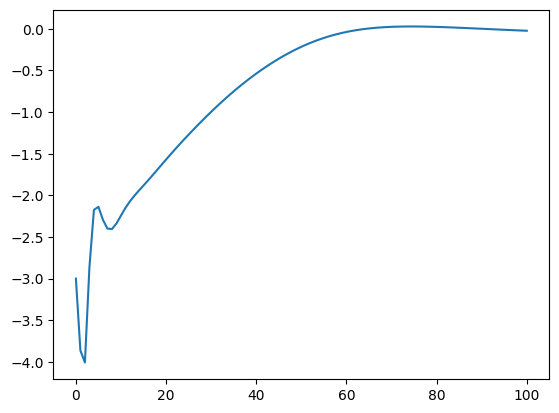

In [7]:
plt.plot(r_6)

In [8]:
class acEnv(gym.Env):
    """Custom Environment that follows gym interface."""

    metadata = {"render.modes": ["human"]}

    def __init__(self, render_mode: Optional[str] = None, g=10.0):
        super(acEnv).__init__()
        # Define action and observation space
        # They must be gym.spaces objects
        # Example when using discrete actions:
        ob_high = np.ones(6)
        action_high = np.ones(3)*3
        self.action_space = spaces.Box(low=-action_high, high=action_high, dtype=np.float32)
        self.observation_space = spaces.Box(low=-ob_high, high=ob_high, dtype=np.float32)
        self.step_const = 20
        self.freq = 0.1
        self.steps = 0
        self.center = [0,0,0,0,0,0]
        self.reward_cache = [] # cache distances to target norm ball center
        self.final_reward_cache = [] # cache final reward
        self.state = np.random.rand(6)*2-1
        self.horizon = np.arange(0, self.step_const+2, 1)*0.1
        self.target_norm_radius = 0.8
        self.max_reward_list = []
        self.quality_list = []
        self.total_steps = 0
        self.step_history = []
        self.k = 20
    def step(self, action):
        terminated = False
        ts = [self.horizon[self.steps], self.horizon[self.steps+1] ]
        self.state = odeint(ac, self.state, ts, args=(action,))[-1]
        dist = np.linalg.norm(self.state - self.center)
        reward = self.target_norm_radius - dist
        self.reward_cache.append(reward)
        self.steps += 1
        self.total_steps +=1 
        # quantitative semantics
        # reach reward, encourage reaching target
        if self.steps < 10:
            reach_reward = max(self.reward_cache)
        else:
            reach_reward = max(self.reward_cache[-10:])
        final_reward = reach_reward

        if dist <= self.target_norm_radius:
            final_reward = 10
        self.final_reward_cache.append(final_reward)
        if self.steps == self.step_const or max(np.absolute(self.state))>5:
            self.max_reward_list.append(max(self.final_reward_cache)) # use max final reward to measure episodes
            self.step_history.append(self.total_steps)
            self.quality_list.append(sum(self.final_reward_cache))
            terminated = True
            self.reset()

        # Return next state, reward, done, info
        return self.state, final_reward, terminated, {}

    def reset(self):
        self.steps = 0
        self.state = np.random.rand(6)*2-1
        self.reward_cache = []
#         self.step_const = random.randint(10, const)
        self.step_const = self.k
        self.horizon = np.arange(0, self.step_const+2, 1)*0.1
        self.final_reward_cache = []
        return self.state  # reward, done, info can't be included

    def render(self, mode="human"):
        return

    def close(self):
        if self.screen is not None:
            import pygame
            pygame.display.quit()
            pygame.quit()
            self.isopen = False

In [18]:
# Training
reached = []
for k in [10,20,40,80,160]:
    env = acEnv()
    env.k = k
    # learning_rate = 1e-3, n_steps = 1024, tune these
    model = SAC("MlpPolicy", env, verbose=1)
    model.learn(total_timesteps=300000, progress_bar=False)
    # model.save('ac_reach_sac_const30')
    vec_env = model.get_env()
    obs = vec_env.reset()
    size = 30
    env.k = 160
    state = env.reset()
    dims0 = []
    dims1 = []
    dims2 = []
    dims3 = []
    dims4 = []
    dims5 = []
    euclids = []
    center = [0,0,0,0,0,0]
    num_reached = 0
    for j in range(1000):
        dim0 = []
        dim1 = []
        dim2 = []
        dim3 = []
        dim4 = []
        dim5 = []
        euclid = []
        state = env.reset(size)
        # Print initial state
        for i in range(30):
            action, _states = model.predict(state, deterministic=True)
            new_state, reward, done, _ = env.step(action)
            dim0.append(state[0])
            dim1.append(state[1])
            dim2.append(state[2])
            dim3.append(state[3])
            dim4.append(state[4])
            dim5.append(state[5])
            dist = np.linalg.norm(new_state-center)
            euclid.append(dist)
            state = new_state
            if dist <= 0.8: # stop
                num_reached += 1
                break
        dims0.append(dim0)
        dims1.append(dim1)
        dims2.append(dim2)
        dims3.append(dim3)
        dims4.append(dim4)
        dims5.append(dim5)
        euclids.append(euclid)
    reached.append(num_reached)
print(reached)

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | -5.52    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 1137     |
|    time_elapsed    | 0        |
|    total_timesteps | 38       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | -5.16    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 1175     |
|    time_elapsed    | 0        |
|    total_timesteps | 78       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | -5.08    |
| time/              |          |
|    episodes        | 12       |
|    fps             |

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | -2.16    |
| time/              |          |
|    episodes        | 64       |
|    fps             | 86       |
|    time_elapsed    | 7        |
|    total_timesteps | 617      |
| train/             |          |
|    actor_loss      | -5.11    |
|    critic_loss     | 1.62     |
|    ent_coef        | 0.857    |
|    ent_coef_loss   | -0.761   |
|    learning_rate   | 0.0003   |
|    n_updates       | 516      |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.54     |
|    ep_rew_mean     | -2.38    |
| time/              |          |
|    episodes        | 68       |
|    fps             | 85       |
|    time_elapsed    | 7        |
|    total_timesteps | 649      |
| train/             |          |
|    actor_loss      | -5.21    |
|    critic_loss     | 3.41     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 0.807    |
| time/              |          |
|    episodes        | 124      |
|    fps             | 77       |
|    time_elapsed    | 15       |
|    total_timesteps | 1198     |
| train/             |          |
|    actor_loss      | -7.16    |
|    critic_loss     | 2.98     |
|    ent_coef        | 0.723    |
|    ent_coef_loss   | -1.47    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1097     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 0.815    |
| time/              |          |
|    episodes        | 128      |
|    fps             | 76       |
|    time_elapsed    | 16       |
|    total_timesteps | 1238     |
| train/             |          |
|    actor_loss      | -7.71    |
|    critic_loss     | 5.76     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 3.87     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 74       |
|    time_elapsed    | 24       |
|    total_timesteps | 1789     |
| train/             |          |
|    actor_loss      | -8.47    |
|    critic_loss     | 5.34     |
|    ent_coef        | 0.613    |
|    ent_coef_loss   | -1.98    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1688     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 4.55     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 74       |
|    time_elapsed    | 24       |
|    total_timesteps | 1826     |
| train/             |          |
|    actor_loss      | -9.63    |
|    critic_loss     | 8.71     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 8.48     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 73       |
|    time_elapsed    | 32       |
|    total_timesteps | 2380     |
| train/             |          |
|    actor_loss      | -9.73    |
|    critic_loss     | 16.5     |
|    ent_coef        | 0.525    |
|    ent_coef_loss   | -2.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2279     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 9.1      |
| time/              |          |
|    episodes        | 248      |
|    fps             | 73       |
|    time_elapsed    | 33       |
|    total_timesteps | 2417     |
| train/             |          |
|    actor_loss      | -9.63    |
|    critic_loss     | 9.58     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 7.56     |
| time/              |          |
|    episodes        | 304      |
|    fps             | 72       |
|    time_elapsed    | 40       |
|    total_timesteps | 2973     |
| train/             |          |
|    actor_loss      | -12.4    |
|    critic_loss     | 13.1     |
|    ent_coef        | 0.45     |
|    ent_coef_loss   | -2.41    |
|    learning_rate   | 0.0003   |
|    n_updates       | 2872     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 6.36     |
| time/              |          |
|    episodes        | 308      |
|    fps             | 72       |
|    time_elapsed    | 41       |
|    total_timesteps | 3011     |
| train/             |          |
|    actor_loss      | -11.8    |
|    critic_loss     | 32.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 8.38     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 72       |
|    time_elapsed    | 49       |
|    total_timesteps | 3561     |
| train/             |          |
|    actor_loss      | -14      |
|    critic_loss     | 29.9     |
|    ent_coef        | 0.39     |
|    ent_coef_loss   | -2.45    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3460     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 8.7      |
| time/              |          |
|    episodes        | 368      |
|    fps             | 72       |
|    time_elapsed    | 49       |
|    total_timesteps | 3601     |
| train/             |          |
|    actor_loss      | -12.6    |
|    critic_loss     | 25.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 72       |
|    time_elapsed    | 57       |
|    total_timesteps | 4155     |
| train/             |          |
|    actor_loss      | -16      |
|    critic_loss     | 44.1     |
|    ent_coef        | 0.341    |
|    ent_coef_loss   | -2.36    |
|    learning_rate   | 0.0003   |
|    n_updates       | 4054     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 9.92     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 72       |
|    time_elapsed    | 58       |
|    total_timesteps | 4195     |
| train/             |          |
|    actor_loss      | -14.4    |
|    critic_loss     | 45.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 9.33     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 71       |
|    time_elapsed    | 66       |
|    total_timesteps | 4748     |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 63.7     |
|    ent_coef        | 0.299    |
|    ent_coef_loss   | -2.4     |
|    learning_rate   | 0.0003   |
|    n_updates       | 4647     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 71       |
|    time_elapsed    | 66       |
|    total_timesteps | 4785     |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 65.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 71       |
|    time_elapsed    | 74       |
|    total_timesteps | 5335     |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 71.4     |
|    ent_coef        | 0.265    |
|    ent_coef_loss   | -2.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5234     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 71       |
|    time_elapsed    | 75       |
|    total_timesteps | 5375     |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 83.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 10.6     |
| time/              |          |
|    episodes        | 604      |
|    fps             | 71       |
|    time_elapsed    | 83       |
|    total_timesteps | 5931     |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 67.2     |
|    ent_coef        | 0.235    |
|    ent_coef_loss   | -1.89    |
|    learning_rate   | 0.0003   |
|    n_updates       | 5830     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 71       |
|    time_elapsed    | 83       |
|    total_timesteps | 5971     |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 81.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 71       |
|    time_elapsed    | 91       |
|    total_timesteps | 6512     |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 60.7     |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | -2.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6411     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 668      |
|    fps             | 71       |
|    time_elapsed    | 92       |
|    total_timesteps | 6552     |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 69       |
|    time_elapsed    | 101      |
|    total_timesteps | 7098     |
| train/             |          |
|    actor_loss      | -23.5    |
|    critic_loss     | 98.3     |
|    ent_coef        | 0.189    |
|    ent_coef_loss   | -0.543   |
|    learning_rate   | 0.0003   |
|    n_updates       | 6997     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 728      |
|    fps             | 69       |
|    time_elapsed    | 102      |
|    total_timesteps | 7138     |
| train/             |          |
|    actor_loss      | -22.3    |
|    critic_loss     | 74.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 784      |
|    fps             | 68       |
|    time_elapsed    | 111      |
|    total_timesteps | 7688     |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 64.3     |
|    ent_coef        | 0.175    |
|    ent_coef_loss   | -1.12    |
|    learning_rate   | 0.0003   |
|    n_updates       | 7587     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 788      |
|    fps             | 68       |
|    time_elapsed    | 112      |
|    total_timesteps | 7728     |
| train/             |          |
|    actor_loss      | -24.6    |
|    critic_loss     | 75.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 844      |
|    fps             | 67       |
|    time_elapsed    | 121      |
|    total_timesteps | 8272     |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 71.8     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.487   |
|    learning_rate   | 0.0003   |
|    n_updates       | 8171     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 848      |
|    fps             | 67       |
|    time_elapsed    | 122      |
|    total_timesteps | 8312     |
| train/             |          |
|    actor_loss      | -27.5    |
|    critic_loss     | 71.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 904      |
|    fps             | 67       |
|    time_elapsed    | 131      |
|    total_timesteps | 8863     |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 108      |
|    ent_coef        | 0.157    |
|    ent_coef_loss   | -0.355   |
|    learning_rate   | 0.0003   |
|    n_updates       | 8762     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 13       |
| time/              |          |
|    episodes        | 908      |
|    fps             | 67       |
|    time_elapsed    | 132      |
|    total_timesteps | 8899     |
| train/             |          |
|    actor_loss      | -27.9    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 66       |
|    time_elapsed    | 141      |
|    total_timesteps | 9444     |
| train/             |          |
|    actor_loss      | -25.8    |
|    critic_loss     | 177      |
|    ent_coef        | 0.153    |
|    ent_coef_loss   | 0.0735   |
|    learning_rate   | 0.0003   |
|    n_updates       | 9343     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 968      |
|    fps             | 66       |
|    time_elapsed    | 142      |
|    total_timesteps | 9484     |
| train/             |          |
|    actor_loss      | -25.1    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 65       |
|    time_elapsed    | 152      |
|    total_timesteps | 10043    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 116      |
|    ent_coef        | 0.156    |
|    ent_coef_loss   | -0.215   |
|    learning_rate   | 0.0003   |
|    n_updates       | 9942     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 65       |
|    time_elapsed    | 153      |
|    total_timesteps | 10083    |
| train/             |          |
|    actor_loss      | -26.1    |
|    critic_loss     | 136      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 65       |
|    time_elapsed    | 162      |
|    total_timesteps | 10635    |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 155      |
|    ent_coef        | 0.16     |
|    ent_coef_loss   | -0.596   |
|    learning_rate   | 0.0003   |
|    n_updates       | 10534    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 65       |
|    time_elapsed    | 163      |
|    total_timesteps | 10675    |
| train/             |          |
|    actor_loss      | -23.5    |
|    critic_loss     | 163      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 64       |
|    time_elapsed    | 173      |
|    total_timesteps | 11225    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 117      |
|    ent_coef        | 0.166    |
|    ent_coef_loss   | 0.0752   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11124    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 64       |
|    time_elapsed    | 173      |
|    total_timesteps | 11265    |
| train/             |          |
|    actor_loss      | -27.8    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 64       |
|    time_elapsed    | 183      |
|    total_timesteps | 11823    |
| train/             |          |
|    actor_loss      | -28.2    |
|    critic_loss     | 152      |
|    ent_coef        | 0.164    |
|    ent_coef_loss   | -0.0342  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11722    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 64       |
|    time_elapsed    | 183      |
|    total_timesteps | 11863    |
| train/             |          |
|    actor_loss      | -28      |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 64       |
|    time_elapsed    | 193      |
|    total_timesteps | 12411    |
| train/             |          |
|    actor_loss      | -29.7    |
|    critic_loss     | 146      |
|    ent_coef        | 0.164    |
|    ent_coef_loss   | 0.0822   |
|    learning_rate   | 0.0003   |
|    n_updates       | 12310    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 64       |
|    time_elapsed    | 193      |
|    total_timesteps | 12451    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 63       |
|    time_elapsed    | 203      |
|    total_timesteps | 13009    |
| train/             |          |
|    actor_loss      | -28.6    |
|    critic_loss     | 145      |
|    ent_coef        | 0.164    |
|    ent_coef_loss   | 0.0476   |
|    learning_rate   | 0.0003   |
|    n_updates       | 12908    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 63       |
|    time_elapsed    | 203      |
|    total_timesteps | 13049    |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 160      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 63       |
|    time_elapsed    | 213      |
|    total_timesteps | 13605    |
| train/             |          |
|    actor_loss      | -26.9    |
|    critic_loss     | 113      |
|    ent_coef        | 0.166    |
|    ent_coef_loss   | 0.283    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13504    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 63       |
|    time_elapsed    | 213      |
|    total_timesteps | 13645    |
| train/             |          |
|    actor_loss      | -27.2    |
|    critic_loss     | 117      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.99     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 63       |
|    time_elapsed    | 223      |
|    total_timesteps | 14205    |
| train/             |          |
|    actor_loss      | -25.6    |
|    critic_loss     | 116      |
|    ent_coef        | 0.165    |
|    ent_coef_loss   | 0.18     |
|    learning_rate   | 0.0003   |
|    n_updates       | 14104    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.99     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 63       |
|    time_elapsed    | 223      |
|    total_timesteps | 14245    |
| train/             |          |
|    actor_loss      | -29      |
|    critic_loss     | 93.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 63       |
|    time_elapsed    | 232      |
|    total_timesteps | 14782    |
| train/             |          |
|    actor_loss      | -32.8    |
|    critic_loss     | 172      |
|    ent_coef        | 0.169    |
|    ent_coef_loss   | 0.0619   |
|    learning_rate   | 0.0003   |
|    n_updates       | 14681    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 63       |
|    time_elapsed    | 233      |
|    total_timesteps | 14819    |
| train/             |          |
|    actor_loss      | -26.9    |
|    critic_loss     | 135      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 63       |
|    time_elapsed    | 242      |
|    total_timesteps | 15379    |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 79.8     |
|    ent_coef        | 0.167    |
|    ent_coef_loss   | -0.173   |
|    learning_rate   | 0.0003   |
|    n_updates       | 15278    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 63       |
|    time_elapsed    | 243      |
|    total_timesteps | 15419    |
| train/             |          |
|    actor_loss      | -26.1    |
|    critic_loss     | 143      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 63       |
|    time_elapsed    | 252      |
|    total_timesteps | 15974    |
| train/             |          |
|    actor_loss      | -27      |
|    critic_loss     | 111      |
|    ent_coef        | 0.164    |
|    ent_coef_loss   | 0.35     |
|    learning_rate   | 0.0003   |
|    n_updates       | 15873    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 63       |
|    time_elapsed    | 253      |
|    total_timesteps | 16014    |
| train/             |          |
|    actor_loss      | -28.4    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 63       |
|    time_elapsed    | 262      |
|    total_timesteps | 16567    |
| train/             |          |
|    actor_loss      | -24.9    |
|    critic_loss     | 126      |
|    ent_coef        | 0.165    |
|    ent_coef_loss   | -0.216   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16466    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 63       |
|    time_elapsed    | 263      |
|    total_timesteps | 16607    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 63       |
|    time_elapsed    | 272      |
|    total_timesteps | 17156    |
| train/             |          |
|    actor_loss      | -25.3    |
|    critic_loss     | 137      |
|    ent_coef        | 0.162    |
|    ent_coef_loss   | -0.0339  |
|    learning_rate   | 0.0003   |
|    n_updates       | 17055    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 63       |
|    time_elapsed    | 272      |
|    total_timesteps | 17196    |
| train/             |          |
|    actor_loss      | -27.1    |
|    critic_loss     | 133      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 62       |
|    time_elapsed    | 282      |
|    total_timesteps | 17750    |
| train/             |          |
|    actor_loss      | -25.7    |
|    critic_loss     | 117      |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.512    |
|    learning_rate   | 0.0003   |
|    n_updates       | 17649    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 11.4     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 62       |
|    time_elapsed    | 282      |
|    total_timesteps | 17790    |
| train/             |          |
|    actor_loss      | -26.3    |
|    critic_loss     | 126      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 62       |
|    time_elapsed    | 292      |
|    total_timesteps | 18344    |
| train/             |          |
|    actor_loss      | -23.6    |
|    critic_loss     | 82.9     |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.499    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18243    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 62       |
|    time_elapsed    | 292      |
|    total_timesteps | 18379    |
| train/             |          |
|    actor_loss      | -25.9    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 10.1     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 62       |
|    time_elapsed    | 303      |
|    total_timesteps | 18932    |
| train/             |          |
|    actor_loss      | -24.5    |
|    critic_loss     | 103      |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.157    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18831    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 62       |
|    time_elapsed    | 304      |
|    total_timesteps | 18972    |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 95.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 61       |
|    time_elapsed    | 316      |
|    total_timesteps | 19526    |
| train/             |          |
|    actor_loss      | -24.7    |
|    critic_loss     | 132      |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.0874  |
|    learning_rate   | 0.0003   |
|    n_updates       | 19425    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 61       |
|    time_elapsed    | 317      |
|    total_timesteps | 19566    |
| train/             |          |
|    actor_loss      | -23.1    |
|    critic_loss     | 105      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 61       |
|    time_elapsed    | 328      |
|    total_timesteps | 20110    |
| train/             |          |
|    actor_loss      | -25.5    |
|    critic_loss     | 105      |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20009    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 61       |
|    time_elapsed    | 328      |
|    total_timesteps | 20150    |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 132      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 60       |
|    time_elapsed    | 340      |
|    total_timesteps | 20708    |
| train/             |          |
|    actor_loss      | -24.8    |
|    critic_loss     | 125      |
|    ent_coef        | 0.161    |
|    ent_coef_loss   | 0.425    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20607    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 2108     |
|    fps             | 60       |
|    time_elapsed    | 341      |
|    total_timesteps | 20748    |
| train/             |          |
|    actor_loss      | -28.3    |
|    critic_loss     | 123      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 60       |
|    time_elapsed    | 352      |
|    total_timesteps | 21303    |
| train/             |          |
|    actor_loss      | -24.8    |
|    critic_loss     | 113      |
|    ent_coef        | 0.163    |
|    ent_coef_loss   | -0.116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21202    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 60       |
|    time_elapsed    | 353      |
|    total_timesteps | 21343    |
| train/             |          |
|    actor_loss      | -25.4    |
|    critic_loss     | 121      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 11.4     |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 60       |
|    time_elapsed    | 364      |
|    total_timesteps | 21899    |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 115      |
|    ent_coef        | 0.155    |
|    ent_coef_loss   | -0.263   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21798    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 60       |
|    time_elapsed    | 365      |
|    total_timesteps | 21939    |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 79.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 59       |
|    time_elapsed    | 376      |
|    total_timesteps | 22486    |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 77.8     |
|    ent_coef        | 0.152    |
|    ent_coef_loss   | -0.494   |
|    learning_rate   | 0.0003   |
|    n_updates       | 22385    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 11.6     |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 59       |
|    time_elapsed    | 377      |
|    total_timesteps | 22526    |
| train/             |          |
|    actor_loss      | -23      |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 9.12     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 59       |
|    time_elapsed    | 388      |
|    total_timesteps | 23075    |
| train/             |          |
|    actor_loss      | -24      |
|    critic_loss     | 124      |
|    ent_coef        | 0.15     |
|    ent_coef_loss   | 0.176    |
|    learning_rate   | 0.0003   |
|    n_updates       | 22974    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 10.7     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 59       |
|    time_elapsed    | 388      |
|    total_timesteps | 23115    |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 122      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 59       |
|    time_elapsed    | 400      |
|    total_timesteps | 23668    |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 96.6     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | -0.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23567    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 59       |
|    time_elapsed    | 401      |
|    total_timesteps | 23708    |
| train/             |          |
|    actor_loss      | -22.6    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 58       |
|    time_elapsed    | 411      |
|    total_timesteps | 24254    |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 79.5     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | -0.0917  |
|    learning_rate   | 0.0003   |
|    n_updates       | 24153    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 58       |
|    time_elapsed    | 412      |
|    total_timesteps | 24292    |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 88.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 58       |
|    time_elapsed    | 423      |
|    total_timesteps | 24834    |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 63       |
|    ent_coef        | 0.14     |
|    ent_coef_loss   | 0.0697   |
|    learning_rate   | 0.0003   |
|    n_updates       | 24733    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 58       |
|    time_elapsed    | 424      |
|    total_timesteps | 24874    |
| train/             |          |
|    actor_loss      | -23.9    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 58       |
|    time_elapsed    | 435      |
|    total_timesteps | 25430    |
| train/             |          |
|    actor_loss      | -23.1    |
|    critic_loss     | 106      |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | -0.25    |
|    learning_rate   | 0.0003   |
|    n_updates       | 25329    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 58       |
|    time_elapsed    | 436      |
|    total_timesteps | 25470    |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 91       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 58       |
|    time_elapsed    | 447      |
|    total_timesteps | 26012    |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 94.7     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | 0.347    |
|    learning_rate   | 0.0003   |
|    n_updates       | 25911    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 58       |
|    time_elapsed    | 448      |
|    total_timesteps | 26052    |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 113      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 7.08     |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 57       |
|    time_elapsed    | 459      |
|    total_timesteps | 26604    |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 88       |
|    ent_coef        | 0.137    |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 26503    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 6.98     |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 57       |
|    time_elapsed    | 460      |
|    total_timesteps | 26644    |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 97.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 8.15     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 57       |
|    time_elapsed    | 471      |
|    total_timesteps | 27194    |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 49.9     |
|    ent_coef        | 0.133    |
|    ent_coef_loss   | 0.132    |
|    learning_rate   | 0.0003   |
|    n_updates       | 27093    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 57       |
|    time_elapsed    | 472      |
|    total_timesteps | 27234    |
| train/             |          |
|    actor_loss      | -22.4    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 57       |
|    time_elapsed    | 483      |
|    total_timesteps | 27772    |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 83.1     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.0129   |
|    learning_rate   | 0.0003   |
|    n_updates       | 27671    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 57       |
|    time_elapsed    | 484      |
|    total_timesteps | 27812    |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 70.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 57       |
|    time_elapsed    | 495      |
|    total_timesteps | 28362    |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 114      |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | 0.659    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28261    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 57       |
|    time_elapsed    | 496      |
|    total_timesteps | 28402    |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 92       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 57       |
|    time_elapsed    | 507      |
|    total_timesteps | 28937    |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 54.8     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | 0.59     |
|    learning_rate   | 0.0003   |
|    n_updates       | 28836    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 57       |
|    time_elapsed    | 508      |
|    total_timesteps | 28977    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 80.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 56       |
|    time_elapsed    | 519      |
|    total_timesteps | 29528    |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 54.9     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.37     |
|    learning_rate   | 0.0003   |
|    n_updates       | 29427    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 56       |
|    time_elapsed    | 519      |
|    total_timesteps | 29568    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 88.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 56       |
|    time_elapsed    | 530      |
|    total_timesteps | 30117    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 65.4     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | 0.572    |
|    learning_rate   | 0.0003   |
|    n_updates       | 30016    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 56       |
|    time_elapsed    | 531      |
|    total_timesteps | 30157    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 84.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 12.7     |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 56       |
|    time_elapsed    | 542      |
|    total_timesteps | 30711    |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 113      |
|    ent_coef        | 0.133    |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 30610    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 56       |
|    time_elapsed    | 543      |
|    total_timesteps | 30751    |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 75.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 56       |
|    time_elapsed    | 554      |
|    total_timesteps | 31294    |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 82.5     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | -0.00914 |
|    learning_rate   | 0.0003   |
|    n_updates       | 31193    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 56       |
|    time_elapsed    | 554      |
|    total_timesteps | 31334    |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 74.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 56       |
|    time_elapsed    | 566      |
|    total_timesteps | 31886    |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 46.3     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.542    |
|    learning_rate   | 0.0003   |
|    n_updates       | 31785    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 56       |
|    time_elapsed    | 566      |
|    total_timesteps | 31926    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 75.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 56       |
|    time_elapsed    | 577      |
|    total_timesteps | 32448    |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 80.1     |
|    ent_coef        | 0.129    |
|    ent_coef_loss   | 0.385    |
|    learning_rate   | 0.0003   |
|    n_updates       | 32347    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 56       |
|    time_elapsed    | 577      |
|    total_timesteps | 32484    |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 87.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 55       |
|    time_elapsed    | 589      |
|    total_timesteps | 33027    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 88.6     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.51    |
|    learning_rate   | 0.0003   |
|    n_updates       | 32926    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 55       |
|    time_elapsed    | 591      |
|    total_timesteps | 33067    |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 58.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 55       |
|    time_elapsed    | 603      |
|    total_timesteps | 33619    |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 85.6     |
|    ent_coef        | 0.129    |
|    ent_coef_loss   | 0.664    |
|    learning_rate   | 0.0003   |
|    n_updates       | 33518    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 55       |
|    time_elapsed    | 604      |
|    total_timesteps | 33659    |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 82.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 55       |
|    time_elapsed    | 616      |
|    total_timesteps | 34200    |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 90.1     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | -0.219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 34099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 55       |
|    time_elapsed    | 616      |
|    total_timesteps | 34238    |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 93.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 9.55     |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 55       |
|    time_elapsed    | 628      |
|    total_timesteps | 34785    |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 61.1     |
|    ent_coef        | 0.129    |
|    ent_coef_loss   | 0.27     |
|    learning_rate   | 0.0003   |
|    n_updates       | 34684    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 9.52     |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 55       |
|    time_elapsed    | 628      |
|    total_timesteps | 34825    |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 28.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 8.17     |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 55       |
|    time_elapsed    | 639      |
|    total_timesteps | 35372    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 85.2     |
|    ent_coef        | 0.131    |
|    ent_coef_loss   | 0.243    |
|    learning_rate   | 0.0003   |
|    n_updates       | 35271    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 9.94     |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 55       |
|    time_elapsed    | 640      |
|    total_timesteps | 35412    |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 57.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 55       |
|    time_elapsed    | 651      |
|    total_timesteps | 35965    |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 60.3     |
|    ent_coef        | 0.133    |
|    ent_coef_loss   | 0.0386   |
|    learning_rate   | 0.0003   |
|    n_updates       | 35864    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 55       |
|    time_elapsed    | 652      |
|    total_timesteps | 36005    |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 70.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 55       |
|    time_elapsed    | 663      |
|    total_timesteps | 36557    |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 98.7     |
|    ent_coef        | 0.136    |
|    ent_coef_loss   | -0.292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 36456    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 55       |
|    time_elapsed    | 664      |
|    total_timesteps | 36597    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 79.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 54       |
|    time_elapsed    | 675      |
|    total_timesteps | 37146    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 83.1     |
|    ent_coef        | 0.134    |
|    ent_coef_loss   | 0.181    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37045    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 54       |
|    time_elapsed    | 676      |
|    total_timesteps | 37186    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 54       |
|    time_elapsed    | 687      |
|    total_timesteps | 37744    |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 80.3     |
|    ent_coef        | 0.134    |
|    ent_coef_loss   | 0.386    |
|    learning_rate   | 0.0003   |
|    n_updates       | 37643    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 54       |
|    time_elapsed    | 688      |
|    total_timesteps | 37784    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 78.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 54       |
|    time_elapsed    | 699      |
|    total_timesteps | 38320    |
| train/             |          |
|    actor_loss      | -22.2    |
|    critic_loss     | 83.7     |
|    ent_coef        | 0.135    |
|    ent_coef_loss   | 0.22     |
|    learning_rate   | 0.0003   |
|    n_updates       | 38219    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 54       |
|    time_elapsed    | 699      |
|    total_timesteps | 38360    |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 98.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 54       |
|    time_elapsed    | 711      |
|    total_timesteps | 38920    |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 82.1     |
|    ent_coef        | 0.136    |
|    ent_coef_loss   | 0.312    |
|    learning_rate   | 0.0003   |
|    n_updates       | 38819    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 10.8     |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 54       |
|    time_elapsed    | 712      |
|    total_timesteps | 38960    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 74.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 9.43     |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 54       |
|    time_elapsed    | 723      |
|    total_timesteps | 39505    |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 76.8     |
|    ent_coef        | 0.136    |
|    ent_coef_loss   | 0.0193   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39404    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 9.22     |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 54       |
|    time_elapsed    | 724      |
|    total_timesteps | 39545    |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 39.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 54       |
|    time_elapsed    | 735      |
|    total_timesteps | 40099    |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 53.4     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | -0.275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39998    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 54       |
|    time_elapsed    | 736      |
|    total_timesteps | 40139    |
| train/             |          |
|    actor_loss      | -23.2    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 54       |
|    time_elapsed    | 748      |
|    total_timesteps | 40697    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 90.8     |
|    ent_coef        | 0.137    |
|    ent_coef_loss   | -0.821   |
|    learning_rate   | 0.0003   |
|    n_updates       | 40596    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 54       |
|    time_elapsed    | 748      |
|    total_timesteps | 40737    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 70.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 54       |
|    time_elapsed    | 764      |
|    total_timesteps | 41291    |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 75.3     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 41190    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 53       |
|    time_elapsed    | 765      |
|    total_timesteps | 41328    |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 66.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 53       |
|    time_elapsed    | 778      |
|    total_timesteps | 41864    |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 106      |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | -0.0866  |
|    learning_rate   | 0.0003   |
|    n_updates       | 41763    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 53       |
|    time_elapsed    | 779      |
|    total_timesteps | 41900    |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 70.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 53       |
|    time_elapsed    | 792      |
|    total_timesteps | 42456    |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 68.4     |
|    ent_coef        | 0.135    |
|    ent_coef_loss   | 0.067    |
|    learning_rate   | 0.0003   |
|    n_updates       | 42355    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 53       |
|    time_elapsed    | 793      |
|    total_timesteps | 42496    |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 66.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 53       |
|    time_elapsed    | 806      |
|    total_timesteps | 43042    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 66.9     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | 0.154    |
|    learning_rate   | 0.0003   |
|    n_updates       | 42941    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 53       |
|    time_elapsed    | 807      |
|    total_timesteps | 43082    |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 84.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 53       |
|    time_elapsed    | 821      |
|    total_timesteps | 43642    |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 63.9     |
|    ent_coef        | 0.139    |
|    ent_coef_loss   | -0.136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 43541    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 10       |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 53       |
|    time_elapsed    | 822      |
|    total_timesteps | 43682    |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 55.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 52       |
|    time_elapsed    | 836      |
|    total_timesteps | 44235    |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 66.5     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | -0.179   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44134    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 52       |
|    time_elapsed    | 838      |
|    total_timesteps | 44275    |
| train/             |          |
|    actor_loss      | -22.2    |
|    critic_loss     | 93.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 52       |
|    time_elapsed    | 854      |
|    total_timesteps | 44823    |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 83.7     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | 1.21     |
|    learning_rate   | 0.0003   |
|    n_updates       | 44722    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 52       |
|    time_elapsed    | 855      |
|    total_timesteps | 44863    |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 49.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 52       |
|    time_elapsed    | 867      |
|    total_timesteps | 45412    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 72.4     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | 0.299    |
|    learning_rate   | 0.0003   |
|    n_updates       | 45311    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 52       |
|    time_elapsed    | 868      |
|    total_timesteps | 45451    |
| train/             |          |
|    actor_loss      | -22.2    |
|    critic_loss     | 96.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 52       |
|    time_elapsed    | 882      |
|    total_timesteps | 46003    |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 80.6     |
|    ent_coef        | 0.146    |
|    ent_coef_loss   | -0.0844  |
|    learning_rate   | 0.0003   |
|    n_updates       | 45902    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 52       |
|    time_elapsed    | 883      |
|    total_timesteps | 46043    |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 85       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 51       |
|    time_elapsed    | 899      |
|    total_timesteps | 46593    |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 65.5     |
|    ent_coef        | 0.148    |
|    ent_coef_loss   | 0.231    |
|    learning_rate   | 0.0003   |
|    n_updates       | 46492    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 51       |
|    time_elapsed    | 900      |
|    total_timesteps | 46633    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 68.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 51       |
|    time_elapsed    | 919      |
|    total_timesteps | 47181    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 101      |
|    ent_coef        | 0.147    |
|    ent_coef_loss   | 0.0945   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47080    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 51       |
|    time_elapsed    | 920      |
|    total_timesteps | 47221    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 51       |
|    time_elapsed    | 935      |
|    total_timesteps | 47773    |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 107      |
|    ent_coef        | 0.146    |
|    ent_coef_loss   | -0.711   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47672    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 51       |
|    time_elapsed    | 936      |
|    total_timesteps | 47810    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 68.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 50       |
|    time_elapsed    | 949      |
|    total_timesteps | 48360    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 129      |
|    ent_coef        | 0.146    |
|    ent_coef_loss   | -0.0683  |
|    learning_rate   | 0.0003   |
|    n_updates       | 48259    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 50       |
|    time_elapsed    | 950      |
|    total_timesteps | 48400    |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 75.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 50       |
|    time_elapsed    | 963      |
|    total_timesteps | 48950    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 99.3     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | 0.276    |
|    learning_rate   | 0.0003   |
|    n_updates       | 48849    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 50       |
|    time_elapsed    | 964      |
|    total_timesteps | 48990    |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 78.2     |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 9.86      |
|    ep_rew_mean     | 16.9      |
| time/              |           |
|    episodes        | 5044      |
|    fps             | 50        |
|    time_elapsed    | 978       |
|    total_timesteps | 49538     |
| train/             |           |
|    actor_loss      | -19.9     |
|    critic_loss     | 72.4      |
|    ent_coef        | 0.143     |
|    ent_coef_loss   | -0.000763 |
|    learning_rate   | 0.0003    |
|    n_updates       | 49437     |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 50       |
|    time_elapsed    | 979      |
|    total_timesteps | 49578    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 82.6    

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 50       |
|    time_elapsed    | 992      |
|    total_timesteps | 50129    |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 76.7     |
|    ent_coef        | 0.145    |
|    ent_coef_loss   | 0.327    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50028    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 50       |
|    time_elapsed    | 993      |
|    total_timesteps | 50169    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 80.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 50       |
|    time_elapsed    | 1010     |
|    total_timesteps | 50716    |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 57.6     |
|    ent_coef        | 0.142    |
|    ent_coef_loss   | 0.401    |
|    learning_rate   | 0.0003   |
|    n_updates       | 50615    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 50       |
|    time_elapsed    | 1012     |
|    total_timesteps | 50756    |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 61.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 13.4     |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 50       |
|    time_elapsed    | 1024     |
|    total_timesteps | 51310    |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 89.2     |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | 0.0412   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51209    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 50       |
|    time_elapsed    | 1025     |
|    total_timesteps | 51350    |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 81.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 49       |
|    time_elapsed    | 1038     |
|    total_timesteps | 51898    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 47.2     |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | -0.536   |
|    learning_rate   | 0.0003   |
|    n_updates       | 51797    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 49       |
|    time_elapsed    | 1040     |
|    total_timesteps | 51938    |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 65.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 49       |
|    time_elapsed    | 1062     |
|    total_timesteps | 52478    |
| train/             |          |
|    actor_loss      | -22.6    |
|    critic_loss     | 97.2     |
|    ent_coef        | 0.137    |
|    ent_coef_loss   | 0.612    |
|    learning_rate   | 0.0003   |
|    n_updates       | 52377    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 49       |
|    time_elapsed    | 1064     |
|    total_timesteps | 52518    |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 81.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 49       |
|    time_elapsed    | 1079     |
|    total_timesteps | 53068    |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 78.9     |
|    ent_coef        | 0.141    |
|    ent_coef_loss   | -0.149   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52967    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 49       |
|    time_elapsed    | 1081     |
|    total_timesteps | 53108    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 68.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 12.2     |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 48       |
|    time_elapsed    | 1100     |
|    total_timesteps | 53666    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 46.4     |
|    ent_coef        | 0.135    |
|    ent_coef_loss   | 0.574    |
|    learning_rate   | 0.0003   |
|    n_updates       | 53565    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 12.7     |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 48       |
|    time_elapsed    | 1101     |
|    total_timesteps | 53706    |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 59.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 48       |
|    time_elapsed    | 1115     |
|    total_timesteps | 54261    |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 59.6     |
|    ent_coef        | 0.135    |
|    ent_coef_loss   | 0.566    |
|    learning_rate   | 0.0003   |
|    n_updates       | 54160    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 48       |
|    time_elapsed    | 1116     |
|    total_timesteps | 54291    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 65.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 48       |
|    time_elapsed    | 1137     |
|    total_timesteps | 54839    |
| train/             |          |
|    actor_loss      | -15.2    |
|    critic_loss     | 67.1     |
|    ent_coef        | 0.135    |
|    ent_coef_loss   | -0.598   |
|    learning_rate   | 0.0003   |
|    n_updates       | 54738    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 48       |
|    time_elapsed    | 1138     |
|    total_timesteps | 54879    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 91.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 48       |
|    time_elapsed    | 1151     |
|    total_timesteps | 55436    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 61.5     |
|    ent_coef        | 0.138    |
|    ent_coef_loss   | 0.256    |
|    learning_rate   | 0.0003   |
|    n_updates       | 55335    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 48       |
|    time_elapsed    | 1152     |
|    total_timesteps | 55476    |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 48.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 48       |
|    time_elapsed    | 1165     |
|    total_timesteps | 56017    |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 60.1     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | -0.126   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55916    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 16.8     |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 48       |
|    time_elapsed    | 1165     |
|    total_timesteps | 56057    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 75.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 48       |
|    time_elapsed    | 1178     |
|    total_timesteps | 56609    |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 96       |
|    ent_coef        | 0.133    |
|    ent_coef_loss   | 0.733    |
|    learning_rate   | 0.0003   |
|    n_updates       | 56508    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 10.9     |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 48       |
|    time_elapsed    | 1179     |
|    total_timesteps | 56649    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 76.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 48       |
|    time_elapsed    | 1191     |
|    total_timesteps | 57204    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 68       |
|    ent_coef        | 0.134    |
|    ent_coef_loss   | -0.245   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57103    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 47       |
|    time_elapsed    | 1192     |
|    total_timesteps | 57243    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 64.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 47       |
|    time_elapsed    | 1206     |
|    total_timesteps | 57795    |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 67       |
|    ent_coef        | 0.134    |
|    ent_coef_loss   | -0.411   |
|    learning_rate   | 0.0003   |
|    n_updates       | 57694    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 15       |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 47       |
|    time_elapsed    | 1207     |
|    total_timesteps | 57831    |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 92.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 47       |
|    time_elapsed    | 1221     |
|    total_timesteps | 58368    |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 70.2     |
|    ent_coef        | 0.132    |
|    ent_coef_loss   | -0.0662  |
|    learning_rate   | 0.0003   |
|    n_updates       | 58267    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 47       |
|    time_elapsed    | 1222     |
|    total_timesteps | 58408    |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 52.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 47       |
|    time_elapsed    | 1235     |
|    total_timesteps | 58963    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 95.3     |
|    ent_coef        | 0.13     |
|    ent_coef_loss   | 0.179    |
|    learning_rate   | 0.0003   |
|    n_updates       | 58862    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 47       |
|    time_elapsed    | 1235     |
|    total_timesteps | 59003    |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 61.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 47       |
|    time_elapsed    | 1248     |
|    total_timesteps | 59555    |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 49.9     |
|    ent_coef        | 0.126    |
|    ent_coef_loss   | -0.562   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59454    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 47       |
|    time_elapsed    | 1249     |
|    total_timesteps | 59595    |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 64.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 47       |
|    time_elapsed    | 1263     |
|    total_timesteps | 60148    |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 58.7     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.316   |
|    learning_rate   | 0.0003   |
|    n_updates       | 60047    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 47       |
|    time_elapsed    | 1264     |
|    total_timesteps | 60188    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 67.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 47       |
|    time_elapsed    | 1277     |
|    total_timesteps | 60742    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 73.7     |
|    ent_coef        | 0.129    |
|    ent_coef_loss   | -0.214   |
|    learning_rate   | 0.0003   |
|    n_updates       | 60641    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 47       |
|    time_elapsed    | 1278     |
|    total_timesteps | 60782    |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 67.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 47       |
|    time_elapsed    | 1290     |
|    total_timesteps | 61328    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 95.9     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | 0.0598   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61227    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 47       |
|    time_elapsed    | 1291     |
|    total_timesteps | 61368    |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 82.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 12.8     |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 47       |
|    time_elapsed    | 1304     |
|    total_timesteps | 61921    |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 63       |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -0.293   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61820    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 47       |
|    time_elapsed    | 1305     |
|    total_timesteps | 61961    |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 73.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 47       |
|    time_elapsed    | 1317     |
|    total_timesteps | 62513    |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 79.8     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.531    |
|    learning_rate   | 0.0003   |
|    n_updates       | 62412    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 47       |
|    time_elapsed    | 1318     |
|    total_timesteps | 62553    |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 64.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 47       |
|    time_elapsed    | 1331     |
|    total_timesteps | 63092    |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 60.4     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | -0.484   |
|    learning_rate   | 0.0003   |
|    n_updates       | 62991    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 47       |
|    time_elapsed    | 1332     |
|    total_timesteps | 63132    |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 93.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 47       |
|    time_elapsed    | 1344     |
|    total_timesteps | 63689    |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 46.3     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -0.7     |
|    learning_rate   | 0.0003   |
|    n_updates       | 63588    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 47       |
|    time_elapsed    | 1345     |
|    total_timesteps | 63729    |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 57.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 47       |
|    time_elapsed    | 1357     |
|    total_timesteps | 64284    |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 71.9     |
|    ent_coef        | 0.126    |
|    ent_coef_loss   | 0.143    |
|    learning_rate   | 0.0003   |
|    n_updates       | 64183    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 47       |
|    time_elapsed    | 1358     |
|    total_timesteps | 64324    |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 49.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.96     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 47       |
|    time_elapsed    | 1372     |
|    total_timesteps | 64884    |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 84.8     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | 0.281    |
|    learning_rate   | 0.0003   |
|    n_updates       | 64783    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.96     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 47       |
|    time_elapsed    | 1373     |
|    total_timesteps | 64924    |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 51.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 47       |
|    time_elapsed    | 1385     |
|    total_timesteps | 65458    |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 56.6     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | -0.465   |
|    learning_rate   | 0.0003   |
|    n_updates       | 65357    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 47       |
|    time_elapsed    | 1386     |
|    total_timesteps | 65498    |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 64.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 47       |
|    time_elapsed    | 1398     |
|    total_timesteps | 66041    |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 85.7     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.172   |
|    learning_rate   | 0.0003   |
|    n_updates       | 65940    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 47       |
|    time_elapsed    | 1399     |
|    total_timesteps | 66081    |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 66.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 47       |
|    time_elapsed    | 1412     |
|    total_timesteps | 66631    |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 101      |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | -0.136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 66530    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 47       |
|    time_elapsed    | 1412     |
|    total_timesteps | 66671    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 66.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 46       |
|    time_elapsed    | 1433     |
|    total_timesteps | 67211    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 63.6     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | 0.0504   |
|    learning_rate   | 0.0003   |
|    n_updates       | 67110    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 46       |
|    time_elapsed    | 1434     |
|    total_timesteps | 67251    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 59       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 46       |
|    time_elapsed    | 1455     |
|    total_timesteps | 67800    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 90       |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | 0.382    |
|    learning_rate   | 0.0003   |
|    n_updates       | 67699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 46       |
|    time_elapsed    | 1457     |
|    total_timesteps | 67840    |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 61.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 11.1     |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 46       |
|    time_elapsed    | 1479     |
|    total_timesteps | 68393    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 72.1     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | -0.205   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68292    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 46       |
|    time_elapsed    | 1481     |
|    total_timesteps | 68433    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 65.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 10.2     |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 45       |
|    time_elapsed    | 1511     |
|    total_timesteps | 68985    |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 53.5     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | -0.668   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68884    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 11.2     |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 45       |
|    time_elapsed    | 1513     |
|    total_timesteps | 69021    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 56.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 45       |
|    time_elapsed    | 1538     |
|    total_timesteps | 69570    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 90.1     |
|    ent_coef        | 0.129    |
|    ent_coef_loss   | -0.214   |
|    learning_rate   | 0.0003   |
|    n_updates       | 69469    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 45       |
|    time_elapsed    | 1540     |
|    total_timesteps | 69610    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 78.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 44       |
|    time_elapsed    | 1568     |
|    total_timesteps | 70157    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 64.1     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | 0.196    |
|    learning_rate   | 0.0003   |
|    n_updates       | 70056    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 21.9     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 44       |
|    time_elapsed    | 1573     |
|    total_timesteps | 70196    |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 67.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 44       |
|    time_elapsed    | 1598     |
|    total_timesteps | 70731    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 74.2     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -0.152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70630    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 44       |
|    time_elapsed    | 1601     |
|    total_timesteps | 70771    |
| train/             |          |
|    actor_loss      | -15      |
|    critic_loss     | 60.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 43       |
|    time_elapsed    | 1624     |
|    total_timesteps | 71318    |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 64.6     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.0676   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71217    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 43       |
|    time_elapsed    | 1626     |
|    total_timesteps | 71358    |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 72.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 43       |
|    time_elapsed    | 1650     |
|    total_timesteps | 71917    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 73.2     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | 0.368    |
|    learning_rate   | 0.0003   |
|    n_updates       | 71816    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 43       |
|    time_elapsed    | 1652     |
|    total_timesteps | 71957    |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 72.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 43       |
|    time_elapsed    | 1673     |
|    total_timesteps | 72503    |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 77.4     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.237    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72402    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 43       |
|    time_elapsed    | 1675     |
|    total_timesteps | 72543    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 76       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 43       |
|    time_elapsed    | 1697     |
|    total_timesteps | 73087    |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 54.1     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | 0.243    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72986    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 43       |
|    time_elapsed    | 1699     |
|    total_timesteps | 73127    |
| train/             |          |
|    actor_loss      | -16.3    |
|    critic_loss     | 73.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 42       |
|    time_elapsed    | 1720     |
|    total_timesteps | 73671    |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 73.8     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | 0.411    |
|    learning_rate   | 0.0003   |
|    n_updates       | 73570    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 42       |
|    time_elapsed    | 1722     |
|    total_timesteps | 73711    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 64.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 42       |
|    time_elapsed    | 1743     |
|    total_timesteps | 74258    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 62.9     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.401    |
|    learning_rate   | 0.0003   |
|    n_updates       | 74157    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 42       |
|    time_elapsed    | 1745     |
|    total_timesteps | 74298    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 80.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 12       |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 42       |
|    time_elapsed    | 1767     |
|    total_timesteps | 74842    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 56       |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | 0.117    |
|    learning_rate   | 0.0003   |
|    n_updates       | 74741    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 11.7     |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 42       |
|    time_elapsed    | 1769     |
|    total_timesteps | 74880    |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 66.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 42       |
|    time_elapsed    | 1792     |
|    total_timesteps | 75432    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 74.4     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | 0.0393   |
|    learning_rate   | 0.0003   |
|    n_updates       | 75331    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 42       |
|    time_elapsed    | 1793     |
|    total_timesteps | 75470    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 70.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 41       |
|    time_elapsed    | 1822     |
|    total_timesteps | 76011    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 49.7     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | 0.349    |
|    learning_rate   | 0.0003   |
|    n_updates       | 75910    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 41       |
|    time_elapsed    | 1824     |
|    total_timesteps | 76051    |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 70.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 41       |
|    time_elapsed    | 1849     |
|    total_timesteps | 76606    |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 43.9     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | -0.0606  |
|    learning_rate   | 0.0003   |
|    n_updates       | 76505    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 41       |
|    time_elapsed    | 1851     |
|    total_timesteps | 76646    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 51.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 41       |
|    time_elapsed    | 1870     |
|    total_timesteps | 77200    |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 81.3     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -0.456   |
|    learning_rate   | 0.0003   |
|    n_updates       | 77099    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 41       |
|    time_elapsed    | 1871     |
|    total_timesteps | 77240    |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 75       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.96     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 41       |
|    time_elapsed    | 1889     |
|    total_timesteps | 77800    |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 49.7     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | -0.63    |
|    learning_rate   | 0.0003   |
|    n_updates       | 77699    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.98     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 41       |
|    time_elapsed    | 1891     |
|    total_timesteps | 77840    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 96       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.97     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 41       |
|    time_elapsed    | 1909     |
|    total_timesteps | 78397    |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 64.2     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | 0.884    |
|    learning_rate   | 0.0003   |
|    n_updates       | 78296    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.97     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 41       |
|    time_elapsed    | 1910     |
|    total_timesteps | 78437    |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 73.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 40       |
|    time_elapsed    | 1926     |
|    total_timesteps | 78985    |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 83.4     |
|    ent_coef        | 0.13     |
|    ent_coef_loss   | 0.171    |
|    learning_rate   | 0.0003   |
|    n_updates       | 78884    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 40       |
|    time_elapsed    | 1928     |
|    total_timesteps | 79025    |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 66.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 40       |
|    time_elapsed    | 1942     |
|    total_timesteps | 79577    |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 122      |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | 0.442    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79476    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 40       |
|    time_elapsed    | 1943     |
|    total_timesteps | 79617    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 98.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 40       |
|    time_elapsed    | 1960     |
|    total_timesteps | 80170    |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 41.9     |
|    ent_coef        | 0.129    |
|    ent_coef_loss   | 0.0334   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80069    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 40       |
|    time_elapsed    | 1961     |
|    total_timesteps | 80210    |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 86.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 40       |
|    time_elapsed    | 1979     |
|    total_timesteps | 80755    |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 91.3     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.293   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80654    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 40       |
|    time_elapsed    | 1980     |
|    total_timesteps | 80795    |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 61.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 40       |
|    time_elapsed    | 1999     |
|    total_timesteps | 81352    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 61.5     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | -0.987   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81251    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 40       |
|    time_elapsed    | 2000     |
|    total_timesteps | 81392    |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 73       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 40       |
|    time_elapsed    | 2017     |
|    total_timesteps | 81934    |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 67       |
|    ent_coef        | 0.126    |
|    ent_coef_loss   | -0.279   |
|    learning_rate   | 0.0003   |
|    n_updates       | 81833    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 40       |
|    time_elapsed    | 2018     |
|    total_timesteps | 81969    |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 57.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 40       |
|    time_elapsed    | 2036     |
|    total_timesteps | 82513    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 49.4     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | -0.00571 |
|    learning_rate   | 0.0003   |
|    n_updates       | 82412    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 40       |
|    time_elapsed    | 2037     |
|    total_timesteps | 82547    |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 65.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 40       |
|    time_elapsed    | 2058     |
|    total_timesteps | 83095    |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 53.6     |
|    ent_coef        | 0.126    |
|    ent_coef_loss   | 0.233    |
|    learning_rate   | 0.0003   |
|    n_updates       | 82994    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 40       |
|    time_elapsed    | 2060     |
|    total_timesteps | 83135    |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 90.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 14.8     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 40       |
|    time_elapsed    | 2079     |
|    total_timesteps | 83688    |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 86.5     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | -0.171   |
|    learning_rate   | 0.0003   |
|    n_updates       | 83587    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 40       |
|    time_elapsed    | 2080     |
|    total_timesteps | 83728    |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 96.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 40       |
|    time_elapsed    | 2099     |
|    total_timesteps | 84278    |
| train/             |          |
|    actor_loss      | -15.9    |
|    critic_loss     | 44.8     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | -0.486   |
|    learning_rate   | 0.0003   |
|    n_updates       | 84177    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 13.6     |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 40       |
|    time_elapsed    | 2101     |
|    total_timesteps | 84318    |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 57.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 40       |
|    time_elapsed    | 2121     |
|    total_timesteps | 84872    |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 69.1     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.181    |
|    learning_rate   | 0.0003   |
|    n_updates       | 84771    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 40       |
|    time_elapsed    | 2122     |
|    total_timesteps | 84912    |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 109      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 39       |
|    time_elapsed    | 2142     |
|    total_timesteps | 85460    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 66.8     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | 0.307    |
|    learning_rate   | 0.0003   |
|    n_updates       | 85359    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 39       |
|    time_elapsed    | 2143     |
|    total_timesteps | 85500    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 82.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 39       |
|    time_elapsed    | 2164     |
|    total_timesteps | 86051    |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 77.1     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | 0.0868   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85950    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 39       |
|    time_elapsed    | 2165     |
|    total_timesteps | 86087    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 81.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 39       |
|    time_elapsed    | 2181     |
|    total_timesteps | 86647    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 74.8     |
|    ent_coef        | 0.124    |
|    ent_coef_loss   | -0.112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86546    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 39       |
|    time_elapsed    | 2183     |
|    total_timesteps | 86687    |
| train/             |          |
|    actor_loss      | -17.2    |
|    critic_loss     | 67.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 39       |
|    time_elapsed    | 2201     |
|    total_timesteps | 87234    |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 77.4     |
|    ent_coef        | 0.128    |
|    ent_coef_loss   | 0.242    |
|    learning_rate   | 0.0003   |
|    n_updates       | 87133    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 39       |
|    time_elapsed    | 2202     |
|    total_timesteps | 87274    |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 66       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 39       |
|    time_elapsed    | 2223     |
|    total_timesteps | 87821    |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 46.9     |
|    ent_coef        | 0.127    |
|    ent_coef_loss   | 0.186    |
|    learning_rate   | 0.0003   |
|    n_updates       | 87720    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 39       |
|    time_elapsed    | 2225     |
|    total_timesteps | 87859    |
| train/             |          |
|    actor_loss      | -15.3    |
|    critic_loss     | 52.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 39       |
|    time_elapsed    | 2249     |
|    total_timesteps | 88405    |
| train/             |          |
|    actor_loss      | -16.3    |
|    critic_loss     | 65.8     |
|    ent_coef        | 0.123    |
|    ent_coef_loss   | -0.0508  |
|    learning_rate   | 0.0003   |
|    n_updates       | 88304    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 39       |
|    time_elapsed    | 2251     |
|    total_timesteps | 88445    |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 75       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 39       |
|    time_elapsed    | 2274     |
|    total_timesteps | 88994    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 91.6     |
|    ent_coef        | 0.125    |
|    ent_coef_loss   | -0.196   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88893    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 39       |
|    time_elapsed    | 2276     |
|    total_timesteps | 89033    |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 86.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 38       |
|    time_elapsed    | 2305     |
|    total_timesteps | 89583    |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 72.8     |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | 0.442    |
|    learning_rate   | 0.0003   |
|    n_updates       | 89482    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 38       |
|    time_elapsed    | 2307     |
|    total_timesteps | 89623    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 97       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 38       |
|    time_elapsed    | 2333     |
|    total_timesteps | 90169    |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 82.7     |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | 0.127    |
|    learning_rate   | 0.0003   |
|    n_updates       | 90068    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 38       |
|    time_elapsed    | 2335     |
|    total_timesteps | 90209    |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 85.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 38       |
|    time_elapsed    | 2362     |
|    total_timesteps | 90758    |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 78.5     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.636    |
|    learning_rate   | 0.0003   |
|    n_updates       | 90657    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 38       |
|    time_elapsed    | 2364     |
|    total_timesteps | 90798    |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 58.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 38       |
|    time_elapsed    | 2401     |
|    total_timesteps | 91337    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 53.3     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | -0.333   |
|    learning_rate   | 0.0003   |
|    n_updates       | 91236    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 14.2     |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 38       |
|    time_elapsed    | 2403     |
|    total_timesteps | 91373    |
| train/             |          |
|    actor_loss      | -16.3    |
|    critic_loss     | 61.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 37       |
|    time_elapsed    | 2430     |
|    total_timesteps | 91914    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 83.6     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.677    |
|    learning_rate   | 0.0003   |
|    n_updates       | 91813    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 37       |
|    time_elapsed    | 2431     |
|    total_timesteps | 91954    |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 28.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 37       |
|    time_elapsed    | 2460     |
|    total_timesteps | 92507    |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 82.7     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.466    |
|    learning_rate   | 0.0003   |
|    n_updates       | 92406    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 37       |
|    time_elapsed    | 2461     |
|    total_timesteps | 92547    |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 62.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 37       |
|    time_elapsed    | 2480     |
|    total_timesteps | 93093    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 80.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.273   |
|    learning_rate   | 0.0003   |
|    n_updates       | 92992    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 37       |
|    time_elapsed    | 2482     |
|    total_timesteps | 93133    |
| train/             |          |
|    actor_loss      | -15.8    |
|    critic_loss     | 61.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 37       |
|    time_elapsed    | 2498     |
|    total_timesteps | 93666    |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 89       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.0742   |
|    learning_rate   | 0.0003   |
|    n_updates       | 93565    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 37       |
|    time_elapsed    | 2499     |
|    total_timesteps | 93701    |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 83.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 37       |
|    time_elapsed    | 2515     |
|    total_timesteps | 94253    |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 59.8     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.0526  |
|    learning_rate   | 0.0003   |
|    n_updates       | 94152    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 37       |
|    time_elapsed    | 2516     |
|    total_timesteps | 94293    |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 68.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 37       |
|    time_elapsed    | 2533     |
|    total_timesteps | 94843    |
| train/             |          |
|    actor_loss      | -16.7    |
|    critic_loss     | 75.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.0381   |
|    learning_rate   | 0.0003   |
|    n_updates       | 94742    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 21.9     |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 37       |
|    time_elapsed    | 2534     |
|    total_timesteps | 94883    |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 81.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 37       |
|    time_elapsed    | 2550     |
|    total_timesteps | 95423    |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 63.8     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.468    |
|    learning_rate   | 0.0003   |
|    n_updates       | 95322    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 37       |
|    time_elapsed    | 2551     |
|    total_timesteps | 95463    |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 82.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 37       |
|    time_elapsed    | 2569     |
|    total_timesteps | 95997    |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.474   |
|    learning_rate   | 0.0003   |
|    n_updates       | 95896    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 37       |
|    time_elapsed    | 2570     |
|    total_timesteps | 96037    |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 71.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 10.3     |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 37       |
|    time_elapsed    | 2585     |
|    total_timesteps | 96576    |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 88.7     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | 0.361    |
|    learning_rate   | 0.0003   |
|    n_updates       | 96475    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 37       |
|    time_elapsed    | 2587     |
|    total_timesteps | 96616    |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 66.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 37       |
|    time_elapsed    | 2606     |
|    total_timesteps | 97159    |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 85.4     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | 0.193    |
|    learning_rate   | 0.0003   |
|    n_updates       | 97058    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 37       |
|    time_elapsed    | 2607     |
|    total_timesteps | 97199    |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 50.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 37       |
|    time_elapsed    | 2621     |
|    total_timesteps | 97754    |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 83       |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.303   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97653    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 37       |
|    time_elapsed    | 2622     |
|    total_timesteps | 97794    |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 95.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 37       |
|    time_elapsed    | 2638     |
|    total_timesteps | 98345    |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 71.2     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.249    |
|    learning_rate   | 0.0003   |
|    n_updates       | 98244    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 37       |
|    time_elapsed    | 2639     |
|    total_timesteps | 98383    |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 65.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 37       |
|    time_elapsed    | 2654     |
|    total_timesteps | 98923    |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 72.8     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.365    |
|    learning_rate   | 0.0003   |
|    n_updates       | 98822    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 37       |
|    time_elapsed    | 2655     |
|    total_timesteps | 98958    |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 86       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 37       |
|    time_elapsed    | 2670     |
|    total_timesteps | 99510    |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 49.1     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | -0.32    |
|    learning_rate   | 0.0003   |
|    n_updates       | 99409    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 37       |
|    time_elapsed    | 2672     |
|    total_timesteps | 99550    |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 97.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 37       |
|    time_elapsed    | 2686     |
|    total_timesteps | 100094   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 68.1     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.183   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99993    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 37       |
|    time_elapsed    | 2688     |
|    total_timesteps | 100134   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 73.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 37       |
|    time_elapsed    | 2701     |
|    total_timesteps | 100687   |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 60.9     |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | 0.582    |
|    learning_rate   | 0.0003   |
|    n_updates       | 100586   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 37       |
|    time_elapsed    | 2702     |
|    total_timesteps | 100725   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 75.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 37       |
|    time_elapsed    | 2716     |
|    total_timesteps | 101269   |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 54.6     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | -0.536   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101168   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 37       |
|    time_elapsed    | 2717     |
|    total_timesteps | 101306   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 87.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 37       |
|    time_elapsed    | 2730     |
|    total_timesteps | 101858   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 64.5     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.404   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101757   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 37       |
|    time_elapsed    | 2731     |
|    total_timesteps | 101895   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 66.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 37       |
|    time_elapsed    | 2745     |
|    total_timesteps | 102445   |
| train/             |          |
|    actor_loss      | -17.2    |
|    critic_loss     | 72.2     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.669   |
|    learning_rate   | 0.0003   |
|    n_updates       | 102344   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 37       |
|    time_elapsed    | 2746     |
|    total_timesteps | 102485   |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 53.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 37       |
|    time_elapsed    | 2760     |
|    total_timesteps | 103036   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 83.8     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.523    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102935   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 37       |
|    time_elapsed    | 2761     |
|    total_timesteps | 103076   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 48       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 37       |
|    time_elapsed    | 2774     |
|    total_timesteps | 103619   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 65.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.0582  |
|    learning_rate   | 0.0003   |
|    n_updates       | 103518   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 37       |
|    time_elapsed    | 2775     |
|    total_timesteps | 103659   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 60.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 37       |
|    time_elapsed    | 2789     |
|    total_timesteps | 104213   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 54.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.596   |
|    learning_rate   | 0.0003   |
|    n_updates       | 104112   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 37       |
|    time_elapsed    | 2790     |
|    total_timesteps | 104253   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 66.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 37       |
|    time_elapsed    | 2806     |
|    total_timesteps | 104801   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 59.6     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.342    |
|    learning_rate   | 0.0003   |
|    n_updates       | 104700   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 37       |
|    time_elapsed    | 2807     |
|    total_timesteps | 104841   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 51.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 37       |
|    time_elapsed    | 2825     |
|    total_timesteps | 105385   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 97.6     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 105284   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 37       |
|    time_elapsed    | 2826     |
|    total_timesteps | 105425   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 68.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 37       |
|    time_elapsed    | 2840     |
|    total_timesteps | 105973   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 76.2     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.0491  |
|    learning_rate   | 0.0003   |
|    n_updates       | 105872   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 37       |
|    time_elapsed    | 2841     |
|    total_timesteps | 106013   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 52.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 37       |
|    time_elapsed    | 2855     |
|    total_timesteps | 106560   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 77.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.637   |
|    learning_rate   | 0.0003   |
|    n_updates       | 106459   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 37       |
|    time_elapsed    | 2856     |
|    total_timesteps | 106599   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 87.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 37       |
|    time_elapsed    | 2870     |
|    total_timesteps | 107133   |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 60.1     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.177   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107032   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 37       |
|    time_elapsed    | 2871     |
|    total_timesteps | 107173   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 64.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 37       |
|    time_elapsed    | 2884     |
|    total_timesteps | 107715   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 77.7     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.307   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107614   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 37       |
|    time_elapsed    | 2885     |
|    total_timesteps | 107755   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 65.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 37       |
|    time_elapsed    | 2900     |
|    total_timesteps | 108296   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 53.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.101    |
|    learning_rate   | 0.0003   |
|    n_updates       | 108195   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 37       |
|    time_elapsed    | 2901     |
|    total_timesteps | 108334   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 61.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 37       |
|    time_elapsed    | 2914     |
|    total_timesteps | 108865   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 74.7     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.179   |
|    learning_rate   | 0.0003   |
|    n_updates       | 108764   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.44     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 37       |
|    time_elapsed    | 2915     |
|    total_timesteps | 108899   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 72.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 37       |
|    time_elapsed    | 2927     |
|    total_timesteps | 109444   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 77.5     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.247    |
|    learning_rate   | 0.0003   |
|    n_updates       | 109343   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 37       |
|    time_elapsed    | 2928     |
|    total_timesteps | 109480   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 64.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 37       |
|    time_elapsed    | 2942     |
|    total_timesteps | 110029   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 90.9     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.614    |
|    learning_rate   | 0.0003   |
|    n_updates       | 109928   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 37       |
|    time_elapsed    | 2943     |
|    total_timesteps | 110068   |
| train/             |          |
|    actor_loss      | -22.7    |
|    critic_loss     | 72.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 37       |
|    time_elapsed    | 2957     |
|    total_timesteps | 110616   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 63       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.0265   |
|    learning_rate   | 0.0003   |
|    n_updates       | 110515   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 37       |
|    time_elapsed    | 2958     |
|    total_timesteps | 110647   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 72.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 37       |
|    time_elapsed    | 2976     |
|    total_timesteps | 111198   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 62.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.285    |
|    learning_rate   | 0.0003   |
|    n_updates       | 111097   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 37       |
|    time_elapsed    | 2977     |
|    total_timesteps | 111238   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 59.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 37       |
|    time_elapsed    | 2993     |
|    total_timesteps | 111793   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 81.1     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111692   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 12.9     |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 37       |
|    time_elapsed    | 2994     |
|    total_timesteps | 111833   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 72.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 37       |
|    time_elapsed    | 3007     |
|    total_timesteps | 112384   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 60       |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.0377  |
|    learning_rate   | 0.0003   |
|    n_updates       | 112283   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 37       |
|    time_elapsed    | 3008     |
|    total_timesteps | 112423   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 68.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 37       |
|    time_elapsed    | 3021     |
|    total_timesteps | 112970   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 88.3     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.174    |
|    learning_rate   | 0.0003   |
|    n_updates       | 112869   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 37       |
|    time_elapsed    | 3022     |
|    total_timesteps | 113010   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 69.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 37       |
|    time_elapsed    | 3035     |
|    total_timesteps | 113555   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 68.6     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | 0.108    |
|    learning_rate   | 0.0003   |
|    n_updates       | 113454   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 37       |
|    time_elapsed    | 3036     |
|    total_timesteps | 113595   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 47.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 37       |
|    time_elapsed    | 3048     |
|    total_timesteps | 114143   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 64.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.295    |
|    learning_rate   | 0.0003   |
|    n_updates       | 114042   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 37       |
|    time_elapsed    | 3049     |
|    total_timesteps | 114183   |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 73.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 16.9     |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 37       |
|    time_elapsed    | 3064     |
|    total_timesteps | 114737   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 68       |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.0268   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114636   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 37       |
|    time_elapsed    | 3065     |
|    total_timesteps | 114774   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 80.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 37       |
|    time_elapsed    | 3078     |
|    total_timesteps | 115329   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 61       |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.00767  |
|    learning_rate   | 0.0003   |
|    n_updates       | 115228   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 37       |
|    time_elapsed    | 3079     |
|    total_timesteps | 115369   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 73.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25.5     |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 37       |
|    time_elapsed    | 3092     |
|    total_timesteps | 115925   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 87.2     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.958    |
|    learning_rate   | 0.0003   |
|    n_updates       | 115824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 37       |
|    time_elapsed    | 3093     |
|    total_timesteps | 115965   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 70.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 37       |
|    time_elapsed    | 3107     |
|    total_timesteps | 116503   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 72.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.00376  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116402   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 37       |
|    time_elapsed    | 3108     |
|    total_timesteps | 116543   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 42.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 37       |
|    time_elapsed    | 3122     |
|    total_timesteps | 117094   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 90.5     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.494    |
|    learning_rate   | 0.0003   |
|    n_updates       | 116993   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 37       |
|    time_elapsed    | 3123     |
|    total_timesteps | 117134   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 74       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 37       |
|    time_elapsed    | 3137     |
|    total_timesteps | 117675   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 70.9     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.418    |
|    learning_rate   | 0.0003   |
|    n_updates       | 117574   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 37       |
|    time_elapsed    | 3139     |
|    total_timesteps | 117715   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 43       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 37       |
|    time_elapsed    | 3153     |
|    total_timesteps | 118270   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 63.1     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118169   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 37       |
|    time_elapsed    | 3154     |
|    total_timesteps | 118310   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 69.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 37       |
|    time_elapsed    | 3168     |
|    total_timesteps | 118861   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 58.6     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 118760   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 37       |
|    time_elapsed    | 3169     |
|    total_timesteps | 118900   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 65.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 11.9     |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 37       |
|    time_elapsed    | 3183     |
|    total_timesteps | 119437   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 63.2     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.193    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119336   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 12.5     |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 37       |
|    time_elapsed    | 3184     |
|    total_timesteps | 119477   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 68.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 37       |
|    time_elapsed    | 3197     |
|    total_timesteps | 120010   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 60.2     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.551   |
|    learning_rate   | 0.0003   |
|    n_updates       | 119909   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | 15.3     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 37       |
|    time_elapsed    | 3198     |
|    total_timesteps | 120050   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 92.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 37       |
|    time_elapsed    | 3214     |
|    total_timesteps | 120604   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 84.7     |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | 0.00153  |
|    learning_rate   | 0.0003   |
|    n_updates       | 120503   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 37       |
|    time_elapsed    | 3215     |
|    total_timesteps | 120644   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 67.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 37       |
|    time_elapsed    | 3228     |
|    total_timesteps | 121194   |
| train/             |          |
|    actor_loss      | -23      |
|    critic_loss     | 80.1     |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | 0.228    |
|    learning_rate   | 0.0003   |
|    n_updates       | 121093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 37       |
|    time_elapsed    | 3229     |
|    total_timesteps | 121233   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 67.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 37       |
|    time_elapsed    | 3244     |
|    total_timesteps | 121781   |
| train/             |          |
|    actor_loss      | -16.3    |
|    critic_loss     | 82.9     |
|    ent_coef        | 0.121    |
|    ent_coef_loss   | -0.118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121680   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 37       |
|    time_elapsed    | 3245     |
|    total_timesteps | 121821   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 78       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 37       |
|    time_elapsed    | 3260     |
|    total_timesteps | 122367   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 53       |
|    ent_coef        | 0.122    |
|    ent_coef_loss   | -0.0096  |
|    learning_rate   | 0.0003   |
|    n_updates       | 122266   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 37       |
|    time_elapsed    | 3261     |
|    total_timesteps | 122407   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 93.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 37       |
|    time_elapsed    | 3274     |
|    total_timesteps | 122955   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 70.7     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.735   |
|    learning_rate   | 0.0003   |
|    n_updates       | 122854   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 37       |
|    time_elapsed    | 3275     |
|    total_timesteps | 122995   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 70.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 37       |
|    time_elapsed    | 3291     |
|    total_timesteps | 123538   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 68.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.39    |
|    learning_rate   | 0.0003   |
|    n_updates       | 123437   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 17.3     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 37       |
|    time_elapsed    | 3292     |
|    total_timesteps | 123576   |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 74.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 37       |
|    time_elapsed    | 3304     |
|    total_timesteps | 124112   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 81.2     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.442    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124011   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 37       |
|    time_elapsed    | 3305     |
|    total_timesteps | 124152   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 67.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 37       |
|    time_elapsed    | 3321     |
|    total_timesteps | 124697   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 53       |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.611    |
|    learning_rate   | 0.0003   |
|    n_updates       | 124596   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 37       |
|    time_elapsed    | 3322     |
|    total_timesteps | 124737   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 66.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 37       |
|    time_elapsed    | 3334     |
|    total_timesteps | 125286   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 66.9     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | -0.157   |
|    learning_rate   | 0.0003   |
|    n_updates       | 125185   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 37       |
|    time_elapsed    | 3335     |
|    total_timesteps | 125326   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 89.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 37       |
|    time_elapsed    | 3348     |
|    total_timesteps | 125882   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 73.2     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.3      |
|    learning_rate   | 0.0003   |
|    n_updates       | 125781   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 37       |
|    time_elapsed    | 3349     |
|    total_timesteps | 125922   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 68.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 37       |
|    time_elapsed    | 3362     |
|    total_timesteps | 126470   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 99.9     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.178    |
|    learning_rate   | 0.0003   |
|    n_updates       | 126369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 37       |
|    time_elapsed    | 3363     |
|    total_timesteps | 126506   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 64.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 37       |
|    time_elapsed    | 3376     |
|    total_timesteps | 127058   |
| train/             |          |
|    actor_loss      | -16.3    |
|    critic_loss     | 68.5     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.577   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126957   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 37       |
|    time_elapsed    | 3377     |
|    total_timesteps | 127098   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 76.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 37       |
|    time_elapsed    | 3393     |
|    total_timesteps | 127642   |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 106      |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.175    |
|    learning_rate   | 0.0003   |
|    n_updates       | 127541   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 37       |
|    time_elapsed    | 3394     |
|    total_timesteps | 127682   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 92.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 37       |
|    time_elapsed    | 3408     |
|    total_timesteps | 128237   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 54.3     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.447   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128136   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 37       |
|    time_elapsed    | 3409     |
|    total_timesteps | 128277   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 78.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 37       |
|    time_elapsed    | 3423     |
|    total_timesteps | 128827   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 86.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.718    |
|    learning_rate   | 0.0003   |
|    n_updates       | 128726   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 37       |
|    time_elapsed    | 3424     |
|    total_timesteps | 128866   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 61.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 37       |
|    time_elapsed    | 3438     |
|    total_timesteps | 129422   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 73.6     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.646   |
|    learning_rate   | 0.0003   |
|    n_updates       | 129321   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 37       |
|    time_elapsed    | 3439     |
|    total_timesteps | 129462   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 59.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 37       |
|    time_elapsed    | 3453     |
|    total_timesteps | 130008   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 91.7     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.498    |
|    learning_rate   | 0.0003   |
|    n_updates       | 129907   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 37       |
|    time_elapsed    | 3454     |
|    total_timesteps | 130047   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 99.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 37       |
|    time_elapsed    | 3466     |
|    total_timesteps | 130581   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 56.7     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.00362  |
|    learning_rate   | 0.0003   |
|    n_updates       | 130480   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 37       |
|    time_elapsed    | 3467     |
|    total_timesteps | 130616   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 56.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 37       |
|    time_elapsed    | 3479     |
|    total_timesteps | 131173   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 69.7     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.173   |
|    learning_rate   | 0.0003   |
|    n_updates       | 131072   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 37       |
|    time_elapsed    | 3480     |
|    total_timesteps | 131213   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 79.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 37       |
|    time_elapsed    | 3493     |
|    total_timesteps | 131764   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 61.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.327    |
|    learning_rate   | 0.0003   |
|    n_updates       | 131663   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 37       |
|    time_elapsed    | 3494     |
|    total_timesteps | 131804   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 59.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 37       |
|    time_elapsed    | 3506     |
|    total_timesteps | 132351   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 52.1     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.795   |
|    learning_rate   | 0.0003   |
|    n_updates       | 132250   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 37       |
|    time_elapsed    | 3507     |
|    total_timesteps | 132389   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 78       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 28.4     |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 37       |
|    time_elapsed    | 3519     |
|    total_timesteps | 132943   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 92.9     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.688   |
|    learning_rate   | 0.0003   |
|    n_updates       | 132842   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 28       |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 37       |
|    time_elapsed    | 3520     |
|    total_timesteps | 132983   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 65.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 37       |
|    time_elapsed    | 3533     |
|    total_timesteps | 133528   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 64.8     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.878   |
|    learning_rate   | 0.0003   |
|    n_updates       | 133427   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 37       |
|    time_elapsed    | 3534     |
|    total_timesteps | 133568   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 93.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 37       |
|    time_elapsed    | 3546     |
|    total_timesteps | 134102   |
| train/             |          |
|    actor_loss      | -22.5    |
|    critic_loss     | 70.5     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.823    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134001   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 37       |
|    time_elapsed    | 3547     |
|    total_timesteps | 134142   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 37       |
|    time_elapsed    | 3559     |
|    total_timesteps | 134679   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 60.6     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.763    |
|    learning_rate   | 0.0003   |
|    n_updates       | 134578   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 37       |
|    time_elapsed    | 3560     |
|    total_timesteps | 134719   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 86.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 37       |
|    time_elapsed    | 3572     |
|    total_timesteps | 135266   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 76.9     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.0176  |
|    learning_rate   | 0.0003   |
|    n_updates       | 135165   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 37       |
|    time_elapsed    | 3573     |
|    total_timesteps | 135306   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 83.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 37       |
|    time_elapsed    | 3585     |
|    total_timesteps | 135856   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 84       |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.235    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135755   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 37       |
|    time_elapsed    | 3586     |
|    total_timesteps | 135896   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 60.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 37       |
|    time_elapsed    | 3599     |
|    total_timesteps | 136447   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 45.6     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.392   |
|    learning_rate   | 0.0003   |
|    n_updates       | 136346   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 37       |
|    time_elapsed    | 3600     |
|    total_timesteps | 136487   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 75.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 37       |
|    time_elapsed    | 3613     |
|    total_timesteps | 137023   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 81.2     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.358    |
|    learning_rate   | 0.0003   |
|    n_updates       | 136922   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 37       |
|    time_elapsed    | 3614     |
|    total_timesteps | 137061   |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 75.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 37       |
|    time_elapsed    | 3638     |
|    total_timesteps | 137611   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 50       |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.612   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137510   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 37       |
|    time_elapsed    | 3640     |
|    total_timesteps | 137651   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 62.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 37       |
|    time_elapsed    | 3657     |
|    total_timesteps | 138203   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 88.4     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.0247  |
|    learning_rate   | 0.0003   |
|    n_updates       | 138102   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 37       |
|    time_elapsed    | 3659     |
|    total_timesteps | 138243   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 65.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 37       |
|    time_elapsed    | 3671     |
|    total_timesteps | 138793   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 94.4     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.294   |
|    learning_rate   | 0.0003   |
|    n_updates       | 138692   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 37       |
|    time_elapsed    | 3672     |
|    total_timesteps | 138833   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 58.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 16.3     |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 37       |
|    time_elapsed    | 3684     |
|    total_timesteps | 139370   |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 78.3     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.123    |
|    learning_rate   | 0.0003   |
|    n_updates       | 139269   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 14.1     |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 37       |
|    time_elapsed    | 3685     |
|    total_timesteps | 139410   |
| train/             |          |
|    actor_loss      | -16.4    |
|    critic_loss     | 39.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 6.99     |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 37       |
|    time_elapsed    | 3696     |
|    total_timesteps | 139944   |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 75       |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.693   |
|    learning_rate   | 0.0003   |
|    n_updates       | 139843   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 7.95     |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 37       |
|    time_elapsed    | 3697     |
|    total_timesteps | 139984   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 82.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 37       |
|    time_elapsed    | 3708     |
|    total_timesteps | 140521   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 93.3     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | -0.107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140420   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | 11.8     |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 37       |
|    time_elapsed    | 3709     |
|    total_timesteps | 140555   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 63.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 37       |
|    time_elapsed    | 3721     |
|    total_timesteps | 141114   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 69.7     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.353    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141013   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 37       |
|    time_elapsed    | 3722     |
|    total_timesteps | 141154   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 89.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 37       |
|    time_elapsed    | 3734     |
|    total_timesteps | 141706   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 51.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.361    |
|    learning_rate   | 0.0003   |
|    n_updates       | 141605   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 37       |
|    time_elapsed    | 3735     |
|    total_timesteps | 141744   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 81.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 37       |
|    time_elapsed    | 3747     |
|    total_timesteps | 142298   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 71.4     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.583   |
|    learning_rate   | 0.0003   |
|    n_updates       | 142197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 37       |
|    time_elapsed    | 3747     |
|    total_timesteps | 142337   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 64.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 14584    |
|    fps             | 38       |
|    time_elapsed    | 3759     |
|    total_timesteps | 142874   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 94.2     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.137   |
|    learning_rate   | 0.0003   |
|    n_updates       | 142773   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 38       |
|    time_elapsed    | 3759     |
|    total_timesteps | 142904   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 77.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 14.6     |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 38       |
|    time_elapsed    | 3771     |
|    total_timesteps | 143457   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 68.5     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.716   |
|    learning_rate   | 0.0003   |
|    n_updates       | 143356   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 38       |
|    time_elapsed    | 3772     |
|    total_timesteps | 143497   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 60.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 38       |
|    time_elapsed    | 3784     |
|    total_timesteps | 144049   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 67.4     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.101    |
|    learning_rate   | 0.0003   |
|    n_updates       | 143948   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 38       |
|    time_elapsed    | 3784     |
|    total_timesteps | 144089   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 77.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 38       |
|    time_elapsed    | 3796     |
|    total_timesteps | 144635   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 70.3     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.771    |
|    learning_rate   | 0.0003   |
|    n_updates       | 144534   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 38       |
|    time_elapsed    | 3797     |
|    total_timesteps | 144675   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 65.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 38       |
|    time_elapsed    | 3808     |
|    total_timesteps | 145228   |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 76.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.0951  |
|    learning_rate   | 0.0003   |
|    n_updates       | 145127   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 38       |
|    time_elapsed    | 3809     |
|    total_timesteps | 145268   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 49.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 38       |
|    time_elapsed    | 3821     |
|    total_timesteps | 145815   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 110      |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.0711  |
|    learning_rate   | 0.0003   |
|    n_updates       | 145714   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 38       |
|    time_elapsed    | 3822     |
|    total_timesteps | 145855   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 68.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 38       |
|    time_elapsed    | 3833     |
|    total_timesteps | 146395   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 89.3     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.46     |
|    learning_rate   | 0.0003   |
|    n_updates       | 146294   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 38       |
|    time_elapsed    | 3834     |
|    total_timesteps | 146434   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 74.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 15004    |
|    fps             | 38       |
|    time_elapsed    | 3846     |
|    total_timesteps | 146975   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 91.1     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.437    |
|    learning_rate   | 0.0003   |
|    n_updates       | 146874   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 38       |
|    time_elapsed    | 3847     |
|    total_timesteps | 147012   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 62.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 24.1     |
| time/              |          |
|    episodes        | 15064    |
|    fps             | 38       |
|    time_elapsed    | 3858     |
|    total_timesteps | 147568   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 66.7     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.236   |
|    learning_rate   | 0.0003   |
|    n_updates       | 147467   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 15068    |
|    fps             | 38       |
|    time_elapsed    | 3859     |
|    total_timesteps | 147608   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 82       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 15124    |
|    fps             | 38       |
|    time_elapsed    | 3871     |
|    total_timesteps | 148148   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 36.8     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.304   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148047   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 15128    |
|    fps             | 38       |
|    time_elapsed    | 3871     |
|    total_timesteps | 148188   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 64.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 15184    |
|    fps             | 38       |
|    time_elapsed    | 3883     |
|    total_timesteps | 148742   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 76.4     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.0318   |
|    learning_rate   | 0.0003   |
|    n_updates       | 148641   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 15188    |
|    fps             | 38       |
|    time_elapsed    | 3884     |
|    total_timesteps | 148782   |
| train/             |          |
|    actor_loss      | -16.9    |
|    critic_loss     | 62.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 15244    |
|    fps             | 38       |
|    time_elapsed    | 3895     |
|    total_timesteps | 149333   |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 55       |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.508    |
|    learning_rate   | 0.0003   |
|    n_updates       | 149232   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 15248    |
|    fps             | 38       |
|    time_elapsed    | 3896     |
|    total_timesteps | 149373   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 110      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 15304    |
|    fps             | 38       |
|    time_elapsed    | 3908     |
|    total_timesteps | 149924   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 65       |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.121    |
|    learning_rate   | 0.0003   |
|    n_updates       | 149823   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 15308    |
|    fps             | 38       |
|    time_elapsed    | 3909     |
|    total_timesteps | 149964   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 58.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 15364    |
|    fps             | 38       |
|    time_elapsed    | 3920     |
|    total_timesteps | 150498   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 64.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.393    |
|    learning_rate   | 0.0003   |
|    n_updates       | 150397   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 15368    |
|    fps             | 38       |
|    time_elapsed    | 3921     |
|    total_timesteps | 150538   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 70       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 15424    |
|    fps             | 38       |
|    time_elapsed    | 3932     |
|    total_timesteps | 151081   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 76       |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.0467  |
|    learning_rate   | 0.0003   |
|    n_updates       | 150980   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 15428    |
|    fps             | 38       |
|    time_elapsed    | 3933     |
|    total_timesteps | 151121   |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 80       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 15484    |
|    fps             | 38       |
|    time_elapsed    | 3945     |
|    total_timesteps | 151661   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 72.3     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.462    |
|    learning_rate   | 0.0003   |
|    n_updates       | 151560   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 15488    |
|    fps             | 38       |
|    time_elapsed    | 3946     |
|    total_timesteps | 151701   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 62.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 15544    |
|    fps             | 38       |
|    time_elapsed    | 3958     |
|    total_timesteps | 152256   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 68.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.177    |
|    learning_rate   | 0.0003   |
|    n_updates       | 152155   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 15548    |
|    fps             | 38       |
|    time_elapsed    | 3958     |
|    total_timesteps | 152296   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 50.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 15604    |
|    fps             | 38       |
|    time_elapsed    | 3970     |
|    total_timesteps | 152843   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 78.4     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.146   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152742   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 15608    |
|    fps             | 38       |
|    time_elapsed    | 3971     |
|    total_timesteps | 152883   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 82.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 15664    |
|    fps             | 38       |
|    time_elapsed    | 3983     |
|    total_timesteps | 153413   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 72.5     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.0791  |
|    learning_rate   | 0.0003   |
|    n_updates       | 153312   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 11.3     |
| time/              |          |
|    episodes        | 15668    |
|    fps             | 38       |
|    time_elapsed    | 3984     |
|    total_timesteps | 153453   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 60.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 15724    |
|    fps             | 38       |
|    time_elapsed    | 3996     |
|    total_timesteps | 153995   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 68.5     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.0483   |
|    learning_rate   | 0.0003   |
|    n_updates       | 153894   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 15728    |
|    fps             | 38       |
|    time_elapsed    | 3997     |
|    total_timesteps | 154030   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 99.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 15784    |
|    fps             | 38       |
|    time_elapsed    | 4008     |
|    total_timesteps | 154564   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 78.4     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.243   |
|    learning_rate   | 0.0003   |
|    n_updates       | 154463   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.53     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 15788    |
|    fps             | 38       |
|    time_elapsed    | 4009     |
|    total_timesteps | 154604   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 15844    |
|    fps             | 38       |
|    time_elapsed    | 4021     |
|    total_timesteps | 155148   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 64.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.439    |
|    learning_rate   | 0.0003   |
|    n_updates       | 155047   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 15848    |
|    fps             | 38       |
|    time_elapsed    | 4021     |
|    total_timesteps | 155188   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 82       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 15904    |
|    fps             | 38       |
|    time_elapsed    | 4033     |
|    total_timesteps | 155737   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 70       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.0975   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155636   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 15908    |
|    fps             | 38       |
|    time_elapsed    | 4034     |
|    total_timesteps | 155777   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 65.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 15964    |
|    fps             | 38       |
|    time_elapsed    | 4046     |
|    total_timesteps | 156316   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 80.4     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.591    |
|    learning_rate   | 0.0003   |
|    n_updates       | 156215   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 15968    |
|    fps             | 38       |
|    time_elapsed    | 4047     |
|    total_timesteps | 156356   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 62.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 16024    |
|    fps             | 38       |
|    time_elapsed    | 4059     |
|    total_timesteps | 156916   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 80       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.199   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156815   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 16028    |
|    fps             | 38       |
|    time_elapsed    | 4060     |
|    total_timesteps | 156952   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 97.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 16084    |
|    fps             | 38       |
|    time_elapsed    | 4071     |
|    total_timesteps | 157498   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 54.8     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.377   |
|    learning_rate   | 0.0003   |
|    n_updates       | 157397   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 16088    |
|    fps             | 38       |
|    time_elapsed    | 4072     |
|    total_timesteps | 157538   |
| train/             |          |
|    actor_loss      | -14.9    |
|    critic_loss     | 71.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 16144    |
|    fps             | 38       |
|    time_elapsed    | 4084     |
|    total_timesteps | 158088   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 83.5     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.0717  |
|    learning_rate   | 0.0003   |
|    n_updates       | 157987   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 16148    |
|    fps             | 38       |
|    time_elapsed    | 4085     |
|    total_timesteps | 158128   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 55.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 16204    |
|    fps             | 38       |
|    time_elapsed    | 4097     |
|    total_timesteps | 158657   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 52.3     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.0687   |
|    learning_rate   | 0.0003   |
|    n_updates       | 158556   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 16208    |
|    fps             | 38       |
|    time_elapsed    | 4098     |
|    total_timesteps | 158697   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 83.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 16264    |
|    fps             | 38       |
|    time_elapsed    | 4109     |
|    total_timesteps | 159246   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 85.9     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.534    |
|    learning_rate   | 0.0003   |
|    n_updates       | 159145   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 16268    |
|    fps             | 38       |
|    time_elapsed    | 4110     |
|    total_timesteps | 159285   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 57       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 27       |
| time/              |          |
|    episodes        | 16324    |
|    fps             | 38       |
|    time_elapsed    | 4122     |
|    total_timesteps | 159840   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 69.2     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.464    |
|    learning_rate   | 0.0003   |
|    n_updates       | 159739   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 16328    |
|    fps             | 38       |
|    time_elapsed    | 4123     |
|    total_timesteps | 159880   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 79       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 16384    |
|    fps             | 38       |
|    time_elapsed    | 4134     |
|    total_timesteps | 160431   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 74.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.78     |
|    learning_rate   | 0.0003   |
|    n_updates       | 160330   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 16388    |
|    fps             | 38       |
|    time_elapsed    | 4135     |
|    total_timesteps | 160471   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 54.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 16444    |
|    fps             | 38       |
|    time_elapsed    | 4147     |
|    total_timesteps | 161030   |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 92.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.155    |
|    learning_rate   | 0.0003   |
|    n_updates       | 160929   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 16448    |
|    fps             | 38       |
|    time_elapsed    | 4148     |
|    total_timesteps | 161070   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 80.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 16504    |
|    fps             | 38       |
|    time_elapsed    | 4160     |
|    total_timesteps | 161617   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 89.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.33    |
|    learning_rate   | 0.0003   |
|    n_updates       | 161516   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 16508    |
|    fps             | 38       |
|    time_elapsed    | 4161     |
|    total_timesteps | 161657   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 66.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 16564    |
|    fps             | 38       |
|    time_elapsed    | 4172     |
|    total_timesteps | 162202   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 60       |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.0605  |
|    learning_rate   | 0.0003   |
|    n_updates       | 162101   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 16568    |
|    fps             | 38       |
|    time_elapsed    | 4173     |
|    total_timesteps | 162242   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 61.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 16624    |
|    fps             | 38       |
|    time_elapsed    | 4185     |
|    total_timesteps | 162780   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 78       |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.217   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162679   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 16628    |
|    fps             | 38       |
|    time_elapsed    | 4185     |
|    total_timesteps | 162820   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 85.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 16684    |
|    fps             | 38       |
|    time_elapsed    | 4201     |
|    total_timesteps | 163379   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 67.6     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.569    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163278   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 16688    |
|    fps             | 38       |
|    time_elapsed    | 4202     |
|    total_timesteps | 163413   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 67.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 16744    |
|    fps             | 38       |
|    time_elapsed    | 4213     |
|    total_timesteps | 163953   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 70       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.762    |
|    learning_rate   | 0.0003   |
|    n_updates       | 163852   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 16748    |
|    fps             | 38       |
|    time_elapsed    | 4214     |
|    total_timesteps | 163993   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 59       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 16804    |
|    fps             | 38       |
|    time_elapsed    | 4226     |
|    total_timesteps | 164543   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 74.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.304   |
|    learning_rate   | 0.0003   |
|    n_updates       | 164442   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 16808    |
|    fps             | 38       |
|    time_elapsed    | 4226     |
|    total_timesteps | 164579   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 62.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 16864    |
|    fps             | 38       |
|    time_elapsed    | 4238     |
|    total_timesteps | 165123   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 64.7     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.284   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165022   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 16868    |
|    fps             | 38       |
|    time_elapsed    | 4239     |
|    total_timesteps | 165163   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 65.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 16924    |
|    fps             | 38       |
|    time_elapsed    | 4250     |
|    total_timesteps | 165704   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 93       |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.192    |
|    learning_rate   | 0.0003   |
|    n_updates       | 165603   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 16928    |
|    fps             | 38       |
|    time_elapsed    | 4251     |
|    total_timesteps | 165744   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 82.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 16984    |
|    fps             | 39       |
|    time_elapsed    | 4263     |
|    total_timesteps | 166294   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 90.1     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.0952  |
|    learning_rate   | 0.0003   |
|    n_updates       | 166193   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 16988    |
|    fps             | 39       |
|    time_elapsed    | 4264     |
|    total_timesteps | 166334   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 17044    |
|    fps             | 39       |
|    time_elapsed    | 4275     |
|    total_timesteps | 166870   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 46.3     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.464   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166769   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 17048    |
|    fps             | 39       |
|    time_elapsed    | 4276     |
|    total_timesteps | 166910   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 48       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 17104    |
|    fps             | 39       |
|    time_elapsed    | 4287     |
|    total_timesteps | 167453   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 46.1     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.454   |
|    learning_rate   | 0.0003   |
|    n_updates       | 167352   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 17108    |
|    fps             | 39       |
|    time_elapsed    | 4288     |
|    total_timesteps | 167493   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 62.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 17164    |
|    fps             | 39       |
|    time_elapsed    | 4300     |
|    total_timesteps | 168041   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 60.8     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.315    |
|    learning_rate   | 0.0003   |
|    n_updates       | 167940   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 17168    |
|    fps             | 39       |
|    time_elapsed    | 4301     |
|    total_timesteps | 168081   |
| train/             |          |
|    actor_loss      | -22.2    |
|    critic_loss     | 90.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 17224    |
|    fps             | 39       |
|    time_elapsed    | 4312     |
|    total_timesteps | 168623   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 87.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.192   |
|    learning_rate   | 0.0003   |
|    n_updates       | 168522   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 17228    |
|    fps             | 39       |
|    time_elapsed    | 4313     |
|    total_timesteps | 168663   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 41.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 17284    |
|    fps             | 39       |
|    time_elapsed    | 4325     |
|    total_timesteps | 169205   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 69.3     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.331    |
|    learning_rate   | 0.0003   |
|    n_updates       | 169104   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 17288    |
|    fps             | 39       |
|    time_elapsed    | 4326     |
|    total_timesteps | 169242   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 83.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 24.7     |
| time/              |          |
|    episodes        | 17344    |
|    fps             | 39       |
|    time_elapsed    | 4338     |
|    total_timesteps | 169787   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 55.5     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.165   |
|    learning_rate   | 0.0003   |
|    n_updates       | 169686   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 17348    |
|    fps             | 39       |
|    time_elapsed    | 4338     |
|    total_timesteps | 169827   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 86.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 17404    |
|    fps             | 39       |
|    time_elapsed    | 4350     |
|    total_timesteps | 170375   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 87.2     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170274   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 17408    |
|    fps             | 39       |
|    time_elapsed    | 4351     |
|    total_timesteps | 170415   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 81.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 17464    |
|    fps             | 39       |
|    time_elapsed    | 4363     |
|    total_timesteps | 170969   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 48.7     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.345   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170868   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 17468    |
|    fps             | 39       |
|    time_elapsed    | 4364     |
|    total_timesteps | 171004   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 78.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 17524    |
|    fps             | 39       |
|    time_elapsed    | 4376     |
|    total_timesteps | 171548   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 88.9     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.403   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171447   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 17528    |
|    fps             | 39       |
|    time_elapsed    | 4376     |
|    total_timesteps | 171586   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 86.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 17584    |
|    fps             | 39       |
|    time_elapsed    | 4388     |
|    total_timesteps | 172137   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 79.7     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.0461  |
|    learning_rate   | 0.0003   |
|    n_updates       | 172036   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 17588    |
|    fps             | 39       |
|    time_elapsed    | 4389     |
|    total_timesteps | 172177   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 57.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 17644    |
|    fps             | 39       |
|    time_elapsed    | 4401     |
|    total_timesteps | 172711   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 74.9     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.159    |
|    learning_rate   | 0.0003   |
|    n_updates       | 172610   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 17648    |
|    fps             | 39       |
|    time_elapsed    | 4402     |
|    total_timesteps | 172751   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 76.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 17704    |
|    fps             | 39       |
|    time_elapsed    | 4414     |
|    total_timesteps | 173307   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 51.3     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.0755  |
|    learning_rate   | 0.0003   |
|    n_updates       | 173206   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 17708    |
|    fps             | 39       |
|    time_elapsed    | 4415     |
|    total_timesteps | 173342   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 64.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 17764    |
|    fps             | 39       |
|    time_elapsed    | 4426     |
|    total_timesteps | 173894   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 67.9     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.209    |
|    learning_rate   | 0.0003   |
|    n_updates       | 173793   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 17768    |
|    fps             | 39       |
|    time_elapsed    | 4427     |
|    total_timesteps | 173934   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 84.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 17824    |
|    fps             | 39       |
|    time_elapsed    | 4439     |
|    total_timesteps | 174483   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 71.6     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174382   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 17828    |
|    fps             | 39       |
|    time_elapsed    | 4440     |
|    total_timesteps | 174523   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 55.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 17884    |
|    fps             | 39       |
|    time_elapsed    | 4451     |
|    total_timesteps | 175070   |
| train/             |          |
|    actor_loss      | -23.5    |
|    critic_loss     | 106      |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | 0.378    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174969   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 17888    |
|    fps             | 39       |
|    time_elapsed    | 4452     |
|    total_timesteps | 175110   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 84.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 17944    |
|    fps             | 39       |
|    time_elapsed    | 4464     |
|    total_timesteps | 175657   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 64.6     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.528    |
|    learning_rate   | 0.0003   |
|    n_updates       | 175556   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 17948    |
|    fps             | 39       |
|    time_elapsed    | 4465     |
|    total_timesteps | 175693   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 56.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 22.3     |
| time/              |          |
|    episodes        | 18004    |
|    fps             | 39       |
|    time_elapsed    | 4480     |
|    total_timesteps | 176238   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 82       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.543   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176137   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 18008    |
|    fps             | 39       |
|    time_elapsed    | 4481     |
|    total_timesteps | 176278   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 69       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 18064    |
|    fps             | 39       |
|    time_elapsed    | 4494     |
|    total_timesteps | 176820   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 68.3     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.492    |
|    learning_rate   | 0.0003   |
|    n_updates       | 176719   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 18068    |
|    fps             | 39       |
|    time_elapsed    | 4495     |
|    total_timesteps | 176858   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 90       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 11.5     |
| time/              |          |
|    episodes        | 18124    |
|    fps             | 39       |
|    time_elapsed    | 4509     |
|    total_timesteps | 177400   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 55.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 1.07     |
|    learning_rate   | 0.0003   |
|    n_updates       | 177299   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 13.2     |
| time/              |          |
|    episodes        | 18128    |
|    fps             | 39       |
|    time_elapsed    | 4510     |
|    total_timesteps | 177440   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 78.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 18184    |
|    fps             | 39       |
|    time_elapsed    | 4523     |
|    total_timesteps | 177999   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 58.8     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.26     |
|    learning_rate   | 0.0003   |
|    n_updates       | 177898   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 18188    |
|    fps             | 39       |
|    time_elapsed    | 4524     |
|    total_timesteps | 178034   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 75.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 18244    |
|    fps             | 39       |
|    time_elapsed    | 4536     |
|    total_timesteps | 178587   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 79.2     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.252   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178486   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 18248    |
|    fps             | 39       |
|    time_elapsed    | 4537     |
|    total_timesteps | 178627   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 78.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 18304    |
|    fps             | 39       |
|    time_elapsed    | 4549     |
|    total_timesteps | 179166   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 81.3     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.307    |
|    learning_rate   | 0.0003   |
|    n_updates       | 179065   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 18308    |
|    fps             | 39       |
|    time_elapsed    | 4550     |
|    total_timesteps | 179201   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 81.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 18364    |
|    fps             | 39       |
|    time_elapsed    | 4563     |
|    total_timesteps | 179743   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 73.6     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.523   |
|    learning_rate   | 0.0003   |
|    n_updates       | 179642   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 18368    |
|    fps             | 39       |
|    time_elapsed    | 4564     |
|    total_timesteps | 179783   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 101      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 18424    |
|    fps             | 39       |
|    time_elapsed    | 4578     |
|    total_timesteps | 180339   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 69.2     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.426   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180238   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 18428    |
|    fps             | 39       |
|    time_elapsed    | 4579     |
|    total_timesteps | 180379   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 108      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 18484    |
|    fps             | 39       |
|    time_elapsed    | 4593     |
|    total_timesteps | 180935   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 66.7     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.148   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180834   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 18488    |
|    fps             | 39       |
|    time_elapsed    | 4594     |
|    total_timesteps | 180970   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 71.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 18544    |
|    fps             | 39       |
|    time_elapsed    | 4606     |
|    total_timesteps | 181509   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 56.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.0527   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181408   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 18548    |
|    fps             | 39       |
|    time_elapsed    | 4608     |
|    total_timesteps | 181549   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 65.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 18604    |
|    fps             | 39       |
|    time_elapsed    | 4620     |
|    total_timesteps | 182091   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 88.3     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | 0.203    |
|    learning_rate   | 0.0003   |
|    n_updates       | 181990   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 18608    |
|    fps             | 39       |
|    time_elapsed    | 4621     |
|    total_timesteps | 182131   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 71.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 18664    |
|    fps             | 39       |
|    time_elapsed    | 4635     |
|    total_timesteps | 182671   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 105      |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.358    |
|    learning_rate   | 0.0003   |
|    n_updates       | 182570   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 18668    |
|    fps             | 39       |
|    time_elapsed    | 4635     |
|    total_timesteps | 182711   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 59.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 18724    |
|    fps             | 39       |
|    time_elapsed    | 4648     |
|    total_timesteps | 183246   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 70.7     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.0534   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183145   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 17.1     |
| time/              |          |
|    episodes        | 18728    |
|    fps             | 39       |
|    time_elapsed    | 4649     |
|    total_timesteps | 183286   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 18784    |
|    fps             | 39       |
|    time_elapsed    | 4661     |
|    total_timesteps | 183844   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 76.2     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.317    |
|    learning_rate   | 0.0003   |
|    n_updates       | 183743   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 13.5     |
| time/              |          |
|    episodes        | 18788    |
|    fps             | 39       |
|    time_elapsed    | 4662     |
|    total_timesteps | 183879   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 55.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 18844    |
|    fps             | 39       |
|    time_elapsed    | 4675     |
|    total_timesteps | 184420   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 70.8     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.201   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184319   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 18848    |
|    fps             | 39       |
|    time_elapsed    | 4675     |
|    total_timesteps | 184460   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 45.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 18904    |
|    fps             | 39       |
|    time_elapsed    | 4688     |
|    total_timesteps | 185004   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 60.7     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -0.679   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184903   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 18908    |
|    fps             | 39       |
|    time_elapsed    | 4689     |
|    total_timesteps | 185044   |
| train/             |          |
|    actor_loss      | -17.2    |
|    critic_loss     | 65.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 18964    |
|    fps             | 39       |
|    time_elapsed    | 4702     |
|    total_timesteps | 185598   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 89.1     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.425   |
|    learning_rate   | 0.0003   |
|    n_updates       | 185497   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 24.7     |
| time/              |          |
|    episodes        | 18968    |
|    fps             | 39       |
|    time_elapsed    | 4703     |
|    total_timesteps | 185632   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 76.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 19024    |
|    fps             | 39       |
|    time_elapsed    | 4715     |
|    total_timesteps | 186182   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 68.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.229    |
|    learning_rate   | 0.0003   |
|    n_updates       | 186081   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 19028    |
|    fps             | 39       |
|    time_elapsed    | 4716     |
|    total_timesteps | 186222   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 66.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 19084    |
|    fps             | 39       |
|    time_elapsed    | 4729     |
|    total_timesteps | 186764   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 69.8     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.699   |
|    learning_rate   | 0.0003   |
|    n_updates       | 186663   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 25.9     |
| time/              |          |
|    episodes        | 19088    |
|    fps             | 39       |
|    time_elapsed    | 4730     |
|    total_timesteps | 186803   |
| train/             |          |
|    actor_loss      | -17.9    |
|    critic_loss     | 72.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 19144    |
|    fps             | 39       |
|    time_elapsed    | 4742     |
|    total_timesteps | 187358   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 58.3     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.08    |
|    learning_rate   | 0.0003   |
|    n_updates       | 187257   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 19148    |
|    fps             | 39       |
|    time_elapsed    | 4743     |
|    total_timesteps | 187398   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 93.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 19204    |
|    fps             | 39       |
|    time_elapsed    | 4755     |
|    total_timesteps | 187943   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 61.7     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.337   |
|    learning_rate   | 0.0003   |
|    n_updates       | 187842   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 19208    |
|    fps             | 39       |
|    time_elapsed    | 4756     |
|    total_timesteps | 187974   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 74       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 19264    |
|    fps             | 39       |
|    time_elapsed    | 4768     |
|    total_timesteps | 188520   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 79.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.138    |
|    learning_rate   | 0.0003   |
|    n_updates       | 188419   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 19268    |
|    fps             | 39       |
|    time_elapsed    | 4769     |
|    total_timesteps | 188560   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 19324    |
|    fps             | 39       |
|    time_elapsed    | 4782     |
|    total_timesteps | 189098   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 95.4     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.551    |
|    learning_rate   | 0.0003   |
|    n_updates       | 188997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 19328    |
|    fps             | 39       |
|    time_elapsed    | 4783     |
|    total_timesteps | 189138   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 55.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 19384    |
|    fps             | 39       |
|    time_elapsed    | 4797     |
|    total_timesteps | 189694   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 89       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.189   |
|    learning_rate   | 0.0003   |
|    n_updates       | 189593   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 19388    |
|    fps             | 39       |
|    time_elapsed    | 4798     |
|    total_timesteps | 189734   |
| train/             |          |
|    actor_loss      | -17.1    |
|    critic_loss     | 71.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 15.5     |
| time/              |          |
|    episodes        | 19444    |
|    fps             | 39       |
|    time_elapsed    | 4811     |
|    total_timesteps | 190288   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 39.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.274   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190187   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 19448    |
|    fps             | 39       |
|    time_elapsed    | 4812     |
|    total_timesteps | 190328   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 53.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 17.9     |
| time/              |          |
|    episodes        | 19504    |
|    fps             | 39       |
|    time_elapsed    | 4824     |
|    total_timesteps | 190881   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 87       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.767   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190780   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 19508    |
|    fps             | 39       |
|    time_elapsed    | 4825     |
|    total_timesteps | 190918   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 82.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 19564    |
|    fps             | 39       |
|    time_elapsed    | 4838     |
|    total_timesteps | 191463   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 81.5     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.643   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191362   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 19568    |
|    fps             | 39       |
|    time_elapsed    | 4839     |
|    total_timesteps | 191503   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 72.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 19624    |
|    fps             | 39       |
|    time_elapsed    | 4851     |
|    total_timesteps | 192044   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 65.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 191943   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 19628    |
|    fps             | 39       |
|    time_elapsed    | 4852     |
|    total_timesteps | 192084   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 64.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 19684    |
|    fps             | 39       |
|    time_elapsed    | 4864     |
|    total_timesteps | 192624   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 76.5     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.111   |
|    learning_rate   | 0.0003   |
|    n_updates       | 192523   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 15.7     |
| time/              |          |
|    episodes        | 19688    |
|    fps             | 39       |
|    time_elapsed    | 4865     |
|    total_timesteps | 192664   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 81       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 19744    |
|    fps             | 39       |
|    time_elapsed    | 4877     |
|    total_timesteps | 193216   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 78.4     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.296   |
|    learning_rate   | 0.0003   |
|    n_updates       | 193115   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 19748    |
|    fps             | 39       |
|    time_elapsed    | 4878     |
|    total_timesteps | 193256   |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 72.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 19804    |
|    fps             | 39       |
|    time_elapsed    | 4891     |
|    total_timesteps | 193806   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 85       |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.247    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193705   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 19808    |
|    fps             | 39       |
|    time_elapsed    | 4892     |
|    total_timesteps | 193844   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 44.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 19864    |
|    fps             | 39       |
|    time_elapsed    | 4904     |
|    total_timesteps | 194386   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 65.2     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.467    |
|    learning_rate   | 0.0003   |
|    n_updates       | 194285   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 19868    |
|    fps             | 39       |
|    time_elapsed    | 4905     |
|    total_timesteps | 194421   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 83       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 19924    |
|    fps             | 39       |
|    time_elapsed    | 4919     |
|    total_timesteps | 194959   |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 81.4     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.0716   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194858   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 17.7     |
| time/              |          |
|    episodes        | 19928    |
|    fps             | 39       |
|    time_elapsed    | 4920     |
|    total_timesteps | 194995   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 88.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.5      |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 19984    |
|    fps             | 39       |
|    time_elapsed    | 4935     |
|    total_timesteps | 195531   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 55.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.444    |
|    learning_rate   | 0.0003   |
|    n_updates       | 195430   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 19988    |
|    fps             | 39       |
|    time_elapsed    | 4935     |
|    total_timesteps | 195567   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 75.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 20044    |
|    fps             | 39       |
|    time_elapsed    | 4950     |
|    total_timesteps | 196112   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 69.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.318    |
|    learning_rate   | 0.0003   |
|    n_updates       | 196011   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 20048    |
|    fps             | 39       |
|    time_elapsed    | 4951     |
|    total_timesteps | 196152   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 61.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 20104    |
|    fps             | 39       |
|    time_elapsed    | 4966     |
|    total_timesteps | 196696   |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 82.3     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.887    |
|    learning_rate   | 0.0003   |
|    n_updates       | 196595   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 20108    |
|    fps             | 39       |
|    time_elapsed    | 4967     |
|    total_timesteps | 196736   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 50.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 20164    |
|    fps             | 39       |
|    time_elapsed    | 4981     |
|    total_timesteps | 197285   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 111      |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.042    |
|    learning_rate   | 0.0003   |
|    n_updates       | 197184   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 20168    |
|    fps             | 39       |
|    time_elapsed    | 4982     |
|    total_timesteps | 197325   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 99.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 20224    |
|    fps             | 39       |
|    time_elapsed    | 4995     |
|    total_timesteps | 197871   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 73.5     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.359    |
|    learning_rate   | 0.0003   |
|    n_updates       | 197770   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 20228    |
|    fps             | 39       |
|    time_elapsed    | 4996     |
|    total_timesteps | 197911   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 70.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 20284    |
|    fps             | 39       |
|    time_elapsed    | 5011     |
|    total_timesteps | 198470   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 59.2     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.599   |
|    learning_rate   | 0.0003   |
|    n_updates       | 198369   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 20288    |
|    fps             | 39       |
|    time_elapsed    | 5012     |
|    total_timesteps | 198506   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 60.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 20344    |
|    fps             | 39       |
|    time_elapsed    | 5025     |
|    total_timesteps | 199052   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 84.2     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.324   |
|    learning_rate   | 0.0003   |
|    n_updates       | 198951   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 20348    |
|    fps             | 39       |
|    time_elapsed    | 5026     |
|    total_timesteps | 199091   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 74.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 20404    |
|    fps             | 39       |
|    time_elapsed    | 5039     |
|    total_timesteps | 199639   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 64.4     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.0702  |
|    learning_rate   | 0.0003   |
|    n_updates       | 199538   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 20408    |
|    fps             | 39       |
|    time_elapsed    | 5040     |
|    total_timesteps | 199679   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 90.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 20464    |
|    fps             | 39       |
|    time_elapsed    | 5054     |
|    total_timesteps | 200233   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 81.8     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.267    |
|    learning_rate   | 0.0003   |
|    n_updates       | 200132   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 20468    |
|    fps             | 39       |
|    time_elapsed    | 5055     |
|    total_timesteps | 200273   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 46.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 20524    |
|    fps             | 39       |
|    time_elapsed    | 5068     |
|    total_timesteps | 200790   |
| train/             |          |
|    actor_loss      | -17      |
|    critic_loss     | 64.6     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.201   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200689   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 20528    |
|    fps             | 39       |
|    time_elapsed    | 5069     |
|    total_timesteps | 200830   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 48.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | 13.9     |
| time/              |          |
|    episodes        | 20584    |
|    fps             | 39       |
|    time_elapsed    | 5082     |
|    total_timesteps | 201373   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 93.2     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.187   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201272   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 13.1     |
| time/              |          |
|    episodes        | 20588    |
|    fps             | 39       |
|    time_elapsed    | 5083     |
|    total_timesteps | 201413   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 90.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 20644    |
|    fps             | 39       |
|    time_elapsed    | 5100     |
|    total_timesteps | 201963   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 95.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.0261   |
|    learning_rate   | 0.0003   |
|    n_updates       | 201862   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 20648    |
|    fps             | 39       |
|    time_elapsed    | 5101     |
|    total_timesteps | 202003   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 86.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 20704    |
|    fps             | 39       |
|    time_elapsed    | 5115     |
|    total_timesteps | 202553   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 60       |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.15    |
|    learning_rate   | 0.0003   |
|    n_updates       | 202452   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 20708    |
|    fps             | 39       |
|    time_elapsed    | 5116     |
|    total_timesteps | 202593   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 65       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 20764    |
|    fps             | 39       |
|    time_elapsed    | 5129     |
|    total_timesteps | 203133   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 99.3     |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | 0.327    |
|    learning_rate   | 0.0003   |
|    n_updates       | 203032   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 24.3     |
| time/              |          |
|    episodes        | 20768    |
|    fps             | 39       |
|    time_elapsed    | 5130     |
|    total_timesteps | 203173   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 103      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 20824    |
|    fps             | 39       |
|    time_elapsed    | 5144     |
|    total_timesteps | 203714   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 69.3     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | -0.584   |
|    learning_rate   | 0.0003   |
|    n_updates       | 203613   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 20828    |
|    fps             | 39       |
|    time_elapsed    | 5145     |
|    total_timesteps | 203754   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 64.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 20884    |
|    fps             | 39       |
|    time_elapsed    | 5158     |
|    total_timesteps | 204304   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 90.8     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.119    |
|    learning_rate   | 0.0003   |
|    n_updates       | 204203   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 20888    |
|    fps             | 39       |
|    time_elapsed    | 5159     |
|    total_timesteps | 204336   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 69.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 20944    |
|    fps             | 39       |
|    time_elapsed    | 5173     |
|    total_timesteps | 204891   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 69.8     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.484    |
|    learning_rate   | 0.0003   |
|    n_updates       | 204790   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 20948    |
|    fps             | 39       |
|    time_elapsed    | 5174     |
|    total_timesteps | 204931   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 86.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 21004    |
|    fps             | 39       |
|    time_elapsed    | 5187     |
|    total_timesteps | 205472   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 81.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.329    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205371   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 21008    |
|    fps             | 39       |
|    time_elapsed    | 5188     |
|    total_timesteps | 205512   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 66.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 21064    |
|    fps             | 39       |
|    time_elapsed    | 5201     |
|    total_timesteps | 206049   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 66.9     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.311   |
|    learning_rate   | 0.0003   |
|    n_updates       | 205948   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 21068    |
|    fps             | 39       |
|    time_elapsed    | 5202     |
|    total_timesteps | 206089   |
| train/             |          |
|    actor_loss      | -17.2    |
|    critic_loss     | 61.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 21124    |
|    fps             | 39       |
|    time_elapsed    | 5216     |
|    total_timesteps | 206641   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 65.1     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.0901  |
|    learning_rate   | 0.0003   |
|    n_updates       | 206540   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 24.4     |
| time/              |          |
|    episodes        | 21128    |
|    fps             | 39       |
|    time_elapsed    | 5217     |
|    total_timesteps | 206677   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 66       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 21184    |
|    fps             | 39       |
|    time_elapsed    | 5232     |
|    total_timesteps | 207209   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 62.8     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.391   |
|    learning_rate   | 0.0003   |
|    n_updates       | 207108   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 21188    |
|    fps             | 39       |
|    time_elapsed    | 5233     |
|    total_timesteps | 207247   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 67.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 21244    |
|    fps             | 39       |
|    time_elapsed    | 5250     |
|    total_timesteps | 207798   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 52.7     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.509    |
|    learning_rate   | 0.0003   |
|    n_updates       | 207697   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 20.3     |
| time/              |          |
|    episodes        | 21248    |
|    fps             | 39       |
|    time_elapsed    | 5251     |
|    total_timesteps | 207838   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 75.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 21304    |
|    fps             | 39       |
|    time_elapsed    | 5269     |
|    total_timesteps | 208372   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 90       |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.0179  |
|    learning_rate   | 0.0003   |
|    n_updates       | 208271   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 21308    |
|    fps             | 39       |
|    time_elapsed    | 5270     |
|    total_timesteps | 208412   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 76.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 21364    |
|    fps             | 39       |
|    time_elapsed    | 5287     |
|    total_timesteps | 208963   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 65.7     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.322   |
|    learning_rate   | 0.0003   |
|    n_updates       | 208862   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.65     |
|    ep_rew_mean     | 16.2     |
| time/              |          |
|    episodes        | 21368    |
|    fps             | 39       |
|    time_elapsed    | 5288     |
|    total_timesteps | 209003   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 82       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 21424    |
|    fps             | 39       |
|    time_elapsed    | 5304     |
|    total_timesteps | 209559   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 58.9     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | -0.051   |
|    learning_rate   | 0.0003   |
|    n_updates       | 209458   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.93     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 21428    |
|    fps             | 39       |
|    time_elapsed    | 5305     |
|    total_timesteps | 209599   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 45       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 21484    |
|    fps             | 39       |
|    time_elapsed    | 5322     |
|    total_timesteps | 210149   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 70.7     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.755    |
|    learning_rate   | 0.0003   |
|    n_updates       | 210048   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 21488    |
|    fps             | 39       |
|    time_elapsed    | 5323     |
|    total_timesteps | 210189   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 72.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 21544    |
|    fps             | 39       |
|    time_elapsed    | 5339     |
|    total_timesteps | 210742   |
| train/             |          |
|    actor_loss      | -22.7    |
|    critic_loss     | 91.8     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.49     |
|    learning_rate   | 0.0003   |
|    n_updates       | 210641   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 21548    |
|    fps             | 39       |
|    time_elapsed    | 5340     |
|    total_timesteps | 210782   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 59.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 21604    |
|    fps             | 39       |
|    time_elapsed    | 5356     |
|    total_timesteps | 211321   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 72.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.128    |
|    learning_rate   | 0.0003   |
|    n_updates       | 211220   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 21608    |
|    fps             | 39       |
|    time_elapsed    | 5357     |
|    total_timesteps | 211361   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 94.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 21.5     |
| time/              |          |
|    episodes        | 21664    |
|    fps             | 39       |
|    time_elapsed    | 5373     |
|    total_timesteps | 211897   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 67.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.485    |
|    learning_rate   | 0.0003   |
|    n_updates       | 211796   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 21668    |
|    fps             | 39       |
|    time_elapsed    | 5374     |
|    total_timesteps | 211933   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 58.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 21724    |
|    fps             | 39       |
|    time_elapsed    | 5390     |
|    total_timesteps | 212480   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 62.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.606   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212379   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 21728    |
|    fps             | 39       |
|    time_elapsed    | 5391     |
|    total_timesteps | 212520   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 91.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 21784    |
|    fps             | 39       |
|    time_elapsed    | 5407     |
|    total_timesteps | 213059   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 69.8     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.0855   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212958   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 21788    |
|    fps             | 39       |
|    time_elapsed    | 5408     |
|    total_timesteps | 213099   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 78.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 21844    |
|    fps             | 39       |
|    time_elapsed    | 5424     |
|    total_timesteps | 213654   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 52.9     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.0709   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213553   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 21848    |
|    fps             | 39       |
|    time_elapsed    | 5426     |
|    total_timesteps | 213694   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 62.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 21904    |
|    fps             | 39       |
|    time_elapsed    | 5442     |
|    total_timesteps | 214245   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 107      |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.569   |
|    learning_rate   | 0.0003   |
|    n_updates       | 214144   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.89     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 21908    |
|    fps             | 39       |
|    time_elapsed    | 5443     |
|    total_timesteps | 214285   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 63.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 16.7     |
| time/              |          |
|    episodes        | 21964    |
|    fps             | 39       |
|    time_elapsed    | 5459     |
|    total_timesteps | 214828   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.149   |
|    learning_rate   | 0.0003   |
|    n_updates       | 214727   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 14.7     |
| time/              |          |
|    episodes        | 21968    |
|    fps             | 39       |
|    time_elapsed    | 5460     |
|    total_timesteps | 214863   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 73.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 22024    |
|    fps             | 39       |
|    time_elapsed    | 5476     |
|    total_timesteps | 215399   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 87.4     |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | -0.0204  |
|    learning_rate   | 0.0003   |
|    n_updates       | 215298   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 22028    |
|    fps             | 39       |
|    time_elapsed    | 5477     |
|    total_timesteps | 215439   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 51.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 26.3     |
| time/              |          |
|    episodes        | 22084    |
|    fps             | 39       |
|    time_elapsed    | 5494     |
|    total_timesteps | 215988   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 59.2     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.0301   |
|    learning_rate   | 0.0003   |
|    n_updates       | 215887   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 22088    |
|    fps             | 39       |
|    time_elapsed    | 5495     |
|    total_timesteps | 216028   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 66.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 22144    |
|    fps             | 39       |
|    time_elapsed    | 5511     |
|    total_timesteps | 216560   |
| train/             |          |
|    actor_loss      | -16.1    |
|    critic_loss     | 48.6     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.311   |
|    learning_rate   | 0.0003   |
|    n_updates       | 216459   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 22148    |
|    fps             | 39       |
|    time_elapsed    | 5512     |
|    total_timesteps | 216600   |
| train/             |          |
|    actor_loss      | -16.8    |
|    critic_loss     | 58.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 22204    |
|    fps             | 39       |
|    time_elapsed    | 5529     |
|    total_timesteps | 217154   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 64.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.126   |
|    learning_rate   | 0.0003   |
|    n_updates       | 217053   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 22208    |
|    fps             | 39       |
|    time_elapsed    | 5530     |
|    total_timesteps | 217194   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 79.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 22264    |
|    fps             | 39       |
|    time_elapsed    | 5547     |
|    total_timesteps | 217751   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 76.6     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | -0.367   |
|    learning_rate   | 0.0003   |
|    n_updates       | 217650   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.95     |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 22268    |
|    fps             | 39       |
|    time_elapsed    | 5548     |
|    total_timesteps | 217791   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 88.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 22324    |
|    fps             | 39       |
|    time_elapsed    | 5564     |
|    total_timesteps | 218329   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 68       |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | -0.741   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218228   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 22328    |
|    fps             | 39       |
|    time_elapsed    | 5565     |
|    total_timesteps | 218369   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 74.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 22384    |
|    fps             | 39       |
|    time_elapsed    | 5581     |
|    total_timesteps | 218899   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 73       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.408   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218798   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 24.6     |
| time/              |          |
|    episodes        | 22388    |
|    fps             | 39       |
|    time_elapsed    | 5582     |
|    total_timesteps | 218937   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 22444    |
|    fps             | 39       |
|    time_elapsed    | 5598     |
|    total_timesteps | 219476   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 75       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.611    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219375   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 22448    |
|    fps             | 39       |
|    time_elapsed    | 5599     |
|    total_timesteps | 219516   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 67.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 22504    |
|    fps             | 39       |
|    time_elapsed    | 5616     |
|    total_timesteps | 220064   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 71.2     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.309   |
|    learning_rate   | 0.0003   |
|    n_updates       | 219963   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 22508    |
|    fps             | 39       |
|    time_elapsed    | 5617     |
|    total_timesteps | 220104   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 65.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 22564    |
|    fps             | 39       |
|    time_elapsed    | 5633     |
|    total_timesteps | 220647   |
| train/             |          |
|    actor_loss      | -17.7    |
|    critic_loss     | 68.7     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.382   |
|    learning_rate   | 0.0003   |
|    n_updates       | 220546   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 22568    |
|    fps             | 39       |
|    time_elapsed    | 5634     |
|    total_timesteps | 220687   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 64.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 22624    |
|    fps             | 39       |
|    time_elapsed    | 5654     |
|    total_timesteps | 221234   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 62.1     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.751   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221133   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 22628    |
|    fps             | 39       |
|    time_elapsed    | 5655     |
|    total_timesteps | 221274   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 83.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 22684    |
|    fps             | 39       |
|    time_elapsed    | 5678     |
|    total_timesteps | 221805   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 73.1     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.252   |
|    learning_rate   | 0.0003   |
|    n_updates       | 221704   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 22688    |
|    fps             | 39       |
|    time_elapsed    | 5679     |
|    total_timesteps | 221845   |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 50.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 22744    |
|    fps             | 39       |
|    time_elapsed    | 5694     |
|    total_timesteps | 222384   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 63.6     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.038   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222283   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 22748    |
|    fps             | 39       |
|    time_elapsed    | 5695     |
|    total_timesteps | 222419   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 61.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 22804    |
|    fps             | 38       |
|    time_elapsed    | 5720     |
|    total_timesteps | 222972   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 79.3     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.453   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222871   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 16       |
| time/              |          |
|    episodes        | 22808    |
|    fps             | 38       |
|    time_elapsed    | 5721     |
|    total_timesteps | 223012   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 79.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 22864    |
|    fps             | 38       |
|    time_elapsed    | 5738     |
|    total_timesteps | 223558   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 57       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.159   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223457   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 22868    |
|    fps             | 38       |
|    time_elapsed    | 5739     |
|    total_timesteps | 223598   |
| train/             |          |
|    actor_loss      | -15.5    |
|    critic_loss     | 68.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 22924    |
|    fps             | 38       |
|    time_elapsed    | 5755     |
|    total_timesteps | 224150   |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 86.9     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.434   |
|    learning_rate   | 0.0003   |
|    n_updates       | 224049   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 22928    |
|    fps             | 38       |
|    time_elapsed    | 5756     |
|    total_timesteps | 224190   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 68.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 22984    |
|    fps             | 38       |
|    time_elapsed    | 5773     |
|    total_timesteps | 224732   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 63       |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.683    |
|    learning_rate   | 0.0003   |
|    n_updates       | 224631   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 22988    |
|    fps             | 38       |
|    time_elapsed    | 5774     |
|    total_timesteps | 224772   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 59.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 23044    |
|    fps             | 38       |
|    time_elapsed    | 5791     |
|    total_timesteps | 225323   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 64.5     |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | 0.409    |
|    learning_rate   | 0.0003   |
|    n_updates       | 225222   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 23048    |
|    fps             | 38       |
|    time_elapsed    | 5793     |
|    total_timesteps | 225363   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 81       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 23104    |
|    fps             | 38       |
|    time_elapsed    | 5810     |
|    total_timesteps | 225920   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 74.4     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | -0.00542 |
|    learning_rate   | 0.0003   |
|    n_updates       | 225819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.92     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 23108    |
|    fps             | 38       |
|    time_elapsed    | 5811     |
|    total_timesteps | 225960   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 23164    |
|    fps             | 38       |
|    time_elapsed    | 5829     |
|    total_timesteps | 226500   |
| train/             |          |
|    actor_loss      | -23.5    |
|    critic_loss     | 92.1     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 1.43     |
|    learning_rate   | 0.0003   |
|    n_updates       | 226399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 23168    |
|    fps             | 38       |
|    time_elapsed    | 5830     |
|    total_timesteps | 226537   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 98.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 23224    |
|    fps             | 38       |
|    time_elapsed    | 5847     |
|    total_timesteps | 227088   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 64.9     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.0182  |
|    learning_rate   | 0.0003   |
|    n_updates       | 226987   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 23228    |
|    fps             | 38       |
|    time_elapsed    | 5849     |
|    total_timesteps | 227128   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 68.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 23284    |
|    fps             | 38       |
|    time_elapsed    | 5867     |
|    total_timesteps | 227680   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 80.8     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.572    |
|    learning_rate   | 0.0003   |
|    n_updates       | 227579   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 23288    |
|    fps             | 38       |
|    time_elapsed    | 5869     |
|    total_timesteps | 227718   |
| train/             |          |
|    actor_loss      | -24.2    |
|    critic_loss     | 88.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 23344    |
|    fps             | 38       |
|    time_elapsed    | 5890     |
|    total_timesteps | 228263   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 73.3     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.337   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228162   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 23348    |
|    fps             | 38       |
|    time_elapsed    | 5891     |
|    total_timesteps | 228303   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 78.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 23404    |
|    fps             | 38       |
|    time_elapsed    | 5906     |
|    total_timesteps | 228846   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 62.4     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.229   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228745   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 23408    |
|    fps             | 38       |
|    time_elapsed    | 5907     |
|    total_timesteps | 228884   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 89.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 23464    |
|    fps             | 38       |
|    time_elapsed    | 5924     |
|    total_timesteps | 229438   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 55.1     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 229337   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 23468    |
|    fps             | 38       |
|    time_elapsed    | 5925     |
|    total_timesteps | 229478   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 78.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 23524    |
|    fps             | 38       |
|    time_elapsed    | 5941     |
|    total_timesteps | 230011   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 92.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.0313   |
|    learning_rate   | 0.0003   |
|    n_updates       | 229910   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 23528    |
|    fps             | 38       |
|    time_elapsed    | 5943     |
|    total_timesteps | 230051   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 78.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 23584    |
|    fps             | 38       |
|    time_elapsed    | 5959     |
|    total_timesteps | 230602   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 78.9     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.0844  |
|    learning_rate   | 0.0003   |
|    n_updates       | 230501   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 23588    |
|    fps             | 38       |
|    time_elapsed    | 5960     |
|    total_timesteps | 230642   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 76.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 23644    |
|    fps             | 38       |
|    time_elapsed    | 5976     |
|    total_timesteps | 231190   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 48.9     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.612    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231089   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 23648    |
|    fps             | 38       |
|    time_elapsed    | 5977     |
|    total_timesteps | 231230   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 84.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 23704    |
|    fps             | 38       |
|    time_elapsed    | 5993     |
|    total_timesteps | 231760   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 52.5     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.399    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231659   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 15.6     |
| time/              |          |
|    episodes        | 23708    |
|    fps             | 38       |
|    time_elapsed    | 5994     |
|    total_timesteps | 231800   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 71.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 16.4     |
| time/              |          |
|    episodes        | 23764    |
|    fps             | 38       |
|    time_elapsed    | 6007     |
|    total_timesteps | 232349   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 74.2     |
|    ent_coef        | 0.12     |
|    ent_coef_loss   | -0.286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 232248   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 23768    |
|    fps             | 38       |
|    time_elapsed    | 6008     |
|    total_timesteps | 232389   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 80       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 23824    |
|    fps             | 38       |
|    time_elapsed    | 6020     |
|    total_timesteps | 232925   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 59.8     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.531   |
|    learning_rate   | 0.0003   |
|    n_updates       | 232824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 21.6     |
| time/              |          |
|    episodes        | 23828    |
|    fps             | 38       |
|    time_elapsed    | 6020     |
|    total_timesteps | 232965   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 66.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 23884    |
|    fps             | 38       |
|    time_elapsed    | 6033     |
|    total_timesteps | 233508   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 81.5     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.228    |
|    learning_rate   | 0.0003   |
|    n_updates       | 233407   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 15.2     |
| time/              |          |
|    episodes        | 23888    |
|    fps             | 38       |
|    time_elapsed    | 6034     |
|    total_timesteps | 233547   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 51.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 14.5     |
| time/              |          |
|    episodes        | 23944    |
|    fps             | 38       |
|    time_elapsed    | 6056     |
|    total_timesteps | 234098   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 69.1     |
|    ent_coef        | 0.118    |
|    ent_coef_loss   | -0.168   |
|    learning_rate   | 0.0003   |
|    n_updates       | 233997   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 16.1     |
| time/              |          |
|    episodes        | 23948    |
|    fps             | 38       |
|    time_elapsed    | 6057     |
|    total_timesteps | 234135   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 71.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 24004    |
|    fps             | 38       |
|    time_elapsed    | 6073     |
|    total_timesteps | 234679   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 107      |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.361    |
|    learning_rate   | 0.0003   |
|    n_updates       | 234578   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 24008    |
|    fps             | 38       |
|    time_elapsed    | 6075     |
|    total_timesteps | 234719   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 73.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 24064    |
|    fps             | 38       |
|    time_elapsed    | 6092     |
|    total_timesteps | 235277   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 70.8     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.303   |
|    learning_rate   | 0.0003   |
|    n_updates       | 235176   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 24.7     |
| time/              |          |
|    episodes        | 24068    |
|    fps             | 38       |
|    time_elapsed    | 6093     |
|    total_timesteps | 235317   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 66.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 24124    |
|    fps             | 38       |
|    time_elapsed    | 6109     |
|    total_timesteps | 235871   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 74.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.494    |
|    learning_rate   | 0.0003   |
|    n_updates       | 235770   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 29       |
| time/              |          |
|    episodes        | 24128    |
|    fps             | 38       |
|    time_elapsed    | 6110     |
|    total_timesteps | 235911   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 69.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 24184    |
|    fps             | 38       |
|    time_elapsed    | 6127     |
|    total_timesteps | 236459   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 72.7     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 236358   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 24188    |
|    fps             | 38       |
|    time_elapsed    | 6128     |
|    total_timesteps | 236499   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 111      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 24244    |
|    fps             | 38       |
|    time_elapsed    | 6144     |
|    total_timesteps | 237043   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 78.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.456   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236942   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 24248    |
|    fps             | 38       |
|    time_elapsed    | 6145     |
|    total_timesteps | 237083   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 74.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 24304    |
|    fps             | 38       |
|    time_elapsed    | 6157     |
|    total_timesteps | 237615   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 73.3     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.291   |
|    learning_rate   | 0.0003   |
|    n_updates       | 237514   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 24308    |
|    fps             | 38       |
|    time_elapsed    | 6158     |
|    total_timesteps | 237655   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 24364    |
|    fps             | 38       |
|    time_elapsed    | 6170     |
|    total_timesteps | 238189   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 110      |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.0766   |
|    learning_rate   | 0.0003   |
|    n_updates       | 238088   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 24368    |
|    fps             | 38       |
|    time_elapsed    | 6171     |
|    total_timesteps | 238229   |
| train/             |          |
|    actor_loss      | -15.9    |
|    critic_loss     | 50.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 24424    |
|    fps             | 38       |
|    time_elapsed    | 6188     |
|    total_timesteps | 238766   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 113      |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.296    |
|    learning_rate   | 0.0003   |
|    n_updates       | 238665   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 24428    |
|    fps             | 38       |
|    time_elapsed    | 6189     |
|    total_timesteps | 238806   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 56.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 24484    |
|    fps             | 38       |
|    time_elapsed    | 6205     |
|    total_timesteps | 239353   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 77       |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.181   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239252   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 24488    |
|    fps             | 38       |
|    time_elapsed    | 6206     |
|    total_timesteps | 239393   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 54.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 24544    |
|    fps             | 38       |
|    time_elapsed    | 6218     |
|    total_timesteps | 239929   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 65.2     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.615   |
|    learning_rate   | 0.0003   |
|    n_updates       | 239828   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 17       |
| time/              |          |
|    episodes        | 24548    |
|    fps             | 38       |
|    time_elapsed    | 6219     |
|    total_timesteps | 239969   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 76.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 24604    |
|    fps             | 38       |
|    time_elapsed    | 6231     |
|    total_timesteps | 240512   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 92.1     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.394   |
|    learning_rate   | 0.0003   |
|    n_updates       | 240411   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 24608    |
|    fps             | 38       |
|    time_elapsed    | 6231     |
|    total_timesteps | 240552   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 90.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 24.2     |
| time/              |          |
|    episodes        | 24664    |
|    fps             | 38       |
|    time_elapsed    | 6243     |
|    total_timesteps | 241092   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 70.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.656    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240991   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 24668    |
|    fps             | 38       |
|    time_elapsed    | 6244     |
|    total_timesteps | 241132   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 62       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 24724    |
|    fps             | 38       |
|    time_elapsed    | 6255     |
|    total_timesteps | 241678   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 70.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.429    |
|    learning_rate   | 0.0003   |
|    n_updates       | 241577   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 24728    |
|    fps             | 38       |
|    time_elapsed    | 6256     |
|    total_timesteps | 241718   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 62.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 24784    |
|    fps             | 38       |
|    time_elapsed    | 6267     |
|    total_timesteps | 242266   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 72       |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.847   |
|    learning_rate   | 0.0003   |
|    n_updates       | 242165   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 24788    |
|    fps             | 38       |
|    time_elapsed    | 6268     |
|    total_timesteps | 242306   |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 24844    |
|    fps             | 38       |
|    time_elapsed    | 6279     |
|    total_timesteps | 242851   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 43.3     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.00838 |
|    learning_rate   | 0.0003   |
|    n_updates       | 242750   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 24848    |
|    fps             | 38       |
|    time_elapsed    | 6280     |
|    total_timesteps | 242891   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 66.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 23.8     |
| time/              |          |
|    episodes        | 24904    |
|    fps             | 38       |
|    time_elapsed    | 6292     |
|    total_timesteps | 243441   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 80.7     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.234    |
|    learning_rate   | 0.0003   |
|    n_updates       | 243340   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 24908    |
|    fps             | 38       |
|    time_elapsed    | 6292     |
|    total_timesteps | 243481   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 76.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 24964    |
|    fps             | 38       |
|    time_elapsed    | 6304     |
|    total_timesteps | 244025   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 70       |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.299    |
|    learning_rate   | 0.0003   |
|    n_updates       | 243924   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 27.3     |
| time/              |          |
|    episodes        | 24968    |
|    fps             | 38       |
|    time_elapsed    | 6305     |
|    total_timesteps | 244065   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 73.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 28.8     |
| time/              |          |
|    episodes        | 25024    |
|    fps             | 38       |
|    time_elapsed    | 6316     |
|    total_timesteps | 244616   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 66.9     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.498   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244515   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 25028    |
|    fps             | 38       |
|    time_elapsed    | 6317     |
|    total_timesteps | 244656   |
| train/             |          |
|    actor_loss      | -22.7    |
|    critic_loss     | 80.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 23.2     |
| time/              |          |
|    episodes        | 25084    |
|    fps             | 38       |
|    time_elapsed    | 6328     |
|    total_timesteps | 245206   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.0384   |
|    learning_rate   | 0.0003   |
|    n_updates       | 245105   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 25088    |
|    fps             | 38       |
|    time_elapsed    | 6329     |
|    total_timesteps | 245246   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 62.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 25144    |
|    fps             | 38       |
|    time_elapsed    | 6340     |
|    total_timesteps | 245789   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 56.5     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.339    |
|    learning_rate   | 0.0003   |
|    n_updates       | 245688   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 25148    |
|    fps             | 38       |
|    time_elapsed    | 6341     |
|    total_timesteps | 245826   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 58.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 25204    |
|    fps             | 38       |
|    time_elapsed    | 6352     |
|    total_timesteps | 246377   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 68.7     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.028   |
|    learning_rate   | 0.0003   |
|    n_updates       | 246276   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 25208    |
|    fps             | 38       |
|    time_elapsed    | 6353     |
|    total_timesteps | 246415   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 51.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 25264    |
|    fps             | 38       |
|    time_elapsed    | 6364     |
|    total_timesteps | 246968   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 98.2     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.688   |
|    learning_rate   | 0.0003   |
|    n_updates       | 246867   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 25268    |
|    fps             | 38       |
|    time_elapsed    | 6365     |
|    total_timesteps | 247008   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 76.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 25324    |
|    fps             | 38       |
|    time_elapsed    | 6376     |
|    total_timesteps | 247553   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 84.6     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.36    |
|    learning_rate   | 0.0003   |
|    n_updates       | 247452   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 25328    |
|    fps             | 38       |
|    time_elapsed    | 6377     |
|    total_timesteps | 247593   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 56.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 25384    |
|    fps             | 38       |
|    time_elapsed    | 6388     |
|    total_timesteps | 248136   |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 82.3     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.0459   |
|    learning_rate   | 0.0003   |
|    n_updates       | 248035   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 25388    |
|    fps             | 38       |
|    time_elapsed    | 6389     |
|    total_timesteps | 248176   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 63.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 25444    |
|    fps             | 38       |
|    time_elapsed    | 6401     |
|    total_timesteps | 248722   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 64.8     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.548    |
|    learning_rate   | 0.0003   |
|    n_updates       | 248621   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 22.1     |
| time/              |          |
|    episodes        | 25448    |
|    fps             | 38       |
|    time_elapsed    | 6401     |
|    total_timesteps | 248755   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 79.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 25504    |
|    fps             | 38       |
|    time_elapsed    | 6412     |
|    total_timesteps | 249284   |
| train/             |          |
|    actor_loss      | -22.8    |
|    critic_loss     | 64.6     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.495    |
|    learning_rate   | 0.0003   |
|    n_updates       | 249183   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.55     |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 25508    |
|    fps             | 38       |
|    time_elapsed    | 6413     |
|    total_timesteps | 249324   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 50.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 25564    |
|    fps             | 38       |
|    time_elapsed    | 6424     |
|    total_timesteps | 249876   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 79.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.083   |
|    learning_rate   | 0.0003   |
|    n_updates       | 249775   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 25568    |
|    fps             | 38       |
|    time_elapsed    | 6425     |
|    total_timesteps | 249916   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 92.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 25624    |
|    fps             | 38       |
|    time_elapsed    | 6436     |
|    total_timesteps | 250447   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 74.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.0781  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250346   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 25628    |
|    fps             | 38       |
|    time_elapsed    | 6437     |
|    total_timesteps | 250487   |
| train/             |          |
|    actor_loss      | -18.8    |
|    critic_loss     | 61.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 15.9     |
| time/              |          |
|    episodes        | 25684    |
|    fps             | 38       |
|    time_elapsed    | 6449     |
|    total_timesteps | 251036   |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 86.8     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.277    |
|    learning_rate   | 0.0003   |
|    n_updates       | 250935   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 14.9     |
| time/              |          |
|    episodes        | 25688    |
|    fps             | 38       |
|    time_elapsed    | 6450     |
|    total_timesteps | 251073   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 68.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 13.7     |
| time/              |          |
|    episodes        | 25744    |
|    fps             | 38       |
|    time_elapsed    | 6461     |
|    total_timesteps | 251615   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 37.4     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.272    |
|    learning_rate   | 0.0003   |
|    n_updates       | 251514   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 25748    |
|    fps             | 38       |
|    time_elapsed    | 6462     |
|    total_timesteps | 251655   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 68.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 25804    |
|    fps             | 38       |
|    time_elapsed    | 6473     |
|    total_timesteps | 252199   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 81.5     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.247   |
|    learning_rate   | 0.0003   |
|    n_updates       | 252098   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 25808    |
|    fps             | 38       |
|    time_elapsed    | 6474     |
|    total_timesteps | 252232   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 73       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 25864    |
|    fps             | 38       |
|    time_elapsed    | 6485     |
|    total_timesteps | 252781   |
| train/             |          |
|    actor_loss      | -16.7    |
|    critic_loss     | 62       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.683   |
|    learning_rate   | 0.0003   |
|    n_updates       | 252680   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 25868    |
|    fps             | 38       |
|    time_elapsed    | 6486     |
|    total_timesteps | 252821   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 63       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 17.2     |
| time/              |          |
|    episodes        | 25924    |
|    fps             | 38       |
|    time_elapsed    | 6497     |
|    total_timesteps | 253361   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 70.9     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.385   |
|    learning_rate   | 0.0003   |
|    n_updates       | 253260   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 25928    |
|    fps             | 38       |
|    time_elapsed    | 6498     |
|    total_timesteps | 253398   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 60.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 13.3     |
| time/              |          |
|    episodes        | 25984    |
|    fps             | 39       |
|    time_elapsed    | 6509     |
|    total_timesteps | 253942   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 75       |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.0386  |
|    learning_rate   | 0.0003   |
|    n_updates       | 253841   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 12.6     |
| time/              |          |
|    episodes        | 25988    |
|    fps             | 39       |
|    time_elapsed    | 6510     |
|    total_timesteps | 253976   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 89.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 16.6     |
| time/              |          |
|    episodes        | 26044    |
|    fps             | 39       |
|    time_elapsed    | 6522     |
|    total_timesteps | 254517   |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 99.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.481    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254416   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 18.6     |
| time/              |          |
|    episodes        | 26048    |
|    fps             | 39       |
|    time_elapsed    | 6522     |
|    total_timesteps | 254557   |
| train/             |          |
|    actor_loss      | -22.2    |
|    critic_loss     | 89       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 26104    |
|    fps             | 39       |
|    time_elapsed    | 6534     |
|    total_timesteps | 255103   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 63.9     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.188   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255002   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 26108    |
|    fps             | 39       |
|    time_elapsed    | 6534     |
|    total_timesteps | 255143   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 83.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 26164    |
|    fps             | 39       |
|    time_elapsed    | 6546     |
|    total_timesteps | 255689   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 49.2     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.244   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255588   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 26168    |
|    fps             | 39       |
|    time_elapsed    | 6546     |
|    total_timesteps | 255729   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 87.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 26224    |
|    fps             | 39       |
|    time_elapsed    | 6557     |
|    total_timesteps | 256274   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 80.8     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.0309  |
|    learning_rate   | 0.0003   |
|    n_updates       | 256173   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 26228    |
|    fps             | 39       |
|    time_elapsed    | 6558     |
|    total_timesteps | 256314   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 60.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 26284    |
|    fps             | 39       |
|    time_elapsed    | 6569     |
|    total_timesteps | 256853   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 78.6     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.458   |
|    learning_rate   | 0.0003   |
|    n_updates       | 256752   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 21       |
| time/              |          |
|    episodes        | 26288    |
|    fps             | 39       |
|    time_elapsed    | 6570     |
|    total_timesteps | 256893   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 56.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 26344    |
|    fps             | 39       |
|    time_elapsed    | 6581     |
|    total_timesteps | 257430   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 93.5     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.432   |
|    learning_rate   | 0.0003   |
|    n_updates       | 257329   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.61     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 26348    |
|    fps             | 39       |
|    time_elapsed    | 6582     |
|    total_timesteps | 257470   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 78.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.56     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 26404    |
|    fps             | 39       |
|    time_elapsed    | 6593     |
|    total_timesteps | 258007   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 74.4     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.452    |
|    learning_rate   | 0.0003   |
|    n_updates       | 257906   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 26408    |
|    fps             | 39       |
|    time_elapsed    | 6594     |
|    total_timesteps | 258047   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 69.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 26464    |
|    fps             | 39       |
|    time_elapsed    | 6605     |
|    total_timesteps | 258578   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 60.1     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 258477   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | 18.5     |
| time/              |          |
|    episodes        | 26468    |
|    fps             | 39       |
|    time_elapsed    | 6606     |
|    total_timesteps | 258617   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 69.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 23.1     |
| time/              |          |
|    episodes        | 26524    |
|    fps             | 39       |
|    time_elapsed    | 6617     |
|    total_timesteps | 259176   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 78       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.551   |
|    learning_rate   | 0.0003   |
|    n_updates       | 259075   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 26528    |
|    fps             | 39       |
|    time_elapsed    | 6618     |
|    total_timesteps | 259215   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 66.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 26584    |
|    fps             | 39       |
|    time_elapsed    | 6629     |
|    total_timesteps | 259767   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 81.2     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | 0.859    |
|    learning_rate   | 0.0003   |
|    n_updates       | 259666   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 26588    |
|    fps             | 39       |
|    time_elapsed    | 6630     |
|    total_timesteps | 259807   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 88.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 26644    |
|    fps             | 39       |
|    time_elapsed    | 6641     |
|    total_timesteps | 260353   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 81.4     |
|    ent_coef        | 0.108    |
|    ent_coef_loss   | 0.174    |
|    learning_rate   | 0.0003   |
|    n_updates       | 260252   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 26648    |
|    fps             | 39       |
|    time_elapsed    | 6642     |
|    total_timesteps | 260393   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 63.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 26704    |
|    fps             | 39       |
|    time_elapsed    | 6653     |
|    total_timesteps | 260950   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 49.3     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.119   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260849   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 26708    |
|    fps             | 39       |
|    time_elapsed    | 6654     |
|    total_timesteps | 260990   |
| train/             |          |
|    actor_loss      | -21.2    |
|    critic_loss     | 106      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.9      |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 26764    |
|    fps             | 39       |
|    time_elapsed    | 6665     |
|    total_timesteps | 261540   |
| train/             |          |
|    actor_loss      | -23.4    |
|    critic_loss     | 96.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.352    |
|    learning_rate   | 0.0003   |
|    n_updates       | 261439   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.86     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 26768    |
|    fps             | 39       |
|    time_elapsed    | 6666     |
|    total_timesteps | 261576   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 65.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 26824    |
|    fps             | 39       |
|    time_elapsed    | 6678     |
|    total_timesteps | 262125   |
| train/             |          |
|    actor_loss      | -22.4    |
|    critic_loss     | 73.1     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.986    |
|    learning_rate   | 0.0003   |
|    n_updates       | 262024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 23.9     |
| time/              |          |
|    episodes        | 26828    |
|    fps             | 39       |
|    time_elapsed    | 6679     |
|    total_timesteps | 262165   |
| train/             |          |
|    actor_loss      | -19.7    |
|    critic_loss     | 75.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 26.9     |
| time/              |          |
|    episodes        | 26884    |
|    fps             | 39       |
|    time_elapsed    | 6690     |
|    total_timesteps | 262701   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 77.5     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -1.07    |
|    learning_rate   | 0.0003   |
|    n_updates       | 262600   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 26888    |
|    fps             | 39       |
|    time_elapsed    | 6691     |
|    total_timesteps | 262741   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 87.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 26944    |
|    fps             | 39       |
|    time_elapsed    | 6703     |
|    total_timesteps | 263297   |
| train/             |          |
|    actor_loss      | -18.1    |
|    critic_loss     | 67.6     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.148   |
|    learning_rate   | 0.0003   |
|    n_updates       | 263196   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 20.9     |
| time/              |          |
|    episodes        | 26948    |
|    fps             | 39       |
|    time_elapsed    | 6704     |
|    total_timesteps | 263333   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 84.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 20       |
| time/              |          |
|    episodes        | 27004    |
|    fps             | 39       |
|    time_elapsed    | 6715     |
|    total_timesteps | 263872   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 92.6     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | 0.167    |
|    learning_rate   | 0.0003   |
|    n_updates       | 263771   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.67     |
|    ep_rew_mean     | 19.7     |
| time/              |          |
|    episodes        | 27008    |
|    fps             | 39       |
|    time_elapsed    | 6716     |
|    total_timesteps | 263908   |
| train/             |          |
|    actor_loss      | -18.3    |
|    critic_loss     | 85.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 27064    |
|    fps             | 39       |
|    time_elapsed    | 6727     |
|    total_timesteps | 264444   |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 70.3     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.644    |
|    learning_rate   | 0.0003   |
|    n_updates       | 264343   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 27068    |
|    fps             | 39       |
|    time_elapsed    | 6728     |
|    total_timesteps | 264481   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 70.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 24.3     |
| time/              |          |
|    episodes        | 27124    |
|    fps             | 39       |
|    time_elapsed    | 6739     |
|    total_timesteps | 265033   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 74.4     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.254    |
|    learning_rate   | 0.0003   |
|    n_updates       | 264932   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 27128    |
|    fps             | 39       |
|    time_elapsed    | 6740     |
|    total_timesteps | 265073   |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 68.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.8      |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 27184    |
|    fps             | 39       |
|    time_elapsed    | 6751     |
|    total_timesteps | 265616   |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 69.4     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.254    |
|    learning_rate   | 0.0003   |
|    n_updates       | 265515   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 27188    |
|    fps             | 39       |
|    time_elapsed    | 6752     |
|    total_timesteps | 265653   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 61.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 27244    |
|    fps             | 39       |
|    time_elapsed    | 6763     |
|    total_timesteps | 266207   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 82.2     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.407    |
|    learning_rate   | 0.0003   |
|    n_updates       | 266106   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 27248    |
|    fps             | 39       |
|    time_elapsed    | 6764     |
|    total_timesteps | 266247   |
| train/             |          |
|    actor_loss      | -18.5    |
|    critic_loss     | 84.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 23.3     |
| time/              |          |
|    episodes        | 27304    |
|    fps             | 39       |
|    time_elapsed    | 6775     |
|    total_timesteps | 266793   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 80.9     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | -0.0695  |
|    learning_rate   | 0.0003   |
|    n_updates       | 266692   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 27308    |
|    fps             | 39       |
|    time_elapsed    | 6776     |
|    total_timesteps | 266833   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 95.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 27364    |
|    fps             | 39       |
|    time_elapsed    | 6787     |
|    total_timesteps | 267375   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 67.7     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.129    |
|    learning_rate   | 0.0003   |
|    n_updates       | 267274   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 27368    |
|    fps             | 39       |
|    time_elapsed    | 6787     |
|    total_timesteps | 267415   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 52.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 25.3     |
| time/              |          |
|    episodes        | 27424    |
|    fps             | 39       |
|    time_elapsed    | 6799     |
|    total_timesteps | 267967   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 79.7     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.221   |
|    learning_rate   | 0.0003   |
|    n_updates       | 267866   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.88     |
|    ep_rew_mean     | 25       |
| time/              |          |
|    episodes        | 27428    |
|    fps             | 39       |
|    time_elapsed    | 6800     |
|    total_timesteps | 268007   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 74       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 27484    |
|    fps             | 39       |
|    time_elapsed    | 6811     |
|    total_timesteps | 268557   |
| train/             |          |
|    actor_loss      | -22.7    |
|    critic_loss     | 72.2     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.898    |
|    learning_rate   | 0.0003   |
|    n_updates       | 268456   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 27488    |
|    fps             | 39       |
|    time_elapsed    | 6812     |
|    total_timesteps | 268597   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 58.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 24.1     |
| time/              |          |
|    episodes        | 27544    |
|    fps             | 39       |
|    time_elapsed    | 6823     |
|    total_timesteps | 269139   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 78.1     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.555    |
|    learning_rate   | 0.0003   |
|    n_updates       | 269038   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 27548    |
|    fps             | 39       |
|    time_elapsed    | 6824     |
|    total_timesteps | 269179   |
| train/             |          |
|    actor_loss      | -21.7    |
|    critic_loss     | 56       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 21.3     |
| time/              |          |
|    episodes        | 27604    |
|    fps             | 39       |
|    time_elapsed    | 6835     |
|    total_timesteps | 269725   |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 62.4     |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | -0.377   |
|    learning_rate   | 0.0003   |
|    n_updates       | 269624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 27608    |
|    fps             | 39       |
|    time_elapsed    | 6836     |
|    total_timesteps | 269758   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 81.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 27664    |
|    fps             | 39       |
|    time_elapsed    | 6847     |
|    total_timesteps | 270298   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 69.3     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.378   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270197   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 24.9     |
| time/              |          |
|    episodes        | 27668    |
|    fps             | 39       |
|    time_elapsed    | 6847     |
|    total_timesteps | 270333   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 83.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19.9     |
| time/              |          |
|    episodes        | 27724    |
|    fps             | 39       |
|    time_elapsed    | 6859     |
|    total_timesteps | 270885   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 60.9     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.146   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270784   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 19.8     |
| time/              |          |
|    episodes        | 27728    |
|    fps             | 39       |
|    time_elapsed    | 6859     |
|    total_timesteps | 270921   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 96.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 17.8     |
| time/              |          |
|    episodes        | 27784    |
|    fps             | 39       |
|    time_elapsed    | 6870     |
|    total_timesteps | 271464   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 87.6     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.381   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271363   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 19.4     |
| time/              |          |
|    episodes        | 27788    |
|    fps             | 39       |
|    time_elapsed    | 6871     |
|    total_timesteps | 271504   |
| train/             |          |
|    actor_loss      | -21.1    |
|    critic_loss     | 74       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 20.4     |
| time/              |          |
|    episodes        | 27844    |
|    fps             | 39       |
|    time_elapsed    | 6882     |
|    total_timesteps | 272038   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 72.9     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.0849   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271937   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 27848    |
|    fps             | 39       |
|    time_elapsed    | 6883     |
|    total_timesteps | 272078   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 59.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 19.2     |
| time/              |          |
|    episodes        | 27904    |
|    fps             | 39       |
|    time_elapsed    | 6897     |
|    total_timesteps | 272627   |
| train/             |          |
|    actor_loss      | -17.5    |
|    critic_loss     | 77.7     |
|    ent_coef        | 0.116    |
|    ent_coef_loss   | -1.02    |
|    learning_rate   | 0.0003   |
|    n_updates       | 272526   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 27908    |
|    fps             | 39       |
|    time_elapsed    | 6898     |
|    total_timesteps | 272667   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 60.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 15.1     |
| time/              |          |
|    episodes        | 27964    |
|    fps             | 39       |
|    time_elapsed    | 6909     |
|    total_timesteps | 273221   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 58.3     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 273120   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 14.4     |
| time/              |          |
|    episodes        | 27968    |
|    fps             | 39       |
|    time_elapsed    | 6910     |
|    total_timesteps | 273252   |
| train/             |          |
|    actor_loss      | -19.8    |
|    critic_loss     | 69.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 14.3     |
| time/              |          |
|    episodes        | 28024    |
|    fps             | 39       |
|    time_elapsed    | 6921     |
|    total_timesteps | 273804   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 77.2     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.531    |
|    learning_rate   | 0.0003   |
|    n_updates       | 273703   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 15.4     |
| time/              |          |
|    episodes        | 28028    |
|    fps             | 39       |
|    time_elapsed    | 6922     |
|    total_timesteps | 273844   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 90.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 18       |
| time/              |          |
|    episodes        | 28084    |
|    fps             | 39       |
|    time_elapsed    | 6933     |
|    total_timesteps | 274399   |
| train/             |          |
|    actor_loss      | -18.2    |
|    critic_loss     | 45.4     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.619   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274298   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 19.6     |
| time/              |          |
|    episodes        | 28088    |
|    fps             | 39       |
|    time_elapsed    | 6934     |
|    total_timesteps | 274439   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 72.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 28144    |
|    fps             | 39       |
|    time_elapsed    | 6945     |
|    total_timesteps | 274985   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 98.7     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | -0.136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 274884   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 18.2     |
| time/              |          |
|    episodes        | 28148    |
|    fps             | 39       |
|    time_elapsed    | 6946     |
|    total_timesteps | 275025   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 71.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 12.1     |
| time/              |          |
|    episodes        | 28204    |
|    fps             | 39       |
|    time_elapsed    | 6957     |
|    total_timesteps | 275569   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 68.9     |
|    ent_coef        | 0.119    |
|    ent_coef_loss   | 0.512    |
|    learning_rate   | 0.0003   |
|    n_updates       | 275468   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 12.3     |
| time/              |          |
|    episodes        | 28208    |
|    fps             | 39       |
|    time_elapsed    | 6958     |
|    total_timesteps | 275606   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 76       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 28264    |
|    fps             | 39       |
|    time_elapsed    | 6969     |
|    total_timesteps | 276152   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 72.5     |
|    ent_coef        | 0.117    |
|    ent_coef_loss   | 0.399    |
|    learning_rate   | 0.0003   |
|    n_updates       | 276051   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 28268    |
|    fps             | 39       |
|    time_elapsed    | 6970     |
|    total_timesteps | 276192   |
| train/             |          |
|    actor_loss      | -17.4    |
|    critic_loss     | 68.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 28324    |
|    fps             | 39       |
|    time_elapsed    | 6981     |
|    total_timesteps | 276750   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 73.8     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.039   |
|    learning_rate   | 0.0003   |
|    n_updates       | 276649   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 19.3     |
| time/              |          |
|    episodes        | 28328    |
|    fps             | 39       |
|    time_elapsed    | 6982     |
|    total_timesteps | 276790   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 90.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 18.3     |
| time/              |          |
|    episodes        | 28384    |
|    fps             | 39       |
|    time_elapsed    | 6993     |
|    total_timesteps | 277341   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 91.1     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.161    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277240   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 28388    |
|    fps             | 39       |
|    time_elapsed    | 6994     |
|    total_timesteps | 277381   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 61.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 28444    |
|    fps             | 39       |
|    time_elapsed    | 7005     |
|    total_timesteps | 277909   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 53       |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.182   |
|    learning_rate   | 0.0003   |
|    n_updates       | 277808   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 25.2     |
| time/              |          |
|    episodes        | 28448    |
|    fps             | 39       |
|    time_elapsed    | 7006     |
|    total_timesteps | 277949   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 74.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.47     |
|    ep_rew_mean     | 26.4     |
| time/              |          |
|    episodes        | 28504    |
|    fps             | 39       |
|    time_elapsed    | 7017     |
|    total_timesteps | 278483   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 51.2     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.0549   |
|    learning_rate   | 0.0003   |
|    n_updates       | 278382   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.51     |
|    ep_rew_mean     | 26       |
| time/              |          |
|    episodes        | 28508    |
|    fps             | 39       |
|    time_elapsed    | 7017     |
|    total_timesteps | 278523   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 71.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 28.6     |
| time/              |          |
|    episodes        | 28564    |
|    fps             | 39       |
|    time_elapsed    | 7029     |
|    total_timesteps | 279071   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 45.2     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -1.07    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278970   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 27.4     |
| time/              |          |
|    episodes        | 28568    |
|    fps             | 39       |
|    time_elapsed    | 7029     |
|    total_timesteps | 279111   |
| train/             |          |
|    actor_loss      | -19.3    |
|    critic_loss     | 93.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 27.2     |
| time/              |          |
|    episodes        | 28624    |
|    fps             | 39       |
|    time_elapsed    | 7041     |
|    total_timesteps | 279656   |
| train/             |          |
|    actor_loss      | -20.6    |
|    critic_loss     | 62.5     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.835   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279555   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 28628    |
|    fps             | 39       |
|    time_elapsed    | 7041     |
|    total_timesteps | 279696   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 83.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 28684    |
|    fps             | 39       |
|    time_elapsed    | 7053     |
|    total_timesteps | 280242   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 50.4     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.0659   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280141   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.79     |
|    ep_rew_mean     | 22       |
| time/              |          |
|    episodes        | 28688    |
|    fps             | 39       |
|    time_elapsed    | 7053     |
|    total_timesteps | 280282   |
| train/             |          |
|    actor_loss      | -20.7    |
|    critic_loss     | 57.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.6      |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 28744    |
|    fps             | 39       |
|    time_elapsed    | 7064     |
|    total_timesteps | 280816   |
| train/             |          |
|    actor_loss      | -19.4    |
|    critic_loss     | 53.1     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.175    |
|    learning_rate   | 0.0003   |
|    n_updates       | 280715   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 18.7     |
| time/              |          |
|    episodes        | 28748    |
|    fps             | 39       |
|    time_elapsed    | 7065     |
|    total_timesteps | 280856   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 70.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 20.2     |
| time/              |          |
|    episodes        | 28804    |
|    fps             | 39       |
|    time_elapsed    | 7076     |
|    total_timesteps | 281390   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 72.9     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.776    |
|    learning_rate   | 0.0003   |
|    n_updates       | 281289   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.59     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 28808    |
|    fps             | 39       |
|    time_elapsed    | 7077     |
|    total_timesteps | 281430   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 62       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 28864    |
|    fps             | 39       |
|    time_elapsed    | 7088     |
|    total_timesteps | 281975   |
| train/             |          |
|    actor_loss      | -19.6    |
|    critic_loss     | 92.5     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.0869   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281874   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 22.7     |
| time/              |          |
|    episodes        | 28868    |
|    fps             | 39       |
|    time_elapsed    | 7089     |
|    total_timesteps | 282015   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 65.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 29.1     |
| time/              |          |
|    episodes        | 28924    |
|    fps             | 39       |
|    time_elapsed    | 7100     |
|    total_timesteps | 282557   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 85.4     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.179    |
|    learning_rate   | 0.0003   |
|    n_updates       | 282456   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 27.9     |
| time/              |          |
|    episodes        | 28928    |
|    fps             | 39       |
|    time_elapsed    | 7101     |
|    total_timesteps | 282592   |
| train/             |          |
|    actor_loss      | -22.1    |
|    critic_loss     | 90.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.66     |
|    ep_rew_mean     | 24.8     |
| time/              |          |
|    episodes        | 28984    |
|    fps             | 39       |
|    time_elapsed    | 7112     |
|    total_timesteps | 283128   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 59.1     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.0242  |
|    learning_rate   | 0.0003   |
|    n_updates       | 283027   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.62     |
|    ep_rew_mean     | 23.4     |
| time/              |          |
|    episodes        | 28988    |
|    fps             | 39       |
|    time_elapsed    | 7113     |
|    total_timesteps | 283164   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 68.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 17.5     |
| time/              |          |
|    episodes        | 29044    |
|    fps             | 39       |
|    time_elapsed    | 7124     |
|    total_timesteps | 283707   |
| train/             |          |
|    actor_loss      | -22.5    |
|    critic_loss     | 71.5     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.356   |
|    learning_rate   | 0.0003   |
|    n_updates       | 283606   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 16.5     |
| time/              |          |
|    episodes        | 29048    |
|    fps             | 39       |
|    time_elapsed    | 7125     |
|    total_timesteps | 283747   |
| train/             |          |
|    actor_loss      | -20.2    |
|    critic_loss     | 63       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 29104    |
|    fps             | 39       |
|    time_elapsed    | 7136     |
|    total_timesteps | 284290   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 54.1     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.328   |
|    learning_rate   | 0.0003   |
|    n_updates       | 284189   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 29108    |
|    fps             | 39       |
|    time_elapsed    | 7137     |
|    total_timesteps | 284330   |
| train/             |          |
|    actor_loss      | -23.4    |
|    critic_loss     | 85.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 21.2     |
| time/              |          |
|    episodes        | 29164    |
|    fps             | 39       |
|    time_elapsed    | 7148     |
|    total_timesteps | 284881   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 73.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.245    |
|    learning_rate   | 0.0003   |
|    n_updates       | 284780   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.82     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 29168    |
|    fps             | 39       |
|    time_elapsed    | 7149     |
|    total_timesteps | 284921   |
| train/             |          |
|    actor_loss      | -16.6    |
|    critic_loss     | 66.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 29224    |
|    fps             | 39       |
|    time_elapsed    | 7160     |
|    total_timesteps | 285478   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 101      |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | -0.749   |
|    learning_rate   | 0.0003   |
|    n_updates       | 285377   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.94     |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 29228    |
|    fps             | 39       |
|    time_elapsed    | 7161     |
|    total_timesteps | 285518   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 97.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 26.2     |
| time/              |          |
|    episodes        | 29284    |
|    fps             | 39       |
|    time_elapsed    | 7172     |
|    total_timesteps | 286063   |
| train/             |          |
|    actor_loss      | -23.5    |
|    critic_loss     | 67.8     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.602    |
|    learning_rate   | 0.0003   |
|    n_updates       | 285962   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.81     |
|    ep_rew_mean     | 27.7     |
| time/              |          |
|    episodes        | 29288    |
|    fps             | 39       |
|    time_elapsed    | 7173     |
|    total_timesteps | 286099   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 91.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 28.3     |
| time/              |          |
|    episodes        | 29344    |
|    fps             | 39       |
|    time_elapsed    | 7184     |
|    total_timesteps | 286644   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 75.6     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.165    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286543   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 26.6     |
| time/              |          |
|    episodes        | 29348    |
|    fps             | 39       |
|    time_elapsed    | 7185     |
|    total_timesteps | 286684   |
| train/             |          |
|    actor_loss      | -20.1    |
|    critic_loss     | 92.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 21.4     |
| time/              |          |
|    episodes        | 29404    |
|    fps             | 39       |
|    time_elapsed    | 7196     |
|    total_timesteps | 287229   |
| train/             |          |
|    actor_loss      | -17.3    |
|    critic_loss     | 64.9     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.571   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287128   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.76     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 29408    |
|    fps             | 39       |
|    time_elapsed    | 7197     |
|    total_timesteps | 287269   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 80.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.78     |
|    ep_rew_mean     | 20.5     |
| time/              |          |
|    episodes        | 29464    |
|    fps             | 39       |
|    time_elapsed    | 7208     |
|    total_timesteps | 287816   |
| train/             |          |
|    actor_loss      | -21.6    |
|    critic_loss     | 91.9     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | 0.49     |
|    learning_rate   | 0.0003   |
|    n_updates       | 287715   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 20.8     |
| time/              |          |
|    episodes        | 29468    |
|    fps             | 39       |
|    time_elapsed    | 7209     |
|    total_timesteps | 287852   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 18.8     |
| time/              |          |
|    episodes        | 29524    |
|    fps             | 39       |
|    time_elapsed    | 7220     |
|    total_timesteps | 288397   |
| train/             |          |
|    actor_loss      | -22.2    |
|    critic_loss     | 65.4     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.121    |
|    learning_rate   | 0.0003   |
|    n_updates       | 288296   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 18.1     |
| time/              |          |
|    episodes        | 29528    |
|    fps             | 39       |
|    time_elapsed    | 7221     |
|    total_timesteps | 288437   |
| train/             |          |
|    actor_loss      | -20.3    |
|    critic_loss     | 98.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 29584    |
|    fps             | 39       |
|    time_elapsed    | 7232     |
|    total_timesteps | 288981   |
| train/             |          |
|    actor_loss      | -22      |
|    critic_loss     | 92.5     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.104    |
|    learning_rate   | 0.0003   |
|    n_updates       | 288880   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.69     |
|    ep_rew_mean     | 22.9     |
| time/              |          |
|    episodes        | 29588    |
|    fps             | 39       |
|    time_elapsed    | 7233     |
|    total_timesteps | 289021   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 69.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.57     |
|    ep_rew_mean     | 18.4     |
| time/              |          |
|    episodes        | 29644    |
|    fps             | 39       |
|    time_elapsed    | 7244     |
|    total_timesteps | 289549   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 63.7     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | 0.183    |
|    learning_rate   | 0.0003   |
|    n_updates       | 289448   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 17.4     |
| time/              |          |
|    episodes        | 29648    |
|    fps             | 39       |
|    time_elapsed    | 7244     |
|    total_timesteps | 289589   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 74.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 19.1     |
| time/              |          |
|    episodes        | 29704    |
|    fps             | 39       |
|    time_elapsed    | 7256     |
|    total_timesteps | 290138   |
| train/             |          |
|    actor_loss      | -21.8    |
|    critic_loss     | 67.8     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | -0.00562 |
|    learning_rate   | 0.0003   |
|    n_updates       | 290037   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 20.1     |
| time/              |          |
|    episodes        | 29708    |
|    fps             | 39       |
|    time_elapsed    | 7257     |
|    total_timesteps | 290176   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 62.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 21.1     |
| time/              |          |
|    episodes        | 29764    |
|    fps             | 39       |
|    time_elapsed    | 7268     |
|    total_timesteps | 290732   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 80.2     |
|    ent_coef        | 0.114    |
|    ent_coef_loss   | 0.553    |
|    learning_rate   | 0.0003   |
|    n_updates       | 290631   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.84     |
|    ep_rew_mean     | 20.6     |
| time/              |          |
|    episodes        | 29768    |
|    fps             | 40       |
|    time_elapsed    | 7269     |
|    total_timesteps | 290772   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 49.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 29824    |
|    fps             | 40       |
|    time_elapsed    | 7280     |
|    total_timesteps | 291318   |
| train/             |          |
|    actor_loss      | -18      |
|    critic_loss     | 63.8     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.368    |
|    learning_rate   | 0.0003   |
|    n_updates       | 291217   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.85     |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 29828    |
|    fps             | 40       |
|    time_elapsed    | 7281     |
|    total_timesteps | 291358   |
| train/             |          |
|    actor_loss      | -16.5    |
|    critic_loss     | 56.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.87     |
|    ep_rew_mean     | 21.9     |
| time/              |          |
|    episodes        | 29884    |
|    fps             | 40       |
|    time_elapsed    | 7292     |
|    total_timesteps | 291916   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 85.7     |
|    ent_coef        | 0.112    |
|    ent_coef_loss   | -0.237   |
|    learning_rate   | 0.0003   |
|    n_updates       | 291815   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.83     |
|    ep_rew_mean     | 22.5     |
| time/              |          |
|    episodes        | 29888    |
|    fps             | 40       |
|    time_elapsed    | 7293     |
|    total_timesteps | 291952   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 71.3     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 23.7     |
| time/              |          |
|    episodes        | 29944    |
|    fps             | 40       |
|    time_elapsed    | 7305     |
|    total_timesteps | 292507   |
| train/             |          |
|    actor_loss      | -18.7    |
|    critic_loss     | 83.6     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.00406 |
|    learning_rate   | 0.0003   |
|    n_updates       | 292406   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.91     |
|    ep_rew_mean     | 22.4     |
| time/              |          |
|    episodes        | 29948    |
|    fps             | 40       |
|    time_elapsed    | 7305     |
|    total_timesteps | 292547   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 70.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 18.9     |
| time/              |          |
|    episodes        | 30004    |
|    fps             | 40       |
|    time_elapsed    | 7317     |
|    total_timesteps | 293084   |
| train/             |          |
|    actor_loss      | -21.9    |
|    critic_loss     | 99.7     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.0534   |
|    learning_rate   | 0.0003   |
|    n_updates       | 292983   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.74     |
|    ep_rew_mean     | 19       |
| time/              |          |
|    episodes        | 30008    |
|    fps             | 40       |
|    time_elapsed    | 7318     |
|    total_timesteps | 293124   |
| train/             |          |
|    actor_loss      | -19      |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | 15.8     |
| time/              |          |
|    episodes        | 30064    |
|    fps             | 40       |
|    time_elapsed    | 7329     |
|    total_timesteps | 293647   |
| train/             |          |
|    actor_loss      | -19.5    |
|    critic_loss     | 61.7     |
|    ent_coef        | 0.115    |
|    ent_coef_loss   | 0.199    |
|    learning_rate   | 0.0003   |
|    n_updates       | 293546   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.48     |
|    ep_rew_mean     | 17.6     |
| time/              |          |
|    episodes        | 30068    |
|    fps             | 40       |
|    time_elapsed    | 7330     |
|    total_timesteps | 293687   |
| train/             |          |
|    actor_loss      | -20.5    |
|    critic_loss     | 60.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.41     |
|    ep_rew_mean     | 21.7     |
| time/              |          |
|    episodes        | 30124    |
|    fps             | 40       |
|    time_elapsed    | 7341     |
|    total_timesteps | 294216   |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 55.8     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.481   |
|    learning_rate   | 0.0003   |
|    n_updates       | 294115   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.46     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 30128    |
|    fps             | 40       |
|    time_elapsed    | 7341     |
|    total_timesteps | 294256   |
| train/             |          |
|    actor_loss      | -18.4    |
|    critic_loss     | 76.9     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 24       |
| time/              |          |
|    episodes        | 30184    |
|    fps             | 40       |
|    time_elapsed    | 7353     |
|    total_timesteps | 294804   |
| train/             |          |
|    actor_loss      | -19.1    |
|    critic_loss     | 54.5     |
|    ent_coef        | 0.111    |
|    ent_coef_loss   | -0.297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 294703   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.63     |
|    ep_rew_mean     | 25.4     |
| time/              |          |
|    episodes        | 30188    |
|    fps             | 40       |
|    time_elapsed    | 7354     |
|    total_timesteps | 294844   |
| train/             |          |
|    actor_loss      | -20.9    |
|    critic_loss     | 70.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 20.7     |
| time/              |          |
|    episodes        | 30244    |
|    fps             | 40       |
|    time_elapsed    | 7365     |
|    total_timesteps | 295383   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 67       |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | -0.137   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295282   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.71     |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 30248    |
|    fps             | 40       |
|    time_elapsed    | 7365     |
|    total_timesteps | 295423   |
| train/             |          |
|    actor_loss      | -19.9    |
|    critic_loss     | 92.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 27.1     |
| time/              |          |
|    episodes        | 30304    |
|    fps             | 40       |
|    time_elapsed    | 7376     |
|    total_timesteps | 295964   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 61       |
|    ent_coef        | 0.107    |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 295863   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.68     |
|    ep_rew_mean     | 26.8     |
| time/              |          |
|    episodes        | 30308    |
|    fps             | 40       |
|    time_elapsed    | 7377     |
|    total_timesteps | 296004   |
| train/             |          |
|    actor_loss      | -20      |
|    critic_loss     | 77.2     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.73     |
|    ep_rew_mean     | 33.2     |
| time/              |          |
|    episodes        | 30364    |
|    fps             | 40       |
|    time_elapsed    | 7389     |
|    total_timesteps | 296556   |
| train/             |          |
|    actor_loss      | -20.8    |
|    critic_loss     | 59       |
|    ent_coef        | 0.109    |
|    ent_coef_loss   | 0.0261   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296455   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 31.8     |
| time/              |          |
|    episodes        | 30368    |
|    fps             | 40       |
|    time_elapsed    | 7389     |
|    total_timesteps | 296595   |
| train/             |          |
|    actor_loss      | -21.5    |
|    critic_loss     | 59.8     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | 21.8     |
| time/              |          |
|    episodes        | 30424    |
|    fps             | 40       |
|    time_elapsed    | 7400     |
|    total_timesteps | 297114   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 71.9     |
|    ent_coef        | 0.11     |
|    ent_coef_loss   | 0.295    |
|    learning_rate   | 0.0003   |
|    n_updates       | 297013   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.52     |
|    ep_rew_mean     | 19.5     |
| time/              |          |
|    episodes        | 30428    |
|    fps             | 40       |
|    time_elapsed    | 7401     |
|    total_timesteps | 297154   |
| train/             |          |
|    actor_loss      | -21.4    |
|    critic_loss     | 65.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 23.6     |
| time/              |          |
|    episodes        | 30484    |
|    fps             | 40       |
|    time_elapsed    | 7412     |
|    total_timesteps | 297690   |
| train/             |          |
|    actor_loss      | -18.9    |
|    critic_loss     | 94.7     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | -0.095   |
|    learning_rate   | 0.0003   |
|    n_updates       | 297589   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.58     |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 30488    |
|    fps             | 40       |
|    time_elapsed    | 7413     |
|    total_timesteps | 297730   |
| train/             |          |
|    actor_loss      | -21.3    |
|    critic_loss     | 63.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.64     |
|    ep_rew_mean     | 22.8     |
| time/              |          |
|    episodes        | 30544    |
|    fps             | 40       |
|    time_elapsed    | 7424     |
|    total_timesteps | 298269   |
| train/             |          |
|    actor_loss      | -20.4    |
|    critic_loss     | 68.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.189    |
|    learning_rate   | 0.0003   |
|    n_updates       | 298168   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.72     |
|    ep_rew_mean     | 23.5     |
| time/              |          |
|    episodes        | 30548    |
|    fps             | 40       |
|    time_elapsed    | 7425     |
|    total_timesteps | 298309   |
| train/             |          |
|    actor_loss      | -17.6    |
|    critic_loss     | 80       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.77     |
|    ep_rew_mean     | 26.3     |
| time/              |          |
|    episodes        | 30604    |
|    fps             | 40       |
|    time_elapsed    | 7436     |
|    total_timesteps | 298862   |
| train/             |          |
|    actor_loss      | -19.2    |
|    critic_loss     | 67       |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 298761   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.75     |
|    ep_rew_mean     | 25.1     |
| time/              |          |
|    episodes        | 30608    |
|    fps             | 40       |
|    time_elapsed    | 7437     |
|    total_timesteps | 298900   |
| train/             |          |
|    actor_loss      | -22.9    |
|    critic_loss     | 84       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 22.2     |
| time/              |          |
|    episodes        | 30664    |
|    fps             | 40       |
|    time_elapsed    | 7448     |
|    total_timesteps | 299439   |
| train/             |          |
|    actor_loss      | -21      |
|    critic_loss     | 70.4     |
|    ent_coef        | 0.113    |
|    ent_coef_loss   | 0.678    |
|    learning_rate   | 0.0003   |
|    n_updates       | 299338   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 9.7      |
|    ep_rew_mean     | 23       |
| time/              |          |
|    episodes        | 30668    |
|    fps             | 40       |
|    time_elapsed    | 7449     |
|    total_timesteps | 299479   |
| train/             |          |
|    actor_loss      | -17.8    |
|    critic_loss     | 69.9     |
|    ent_coef 

Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.2     |
|    ep_rew_mean     | -13.1    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 523      |
|    time_elapsed    | 0        |
|    total_timesteps | 65       |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 16.6     |
|    ep_rew_mean     | -6.16    |
| time/              |          |
|    episodes        | 8        |
|    fps             | 165      |
|    time_elapsed    | 0        |
|    total_timesteps | 133      |
| train/             |          |
|    actor_loss      | -3.37    |
|    critic_loss     | 2.68     |
|    ent_coef        | 0.991    |
|    ent_coef_loss   | -0.047   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32       |
----------------------

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.1     |
|    ep_rew_mean     | 0.306    |
| time/              |          |
|    episodes        | 64       |
|    fps             | 56       |
|    time_elapsed    | 20       |
|    total_timesteps | 1157     |
| train/             |          |
|    actor_loss      | -7.87    |
|    critic_loss     | 2.92     |
|    ent_coef        | 0.731    |
|    ent_coef_loss   | -1.49    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1056     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 18.2     |
|    ep_rew_mean     | 3.49     |
| time/              |          |
|    episodes        | 68       |
|    fps             | 56       |
|    time_elapsed    | 22       |
|    total_timesteps | 1235     |
| train/             |          |
|    actor_loss      | -8.45    |
|    critic_loss     | 1.56     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19       |
|    ep_rew_mean     | 22.6     |
| time/              |          |
|    episodes        | 124      |
|    fps             | 53       |
|    time_elapsed    | 42       |
|    total_timesteps | 2304     |
| train/             |          |
|    actor_loss      | -22.4    |
|    critic_loss     | 8.48     |
|    ent_coef        | 0.537    |
|    ent_coef_loss   | -2       |
|    learning_rate   | 0.0003   |
|    n_updates       | 2203     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19       |
|    ep_rew_mean     | 24.5     |
| time/              |          |
|    episodes        | 128      |
|    fps             | 53       |
|    time_elapsed    | 44       |
|    total_timesteps | 2382     |
| train/             |          |
|    actor_loss      | -18.6    |
|    critic_loss     | 67.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.4     |
|    ep_rew_mean     | 57.2     |
| time/              |          |
|    episodes        | 184      |
|    fps             | 52       |
|    time_elapsed    | 65       |
|    total_timesteps | 3474     |
| train/             |          |
|    actor_loss      | -35.4    |
|    critic_loss     | 27.1     |
|    ent_coef        | 0.41     |
|    ent_coef_loss   | -2.28    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3373     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.4     |
|    ep_rew_mean     | 59.6     |
| time/              |          |
|    episodes        | 188      |
|    fps             | 52       |
|    time_elapsed    | 67       |
|    total_timesteps | 3554     |
| train/             |          |
|    actor_loss      | -33.5    |
|    critic_loss     | 43.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | 72.1     |
| time/              |          |
|    episodes        | 244      |
|    fps             | 52       |
|    time_elapsed    | 88       |
|    total_timesteps | 4638     |
| train/             |          |
|    actor_loss      | -54.9    |
|    critic_loss     | 159      |
|    ent_coef        | 0.325    |
|    ent_coef_loss   | -0.893   |
|    learning_rate   | 0.0003   |
|    n_updates       | 4537     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | 72.7     |
| time/              |          |
|    episodes        | 248      |
|    fps             | 52       |
|    time_elapsed    | 90       |
|    total_timesteps | 4718     |
| train/             |          |
|    actor_loss      | -54.9    |
|    critic_loss     | 297      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 75.9     |
| time/              |          |
|    episodes        | 304      |
|    fps             | 52       |
|    time_elapsed    | 111      |
|    total_timesteps | 5827     |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 390      |
|    ent_coef        | 0.286    |
|    ent_coef_loss   | -0.491   |
|    learning_rate   | 0.0003   |
|    n_updates       | 5726     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 76.5     |
| time/              |          |
|    episodes        | 308      |
|    fps             | 52       |
|    time_elapsed    | 112      |
|    total_timesteps | 5907     |
| train/             |          |
|    actor_loss      | -72.6    |
|    critic_loss     | 567      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 60.8     |
| time/              |          |
|    episodes        | 364      |
|    fps             | 52       |
|    time_elapsed    | 133      |
|    total_timesteps | 7003     |
| train/             |          |
|    actor_loss      | -92.7    |
|    critic_loss     | 495      |
|    ent_coef        | 0.284    |
|    ent_coef_loss   | 0.455    |
|    learning_rate   | 0.0003   |
|    n_updates       | 6902     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 57.7     |
| time/              |          |
|    episodes        | 368      |
|    fps             | 52       |
|    time_elapsed    | 135      |
|    total_timesteps | 7083     |
| train/             |          |
|    actor_loss      | -88.4    |
|    critic_loss     | 502      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 50.8     |
| time/              |          |
|    episodes        | 424      |
|    fps             | 52       |
|    time_elapsed    | 156      |
|    total_timesteps | 8189     |
| train/             |          |
|    actor_loss      | -92.8    |
|    critic_loss     | 447      |
|    ent_coef        | 0.319    |
|    ent_coef_loss   | -0.0129  |
|    learning_rate   | 0.0003   |
|    n_updates       | 8088     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 50.3     |
| time/              |          |
|    episodes        | 428      |
|    fps             | 52       |
|    time_elapsed    | 158      |
|    total_timesteps | 8269     |
| train/             |          |
|    actor_loss      | -100     |
|    critic_loss     | 527      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 68.9     |
| time/              |          |
|    episodes        | 484      |
|    fps             | 52       |
|    time_elapsed    | 179      |
|    total_timesteps | 9371     |
| train/             |          |
|    actor_loss      | -107     |
|    critic_loss     | 884      |
|    ent_coef        | 0.342    |
|    ent_coef_loss   | -0.148   |
|    learning_rate   | 0.0003   |
|    n_updates       | 9270     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 68.8     |
| time/              |          |
|    episodes        | 488      |
|    fps             | 52       |
|    time_elapsed    | 181      |
|    total_timesteps | 9451     |
| train/             |          |
|    actor_loss      | -101     |
|    critic_loss     | 491      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 71.1     |
| time/              |          |
|    episodes        | 544      |
|    fps             | 52       |
|    time_elapsed    | 203      |
|    total_timesteps | 10571    |
| train/             |          |
|    actor_loss      | -106     |
|    critic_loss     | 606      |
|    ent_coef        | 0.348    |
|    ent_coef_loss   | -0.0647  |
|    learning_rate   | 0.0003   |
|    n_updates       | 10470    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 67.2     |
| time/              |          |
|    episodes        | 548      |
|    fps             | 52       |
|    time_elapsed    | 204      |
|    total_timesteps | 10651    |
| train/             |          |
|    actor_loss      | -104     |
|    critic_loss     | 430      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 61.5     |
| time/              |          |
|    episodes        | 604      |
|    fps             | 51       |
|    time_elapsed    | 226      |
|    total_timesteps | 11746    |
| train/             |          |
|    actor_loss      | -119     |
|    critic_loss     | 725      |
|    ent_coef        | 0.334    |
|    ent_coef_loss   | -0.0168  |
|    learning_rate   | 0.0003   |
|    n_updates       | 11645    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 60.8     |
| time/              |          |
|    episodes        | 608      |
|    fps             | 51       |
|    time_elapsed    | 227      |
|    total_timesteps | 11826    |
| train/             |          |
|    actor_loss      | -109     |
|    critic_loss     | 357      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 60.8     |
| time/              |          |
|    episodes        | 664      |
|    fps             | 51       |
|    time_elapsed    | 249      |
|    total_timesteps | 12941    |
| train/             |          |
|    actor_loss      | -107     |
|    critic_loss     | 554      |
|    ent_coef        | 0.324    |
|    ent_coef_loss   | -0.0236  |
|    learning_rate   | 0.0003   |
|    n_updates       | 12840    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 62.3     |
| time/              |          |
|    episodes        | 668      |
|    fps             | 51       |
|    time_elapsed    | 251      |
|    total_timesteps | 13021    |
| train/             |          |
|    actor_loss      | -105     |
|    critic_loss     | 550      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 64.1     |
| time/              |          |
|    episodes        | 724      |
|    fps             | 51       |
|    time_elapsed    | 272      |
|    total_timesteps | 14121    |
| train/             |          |
|    actor_loss      | -108     |
|    critic_loss     | 497      |
|    ent_coef        | 0.327    |
|    ent_coef_loss   | -0.237   |
|    learning_rate   | 0.0003   |
|    n_updates       | 14020    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 63.3     |
| time/              |          |
|    episodes        | 728      |
|    fps             | 51       |
|    time_elapsed    | 274      |
|    total_timesteps | 14201    |
| train/             |          |
|    actor_loss      | -108     |
|    critic_loss     | 741      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | 59       |
| time/              |          |
|    episodes        | 784      |
|    fps             | 51       |
|    time_elapsed    | 295      |
|    total_timesteps | 15293    |
| train/             |          |
|    actor_loss      | -105     |
|    critic_loss     | 562      |
|    ent_coef        | 0.338    |
|    ent_coef_loss   | 0.36     |
|    learning_rate   | 0.0003   |
|    n_updates       | 15192    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.5     |
|    ep_rew_mean     | 59.5     |
| time/              |          |
|    episodes        | 788      |
|    fps             | 51       |
|    time_elapsed    | 297      |
|    total_timesteps | 15371    |
| train/             |          |
|    actor_loss      | -103     |
|    critic_loss     | 674      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 59.9     |
| time/              |          |
|    episodes        | 844      |
|    fps             | 51       |
|    time_elapsed    | 322      |
|    total_timesteps | 16487    |
| train/             |          |
|    actor_loss      | -104     |
|    critic_loss     | 604      |
|    ent_coef        | 0.308    |
|    ent_coef_loss   | -0.223   |
|    learning_rate   | 0.0003   |
|    n_updates       | 16386    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 62.3     |
| time/              |          |
|    episodes        | 848      |
|    fps             | 51       |
|    time_elapsed    | 323      |
|    total_timesteps | 16567    |
| train/             |          |
|    actor_loss      | -97.8    |
|    critic_loss     | 423      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 68.9     |
| time/              |          |
|    episodes        | 904      |
|    fps             | 51       |
|    time_elapsed    | 345      |
|    total_timesteps | 17677    |
| train/             |          |
|    actor_loss      | -100     |
|    critic_loss     | 656      |
|    ent_coef        | 0.302    |
|    ent_coef_loss   | 0.274    |
|    learning_rate   | 0.0003   |
|    n_updates       | 17576    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 69.5     |
| time/              |          |
|    episodes        | 908      |
|    fps             | 51       |
|    time_elapsed    | 347      |
|    total_timesteps | 17757    |
| train/             |          |
|    actor_loss      | -95.5    |
|    critic_loss     | 398      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 48.4     |
| time/              |          |
|    episodes        | 964      |
|    fps             | 51       |
|    time_elapsed    | 368      |
|    total_timesteps | 18867    |
| train/             |          |
|    actor_loss      | -92.7    |
|    critic_loss     | 397      |
|    ent_coef        | 0.297    |
|    ent_coef_loss   | -0.16    |
|    learning_rate   | 0.0003   |
|    n_updates       | 18766    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 52.3     |
| time/              |          |
|    episodes        | 968      |
|    fps             | 51       |
|    time_elapsed    | 370      |
|    total_timesteps | 18947    |
| train/             |          |
|    actor_loss      | -92.2    |
|    critic_loss     | 475      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 44.3     |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 51       |
|    time_elapsed    | 391      |
|    total_timesteps | 20059    |
| train/             |          |
|    actor_loss      | -94.7    |
|    critic_loss     | 295      |
|    ent_coef        | 0.288    |
|    ent_coef_loss   | -0.011   |
|    learning_rate   | 0.0003   |
|    n_updates       | 19958    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 41.6     |
| time/              |          |
|    episodes        | 1028     |
|    fps             | 51       |
|    time_elapsed    | 393      |
|    total_timesteps | 20139    |
| train/             |          |
|    actor_loss      | -94.1    |
|    critic_loss     | 483      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 47.8     |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 51       |
|    time_elapsed    | 415      |
|    total_timesteps | 21250    |
| train/             |          |
|    actor_loss      | -81.5    |
|    critic_loss     | 294      |
|    ent_coef        | 0.266    |
|    ent_coef_loss   | -0.379   |
|    learning_rate   | 0.0003   |
|    n_updates       | 21149    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 45.7     |
| time/              |          |
|    episodes        | 1088     |
|    fps             | 51       |
|    time_elapsed    | 416      |
|    total_timesteps | 21330    |
| train/             |          |
|    actor_loss      | -89      |
|    critic_loss     | 421      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 51.7     |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 51       |
|    time_elapsed    | 438      |
|    total_timesteps | 22450    |
| train/             |          |
|    actor_loss      | -87.8    |
|    critic_loss     | 488      |
|    ent_coef        | 0.263    |
|    ent_coef_loss   | -0.00993 |
|    learning_rate   | 0.0003   |
|    n_updates       | 22349    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 52.3     |
| time/              |          |
|    episodes        | 1148     |
|    fps             | 51       |
|    time_elapsed    | 439      |
|    total_timesteps | 22530    |
| train/             |          |
|    actor_loss      | -85.2    |
|    critic_loss     | 292      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 48.1     |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 51       |
|    time_elapsed    | 461      |
|    total_timesteps | 23644    |
| train/             |          |
|    actor_loss      | -84.6    |
|    critic_loss     | 419      |
|    ent_coef        | 0.262    |
|    ent_coef_loss   | 0.532    |
|    learning_rate   | 0.0003   |
|    n_updates       | 23543    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 47.4     |
| time/              |          |
|    episodes        | 1208     |
|    fps             | 51       |
|    time_elapsed    | 463      |
|    total_timesteps | 23724    |
| train/             |          |
|    actor_loss      | -84.4    |
|    critic_loss     | 459      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 52.1     |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 51       |
|    time_elapsed    | 484      |
|    total_timesteps | 24844    |
| train/             |          |
|    actor_loss      | -86.5    |
|    critic_loss     | 482      |
|    ent_coef        | 0.27     |
|    ent_coef_loss   | -0.256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 24743    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 54.7     |
| time/              |          |
|    episodes        | 1268     |
|    fps             | 51       |
|    time_elapsed    | 486      |
|    total_timesteps | 24924    |
| train/             |          |
|    actor_loss      | -84.7    |
|    critic_loss     | 384      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 59.8     |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 51       |
|    time_elapsed    | 508      |
|    total_timesteps | 26044    |
| train/             |          |
|    actor_loss      | -84.7    |
|    critic_loss     | 396      |
|    ent_coef        | 0.271    |
|    ent_coef_loss   | 0.06     |
|    learning_rate   | 0.0003   |
|    n_updates       | 25943    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 59.2     |
| time/              |          |
|    episodes        | 1328     |
|    fps             | 51       |
|    time_elapsed    | 509      |
|    total_timesteps | 26124    |
| train/             |          |
|    actor_loss      | -80.5    |
|    critic_loss     | 465      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 57.7     |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 51       |
|    time_elapsed    | 531      |
|    total_timesteps | 27240    |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 454      |
|    ent_coef        | 0.277    |
|    ent_coef_loss   | 0.225    |
|    learning_rate   | 0.0003   |
|    n_updates       | 27139    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 58.4     |
| time/              |          |
|    episodes        | 1388     |
|    fps             | 51       |
|    time_elapsed    | 532      |
|    total_timesteps | 27320    |
| train/             |          |
|    actor_loss      | -82.1    |
|    critic_loss     | 353      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 57.9     |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 51       |
|    time_elapsed    | 554      |
|    total_timesteps | 28433    |
| train/             |          |
|    actor_loss      | -80.8    |
|    critic_loss     | 378      |
|    ent_coef        | 0.289    |
|    ent_coef_loss   | 0.524    |
|    learning_rate   | 0.0003   |
|    n_updates       | 28332    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 57.3     |
| time/              |          |
|    episodes        | 1448     |
|    fps             | 51       |
|    time_elapsed    | 556      |
|    total_timesteps | 28513    |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 343      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 56.2     |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 51       |
|    time_elapsed    | 577      |
|    total_timesteps | 29610    |
| train/             |          |
|    actor_loss      | -80.3    |
|    critic_loss     | 395      |
|    ent_coef        | 0.287    |
|    ent_coef_loss   | 0.0215   |
|    learning_rate   | 0.0003   |
|    n_updates       | 29509    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 53.9     |
| time/              |          |
|    episodes        | 1508     |
|    fps             | 51       |
|    time_elapsed    | 579      |
|    total_timesteps | 29690    |
| train/             |          |
|    actor_loss      | -80.5    |
|    critic_loss     | 294      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 55.7     |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 51       |
|    time_elapsed    | 601      |
|    total_timesteps | 30807    |
| train/             |          |
|    actor_loss      | -83.9    |
|    critic_loss     | 370      |
|    ent_coef        | 0.29     |
|    ent_coef_loss   | 0.58     |
|    learning_rate   | 0.0003   |
|    n_updates       | 30706    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 60.1     |
| time/              |          |
|    episodes        | 1568     |
|    fps             | 51       |
|    time_elapsed    | 602      |
|    total_timesteps | 30887    |
| train/             |          |
|    actor_loss      | -76.8    |
|    critic_loss     | 453      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 58.3     |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 51       |
|    time_elapsed    | 624      |
|    total_timesteps | 32007    |
| train/             |          |
|    actor_loss      | -81.3    |
|    critic_loss     | 407      |
|    ent_coef        | 0.297    |
|    ent_coef_loss   | -0.0752  |
|    learning_rate   | 0.0003   |
|    n_updates       | 31906    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 55.1     |
| time/              |          |
|    episodes        | 1628     |
|    fps             | 51       |
|    time_elapsed    | 625      |
|    total_timesteps | 32087    |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 268      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 61.1     |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 51       |
|    time_elapsed    | 647      |
|    total_timesteps | 33202    |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 378      |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | -0.408   |
|    learning_rate   | 0.0003   |
|    n_updates       | 33101    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 62.9     |
| time/              |          |
|    episodes        | 1688     |
|    fps             | 51       |
|    time_elapsed    | 649      |
|    total_timesteps | 33282    |
| train/             |          |
|    actor_loss      | -78.8    |
|    critic_loss     | 364      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.1     |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 51       |
|    time_elapsed    | 671      |
|    total_timesteps | 34402    |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 408      |
|    ent_coef        | 0.274    |
|    ent_coef_loss   | 0.127    |
|    learning_rate   | 0.0003   |
|    n_updates       | 34301    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.3     |
| time/              |          |
|    episodes        | 1748     |
|    fps             | 51       |
|    time_elapsed    | 672      |
|    total_timesteps | 34482    |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 333      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.7     |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 51       |
|    time_elapsed    | 694      |
|    total_timesteps | 35602    |
| train/             |          |
|    actor_loss      | -76.8    |
|    critic_loss     | 265      |
|    ent_coef        | 0.263    |
|    ent_coef_loss   | 0.22     |
|    learning_rate   | 0.0003   |
|    n_updates       | 35501    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.3     |
| time/              |          |
|    episodes        | 1808     |
|    fps             | 51       |
|    time_elapsed    | 696      |
|    total_timesteps | 35682    |
| train/             |          |
|    actor_loss      | -81.5    |
|    critic_loss     | 346      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 58.1     |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 51       |
|    time_elapsed    | 718      |
|    total_timesteps | 36796    |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 265      |
|    ent_coef        | 0.269    |
|    ent_coef_loss   | 0.015    |
|    learning_rate   | 0.0003   |
|    n_updates       | 36695    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 61.2     |
| time/              |          |
|    episodes        | 1868     |
|    fps             | 51       |
|    time_elapsed    | 719      |
|    total_timesteps | 36874    |
| train/             |          |
|    actor_loss      | -78.5    |
|    critic_loss     | 338      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 58.9     |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 51       |
|    time_elapsed    | 740      |
|    total_timesteps | 37971    |
| train/             |          |
|    actor_loss      | -75.9    |
|    critic_loss     | 325      |
|    ent_coef        | 0.263    |
|    ent_coef_loss   | -0.0642  |
|    learning_rate   | 0.0003   |
|    n_updates       | 37870    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 60.7     |
| time/              |          |
|    episodes        | 1928     |
|    fps             | 51       |
|    time_elapsed    | 742      |
|    total_timesteps | 38051    |
| train/             |          |
|    actor_loss      | -80.8    |
|    critic_loss     | 287      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 54       |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 51       |
|    time_elapsed    | 764      |
|    total_timesteps | 39171    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 133      |
|    ent_coef        | 0.264    |
|    ent_coef_loss   | -0.199   |
|    learning_rate   | 0.0003   |
|    n_updates       | 39070    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 52.6     |
| time/              |          |
|    episodes        | 1988     |
|    fps             | 51       |
|    time_elapsed    | 765      |
|    total_timesteps | 39251    |
| train/             |          |
|    actor_loss      | -78.4    |
|    critic_loss     | 252      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 59.5     |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 51       |
|    time_elapsed    | 787      |
|    total_timesteps | 40371    |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 499      |
|    ent_coef        | 0.259    |
|    ent_coef_loss   | -0.0913  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40270    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.1     |
| time/              |          |
|    episodes        | 2048     |
|    fps             | 51       |
|    time_elapsed    | 789      |
|    total_timesteps | 40451    |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 498      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 51       |
|    time_elapsed    | 810      |
|    total_timesteps | 41546    |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 280      |
|    ent_coef        | 0.254    |
|    ent_coef_loss   | -0.0621  |
|    learning_rate   | 0.0003   |
|    n_updates       | 41445    |
---------------------------------
----------------------------------
| rollout/           |           |
|    ep_len_mean     | 19.8      |
|    ep_rew_mean     | 68.4      |
| time/              |           |
|    episodes        | 2108      |
|    fps             | 51        |
|    time_elapsed    | 812       |
|    total_timesteps | 41626     |
| train/             |           |
|    actor_loss      | -73.8     |
|    critic_loss     | 325       |
| 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 63.9     |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 51       |
|    time_elapsed    | 834      |
|    total_timesteps | 42734    |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 239      |
|    ent_coef        | 0.247    |
|    ent_coef_loss   | -0.0808  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42633    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 62.8     |
| time/              |          |
|    episodes        | 2168     |
|    fps             | 51       |
|    time_elapsed    | 836      |
|    total_timesteps | 42814    |
| train/             |          |
|    actor_loss      | -75.9    |
|    critic_loss     | 317      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 61.5     |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 51       |
|    time_elapsed    | 857      |
|    total_timesteps | 43934    |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 171      |
|    ent_coef        | 0.244    |
|    ent_coef_loss   | 0.243    |
|    learning_rate   | 0.0003   |
|    n_updates       | 43833    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 63.4     |
| time/              |          |
|    episodes        | 2228     |
|    fps             | 51       |
|    time_elapsed    | 859      |
|    total_timesteps | 44014    |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 381      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 58.3     |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 51       |
|    time_elapsed    | 881      |
|    total_timesteps | 45126    |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 193      |
|    ent_coef        | 0.251    |
|    ent_coef_loss   | -0.171   |
|    learning_rate   | 0.0003   |
|    n_updates       | 45025    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 58.3     |
| time/              |          |
|    episodes        | 2288     |
|    fps             | 51       |
|    time_elapsed    | 882      |
|    total_timesteps | 45206    |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 333      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 71.9     |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 51       |
|    time_elapsed    | 904      |
|    total_timesteps | 46326    |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 387      |
|    ent_coef        | 0.247    |
|    ent_coef_loss   | 0.0742   |
|    learning_rate   | 0.0003   |
|    n_updates       | 46225    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 70.7     |
| time/              |          |
|    episodes        | 2348     |
|    fps             | 51       |
|    time_elapsed    | 906      |
|    total_timesteps | 46406    |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 379      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 57.9     |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 51       |
|    time_elapsed    | 928      |
|    total_timesteps | 47526    |
| train/             |          |
|    actor_loss      | -74.1    |
|    critic_loss     | 221      |
|    ent_coef        | 0.245    |
|    ent_coef_loss   | -0.298   |
|    learning_rate   | 0.0003   |
|    n_updates       | 47425    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 59.2     |
| time/              |          |
|    episodes        | 2408     |
|    fps             | 51       |
|    time_elapsed    | 929      |
|    total_timesteps | 47592    |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 55       |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 51       |
|    time_elapsed    | 951      |
|    total_timesteps | 48698    |
| train/             |          |
|    actor_loss      | -72.4    |
|    critic_loss     | 303      |
|    ent_coef        | 0.239    |
|    ent_coef_loss   | -0.117   |
|    learning_rate   | 0.0003   |
|    n_updates       | 48597    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 56.8     |
| time/              |          |
|    episodes        | 2468     |
|    fps             | 51       |
|    time_elapsed    | 952      |
|    total_timesteps | 48778    |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 408      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 57.8     |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 51       |
|    time_elapsed    | 974      |
|    total_timesteps | 49888    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 261      |
|    ent_coef        | 0.234    |
|    ent_coef_loss   | 0.00733  |
|    learning_rate   | 0.0003   |
|    n_updates       | 49787    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 59.1     |
| time/              |          |
|    episodes        | 2528     |
|    fps             | 51       |
|    time_elapsed    | 975      |
|    total_timesteps | 49968    |
| train/             |          |
|    actor_loss      | -73.2    |
|    critic_loss     | 267      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 53.2     |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 51       |
|    time_elapsed    | 997      |
|    total_timesteps | 51075    |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 287      |
|    ent_coef        | 0.242    |
|    ent_coef_loss   | -0.176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 50974    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 54.5     |
| time/              |          |
|    episodes        | 2588     |
|    fps             | 51       |
|    time_elapsed    | 999      |
|    total_timesteps | 51155    |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 320      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 58.3     |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 51       |
|    time_elapsed    | 1021     |
|    total_timesteps | 52275    |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 272      |
|    ent_coef        | 0.246    |
|    ent_coef_loss   | 0.0904   |
|    learning_rate   | 0.0003   |
|    n_updates       | 52174    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 58.2     |
| time/              |          |
|    episodes        | 2648     |
|    fps             | 51       |
|    time_elapsed    | 1022     |
|    total_timesteps | 52355    |
| train/             |          |
|    actor_loss      | -75.6    |
|    critic_loss     | 291      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 55.3     |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 51       |
|    time_elapsed    | 1044     |
|    total_timesteps | 53463    |
| train/             |          |
|    actor_loss      | -73.2    |
|    critic_loss     | 332      |
|    ent_coef        | 0.24     |
|    ent_coef_loss   | 0.106    |
|    learning_rate   | 0.0003   |
|    n_updates       | 53362    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 55.6     |
| time/              |          |
|    episodes        | 2708     |
|    fps             | 51       |
|    time_elapsed    | 1046     |
|    total_timesteps | 53543    |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 153      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 52.9     |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 51       |
|    time_elapsed    | 1069     |
|    total_timesteps | 54663    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 295      |
|    ent_coef        | 0.252    |
|    ent_coef_loss   | 0.144    |
|    learning_rate   | 0.0003   |
|    n_updates       | 54562    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 53.9     |
| time/              |          |
|    episodes        | 2768     |
|    fps             | 51       |
|    time_elapsed    | 1070     |
|    total_timesteps | 54743    |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 221      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 69.1     |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 51       |
|    time_elapsed    | 1092     |
|    total_timesteps | 55849    |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 322      |
|    ent_coef        | 0.249    |
|    ent_coef_loss   | -0.252   |
|    learning_rate   | 0.0003   |
|    n_updates       | 55748    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 70.3     |
| time/              |          |
|    episodes        | 2828     |
|    fps             | 51       |
|    time_elapsed    | 1094     |
|    total_timesteps | 55929    |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 64.7     |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 51       |
|    time_elapsed    | 1115     |
|    total_timesteps | 57039    |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 185      |
|    ent_coef        | 0.25     |
|    ent_coef_loss   | 0.089    |
|    learning_rate   | 0.0003   |
|    n_updates       | 56938    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 63.9     |
| time/              |          |
|    episodes        | 2888     |
|    fps             | 51       |
|    time_elapsed    | 1117     |
|    total_timesteps | 57119    |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 154      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 59.7     |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 51       |
|    time_elapsed    | 1139     |
|    total_timesteps | 58234    |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 326      |
|    ent_coef        | 0.242    |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 58133    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 58.9     |
| time/              |          |
|    episodes        | 2948     |
|    fps             | 51       |
|    time_elapsed    | 1140     |
|    total_timesteps | 58314    |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 335      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.8     |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 51       |
|    time_elapsed    | 1162     |
|    total_timesteps | 59434    |
| train/             |          |
|    actor_loss      | -66.7    |
|    critic_loss     | 301      |
|    ent_coef        | 0.23     |
|    ent_coef_loss   | -0.323   |
|    learning_rate   | 0.0003   |
|    n_updates       | 59333    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.9     |
| time/              |          |
|    episodes        | 3008     |
|    fps             | 51       |
|    time_elapsed    | 1164     |
|    total_timesteps | 59514    |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.3     |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 51       |
|    time_elapsed    | 1186     |
|    total_timesteps | 60633    |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 288      |
|    ent_coef        | 0.232    |
|    ent_coef_loss   | 0.334    |
|    learning_rate   | 0.0003   |
|    n_updates       | 60532    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.1     |
| time/              |          |
|    episodes        | 3068     |
|    fps             | 51       |
|    time_elapsed    | 1187     |
|    total_timesteps | 60713    |
| train/             |          |
|    actor_loss      | -71.8    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 60.9     |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 51       |
|    time_elapsed    | 1209     |
|    total_timesteps | 61822    |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 295      |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | -0.547   |
|    learning_rate   | 0.0003   |
|    n_updates       | 61721    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 60.4     |
| time/              |          |
|    episodes        | 3128     |
|    fps             | 51       |
|    time_elapsed    | 1212     |
|    total_timesteps | 61902    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.8     |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 51       |
|    time_elapsed    | 1235     |
|    total_timesteps | 63022    |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 266      |
|    ent_coef        | 0.232    |
|    ent_coef_loss   | -0.0752  |
|    learning_rate   | 0.0003   |
|    n_updates       | 62921    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.3     |
| time/              |          |
|    episodes        | 3188     |
|    fps             | 51       |
|    time_elapsed    | 1237     |
|    total_timesteps | 63102    |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 61.6     |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 51       |
|    time_elapsed    | 1259     |
|    total_timesteps | 64222    |
| train/             |          |
|    actor_loss      | -74.6    |
|    critic_loss     | 284      |
|    ent_coef        | 0.233    |
|    ent_coef_loss   | 0.0623   |
|    learning_rate   | 0.0003   |
|    n_updates       | 64121    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 61.6     |
| time/              |          |
|    episodes        | 3248     |
|    fps             | 51       |
|    time_elapsed    | 1260     |
|    total_timesteps | 64302    |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 388      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 50.5     |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 50       |
|    time_elapsed    | 1282     |
|    total_timesteps | 65419    |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 272      |
|    ent_coef        | 0.228    |
|    ent_coef_loss   | 0.398    |
|    learning_rate   | 0.0003   |
|    n_updates       | 65318    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 49.8     |
| time/              |          |
|    episodes        | 3308     |
|    fps             | 50       |
|    time_elapsed    | 1284     |
|    total_timesteps | 65499    |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 253      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.8     |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 50       |
|    time_elapsed    | 1306     |
|    total_timesteps | 66619    |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 374      |
|    ent_coef        | 0.233    |
|    ent_coef_loss   | 0.264    |
|    learning_rate   | 0.0003   |
|    n_updates       | 66518    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 3368     |
|    fps             | 50       |
|    time_elapsed    | 1308     |
|    total_timesteps | 66699    |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 78       |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 50       |
|    time_elapsed    | 1329     |
|    total_timesteps | 67806    |
| train/             |          |
|    actor_loss      | -71.1    |
|    critic_loss     | 323      |
|    ent_coef        | 0.234    |
|    ent_coef_loss   | 0.0365   |
|    learning_rate   | 0.0003   |
|    n_updates       | 67705    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 78.5     |
| time/              |          |
|    episodes        | 3428     |
|    fps             | 50       |
|    time_elapsed    | 1331     |
|    total_timesteps | 67886    |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 358      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72.1     |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 50       |
|    time_elapsed    | 1353     |
|    total_timesteps | 68999    |
| train/             |          |
|    actor_loss      | -66.9    |
|    critic_loss     | 225      |
|    ent_coef        | 0.23     |
|    ent_coef_loss   | 0.0683   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68898    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 73.8     |
| time/              |          |
|    episodes        | 3488     |
|    fps             | 50       |
|    time_elapsed    | 1355     |
|    total_timesteps | 69079    |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 365      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69       |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 50       |
|    time_elapsed    | 1376     |
|    total_timesteps | 70199    |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 309      |
|    ent_coef        | 0.237    |
|    ent_coef_loss   | 0.0527   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70098    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.5     |
| time/              |          |
|    episodes        | 3548     |
|    fps             | 50       |
|    time_elapsed    | 1378     |
|    total_timesteps | 70279    |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 194      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.9     |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 50       |
|    time_elapsed    | 1400     |
|    total_timesteps | 71399    |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 312      |
|    ent_coef        | 0.235    |
|    ent_coef_loss   | 0.0772   |
|    learning_rate   | 0.0003   |
|    n_updates       | 71298    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 3608     |
|    fps             | 50       |
|    time_elapsed    | 1402     |
|    total_timesteps | 71479    |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 419      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 63.9     |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 50       |
|    time_elapsed    | 1424     |
|    total_timesteps | 72599    |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 304      |
|    ent_coef        | 0.238    |
|    ent_coef_loss   | 0.186    |
|    learning_rate   | 0.0003   |
|    n_updates       | 72498    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 63.1     |
| time/              |          |
|    episodes        | 3668     |
|    fps             | 50       |
|    time_elapsed    | 1426     |
|    total_timesteps | 72679    |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 397      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.2     |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 50       |
|    time_elapsed    | 1448     |
|    total_timesteps | 73799    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 237      |
|    ent_coef        | 0.235    |
|    ent_coef_loss   | 0.0525   |
|    learning_rate   | 0.0003   |
|    n_updates       | 73698    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.6     |
| time/              |          |
|    episodes        | 3728     |
|    fps             | 50       |
|    time_elapsed    | 1450     |
|    total_timesteps | 73879    |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 336      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.3     |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 50       |
|    time_elapsed    | 1472     |
|    total_timesteps | 74999    |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 131      |
|    ent_coef        | 0.232    |
|    ent_coef_loss   | -0.686   |
|    learning_rate   | 0.0003   |
|    n_updates       | 74898    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.3     |
| time/              |          |
|    episodes        | 3788     |
|    fps             | 50       |
|    time_elapsed    | 1474     |
|    total_timesteps | 75079    |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 234      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.2     |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 50       |
|    time_elapsed    | 1496     |
|    total_timesteps | 76199    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 263      |
|    ent_coef        | 0.245    |
|    ent_coef_loss   | -0.42    |
|    learning_rate   | 0.0003   |
|    n_updates       | 76098    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.2     |
| time/              |          |
|    episodes        | 3848     |
|    fps             | 50       |
|    time_elapsed    | 1497     |
|    total_timesteps | 76279    |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 258      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.8     |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 50       |
|    time_elapsed    | 1520     |
|    total_timesteps | 77399    |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 393      |
|    ent_coef        | 0.241    |
|    ent_coef_loss   | -0.256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 77298    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.8     |
| time/              |          |
|    episodes        | 3908     |
|    fps             | 50       |
|    time_elapsed    | 1521     |
|    total_timesteps | 77479    |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 397      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.2     |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 50       |
|    time_elapsed    | 1543     |
|    total_timesteps | 78599    |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 310      |
|    ent_coef        | 0.245    |
|    ent_coef_loss   | -0.313   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78498    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 64.4     |
| time/              |          |
|    episodes        | 3968     |
|    fps             | 50       |
|    time_elapsed    | 1545     |
|    total_timesteps | 78679    |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 189      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 56       |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 50       |
|    time_elapsed    | 1567     |
|    total_timesteps | 79799    |
| train/             |          |
|    actor_loss      | -73.4    |
|    critic_loss     | 324      |
|    ent_coef        | 0.234    |
|    ent_coef_loss   | 0.318    |
|    learning_rate   | 0.0003   |
|    n_updates       | 79698    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 52.8     |
| time/              |          |
|    episodes        | 4028     |
|    fps             | 50       |
|    time_elapsed    | 1569     |
|    total_timesteps | 79875    |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 285      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.3     |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 50       |
|    time_elapsed    | 1591     |
|    total_timesteps | 80995    |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 250      |
|    ent_coef        | 0.239    |
|    ent_coef_loss   | 0.11     |
|    learning_rate   | 0.0003   |
|    n_updates       | 80894    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70       |
| time/              |          |
|    episodes        | 4088     |
|    fps             | 50       |
|    time_elapsed    | 1593     |
|    total_timesteps | 81075    |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69       |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 50       |
|    time_elapsed    | 1615     |
|    total_timesteps | 82195    |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 335      |
|    ent_coef        | 0.236    |
|    ent_coef_loss   | -0.00676 |
|    learning_rate   | 0.0003   |
|    n_updates       | 82094    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.3     |
| time/              |          |
|    episodes        | 4148     |
|    fps             | 50       |
|    time_elapsed    | 1617     |
|    total_timesteps | 82275    |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 277      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.2     |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 50       |
|    time_elapsed    | 1639     |
|    total_timesteps | 83395    |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 291      |
|    ent_coef        | 0.236    |
|    ent_coef_loss   | 0.392    |
|    learning_rate   | 0.0003   |
|    n_updates       | 83294    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.3     |
| time/              |          |
|    episodes        | 4208     |
|    fps             | 50       |
|    time_elapsed    | 1641     |
|    total_timesteps | 83475    |
| train/             |          |
|    actor_loss      | -77.6    |
|    critic_loss     | 404      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.6     |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 50       |
|    time_elapsed    | 1663     |
|    total_timesteps | 84595    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 217      |
|    ent_coef        | 0.232    |
|    ent_coef_loss   | -0.256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 84494    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.2     |
| time/              |          |
|    episodes        | 4268     |
|    fps             | 50       |
|    time_elapsed    | 1665     |
|    total_timesteps | 84675    |
| train/             |          |
|    actor_loss      | -72.4    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.9     |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 50       |
|    time_elapsed    | 1687     |
|    total_timesteps | 85795    |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 279      |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | -0.118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 85694    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.2     |
| time/              |          |
|    episodes        | 4328     |
|    fps             | 50       |
|    time_elapsed    | 1689     |
|    total_timesteps | 85875    |
| train/             |          |
|    actor_loss      | -67.4    |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.8     |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 50       |
|    time_elapsed    | 1711     |
|    total_timesteps | 86995    |
| train/             |          |
|    actor_loss      | -68.1    |
|    critic_loss     | 265      |
|    ent_coef        | 0.228    |
|    ent_coef_loss   | -0.374   |
|    learning_rate   | 0.0003   |
|    n_updates       | 86894    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.1     |
| time/              |          |
|    episodes        | 4388     |
|    fps             | 50       |
|    time_elapsed    | 1713     |
|    total_timesteps | 87075    |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 336      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 63.7     |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 50       |
|    time_elapsed    | 1735     |
|    total_timesteps | 88195    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 327      |
|    ent_coef        | 0.23     |
|    ent_coef_loss   | -0.395   |
|    learning_rate   | 0.0003   |
|    n_updates       | 88094    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 64.1     |
| time/              |          |
|    episodes        | 4448     |
|    fps             | 50       |
|    time_elapsed    | 1737     |
|    total_timesteps | 88275    |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 187      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 64.3     |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 50       |
|    time_elapsed    | 1759     |
|    total_timesteps | 89395    |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 357      |
|    ent_coef        | 0.223    |
|    ent_coef_loss   | 0.296    |
|    learning_rate   | 0.0003   |
|    n_updates       | 89294    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 64.7     |
| time/              |          |
|    episodes        | 4508     |
|    fps             | 50       |
|    time_elapsed    | 1760     |
|    total_timesteps | 89475    |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 272      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 49.4     |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 50       |
|    time_elapsed    | 1783     |
|    total_timesteps | 90583    |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 197      |
|    ent_coef        | 0.231    |
|    ent_coef_loss   | -0.154   |
|    learning_rate   | 0.0003   |
|    n_updates       | 90482    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 50.4     |
| time/              |          |
|    episodes        | 4568     |
|    fps             | 50       |
|    time_elapsed    | 1784     |
|    total_timesteps | 90663    |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 68.9     |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 50       |
|    time_elapsed    | 1806     |
|    total_timesteps | 91783    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 200      |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | -0.0866  |
|    learning_rate   | 0.0003   |
|    n_updates       | 91682    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72       |
| time/              |          |
|    episodes        | 4628     |
|    fps             | 50       |
|    time_elapsed    | 1808     |
|    total_timesteps | 91863    |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 249      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 71.7     |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 50       |
|    time_elapsed    | 1830     |
|    total_timesteps | 92972    |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 350      |
|    ent_coef        | 0.23     |
|    ent_coef_loss   | 0.183    |
|    learning_rate   | 0.0003   |
|    n_updates       | 92871    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 71.3     |
| time/              |          |
|    episodes        | 4688     |
|    fps             | 50       |
|    time_elapsed    | 1831     |
|    total_timesteps | 93037    |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 311      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 71.5     |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 50       |
|    time_elapsed    | 1854     |
|    total_timesteps | 94157    |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 276      |
|    ent_coef        | 0.231    |
|    ent_coef_loss   | 0.283    |
|    learning_rate   | 0.0003   |
|    n_updates       | 94056    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72.9     |
| time/              |          |
|    episodes        | 4748     |
|    fps             | 50       |
|    time_elapsed    | 1855     |
|    total_timesteps | 94237    |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 338      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 64.1     |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 50       |
|    time_elapsed    | 1878     |
|    total_timesteps | 95351    |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 280      |
|    ent_coef        | 0.228    |
|    ent_coef_loss   | -0.291   |
|    learning_rate   | 0.0003   |
|    n_updates       | 95250    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.9     |
| time/              |          |
|    episodes        | 4808     |
|    fps             | 50       |
|    time_elapsed    | 1879     |
|    total_timesteps | 95431    |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 225      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 64.8     |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 50       |
|    time_elapsed    | 1901     |
|    total_timesteps | 96542    |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 236      |
|    ent_coef        | 0.238    |
|    ent_coef_loss   | -0.108   |
|    learning_rate   | 0.0003   |
|    n_updates       | 96441    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 66.8     |
| time/              |          |
|    episodes        | 4868     |
|    fps             | 50       |
|    time_elapsed    | 1903     |
|    total_timesteps | 96622    |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 168      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.1     |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 50       |
|    time_elapsed    | 1925     |
|    total_timesteps | 97742    |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 218      |
|    ent_coef        | 0.235    |
|    ent_coef_loss   | -0.209   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97641    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 67.8     |
| time/              |          |
|    episodes        | 4928     |
|    fps             | 50       |
|    time_elapsed    | 1927     |
|    total_timesteps | 97822    |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 173      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.7     |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 50       |
|    time_elapsed    | 1949     |
|    total_timesteps | 98942    |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 254      |
|    ent_coef        | 0.228    |
|    ent_coef_loss   | -0.237   |
|    learning_rate   | 0.0003   |
|    n_updates       | 98841    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 4988     |
|    fps             | 50       |
|    time_elapsed    | 1951     |
|    total_timesteps | 99022    |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 297      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.2     |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 50       |
|    time_elapsed    | 1973     |
|    total_timesteps | 100142   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 330      |
|    ent_coef        | 0.228    |
|    ent_coef_loss   | -0.0566  |
|    learning_rate   | 0.0003   |
|    n_updates       | 100041   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.4     |
| time/              |          |
|    episodes        | 5048     |
|    fps             | 50       |
|    time_elapsed    | 1975     |
|    total_timesteps | 100222   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 320      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 64.5     |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 50       |
|    time_elapsed    | 1997     |
|    total_timesteps | 101335   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 300      |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | 0.0849   |
|    learning_rate   | 0.0003   |
|    n_updates       | 101234   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 63       |
| time/              |          |
|    episodes        | 5108     |
|    fps             | 50       |
|    time_elapsed    | 1998     |
|    total_timesteps | 101415   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 326      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 68.1     |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 50       |
|    time_elapsed    | 2021     |
|    total_timesteps | 102535   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 381      |
|    ent_coef        | 0.223    |
|    ent_coef_loss   | -0.251   |
|    learning_rate   | 0.0003   |
|    n_updates       | 102434   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.6     |
| time/              |          |
|    episodes        | 5168     |
|    fps             | 50       |
|    time_elapsed    | 2023     |
|    total_timesteps | 102615   |
| train/             |          |
|    actor_loss      | -72.4    |
|    critic_loss     | 304      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 50       |
|    time_elapsed    | 2045     |
|    total_timesteps | 103725   |
| train/             |          |
|    actor_loss      | -71.8    |
|    critic_loss     | 264      |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | 0.845    |
|    learning_rate   | 0.0003   |
|    n_updates       | 103624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 70.5     |
| time/              |          |
|    episodes        | 5228     |
|    fps             | 50       |
|    time_elapsed    | 2046     |
|    total_timesteps | 103805   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 80.6     |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 50       |
|    time_elapsed    | 2069     |
|    total_timesteps | 104920   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 262      |
|    ent_coef        | 0.23     |
|    ent_coef_loss   | -0.114   |
|    learning_rate   | 0.0003   |
|    n_updates       | 104819   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 81.7     |
| time/              |          |
|    episodes        | 5288     |
|    fps             | 50       |
|    time_elapsed    | 2070     |
|    total_timesteps | 105000   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 337      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 76.9     |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 50       |
|    time_elapsed    | 2092     |
|    total_timesteps | 106097   |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 358      |
|    ent_coef        | 0.229    |
|    ent_coef_loss   | -0.105   |
|    learning_rate   | 0.0003   |
|    n_updates       | 105996   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.7     |
|    ep_rew_mean     | 78.2     |
| time/              |          |
|    episodes        | 5348     |
|    fps             | 50       |
|    time_elapsed    | 2094     |
|    total_timesteps | 106177   |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 439      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.6     |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 50       |
|    time_elapsed    | 2119     |
|    total_timesteps | 107297   |
| train/             |          |
|    actor_loss      | -71.4    |
|    critic_loss     | 168      |
|    ent_coef        | 0.226    |
|    ent_coef_loss   | 0.189    |
|    learning_rate   | 0.0003   |
|    n_updates       | 107196   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.4     |
| time/              |          |
|    episodes        | 5408     |
|    fps             | 50       |
|    time_elapsed    | 2120     |
|    total_timesteps | 107377   |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.9     |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 50       |
|    time_elapsed    | 2143     |
|    total_timesteps | 108497   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 311      |
|    ent_coef        | 0.233    |
|    ent_coef_loss   | -0.063   |
|    learning_rate   | 0.0003   |
|    n_updates       | 108396   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.7     |
| time/              |          |
|    episodes        | 5468     |
|    fps             | 50       |
|    time_elapsed    | 2144     |
|    total_timesteps | 108577   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 185      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 74.9     |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 50       |
|    time_elapsed    | 2166     |
|    total_timesteps | 109687   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 237      |
|    ent_coef        | 0.226    |
|    ent_coef_loss   | -0.0326  |
|    learning_rate   | 0.0003   |
|    n_updates       | 109586   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 75.7     |
| time/              |          |
|    episodes        | 5528     |
|    fps             | 50       |
|    time_elapsed    | 2168     |
|    total_timesteps | 109767   |
| train/             |          |
|    actor_loss      | -73.8    |
|    critic_loss     | 295      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 70.7     |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 50       |
|    time_elapsed    | 2191     |
|    total_timesteps | 110887   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 172      |
|    ent_coef        | 0.227    |
|    ent_coef_loss   | 0.201    |
|    learning_rate   | 0.0003   |
|    n_updates       | 110786   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 71.1     |
| time/              |          |
|    episodes        | 5588     |
|    fps             | 50       |
|    time_elapsed    | 2192     |
|    total_timesteps | 110967   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 258      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 73.7     |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 50       |
|    time_elapsed    | 2214     |
|    total_timesteps | 112051   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 343      |
|    ent_coef        | 0.221    |
|    ent_coef_loss   | -0.0472  |
|    learning_rate   | 0.0003   |
|    n_updates       | 111950   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 73       |
| time/              |          |
|    episodes        | 5648     |
|    fps             | 50       |
|    time_elapsed    | 2215     |
|    total_timesteps | 112131   |
| train/             |          |
|    actor_loss      | -68.9    |
|    critic_loss     | 242      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 72.7     |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 50       |
|    time_elapsed    | 2238     |
|    total_timesteps | 113251   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 387      |
|    ent_coef        | 0.225    |
|    ent_coef_loss   | -0.0189  |
|    learning_rate   | 0.0003   |
|    n_updates       | 113150   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 76.6     |
| time/              |          |
|    episodes        | 5708     |
|    fps             | 50       |
|    time_elapsed    | 2239     |
|    total_timesteps | 113331   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 225      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.8     |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 50       |
|    time_elapsed    | 2262     |
|    total_timesteps | 114443   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 294      |
|    ent_coef        | 0.221    |
|    ent_coef_loss   | -0.174   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114342   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 69.4     |
| time/              |          |
|    episodes        | 5768     |
|    fps             | 50       |
|    time_elapsed    | 2263     |
|    total_timesteps | 114523   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 62.2     |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 50       |
|    time_elapsed    | 2286     |
|    total_timesteps | 115631   |
| train/             |          |
|    actor_loss      | -67.5    |
|    critic_loss     | 247      |
|    ent_coef        | 0.218    |
|    ent_coef_loss   | 0.0915   |
|    learning_rate   | 0.0003   |
|    n_updates       | 115530   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 64.5     |
| time/              |          |
|    episodes        | 5828     |
|    fps             | 50       |
|    time_elapsed    | 2287     |
|    total_timesteps | 115711   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 180      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 62.8     |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 50       |
|    time_elapsed    | 2310     |
|    total_timesteps | 116825   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 234      |
|    ent_coef        | 0.214    |
|    ent_coef_loss   | -0.658   |
|    learning_rate   | 0.0003   |
|    n_updates       | 116724   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 62       |
| time/              |          |
|    episodes        | 5888     |
|    fps             | 50       |
|    time_elapsed    | 2311     |
|    total_timesteps | 116905   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 252      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.1     |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 50       |
|    time_elapsed    | 2334     |
|    total_timesteps | 118025   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 250      |
|    ent_coef        | 0.219    |
|    ent_coef_loss   | -0.228   |
|    learning_rate   | 0.0003   |
|    n_updates       | 117924   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.8     |
| time/              |          |
|    episodes        | 5948     |
|    fps             | 50       |
|    time_elapsed    | 2336     |
|    total_timesteps | 118105   |
| train/             |          |
|    actor_loss      | -65.4    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.3     |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 50       |
|    time_elapsed    | 2358     |
|    total_timesteps | 119225   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 234      |
|    ent_coef        | 0.214    |
|    ent_coef_loss   | 0.127    |
|    learning_rate   | 0.0003   |
|    n_updates       | 119124   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.4     |
| time/              |          |
|    episodes        | 6008     |
|    fps             | 50       |
|    time_elapsed    | 2360     |
|    total_timesteps | 119305   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 227      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75       |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 50       |
|    time_elapsed    | 2382     |
|    total_timesteps | 120425   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 194      |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | 0.114    |
|    learning_rate   | 0.0003   |
|    n_updates       | 120324   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.9     |
| time/              |          |
|    episodes        | 6068     |
|    fps             | 50       |
|    time_elapsed    | 2384     |
|    total_timesteps | 120505   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 225      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.6     |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 50       |
|    time_elapsed    | 2406     |
|    total_timesteps | 121625   |
| train/             |          |
|    actor_loss      | -66.4    |
|    critic_loss     | 243      |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | 0.0885   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121524   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.5     |
| time/              |          |
|    episodes        | 6128     |
|    fps             | 50       |
|    time_elapsed    | 2407     |
|    total_timesteps | 121705   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 391      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 50       |
|    time_elapsed    | 2429     |
|    total_timesteps | 122825   |
| train/             |          |
|    actor_loss      | -65.7    |
|    critic_loss     | 239      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.305    |
|    learning_rate   | 0.0003   |
|    n_updates       | 122724   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 63.8     |
| time/              |          |
|    episodes        | 6188     |
|    fps             | 50       |
|    time_elapsed    | 2431     |
|    total_timesteps | 122905   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 63       |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 50       |
|    time_elapsed    | 2453     |
|    total_timesteps | 124025   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 174      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.271    |
|    learning_rate   | 0.0003   |
|    n_updates       | 123924   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.6     |
| time/              |          |
|    episodes        | 6248     |
|    fps             | 50       |
|    time_elapsed    | 2455     |
|    total_timesteps | 124105   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 176      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 75.3     |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 50       |
|    time_elapsed    | 2477     |
|    total_timesteps | 125219   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 267      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.386    |
|    learning_rate   | 0.0003   |
|    n_updates       | 125118   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 75.6     |
| time/              |          |
|    episodes        | 6308     |
|    fps             | 50       |
|    time_elapsed    | 2479     |
|    total_timesteps | 125299   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 230      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.9     |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 50       |
|    time_elapsed    | 2501     |
|    total_timesteps | 126419   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 233      |
|    ent_coef        | 0.209    |
|    ent_coef_loss   | -0.0281  |
|    learning_rate   | 0.0003   |
|    n_updates       | 126318   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.7     |
| time/              |          |
|    episodes        | 6368     |
|    fps             | 50       |
|    time_elapsed    | 2503     |
|    total_timesteps | 126499   |
| train/             |          |
|    actor_loss      | -67.9    |
|    critic_loss     | 323      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 71.7     |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 50       |
|    time_elapsed    | 2525     |
|    total_timesteps | 127603   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 216      |
|    ent_coef        | 0.206    |
|    ent_coef_loss   | 0.241    |
|    learning_rate   | 0.0003   |
|    n_updates       | 127502   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 70.7     |
| time/              |          |
|    episodes        | 6428     |
|    fps             | 50       |
|    time_elapsed    | 2526     |
|    total_timesteps | 127683   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 185      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 50       |
|    time_elapsed    | 2548     |
|    total_timesteps | 128803   |
| train/             |          |
|    actor_loss      | -72      |
|    critic_loss     | 250      |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 128702   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 61.9     |
| time/              |          |
|    episodes        | 6488     |
|    fps             | 50       |
|    time_elapsed    | 2550     |
|    total_timesteps | 128883   |
| train/             |          |
|    actor_loss      | -65.9    |
|    critic_loss     | 239      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.9     |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 50       |
|    time_elapsed    | 2572     |
|    total_timesteps | 130003   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 272      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.113    |
|    learning_rate   | 0.0003   |
|    n_updates       | 129902   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.5     |
| time/              |          |
|    episodes        | 6548     |
|    fps             | 50       |
|    time_elapsed    | 2574     |
|    total_timesteps | 130083   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 261      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.4     |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 50       |
|    time_elapsed    | 2596     |
|    total_timesteps | 131203   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 181      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.0887   |
|    learning_rate   | 0.0003   |
|    n_updates       | 131102   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.4     |
| time/              |          |
|    episodes        | 6608     |
|    fps             | 50       |
|    time_elapsed    | 2598     |
|    total_timesteps | 131283   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 175      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84       |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 50       |
|    time_elapsed    | 2620     |
|    total_timesteps | 132403   |
| train/             |          |
|    actor_loss      | -67.3    |
|    critic_loss     | 235      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.0423  |
|    learning_rate   | 0.0003   |
|    n_updates       | 132302   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.5     |
| time/              |          |
|    episodes        | 6668     |
|    fps             | 50       |
|    time_elapsed    | 2622     |
|    total_timesteps | 132483   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 206      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.1     |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 50       |
|    time_elapsed    | 2645     |
|    total_timesteps | 133603   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 341      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | 0.125    |
|    learning_rate   | 0.0003   |
|    n_updates       | 133502   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.2     |
| time/              |          |
|    episodes        | 6728     |
|    fps             | 50       |
|    time_elapsed    | 2646     |
|    total_timesteps | 133683   |
| train/             |          |
|    actor_loss      | -66.6    |
|    critic_loss     | 294      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.4     |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 50       |
|    time_elapsed    | 2669     |
|    total_timesteps | 134803   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 217      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | -0.152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 134702   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 65.2     |
| time/              |          |
|    episodes        | 6788     |
|    fps             | 50       |
|    time_elapsed    | 2670     |
|    total_timesteps | 134883   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 90.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 72       |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 50       |
|    time_elapsed    | 2692     |
|    total_timesteps | 135983   |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 229      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 135882   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 71.2     |
| time/              |          |
|    episodes        | 6848     |
|    fps             | 50       |
|    time_elapsed    | 2694     |
|    total_timesteps | 136063   |
| train/             |          |
|    actor_loss      | -71.4    |
|    critic_loss     | 398      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 56.2     |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 50       |
|    time_elapsed    | 2716     |
|    total_timesteps | 137169   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 193      |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | 0.0692   |
|    learning_rate   | 0.0003   |
|    n_updates       | 137068   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 53.1     |
| time/              |          |
|    episodes        | 6908     |
|    fps             | 50       |
|    time_elapsed    | 2718     |
|    total_timesteps | 137249   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 102      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.3     |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 50       |
|    time_elapsed    | 2740     |
|    total_timesteps | 138369   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 178      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.0975  |
|    learning_rate   | 0.0003   |
|    n_updates       | 138268   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.5     |
| time/              |          |
|    episodes        | 6968     |
|    fps             | 50       |
|    time_elapsed    | 2741     |
|    total_timesteps | 138449   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 304      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.4     |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 50       |
|    time_elapsed    | 2764     |
|    total_timesteps | 139569   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 408      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.247    |
|    learning_rate   | 0.0003   |
|    n_updates       | 139468   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.7     |
| time/              |          |
|    episodes        | 7028     |
|    fps             | 50       |
|    time_elapsed    | 2765     |
|    total_timesteps | 139649   |
| train/             |          |
|    actor_loss      | -67.8    |
|    critic_loss     | 297      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.5     |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 50       |
|    time_elapsed    | 2788     |
|    total_timesteps | 140769   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 176      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | -0.394   |
|    learning_rate   | 0.0003   |
|    n_updates       | 140668   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.6     |
| time/              |          |
|    episodes        | 7088     |
|    fps             | 50       |
|    time_elapsed    | 2789     |
|    total_timesteps | 140849   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 278      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.2     |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 50       |
|    time_elapsed    | 2812     |
|    total_timesteps | 141969   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 276      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.112   |
|    learning_rate   | 0.0003   |
|    n_updates       | 141868   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72.9     |
| time/              |          |
|    episodes        | 7148     |
|    fps             | 50       |
|    time_elapsed    | 2813     |
|    total_timesteps | 142040   |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 368      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 59.9     |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 50       |
|    time_elapsed    | 2836     |
|    total_timesteps | 143134   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 329      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | 0.701    |
|    learning_rate   | 0.0003   |
|    n_updates       | 143033   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.6     |
|    ep_rew_mean     | 60.4     |
| time/              |          |
|    episodes        | 7208     |
|    fps             | 50       |
|    time_elapsed    | 2837     |
|    total_timesteps | 143214   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 295      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.6     |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 50       |
|    time_elapsed    | 2861     |
|    total_timesteps | 144334   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 378      |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | -0.489   |
|    learning_rate   | 0.0003   |
|    n_updates       | 144233   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.4     |
| time/              |          |
|    episodes        | 7268     |
|    fps             | 50       |
|    time_elapsed    | 2863     |
|    total_timesteps | 144414   |
| train/             |          |
|    actor_loss      | -69.1    |
|    critic_loss     | 387      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.8     |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 50       |
|    time_elapsed    | 2885     |
|    total_timesteps | 145534   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 256      |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145433   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.9     |
| time/              |          |
|    episodes        | 7328     |
|    fps             | 50       |
|    time_elapsed    | 2886     |
|    total_timesteps | 145614   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 307      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.2     |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 50       |
|    time_elapsed    | 2909     |
|    total_timesteps | 146734   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 322      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.329    |
|    learning_rate   | 0.0003   |
|    n_updates       | 146633   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.6     |
| time/              |          |
|    episodes        | 7388     |
|    fps             | 50       |
|    time_elapsed    | 2910     |
|    total_timesteps | 146814   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 193      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.7     |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 50       |
|    time_elapsed    | 2932     |
|    total_timesteps | 147934   |
| train/             |          |
|    actor_loss      | -68.5    |
|    critic_loss     | 179      |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | 0.0121   |
|    learning_rate   | 0.0003   |
|    n_updates       | 147833   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.2     |
| time/              |          |
|    episodes        | 7448     |
|    fps             | 50       |
|    time_elapsed    | 2934     |
|    total_timesteps | 148014   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 325      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.8     |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 50       |
|    time_elapsed    | 2957     |
|    total_timesteps | 149134   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 267      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | -0.523   |
|    learning_rate   | 0.0003   |
|    n_updates       | 149033   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.6     |
| time/              |          |
|    episodes        | 7508     |
|    fps             | 50       |
|    time_elapsed    | 2958     |
|    total_timesteps | 149214   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 311      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 7564     |
|    fps             | 50       |
|    time_elapsed    | 2981     |
|    total_timesteps | 150334   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 283      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.152    |
|    learning_rate   | 0.0003   |
|    n_updates       | 150233   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.1     |
| time/              |          |
|    episodes        | 7568     |
|    fps             | 50       |
|    time_elapsed    | 2982     |
|    total_timesteps | 150414   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 369      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.5     |
| time/              |          |
|    episodes        | 7624     |
|    fps             | 50       |
|    time_elapsed    | 3004     |
|    total_timesteps | 151534   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 291      |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | -0.501   |
|    learning_rate   | 0.0003   |
|    n_updates       | 151433   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.3     |
| time/              |          |
|    episodes        | 7628     |
|    fps             | 50       |
|    time_elapsed    | 3006     |
|    total_timesteps | 151614   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 241      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.7     |
| time/              |          |
|    episodes        | 7684     |
|    fps             | 50       |
|    time_elapsed    | 3031     |
|    total_timesteps | 152734   |
| train/             |          |
|    actor_loss      | -67.7    |
|    critic_loss     | 276      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | -0.212   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152633   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.4     |
| time/              |          |
|    episodes        | 7688     |
|    fps             | 50       |
|    time_elapsed    | 3033     |
|    total_timesteps | 152814   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 252      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.9     |
| time/              |          |
|    episodes        | 7744     |
|    fps             | 50       |
|    time_elapsed    | 3055     |
|    total_timesteps | 153934   |
| train/             |          |
|    actor_loss      | -65.2    |
|    critic_loss     | 327      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | -0.131   |
|    learning_rate   | 0.0003   |
|    n_updates       | 153833   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.6     |
| time/              |          |
|    episodes        | 7748     |
|    fps             | 50       |
|    time_elapsed    | 3057     |
|    total_timesteps | 154014   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 222      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 89       |
| time/              |          |
|    episodes        | 7804     |
|    fps             | 50       |
|    time_elapsed    | 3079     |
|    total_timesteps | 155127   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 315      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.0464   |
|    learning_rate   | 0.0003   |
|    n_updates       | 155026   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 91.9     |
| time/              |          |
|    episodes        | 7808     |
|    fps             | 50       |
|    time_elapsed    | 3081     |
|    total_timesteps | 155207   |
| train/             |          |
|    actor_loss      | -68      |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 85.4     |
| time/              |          |
|    episodes        | 7864     |
|    fps             | 50       |
|    time_elapsed    | 3104     |
|    total_timesteps | 156318   |
| train/             |          |
|    actor_loss      | -67      |
|    critic_loss     | 310      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.0435   |
|    learning_rate   | 0.0003   |
|    n_updates       | 156217   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 80.7     |
| time/              |          |
|    episodes        | 7868     |
|    fps             | 50       |
|    time_elapsed    | 3105     |
|    total_timesteps | 156398   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 323      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 67.6     |
| time/              |          |
|    episodes        | 7924     |
|    fps             | 50       |
|    time_elapsed    | 3128     |
|    total_timesteps | 157518   |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 210      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.0285  |
|    learning_rate   | 0.0003   |
|    n_updates       | 157417   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 64.9     |
| time/              |          |
|    episodes        | 7928     |
|    fps             | 50       |
|    time_elapsed    | 3130     |
|    total_timesteps | 157598   |
| train/             |          |
|    actor_loss      | -67.2    |
|    critic_loss     | 278      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.3     |
| time/              |          |
|    episodes        | 7984     |
|    fps             | 50       |
|    time_elapsed    | 3153     |
|    total_timesteps | 158718   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 270      |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | 0.424    |
|    learning_rate   | 0.0003   |
|    n_updates       | 158617   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.8     |
| time/              |          |
|    episodes        | 7988     |
|    fps             | 50       |
|    time_elapsed    | 3154     |
|    total_timesteps | 158798   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 285      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.9     |
| time/              |          |
|    episodes        | 8044     |
|    fps             | 50       |
|    time_elapsed    | 3177     |
|    total_timesteps | 159918   |
| train/             |          |
|    actor_loss      | -65.8    |
|    critic_loss     | 261      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.147    |
|    learning_rate   | 0.0003   |
|    n_updates       | 159817   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.6     |
| time/              |          |
|    episodes        | 8048     |
|    fps             | 50       |
|    time_elapsed    | 3179     |
|    total_timesteps | 159998   |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 269      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.6     |
| time/              |          |
|    episodes        | 8104     |
|    fps             | 50       |
|    time_elapsed    | 3201     |
|    total_timesteps | 161118   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 228      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.0946   |
|    learning_rate   | 0.0003   |
|    n_updates       | 161017   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82       |
| time/              |          |
|    episodes        | 8108     |
|    fps             | 50       |
|    time_elapsed    | 3203     |
|    total_timesteps | 161198   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 162      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.2     |
| time/              |          |
|    episodes        | 8164     |
|    fps             | 50       |
|    time_elapsed    | 3226     |
|    total_timesteps | 162318   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 415      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | -0.185   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162217   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.9     |
| time/              |          |
|    episodes        | 8168     |
|    fps             | 50       |
|    time_elapsed    | 3227     |
|    total_timesteps | 162398   |
| train/             |          |
|    actor_loss      | -71.7    |
|    critic_loss     | 201      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.2     |
| time/              |          |
|    episodes        | 8224     |
|    fps             | 50       |
|    time_elapsed    | 3250     |
|    total_timesteps | 163518   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 207      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.00241  |
|    learning_rate   | 0.0003   |
|    n_updates       | 163417   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.9     |
| time/              |          |
|    episodes        | 8228     |
|    fps             | 50       |
|    time_elapsed    | 3252     |
|    total_timesteps | 163598   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.4     |
| time/              |          |
|    episodes        | 8284     |
|    fps             | 50       |
|    time_elapsed    | 3274     |
|    total_timesteps | 164718   |
| train/             |          |
|    actor_loss      | -73.5    |
|    critic_loss     | 228      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 164617   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.9     |
| time/              |          |
|    episodes        | 8288     |
|    fps             | 50       |
|    time_elapsed    | 3276     |
|    total_timesteps | 164798   |
| train/             |          |
|    actor_loss      | -68.4    |
|    critic_loss     | 247      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.9     |
| time/              |          |
|    episodes        | 8344     |
|    fps             | 50       |
|    time_elapsed    | 3299     |
|    total_timesteps | 165918   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 288      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | -0.351   |
|    learning_rate   | 0.0003   |
|    n_updates       | 165817   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.6     |
| time/              |          |
|    episodes        | 8348     |
|    fps             | 50       |
|    time_elapsed    | 3300     |
|    total_timesteps | 165998   |
| train/             |          |
|    actor_loss      | -68.2    |
|    critic_loss     | 266      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.1     |
| time/              |          |
|    episodes        | 8404     |
|    fps             | 50       |
|    time_elapsed    | 3323     |
|    total_timesteps | 167118   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 272      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.501    |
|    learning_rate   | 0.0003   |
|    n_updates       | 167017   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 8408     |
|    fps             | 50       |
|    time_elapsed    | 3325     |
|    total_timesteps | 167198   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 77.6     |
| time/              |          |
|    episodes        | 8464     |
|    fps             | 50       |
|    time_elapsed    | 3347     |
|    total_timesteps | 168310   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 269      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | 0.149    |
|    learning_rate   | 0.0003   |
|    n_updates       | 168209   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 77       |
| time/              |          |
|    episodes        | 8468     |
|    fps             | 50       |
|    time_elapsed    | 3349     |
|    total_timesteps | 168390   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 240      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 74.8     |
| time/              |          |
|    episodes        | 8524     |
|    fps             | 50       |
|    time_elapsed    | 3371     |
|    total_timesteps | 169499   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 203      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.193    |
|    learning_rate   | 0.0003   |
|    n_updates       | 169398   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 74.5     |
| time/              |          |
|    episodes        | 8528     |
|    fps             | 50       |
|    time_elapsed    | 3373     |
|    total_timesteps | 169579   |
| train/             |          |
|    actor_loss      | -68.3    |
|    critic_loss     | 250      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 80.6     |
| time/              |          |
|    episodes        | 8584     |
|    fps             | 50       |
|    time_elapsed    | 3395     |
|    total_timesteps | 170699   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 226      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | -0.532   |
|    learning_rate   | 0.0003   |
|    n_updates       | 170598   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 80.6     |
| time/              |          |
|    episodes        | 8588     |
|    fps             | 50       |
|    time_elapsed    | 3397     |
|    total_timesteps | 170779   |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 220      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.8     |
| time/              |          |
|    episodes        | 8644     |
|    fps             | 50       |
|    time_elapsed    | 3420     |
|    total_timesteps | 171899   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 219      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.0967   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171798   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.3     |
| time/              |          |
|    episodes        | 8648     |
|    fps             | 50       |
|    time_elapsed    | 3421     |
|    total_timesteps | 171979   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 211      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.2     |
| time/              |          |
|    episodes        | 8704     |
|    fps             | 50       |
|    time_elapsed    | 3445     |
|    total_timesteps | 173096   |
| train/             |          |
|    actor_loss      | -67.1    |
|    critic_loss     | 229      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.138    |
|    learning_rate   | 0.0003   |
|    n_updates       | 172995   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.3     |
| time/              |          |
|    episodes        | 8708     |
|    fps             | 50       |
|    time_elapsed    | 3447     |
|    total_timesteps | 173176   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.1     |
| time/              |          |
|    episodes        | 8764     |
|    fps             | 50       |
|    time_elapsed    | 3469     |
|    total_timesteps | 174296   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 286      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | 0.301    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174195   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82       |
| time/              |          |
|    episodes        | 8768     |
|    fps             | 50       |
|    time_elapsed    | 3471     |
|    total_timesteps | 174376   |
| train/             |          |
|    actor_loss      | -66.8    |
|    critic_loss     | 311      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.7     |
| time/              |          |
|    episodes        | 8824     |
|    fps             | 50       |
|    time_elapsed    | 3494     |
|    total_timesteps | 175496   |
| train/             |          |
|    actor_loss      | -70.4    |
|    critic_loss     | 235      |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | 0.2      |
|    learning_rate   | 0.0003   |
|    n_updates       | 175395   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.1     |
| time/              |          |
|    episodes        | 8828     |
|    fps             | 50       |
|    time_elapsed    | 3496     |
|    total_timesteps | 175576   |
| train/             |          |
|    actor_loss      | -71.4    |
|    critic_loss     | 382      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.7     |
| time/              |          |
|    episodes        | 8884     |
|    fps             | 50       |
|    time_elapsed    | 3518     |
|    total_timesteps | 176696   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 222      |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | -0.132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 176595   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81       |
| time/              |          |
|    episodes        | 8888     |
|    fps             | 50       |
|    time_elapsed    | 3520     |
|    total_timesteps | 176776   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 329      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71       |
| time/              |          |
|    episodes        | 8944     |
|    fps             | 50       |
|    time_elapsed    | 3542     |
|    total_timesteps | 177896   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 248      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.0908  |
|    learning_rate   | 0.0003   |
|    n_updates       | 177795   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74       |
| time/              |          |
|    episodes        | 8948     |
|    fps             | 50       |
|    time_elapsed    | 3544     |
|    total_timesteps | 177976   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 320      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 74.7     |
| time/              |          |
|    episodes        | 9004     |
|    fps             | 50       |
|    time_elapsed    | 3567     |
|    total_timesteps | 179085   |
| train/             |          |
|    actor_loss      | -69      |
|    critic_loss     | 436      |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | -0.015   |
|    learning_rate   | 0.0003   |
|    n_updates       | 178984   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 76.1     |
| time/              |          |
|    episodes        | 9008     |
|    fps             | 50       |
|    time_elapsed    | 3568     |
|    total_timesteps | 179165   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 276      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.8     |
| time/              |          |
|    episodes        | 9064     |
|    fps             | 50       |
|    time_elapsed    | 3591     |
|    total_timesteps | 180285   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 343      |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | -0.485   |
|    learning_rate   | 0.0003   |
|    n_updates       | 180184   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.9     |
| time/              |          |
|    episodes        | 9068     |
|    fps             | 50       |
|    time_elapsed    | 3592     |
|    total_timesteps | 180365   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 274      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.6     |
| time/              |          |
|    episodes        | 9124     |
|    fps             | 50       |
|    time_elapsed    | 3615     |
|    total_timesteps | 181485   |
| train/             |          |
|    actor_loss      | -68.6    |
|    critic_loss     | 194      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.0162   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181384   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.2     |
| time/              |          |
|    episodes        | 9128     |
|    fps             | 50       |
|    time_elapsed    | 3617     |
|    total_timesteps | 181565   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 446      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.9     |
| time/              |          |
|    episodes        | 9184     |
|    fps             | 50       |
|    time_elapsed    | 3639     |
|    total_timesteps | 182682   |
| train/             |          |
|    actor_loss      | -72.4    |
|    critic_loss     | 271      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 182581   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.7     |
| time/              |          |
|    episodes        | 9188     |
|    fps             | 50       |
|    time_elapsed    | 3641     |
|    total_timesteps | 182762   |
| train/             |          |
|    actor_loss      | -71      |
|    critic_loss     | 207      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 87.3     |
| time/              |          |
|    episodes        | 9244     |
|    fps             | 50       |
|    time_elapsed    | 3663     |
|    total_timesteps | 183868   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 307      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | 0.196    |
|    learning_rate   | 0.0003   |
|    n_updates       | 183767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 84.8     |
| time/              |          |
|    episodes        | 9248     |
|    fps             | 50       |
|    time_elapsed    | 3665     |
|    total_timesteps | 183948   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 306      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 83.1     |
| time/              |          |
|    episodes        | 9304     |
|    fps             | 50       |
|    time_elapsed    | 3688     |
|    total_timesteps | 185068   |
| train/             |          |
|    actor_loss      | -74.1    |
|    critic_loss     | 273      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.0554   |
|    learning_rate   | 0.0003   |
|    n_updates       | 184967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 80.1     |
| time/              |          |
|    episodes        | 9308     |
|    fps             | 50       |
|    time_elapsed    | 3689     |
|    total_timesteps | 185148   |
| train/             |          |
|    actor_loss      | -76.3    |
|    critic_loss     | 325      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.6     |
| time/              |          |
|    episodes        | 9364     |
|    fps             | 50       |
|    time_elapsed    | 3712     |
|    total_timesteps | 186268   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 220      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | -0.321   |
|    learning_rate   | 0.0003   |
|    n_updates       | 186167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73       |
| time/              |          |
|    episodes        | 9368     |
|    fps             | 50       |
|    time_elapsed    | 3713     |
|    total_timesteps | 186348   |
| train/             |          |
|    actor_loss      | -69.2    |
|    critic_loss     | 479      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.9     |
| time/              |          |
|    episodes        | 9424     |
|    fps             | 50       |
|    time_elapsed    | 3736     |
|    total_timesteps | 187468   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 215      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.0905  |
|    learning_rate   | 0.0003   |
|    n_updates       | 187367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.5     |
| time/              |          |
|    episodes        | 9428     |
|    fps             | 50       |
|    time_elapsed    | 3738     |
|    total_timesteps | 187548   |
| train/             |          |
|    actor_loss      | -69.6    |
|    critic_loss     | 294      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.4     |
| time/              |          |
|    episodes        | 9484     |
|    fps             | 50       |
|    time_elapsed    | 3761     |
|    total_timesteps | 188668   |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 323      |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | -0.139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.3     |
| time/              |          |
|    episodes        | 9488     |
|    fps             | 50       |
|    time_elapsed    | 3762     |
|    total_timesteps | 188748   |
| train/             |          |
|    actor_loss      | -71.3    |
|    critic_loss     | 376      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.6     |
| time/              |          |
|    episodes        | 9544     |
|    fps             | 50       |
|    time_elapsed    | 3785     |
|    total_timesteps | 189868   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 234      |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | -0.227   |
|    learning_rate   | 0.0003   |
|    n_updates       | 189767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.7     |
| time/              |          |
|    episodes        | 9548     |
|    fps             | 50       |
|    time_elapsed    | 3786     |
|    total_timesteps | 189948   |
| train/             |          |
|    actor_loss      | -71.9    |
|    critic_loss     | 251      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.8     |
| time/              |          |
|    episodes        | 9604     |
|    fps             | 50       |
|    time_elapsed    | 3809     |
|    total_timesteps | 191068   |
| train/             |          |
|    actor_loss      | -70.6    |
|    critic_loss     | 392      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | -0.167   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.5     |
| time/              |          |
|    episodes        | 9608     |
|    fps             | 50       |
|    time_elapsed    | 3811     |
|    total_timesteps | 191148   |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 243      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 67.7     |
| time/              |          |
|    episodes        | 9664     |
|    fps             | 50       |
|    time_elapsed    | 3834     |
|    total_timesteps | 192259   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 137      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | -0.12    |
|    learning_rate   | 0.0003   |
|    n_updates       | 192158   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 68.6     |
| time/              |          |
|    episodes        | 9668     |
|    fps             | 50       |
|    time_elapsed    | 3835     |
|    total_timesteps | 192339   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 190      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.4     |
| time/              |          |
|    episodes        | 9724     |
|    fps             | 50       |
|    time_elapsed    | 3858     |
|    total_timesteps | 193459   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 525      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | -0.123   |
|    learning_rate   | 0.0003   |
|    n_updates       | 193358   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.9     |
| time/              |          |
|    episodes        | 9728     |
|    fps             | 50       |
|    time_elapsed    | 3860     |
|    total_timesteps | 193539   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.2     |
| time/              |          |
|    episodes        | 9784     |
|    fps             | 50       |
|    time_elapsed    | 3882     |
|    total_timesteps | 194659   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 235      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.0743   |
|    learning_rate   | 0.0003   |
|    n_updates       | 194558   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.2     |
| time/              |          |
|    episodes        | 9788     |
|    fps             | 50       |
|    time_elapsed    | 3884     |
|    total_timesteps | 194739   |
| train/             |          |
|    actor_loss      | -72      |
|    critic_loss     | 283      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.8     |
| time/              |          |
|    episodes        | 9844     |
|    fps             | 50       |
|    time_elapsed    | 3906     |
|    total_timesteps | 195859   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 459      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.0135  |
|    learning_rate   | 0.0003   |
|    n_updates       | 195758   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.4     |
| time/              |          |
|    episodes        | 9848     |
|    fps             | 50       |
|    time_elapsed    | 3908     |
|    total_timesteps | 195939   |
| train/             |          |
|    actor_loss      | -69.4    |
|    critic_loss     | 246      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 67.2     |
| time/              |          |
|    episodes        | 9904     |
|    fps             | 50       |
|    time_elapsed    | 3934     |
|    total_timesteps | 197053   |
| train/             |          |
|    actor_loss      | -70.2    |
|    critic_loss     | 302      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | 0.344    |
|    learning_rate   | 0.0003   |
|    n_updates       | 196952   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 9908     |
|    fps             | 50       |
|    time_elapsed    | 3935     |
|    total_timesteps | 197133   |
| train/             |          |
|    actor_loss      | -70.3    |
|    critic_loss     | 299      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 65.9     |
| time/              |          |
|    episodes        | 9964     |
|    fps             | 50       |
|    time_elapsed    | 3958     |
|    total_timesteps | 198253   |
| train/             |          |
|    actor_loss      | -73.7    |
|    critic_loss     | 262      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 198152   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 9968     |
|    fps             | 50       |
|    time_elapsed    | 3959     |
|    total_timesteps | 198333   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 68.5     |
| time/              |          |
|    episodes        | 10024    |
|    fps             | 50       |
|    time_elapsed    | 3982     |
|    total_timesteps | 199453   |
| train/             |          |
|    actor_loss      | -74.5    |
|    critic_loss     | 449      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.0139   |
|    learning_rate   | 0.0003   |
|    n_updates       | 199352   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.9     |
| time/              |          |
|    episodes        | 10028    |
|    fps             | 50       |
|    time_elapsed    | 3983     |
|    total_timesteps | 199533   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 356      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.4     |
| time/              |          |
|    episodes        | 10084    |
|    fps             | 50       |
|    time_elapsed    | 4006     |
|    total_timesteps | 200653   |
| train/             |          |
|    actor_loss      | -72.6    |
|    critic_loss     | 246      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.211   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200552   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 61.1     |
| time/              |          |
|    episodes        | 10088    |
|    fps             | 50       |
|    time_elapsed    | 4008     |
|    total_timesteps | 200733   |
| train/             |          |
|    actor_loss      | -69.7    |
|    critic_loss     | 241      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 59.6     |
| time/              |          |
|    episodes        | 10144    |
|    fps             | 50       |
|    time_elapsed    | 4030     |
|    total_timesteps | 201841   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 51.9     |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.0328  |
|    learning_rate   | 0.0003   |
|    n_updates       | 201740   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 59.9     |
| time/              |          |
|    episodes        | 10148    |
|    fps             | 50       |
|    time_elapsed    | 4032     |
|    total_timesteps | 201921   |
| train/             |          |
|    actor_loss      | -71.8    |
|    critic_loss     | 308      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72.2     |
| time/              |          |
|    episodes        | 10204    |
|    fps             | 50       |
|    time_elapsed    | 4054     |
|    total_timesteps | 203041   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 253      |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | 0.0426   |
|    learning_rate   | 0.0003   |
|    n_updates       | 202940   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72.7     |
| time/              |          |
|    episodes        | 10208    |
|    fps             | 50       |
|    time_elapsed    | 4056     |
|    total_timesteps | 203121   |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 178      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 76.5     |
| time/              |          |
|    episodes        | 10264    |
|    fps             | 50       |
|    time_elapsed    | 4078     |
|    total_timesteps | 204230   |
| train/             |          |
|    actor_loss      | -72      |
|    critic_loss     | 344      |
|    ent_coef        | 0.195    |
|    ent_coef_loss   | -0.401   |
|    learning_rate   | 0.0003   |
|    n_updates       | 204129   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 73.7     |
| time/              |          |
|    episodes        | 10268    |
|    fps             | 50       |
|    time_elapsed    | 4080     |
|    total_timesteps | 204310   |
| train/             |          |
|    actor_loss      | -69.9    |
|    critic_loss     | 262      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70       |
| time/              |          |
|    episodes        | 10324    |
|    fps             | 50       |
|    time_elapsed    | 4102     |
|    total_timesteps | 205430   |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 357      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.151    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205329   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.2     |
| time/              |          |
|    episodes        | 10328    |
|    fps             | 50       |
|    time_elapsed    | 4104     |
|    total_timesteps | 205510   |
| train/             |          |
|    actor_loss      | -72.9    |
|    critic_loss     | 290      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.5     |
| time/              |          |
|    episodes        | 10384    |
|    fps             | 50       |
|    time_elapsed    | 4127     |
|    total_timesteps | 206630   |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 201      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.48     |
|    learning_rate   | 0.0003   |
|    n_updates       | 206529   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80       |
| time/              |          |
|    episodes        | 10388    |
|    fps             | 50       |
|    time_elapsed    | 4128     |
|    total_timesteps | 206710   |
| train/             |          |
|    actor_loss      | -70.1    |
|    critic_loss     | 293      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.8     |
| time/              |          |
|    episodes        | 10444    |
|    fps             | 50       |
|    time_elapsed    | 4151     |
|    total_timesteps | 207830   |
| train/             |          |
|    actor_loss      | -71.2    |
|    critic_loss     | 345      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.0126  |
|    learning_rate   | 0.0003   |
|    n_updates       | 207729   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.6     |
| time/              |          |
|    episodes        | 10448    |
|    fps             | 50       |
|    time_elapsed    | 4153     |
|    total_timesteps | 207910   |
| train/             |          |
|    actor_loss      | -74.6    |
|    critic_loss     | 164      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 68.4     |
| time/              |          |
|    episodes        | 10504    |
|    fps             | 50       |
|    time_elapsed    | 4176     |
|    total_timesteps | 209021   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 323      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.119    |
|    learning_rate   | 0.0003   |
|    n_updates       | 208920   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 66.1     |
| time/              |          |
|    episodes        | 10508    |
|    fps             | 50       |
|    time_elapsed    | 4177     |
|    total_timesteps | 209101   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 236      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 78.7     |
| time/              |          |
|    episodes        | 10564    |
|    fps             | 50       |
|    time_elapsed    | 4201     |
|    total_timesteps | 210221   |
| train/             |          |
|    actor_loss      | -68.7    |
|    critic_loss     | 157      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.319   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210120   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 78.2     |
| time/              |          |
|    episodes        | 10568    |
|    fps             | 50       |
|    time_elapsed    | 4202     |
|    total_timesteps | 210301   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 235      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88       |
| time/              |          |
|    episodes        | 10624    |
|    fps             | 50       |
|    time_elapsed    | 4225     |
|    total_timesteps | 211421   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 253      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | 0.0219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 211320   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.9     |
| time/              |          |
|    episodes        | 10628    |
|    fps             | 50       |
|    time_elapsed    | 4227     |
|    total_timesteps | 211501   |
| train/             |          |
|    actor_loss      | -67.6    |
|    critic_loss     | 256      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 81.4     |
| time/              |          |
|    episodes        | 10684    |
|    fps             | 50       |
|    time_elapsed    | 4249     |
|    total_timesteps | 212597   |
| train/             |          |
|    actor_loss      | -70.9    |
|    critic_loss     | 341      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.109   |
|    learning_rate   | 0.0003   |
|    n_updates       | 212496   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 78.1     |
| time/              |          |
|    episodes        | 10688    |
|    fps             | 50       |
|    time_elapsed    | 4250     |
|    total_timesteps | 212677   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 248      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 74.6     |
| time/              |          |
|    episodes        | 10744    |
|    fps             | 50       |
|    time_elapsed    | 4273     |
|    total_timesteps | 213797   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 151      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | -0.234   |
|    learning_rate   | 0.0003   |
|    n_updates       | 213696   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 75.1     |
| time/              |          |
|    episodes        | 10748    |
|    fps             | 50       |
|    time_elapsed    | 4275     |
|    total_timesteps | 213877   |
| train/             |          |
|    actor_loss      | -72.5    |
|    critic_loss     | 321      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.3     |
| time/              |          |
|    episodes        | 10804    |
|    fps             | 50       |
|    time_elapsed    | 4297     |
|    total_timesteps | 214997   |
| train/             |          |
|    actor_loss      | -69.3    |
|    critic_loss     | 233      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | 0.143    |
|    learning_rate   | 0.0003   |
|    n_updates       | 214896   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.6     |
| time/              |          |
|    episodes        | 10808    |
|    fps             | 50       |
|    time_elapsed    | 4299     |
|    total_timesteps | 215077   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 392      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.3     |
| time/              |          |
|    episodes        | 10864    |
|    fps             | 50       |
|    time_elapsed    | 4321     |
|    total_timesteps | 216197   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 310      |
|    ent_coef        | 0.19     |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 216096   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.3     |
| time/              |          |
|    episodes        | 10868    |
|    fps             | 50       |
|    time_elapsed    | 4323     |
|    total_timesteps | 216277   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 155      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.3     |
| time/              |          |
|    episodes        | 10924    |
|    fps             | 50       |
|    time_elapsed    | 4345     |
|    total_timesteps | 217397   |
| train/             |          |
|    actor_loss      | -70.8    |
|    critic_loss     | 478      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.424    |
|    learning_rate   | 0.0003   |
|    n_updates       | 217296   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.8     |
| time/              |          |
|    episodes        | 10928    |
|    fps             | 50       |
|    time_elapsed    | 4347     |
|    total_timesteps | 217477   |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 419      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.3     |
| time/              |          |
|    episodes        | 10984    |
|    fps             | 50       |
|    time_elapsed    | 4369     |
|    total_timesteps | 218597   |
| train/             |          |
|    actor_loss      | -69.5    |
|    critic_loss     | 190      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | -0.171   |
|    learning_rate   | 0.0003   |
|    n_updates       | 218496   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.4     |
| time/              |          |
|    episodes        | 10988    |
|    fps             | 50       |
|    time_elapsed    | 4371     |
|    total_timesteps | 218677   |
| train/             |          |
|    actor_loss      | -72.1    |
|    critic_loss     | 292      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.5     |
| time/              |          |
|    episodes        | 11044    |
|    fps             | 50       |
|    time_elapsed    | 4393     |
|    total_timesteps | 219797   |
| train/             |          |
|    actor_loss      | -71.8    |
|    critic_loss     | 269      |
|    ent_coef        | 0.192    |
|    ent_coef_loss   | 0.169    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219696   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81       |
| time/              |          |
|    episodes        | 11048    |
|    fps             | 50       |
|    time_elapsed    | 4395     |
|    total_timesteps | 219877   |
| train/             |          |
|    actor_loss      | -70.7    |
|    critic_loss     | 371      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 70.4     |
| time/              |          |
|    episodes        | 11104    |
|    fps             | 50       |
|    time_elapsed    | 4418     |
|    total_timesteps | 220987   |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 344      |
|    ent_coef        | 0.193    |
|    ent_coef_loss   | 0.227    |
|    learning_rate   | 0.0003   |
|    n_updates       | 220886   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 69.1     |
| time/              |          |
|    episodes        | 11108    |
|    fps             | 50       |
|    time_elapsed    | 4419     |
|    total_timesteps | 221067   |
| train/             |          |
|    actor_loss      | -68.8    |
|    critic_loss     | 238      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.3     |
| time/              |          |
|    episodes        | 11164    |
|    fps             | 50       |
|    time_elapsed    | 4442     |
|    total_timesteps | 222187   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 310      |
|    ent_coef        | 0.191    |
|    ent_coef_loss   | 0.0223   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222086   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.3     |
| time/              |          |
|    episodes        | 11168    |
|    fps             | 50       |
|    time_elapsed    | 4444     |
|    total_timesteps | 222267   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 392      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 69.3     |
| time/              |          |
|    episodes        | 11224    |
|    fps             | 50       |
|    time_elapsed    | 4466     |
|    total_timesteps | 223387   |
| train/             |          |
|    actor_loss      | -76.8    |
|    critic_loss     | 273      |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | 0.0819   |
|    learning_rate   | 0.0003   |
|    n_updates       | 223286   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 71.2     |
| time/              |          |
|    episodes        | 11228    |
|    fps             | 50       |
|    time_elapsed    | 4468     |
|    total_timesteps | 223467   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 251      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.2     |
| time/              |          |
|    episodes        | 11284    |
|    fps             | 50       |
|    time_elapsed    | 4491     |
|    total_timesteps | 224587   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 321      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | 0.243    |
|    learning_rate   | 0.0003   |
|    n_updates       | 224486   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77       |
| time/              |          |
|    episodes        | 11288    |
|    fps             | 50       |
|    time_elapsed    | 4492     |
|    total_timesteps | 224667   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 374      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 81.2     |
| time/              |          |
|    episodes        | 11344    |
|    fps             | 50       |
|    time_elapsed    | 4515     |
|    total_timesteps | 225787   |
| train/             |          |
|    actor_loss      | -72.7    |
|    critic_loss     | 202      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.0932   |
|    learning_rate   | 0.0003   |
|    n_updates       | 225686   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 11348    |
|    fps             | 50       |
|    time_elapsed    | 4517     |
|    total_timesteps | 225867   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 361      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 84.4     |
| time/              |          |
|    episodes        | 11404    |
|    fps             | 50       |
|    time_elapsed    | 4539     |
|    total_timesteps | 226975   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 354      |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | 0.266    |
|    learning_rate   | 0.0003   |
|    n_updates       | 226874   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 83.9     |
| time/              |          |
|    episodes        | 11408    |
|    fps             | 50       |
|    time_elapsed    | 4540     |
|    total_timesteps | 227055   |
| train/             |          |
|    actor_loss      | -73.5    |
|    critic_loss     | 283      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.5     |
| time/              |          |
|    episodes        | 11464    |
|    fps             | 50       |
|    time_elapsed    | 4563     |
|    total_timesteps | 228175   |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 228      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | -0.299   |
|    learning_rate   | 0.0003   |
|    n_updates       | 228074   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.6     |
| time/              |          |
|    episodes        | 11468    |
|    fps             | 50       |
|    time_elapsed    | 4564     |
|    total_timesteps | 228255   |
| train/             |          |
|    actor_loss      | -73.6    |
|    critic_loss     | 267      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.9     |
| time/              |          |
|    episodes        | 11524    |
|    fps             | 49       |
|    time_elapsed    | 4587     |
|    total_timesteps | 229375   |
| train/             |          |
|    actor_loss      | -73.2    |
|    critic_loss     | 236      |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | 0.0355   |
|    learning_rate   | 0.0003   |
|    n_updates       | 229274   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74.3     |
| time/              |          |
|    episodes        | 11528    |
|    fps             | 50       |
|    time_elapsed    | 4589     |
|    total_timesteps | 229455   |
| train/             |          |
|    actor_loss      | -74.2    |
|    critic_loss     | 297      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.1     |
| time/              |          |
|    episodes        | 11584    |
|    fps             | 50       |
|    time_elapsed    | 4611     |
|    total_timesteps | 230575   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 327      |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | 0.171    |
|    learning_rate   | 0.0003   |
|    n_updates       | 230474   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 11588    |
|    fps             | 50       |
|    time_elapsed    | 4612     |
|    total_timesteps | 230655   |
| train/             |          |
|    actor_loss      | -69.8    |
|    critic_loss     | 219      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 93.6     |
| time/              |          |
|    episodes        | 11644    |
|    fps             | 50       |
|    time_elapsed    | 4634     |
|    total_timesteps | 231766   |
| train/             |          |
|    actor_loss      | -75.7    |
|    critic_loss     | 270      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.577    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231665   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 91.9     |
| time/              |          |
|    episodes        | 11648    |
|    fps             | 50       |
|    time_elapsed    | 4636     |
|    total_timesteps | 231846   |
| train/             |          |
|    actor_loss      | -71.6    |
|    critic_loss     | 181      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 93.6     |
| time/              |          |
|    episodes        | 11704    |
|    fps             | 50       |
|    time_elapsed    | 4658     |
|    total_timesteps | 232966   |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 289      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | -0.0873  |
|    learning_rate   | 0.0003   |
|    n_updates       | 232865   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 95.4     |
| time/              |          |
|    episodes        | 11708    |
|    fps             | 50       |
|    time_elapsed    | 4660     |
|    total_timesteps | 233046   |
| train/             |          |
|    actor_loss      | -70      |
|    critic_loss     | 259      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 102      |
| time/              |          |
|    episodes        | 11764    |
|    fps             | 50       |
|    time_elapsed    | 4682     |
|    total_timesteps | 234155   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 229      |
|    ent_coef        | 0.197    |
|    ent_coef_loss   | 0.385    |
|    learning_rate   | 0.0003   |
|    n_updates       | 234054   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 100      |
| time/              |          |
|    episodes        | 11768    |
|    fps             | 50       |
|    time_elapsed    | 4684     |
|    total_timesteps | 234235   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 85.4     |
| time/              |          |
|    episodes        | 11824    |
|    fps             | 50       |
|    time_elapsed    | 4706     |
|    total_timesteps | 235344   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 263      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.0439  |
|    learning_rate   | 0.0003   |
|    n_updates       | 235243   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 84.3     |
| time/              |          |
|    episodes        | 11828    |
|    fps             | 50       |
|    time_elapsed    | 4707     |
|    total_timesteps | 235424   |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 258      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 84.4     |
| time/              |          |
|    episodes        | 11884    |
|    fps             | 50       |
|    time_elapsed    | 4730     |
|    total_timesteps | 236544   |
| train/             |          |
|    actor_loss      | -72.2    |
|    critic_loss     | 251      |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | 0.0619   |
|    learning_rate   | 0.0003   |
|    n_updates       | 236443   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 83.9     |
| time/              |          |
|    episodes        | 11888    |
|    fps             | 50       |
|    time_elapsed    | 4732     |
|    total_timesteps | 236624   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 281      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 77.5     |
| time/              |          |
|    episodes        | 11944    |
|    fps             | 50       |
|    time_elapsed    | 4754     |
|    total_timesteps | 237736   |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 374      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | 0.363    |
|    learning_rate   | 0.0003   |
|    n_updates       | 237635   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 75       |
| time/              |          |
|    episodes        | 11948    |
|    fps             | 50       |
|    time_elapsed    | 4756     |
|    total_timesteps | 237816   |
| train/             |          |
|    actor_loss      | -75.8    |
|    critic_loss     | 348      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.3     |
| time/              |          |
|    episodes        | 12004    |
|    fps             | 50       |
|    time_elapsed    | 4778     |
|    total_timesteps | 238936   |
| train/             |          |
|    actor_loss      | -74.9    |
|    critic_loss     | 237      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 238835   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 70.7     |
| time/              |          |
|    episodes        | 12008    |
|    fps             | 50       |
|    time_elapsed    | 4780     |
|    total_timesteps | 239016   |
| train/             |          |
|    actor_loss      | -74.6    |
|    critic_loss     | 278      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.1     |
| time/              |          |
|    episodes        | 12064    |
|    fps             | 49       |
|    time_elapsed    | 4802     |
|    total_timesteps | 240136   |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 368      |
|    ent_coef        | 0.213    |
|    ent_coef_loss   | 0.333    |
|    learning_rate   | 0.0003   |
|    n_updates       | 240035   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.5     |
| time/              |          |
|    episodes        | 12068    |
|    fps             | 49       |
|    time_elapsed    | 4804     |
|    total_timesteps | 240216   |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 274      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.3     |
| time/              |          |
|    episodes        | 12124    |
|    fps             | 49       |
|    time_elapsed    | 4829     |
|    total_timesteps | 241336   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 180      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.636    |
|    learning_rate   | 0.0003   |
|    n_updates       | 241235   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.8     |
| time/              |          |
|    episodes        | 12128    |
|    fps             | 49       |
|    time_elapsed    | 4831     |
|    total_timesteps | 241416   |
| train/             |          |
|    actor_loss      | -72.3    |
|    critic_loss     | 383      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 86.5     |
| time/              |          |
|    episodes        | 12184    |
|    fps             | 49       |
|    time_elapsed    | 4853     |
|    total_timesteps | 242536   |
| train/             |          |
|    actor_loss      | -74.8    |
|    critic_loss     | 358      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.126    |
|    learning_rate   | 0.0003   |
|    n_updates       | 242435   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.4     |
| time/              |          |
|    episodes        | 12188    |
|    fps             | 49       |
|    time_elapsed    | 4855     |
|    total_timesteps | 242616   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 392      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.4     |
| time/              |          |
|    episodes        | 12244    |
|    fps             | 49       |
|    time_elapsed    | 4877     |
|    total_timesteps | 243736   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 337      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | -0.0396  |
|    learning_rate   | 0.0003   |
|    n_updates       | 243635   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 93.3     |
| time/              |          |
|    episodes        | 12248    |
|    fps             | 49       |
|    time_elapsed    | 4879     |
|    total_timesteps | 243816   |
| train/             |          |
|    actor_loss      | -71.5    |
|    critic_loss     | 158      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 12304    |
|    fps             | 49       |
|    time_elapsed    | 4901     |
|    total_timesteps | 244936   |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 209      |
|    ent_coef        | 0.212    |
|    ent_coef_loss   | -0.103   |
|    learning_rate   | 0.0003   |
|    n_updates       | 244835   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.5     |
| time/              |          |
|    episodes        | 12308    |
|    fps             | 49       |
|    time_elapsed    | 4903     |
|    total_timesteps | 245016   |
| train/             |          |
|    actor_loss      | -75.5    |
|    critic_loss     | 233      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.6     |
| time/              |          |
|    episodes        | 12364    |
|    fps             | 49       |
|    time_elapsed    | 4925     |
|    total_timesteps | 246136   |
| train/             |          |
|    actor_loss      | -75.3    |
|    critic_loss     | 355      |
|    ent_coef        | 0.211    |
|    ent_coef_loss   | -0.0704  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246035   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.5     |
| time/              |          |
|    episodes        | 12368    |
|    fps             | 49       |
|    time_elapsed    | 4927     |
|    total_timesteps | 246216   |
| train/             |          |
|    actor_loss      | -77.1    |
|    critic_loss     | 281      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 90.6     |
| time/              |          |
|    episodes        | 12424    |
|    fps             | 49       |
|    time_elapsed    | 4949     |
|    total_timesteps | 247325   |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 382      |
|    ent_coef        | 0.212    |
|    ent_coef_loss   | 0.00865  |
|    learning_rate   | 0.0003   |
|    n_updates       | 247224   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 90.9     |
| time/              |          |
|    episodes        | 12428    |
|    fps             | 49       |
|    time_elapsed    | 4951     |
|    total_timesteps | 247405   |
| train/             |          |
|    actor_loss      | -75.6    |
|    critic_loss     | 321      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 85.2     |
| time/              |          |
|    episodes        | 12484    |
|    fps             | 49       |
|    time_elapsed    | 4973     |
|    total_timesteps | 248525   |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 312      |
|    ent_coef        | 0.212    |
|    ent_coef_loss   | -0.225   |
|    learning_rate   | 0.0003   |
|    n_updates       | 248424   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 86.1     |
| time/              |          |
|    episodes        | 12488    |
|    fps             | 49       |
|    time_elapsed    | 4975     |
|    total_timesteps | 248605   |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 259      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.3     |
| time/              |          |
|    episodes        | 12544    |
|    fps             | 49       |
|    time_elapsed    | 4997     |
|    total_timesteps | 249725   |
| train/             |          |
|    actor_loss      | -78      |
|    critic_loss     | 324      |
|    ent_coef        | 0.212    |
|    ent_coef_loss   | -0.098   |
|    learning_rate   | 0.0003   |
|    n_updates       | 249624   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.5     |
| time/              |          |
|    episodes        | 12548    |
|    fps             | 49       |
|    time_elapsed    | 4999     |
|    total_timesteps | 249805   |
| train/             |          |
|    actor_loss      | -74.8    |
|    critic_loss     | 270      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.7     |
| time/              |          |
|    episodes        | 12604    |
|    fps             | 49       |
|    time_elapsed    | 5022     |
|    total_timesteps | 250925   |
| train/             |          |
|    actor_loss      | -76.5    |
|    critic_loss     | 296      |
|    ent_coef        | 0.208    |
|    ent_coef_loss   | -0.0884  |
|    learning_rate   | 0.0003   |
|    n_updates       | 250824   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 73.9     |
| time/              |          |
|    episodes        | 12608    |
|    fps             | 49       |
|    time_elapsed    | 5023     |
|    total_timesteps | 251005   |
| train/             |          |
|    actor_loss      | -74.1    |
|    critic_loss     | 276      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.6     |
| time/              |          |
|    episodes        | 12664    |
|    fps             | 49       |
|    time_elapsed    | 5046     |
|    total_timesteps | 252125   |
| train/             |          |
|    actor_loss      | -80.4    |
|    critic_loss     | 485      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.162    |
|    learning_rate   | 0.0003   |
|    n_updates       | 252024   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.9     |
| time/              |          |
|    episodes        | 12668    |
|    fps             | 49       |
|    time_elapsed    | 5047     |
|    total_timesteps | 252205   |
| train/             |          |
|    actor_loss      | -75.8    |
|    critic_loss     | 281      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 76.7     |
| time/              |          |
|    episodes        | 12724    |
|    fps             | 49       |
|    time_elapsed    | 5070     |
|    total_timesteps | 253321   |
| train/             |          |
|    actor_loss      | -74.5    |
|    critic_loss     | 445      |
|    ent_coef        | 0.209    |
|    ent_coef_loss   | -0.126   |
|    learning_rate   | 0.0003   |
|    n_updates       | 253220   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.2     |
| time/              |          |
|    episodes        | 12728    |
|    fps             | 49       |
|    time_elapsed    | 5072     |
|    total_timesteps | 253401   |
| train/             |          |
|    actor_loss      | -76.5    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 74.9     |
| time/              |          |
|    episodes        | 12784    |
|    fps             | 49       |
|    time_elapsed    | 5094     |
|    total_timesteps | 254512   |
| train/             |          |
|    actor_loss      | -75.1    |
|    critic_loss     | 434      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.313    |
|    learning_rate   | 0.0003   |
|    n_updates       | 254411   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72       |
| time/              |          |
|    episodes        | 12788    |
|    fps             | 49       |
|    time_elapsed    | 5096     |
|    total_timesteps | 254592   |
| train/             |          |
|    actor_loss      | -80      |
|    critic_loss     | 375      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 83.7     |
| time/              |          |
|    episodes        | 12844    |
|    fps             | 49       |
|    time_elapsed    | 5119     |
|    total_timesteps | 255712   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 408      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.093   |
|    learning_rate   | 0.0003   |
|    n_updates       | 255611   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 81.7     |
| time/              |          |
|    episodes        | 12848    |
|    fps             | 49       |
|    time_elapsed    | 5120     |
|    total_timesteps | 255792   |
| train/             |          |
|    actor_loss      | -79.8    |
|    critic_loss     | 233      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 79.2     |
| time/              |          |
|    episodes        | 12904    |
|    fps             | 49       |
|    time_elapsed    | 5143     |
|    total_timesteps | 256903   |
| train/             |          |
|    actor_loss      | -78.1    |
|    critic_loss     | 385      |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | 0.498    |
|    learning_rate   | 0.0003   |
|    n_updates       | 256802   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 77.4     |
| time/              |          |
|    episodes        | 12908    |
|    fps             | 49       |
|    time_elapsed    | 5144     |
|    total_timesteps | 256983   |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 371      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 63       |
| time/              |          |
|    episodes        | 12964    |
|    fps             | 49       |
|    time_elapsed    | 5167     |
|    total_timesteps | 258103   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 298      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | -0.276   |
|    learning_rate   | 0.0003   |
|    n_updates       | 258002   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 64.6     |
| time/              |          |
|    episodes        | 12968    |
|    fps             | 49       |
|    time_elapsed    | 5169     |
|    total_timesteps | 258183   |
| train/             |          |
|    actor_loss      | -75.6    |
|    critic_loss     | 149      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.7     |
| time/              |          |
|    episodes        | 13024    |
|    fps             | 49       |
|    time_elapsed    | 5191     |
|    total_timesteps | 259303   |
| train/             |          |
|    actor_loss      | -73      |
|    critic_loss     | 280      |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | -0.166   |
|    learning_rate   | 0.0003   |
|    n_updates       | 259202   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 60.1     |
| time/              |          |
|    episodes        | 13028    |
|    fps             | 49       |
|    time_elapsed    | 5193     |
|    total_timesteps | 259383   |
| train/             |          |
|    actor_loss      | -73.3    |
|    critic_loss     | 315      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 69.7     |
| time/              |          |
|    episodes        | 13084    |
|    fps             | 49       |
|    time_elapsed    | 5216     |
|    total_timesteps | 260495   |
| train/             |          |
|    actor_loss      | -77.6    |
|    critic_loss     | 327      |
|    ent_coef        | 0.198    |
|    ent_coef_loss   | -0.275   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260394   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 72.7     |
| time/              |          |
|    episodes        | 13088    |
|    fps             | 49       |
|    time_elapsed    | 5217     |
|    total_timesteps | 260575   |
| train/             |          |
|    actor_loss      | -75.1    |
|    critic_loss     | 404      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 84       |
| time/              |          |
|    episodes        | 13144    |
|    fps             | 49       |
|    time_elapsed    | 5240     |
|    total_timesteps | 261695   |
| train/             |          |
|    actor_loss      | -76.4    |
|    critic_loss     | 325      |
|    ent_coef        | 0.201    |
|    ent_coef_loss   | -0.132   |
|    learning_rate   | 0.0003   |
|    n_updates       | 261594   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 85.9     |
| time/              |          |
|    episodes        | 13148    |
|    fps             | 49       |
|    time_elapsed    | 5241     |
|    total_timesteps | 261775   |
| train/             |          |
|    actor_loss      | -77.7    |
|    critic_loss     | 414      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.1     |
| time/              |          |
|    episodes        | 13204    |
|    fps             | 49       |
|    time_elapsed    | 5264     |
|    total_timesteps | 262895   |
| train/             |          |
|    actor_loss      | -77.6    |
|    critic_loss     | 283      |
|    ent_coef        | 0.194    |
|    ent_coef_loss   | 0.52     |
|    learning_rate   | 0.0003   |
|    n_updates       | 262794   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.6     |
| time/              |          |
|    episodes        | 13208    |
|    fps             | 49       |
|    time_elapsed    | 5265     |
|    total_timesteps | 262975   |
| train/             |          |
|    actor_loss      | -77.5    |
|    critic_loss     | 356      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 89.4     |
| time/              |          |
|    episodes        | 13264    |
|    fps             | 49       |
|    time_elapsed    | 5288     |
|    total_timesteps | 264087   |
| train/             |          |
|    actor_loss      | -73.9    |
|    critic_loss     | 211      |
|    ent_coef        | 0.209    |
|    ent_coef_loss   | -0.328   |
|    learning_rate   | 0.0003   |
|    n_updates       | 263986   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 91       |
| time/              |          |
|    episodes        | 13268    |
|    fps             | 49       |
|    time_elapsed    | 5290     |
|    total_timesteps | 264167   |
| train/             |          |
|    actor_loss      | -77.3    |
|    critic_loss     | 237      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 88.4     |
| time/              |          |
|    episodes        | 13324    |
|    fps             | 49       |
|    time_elapsed    | 5312     |
|    total_timesteps | 265287   |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 348      |
|    ent_coef        | 0.206    |
|    ent_coef_loss   | -0.394   |
|    learning_rate   | 0.0003   |
|    n_updates       | 265186   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 88.3     |
| time/              |          |
|    episodes        | 13328    |
|    fps             | 49       |
|    time_elapsed    | 5314     |
|    total_timesteps | 265367   |
| train/             |          |
|    actor_loss      | -78.5    |
|    critic_loss     | 439      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 89.4     |
| time/              |          |
|    episodes        | 13384    |
|    fps             | 49       |
|    time_elapsed    | 5336     |
|    total_timesteps | 266487   |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 187      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | -0.151   |
|    learning_rate   | 0.0003   |
|    n_updates       | 266386   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 92.4     |
| time/              |          |
|    episodes        | 13388    |
|    fps             | 49       |
|    time_elapsed    | 5338     |
|    total_timesteps | 266567   |
| train/             |          |
|    actor_loss      | -78.1    |
|    critic_loss     | 406      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 88.5     |
| time/              |          |
|    episodes        | 13444    |
|    fps             | 49       |
|    time_elapsed    | 5361     |
|    total_timesteps | 267687   |
| train/             |          |
|    actor_loss      | -74      |
|    critic_loss     | 335      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | -0.0998  |
|    learning_rate   | 0.0003   |
|    n_updates       | 267586   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 90.7     |
| time/              |          |
|    episodes        | 13448    |
|    fps             | 49       |
|    time_elapsed    | 5362     |
|    total_timesteps | 267767   |
| train/             |          |
|    actor_loss      | -73.1    |
|    critic_loss     | 349      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77       |
| time/              |          |
|    episodes        | 13504    |
|    fps             | 49       |
|    time_elapsed    | 5385     |
|    total_timesteps | 268887   |
| train/             |          |
|    actor_loss      | -75.2    |
|    critic_loss     | 254      |
|    ent_coef        | 0.206    |
|    ent_coef_loss   | 0.169    |
|    learning_rate   | 0.0003   |
|    n_updates       | 268786   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 75.9     |
| time/              |          |
|    episodes        | 13508    |
|    fps             | 49       |
|    time_elapsed    | 5386     |
|    total_timesteps | 268967   |
| train/             |          |
|    actor_loss      | -74.8    |
|    critic_loss     | 188      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 78       |
| time/              |          |
|    episodes        | 13564    |
|    fps             | 49       |
|    time_elapsed    | 5409     |
|    total_timesteps | 270078   |
| train/             |          |
|    actor_loss      | -77      |
|    critic_loss     | 388      |
|    ent_coef        | 0.196    |
|    ent_coef_loss   | 0.215    |
|    learning_rate   | 0.0003   |
|    n_updates       | 269977   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 80.7     |
| time/              |          |
|    episodes        | 13568    |
|    fps             | 49       |
|    time_elapsed    | 5410     |
|    total_timesteps | 270158   |
| train/             |          |
|    actor_loss      | -76      |
|    critic_loss     | 473      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 85.7     |
| time/              |          |
|    episodes        | 13624    |
|    fps             | 49       |
|    time_elapsed    | 5433     |
|    total_timesteps | 271278   |
| train/             |          |
|    actor_loss      | -75      |
|    critic_loss     | 127      |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | -0.354   |
|    learning_rate   | 0.0003   |
|    n_updates       | 271177   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 88.1     |
| time/              |          |
|    episodes        | 13628    |
|    fps             | 49       |
|    time_elapsed    | 5435     |
|    total_timesteps | 271358   |
| train/             |          |
|    actor_loss      | -75.7    |
|    critic_loss     | 341      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.7     |
| time/              |          |
|    episodes        | 13684    |
|    fps             | 49       |
|    time_elapsed    | 5457     |
|    total_timesteps | 272478   |
| train/             |          |
|    actor_loss      | -79.6    |
|    critic_loss     | 252      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.0347   |
|    learning_rate   | 0.0003   |
|    n_updates       | 272377   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.2     |
| time/              |          |
|    episodes        | 13688    |
|    fps             | 49       |
|    time_elapsed    | 5459     |
|    total_timesteps | 272558   |
| train/             |          |
|    actor_loss      | -76.7    |
|    critic_loss     | 390      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.6     |
| time/              |          |
|    episodes        | 13744    |
|    fps             | 49       |
|    time_elapsed    | 5481     |
|    total_timesteps | 273678   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 394      |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | 0.138    |
|    learning_rate   | 0.0003   |
|    n_updates       | 273577   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83       |
| time/              |          |
|    episodes        | 13748    |
|    fps             | 49       |
|    time_elapsed    | 5483     |
|    total_timesteps | 273758   |
| train/             |          |
|    actor_loss      | -78.4    |
|    critic_loss     | 369      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.2     |
| time/              |          |
|    episodes        | 13804    |
|    fps             | 49       |
|    time_elapsed    | 5505     |
|    total_timesteps | 274878   |
| train/             |          |
|    actor_loss      | -74.3    |
|    critic_loss     | 370      |
|    ent_coef        | 0.209    |
|    ent_coef_loss   | 0.171    |
|    learning_rate   | 0.0003   |
|    n_updates       | 274777   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 82.3     |
| time/              |          |
|    episodes        | 13808    |
|    fps             | 49       |
|    time_elapsed    | 5507     |
|    total_timesteps | 274958   |
| train/             |          |
|    actor_loss      | -76.1    |
|    critic_loss     | 321      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83.5     |
| time/              |          |
|    episodes        | 13864    |
|    fps             | 49       |
|    time_elapsed    | 5529     |
|    total_timesteps | 276078   |
| train/             |          |
|    actor_loss      | -76.8    |
|    critic_loss     | 349      |
|    ent_coef        | 0.213    |
|    ent_coef_loss   | -0.118   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275977   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 84.3     |
| time/              |          |
|    episodes        | 13868    |
|    fps             | 49       |
|    time_elapsed    | 5531     |
|    total_timesteps | 276158   |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 427      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 67.3     |
| time/              |          |
|    episodes        | 13924    |
|    fps             | 49       |
|    time_elapsed    | 5553     |
|    total_timesteps | 277278   |
| train/             |          |
|    actor_loss      | -76.9    |
|    critic_loss     | 401      |
|    ent_coef        | 0.219    |
|    ent_coef_loss   | -0.22    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277177   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 66.8     |
| time/              |          |
|    episodes        | 13928    |
|    fps             | 49       |
|    time_elapsed    | 5555     |
|    total_timesteps | 277358   |
| train/             |          |
|    actor_loss      | -78.6    |
|    critic_loss     | 399      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 62.4     |
| time/              |          |
|    episodes        | 13984    |
|    fps             | 49       |
|    time_elapsed    | 5578     |
|    total_timesteps | 278478   |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 286      |
|    ent_coef        | 0.199    |
|    ent_coef_loss   | 0.293    |
|    learning_rate   | 0.0003   |
|    n_updates       | 278377   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 61.3     |
| time/              |          |
|    episodes        | 13988    |
|    fps             | 49       |
|    time_elapsed    | 5579     |
|    total_timesteps | 278546   |
| train/             |          |
|    actor_loss      | -78.9    |
|    critic_loss     | 309      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 73.3     |
| time/              |          |
|    episodes        | 14044    |
|    fps             | 49       |
|    time_elapsed    | 5602     |
|    total_timesteps | 279666   |
| train/             |          |
|    actor_loss      | -80.8    |
|    critic_loss     | 357      |
|    ent_coef        | 0.211    |
|    ent_coef_loss   | 0.229    |
|    learning_rate   | 0.0003   |
|    n_updates       | 279565   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 74.7     |
| time/              |          |
|    episodes        | 14048    |
|    fps             | 49       |
|    time_elapsed    | 5603     |
|    total_timesteps | 279746   |
| train/             |          |
|    actor_loss      | -79.2    |
|    critic_loss     | 304      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 79.4     |
| time/              |          |
|    episodes        | 14104    |
|    fps             | 49       |
|    time_elapsed    | 5627     |
|    total_timesteps | 280855   |
| train/             |          |
|    actor_loss      | -72.8    |
|    critic_loss     | 276      |
|    ent_coef        | 0.205    |
|    ent_coef_loss   | -0.191   |
|    learning_rate   | 0.0003   |
|    n_updates       | 280754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 78.5     |
| time/              |          |
|    episodes        | 14108    |
|    fps             | 49       |
|    time_elapsed    | 5628     |
|    total_timesteps | 280935   |
| train/             |          |
|    actor_loss      | -79.3    |
|    critic_loss     | 345      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 82.9     |
| time/              |          |
|    episodes        | 14164    |
|    fps             | 49       |
|    time_elapsed    | 5651     |
|    total_timesteps | 282043   |
| train/             |          |
|    actor_loss      | -75.8    |
|    critic_loss     | 401      |
|    ent_coef        | 0.214    |
|    ent_coef_loss   | -0.573   |
|    learning_rate   | 0.0003   |
|    n_updates       | 281942   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 81.7     |
| time/              |          |
|    episodes        | 14168    |
|    fps             | 49       |
|    time_elapsed    | 5653     |
|    total_timesteps | 282123   |
| train/             |          |
|    actor_loss      | -78.9    |
|    critic_loss     | 258      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 79.6     |
| time/              |          |
|    episodes        | 14224    |
|    fps             | 49       |
|    time_elapsed    | 5676     |
|    total_timesteps | 283232   |
| train/             |          |
|    actor_loss      | -81.4    |
|    critic_loss     | 563      |
|    ent_coef        | 0.213    |
|    ent_coef_loss   | 0.22     |
|    learning_rate   | 0.0003   |
|    n_updates       | 283131   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 76.5     |
| time/              |          |
|    episodes        | 14228    |
|    fps             | 49       |
|    time_elapsed    | 5677     |
|    total_timesteps | 283312   |
| train/             |          |
|    actor_loss      | -79      |
|    critic_loss     | 169      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 82.8     |
| time/              |          |
|    episodes        | 14284    |
|    fps             | 49       |
|    time_elapsed    | 5700     |
|    total_timesteps | 284432   |
| train/             |          |
|    actor_loss      | -80.3    |
|    critic_loss     | 324      |
|    ent_coef        | 0.214    |
|    ent_coef_loss   | 0.517    |
|    learning_rate   | 0.0003   |
|    n_updates       | 284331   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 81.9     |
| time/              |          |
|    episodes        | 14288    |
|    fps             | 49       |
|    time_elapsed    | 5702     |
|    total_timesteps | 284512   |
| train/             |          |
|    actor_loss      | -82.5    |
|    critic_loss     | 354      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.1     |
| time/              |          |
|    episodes        | 14344    |
|    fps             | 49       |
|    time_elapsed    | 5728     |
|    total_timesteps | 285632   |
| train/             |          |
|    actor_loss      | -78.2    |
|    critic_loss     | 379      |
|    ent_coef        | 0.211    |
|    ent_coef_loss   | -0.335   |
|    learning_rate   | 0.0003   |
|    n_updates       | 285531   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.3     |
| time/              |          |
|    episodes        | 14348    |
|    fps             | 49       |
|    time_elapsed    | 5730     |
|    total_timesteps | 285712   |
| train/             |          |
|    actor_loss      | -81.5    |
|    critic_loss     | 422      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 64.8     |
| time/              |          |
|    episodes        | 14404    |
|    fps             | 49       |
|    time_elapsed    | 5752     |
|    total_timesteps | 286810   |
| train/             |          |
|    actor_loss      | -78      |
|    critic_loss     | 206      |
|    ent_coef        | 0.2      |
|    ent_coef_loss   | -0.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286709   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 67       |
| time/              |          |
|    episodes        | 14408    |
|    fps             | 49       |
|    time_elapsed    | 5753     |
|    total_timesteps | 286890   |
| train/             |          |
|    actor_loss      | -76.2    |
|    critic_loss     | 309      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.4     |
| time/              |          |
|    episodes        | 14464    |
|    fps             | 49       |
|    time_elapsed    | 5776     |
|    total_timesteps | 288010   |
| train/             |          |
|    actor_loss      | -83.1    |
|    critic_loss     | 213      |
|    ent_coef        | 0.202    |
|    ent_coef_loss   | -0.176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 287909   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 74       |
| time/              |          |
|    episodes        | 14468    |
|    fps             | 49       |
|    time_elapsed    | 5778     |
|    total_timesteps | 288090   |
| train/             |          |
|    actor_loss      | -78.5    |
|    critic_loss     | 438      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.3     |
| time/              |          |
|    episodes        | 14524    |
|    fps             | 49       |
|    time_elapsed    | 5801     |
|    total_timesteps | 289210   |
| train/             |          |
|    actor_loss      | -74.7    |
|    critic_loss     | 439      |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | -0.182   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289109   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 79.7     |
| time/              |          |
|    episodes        | 14528    |
|    fps             | 49       |
|    time_elapsed    | 5802     |
|    total_timesteps | 289290   |
| train/             |          |
|    actor_loss      | -79.4    |
|    critic_loss     | 390      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 85.3     |
| time/              |          |
|    episodes        | 14584    |
|    fps             | 49       |
|    time_elapsed    | 5825     |
|    total_timesteps | 290410   |
| train/             |          |
|    actor_loss      | -82.1    |
|    critic_loss     | 358      |
|    ent_coef        | 0.214    |
|    ent_coef_loss   | -0.18    |
|    learning_rate   | 0.0003   |
|    n_updates       | 290309   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 87.1     |
| time/              |          |
|    episodes        | 14588    |
|    fps             | 49       |
|    time_elapsed    | 5826     |
|    total_timesteps | 290490   |
| train/             |          |
|    actor_loss      | -78.4    |
|    critic_loss     | 382      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 77.1     |
| time/              |          |
|    episodes        | 14644    |
|    fps             | 49       |
|    time_elapsed    | 5849     |
|    total_timesteps | 291610   |
| train/             |          |
|    actor_loss      | -77.2    |
|    critic_loss     | 337      |
|    ent_coef        | 0.207    |
|    ent_coef_loss   | 0.416    |
|    learning_rate   | 0.0003   |
|    n_updates       | 291509   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 74.4     |
| time/              |          |
|    episodes        | 14648    |
|    fps             | 49       |
|    time_elapsed    | 5851     |
|    total_timesteps | 291679   |
| train/             |          |
|    actor_loss      | -81.3    |
|    critic_loss     | 290      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 71.4     |
| time/              |          |
|    episodes        | 14704    |
|    fps             | 49       |
|    time_elapsed    | 5873     |
|    total_timesteps | 292787   |
| train/             |          |
|    actor_loss      | -78.7    |
|    critic_loss     | 340      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | 0.0198   |
|    learning_rate   | 0.0003   |
|    n_updates       | 292686   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 70.6     |
| time/              |          |
|    episodes        | 14708    |
|    fps             | 49       |
|    time_elapsed    | 5875     |
|    total_timesteps | 292867   |
| train/             |          |
|    actor_loss      | -81.4    |
|    critic_loss     | 316      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 81.8     |
| time/              |          |
|    episodes        | 14764    |
|    fps             | 49       |
|    time_elapsed    | 5897     |
|    total_timesteps | 293974   |
| train/             |          |
|    actor_loss      | -78.3    |
|    critic_loss     | 342      |
|    ent_coef        | 0.203    |
|    ent_coef_loss   | 0.00818  |
|    learning_rate   | 0.0003   |
|    n_updates       | 293873   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.8     |
|    ep_rew_mean     | 82.4     |
| time/              |          |
|    episodes        | 14768    |
|    fps             | 49       |
|    time_elapsed    | 5898     |
|    total_timesteps | 294054   |
| train/             |          |
|    actor_loss      | -81.4    |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 84.9     |
| time/              |          |
|    episodes        | 14824    |
|    fps             | 49       |
|    time_elapsed    | 5921     |
|    total_timesteps | 295174   |
| train/             |          |
|    actor_loss      | -81.3    |
|    critic_loss     | 381      |
|    ent_coef        | 0.209    |
|    ent_coef_loss   | -0.286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 295073   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 19.9     |
|    ep_rew_mean     | 87.4     |
| time/              |          |
|    episodes        | 14828    |
|    fps             | 49       |
|    time_elapsed    | 5923     |
|    total_timesteps | 295254   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 496      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 94.1     |
| time/              |          |
|    episodes        | 14884    |
|    fps             | 49       |
|    time_elapsed    | 5945     |
|    total_timesteps | 296374   |
| train/             |          |
|    actor_loss      | -79.8    |
|    critic_loss     | 225      |
|    ent_coef        | 0.21     |
|    ent_coef_loss   | 0.0674   |
|    learning_rate   | 0.0003   |
|    n_updates       | 296273   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 91.3     |
| time/              |          |
|    episodes        | 14888    |
|    fps             | 49       |
|    time_elapsed    | 5947     |
|    total_timesteps | 296454   |
| train/             |          |
|    actor_loss      | -79.6    |
|    critic_loss     | 214      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83       |
| time/              |          |
|    episodes        | 14944    |
|    fps             | 49       |
|    time_elapsed    | 5970     |
|    total_timesteps | 297574   |
| train/             |          |
|    actor_loss      | -80.3    |
|    critic_loss     | 492      |
|    ent_coef        | 0.209    |
|    ent_coef_loss   | -0.51    |
|    learning_rate   | 0.0003   |
|    n_updates       | 297473   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 83       |
| time/              |          |
|    episodes        | 14948    |
|    fps             | 49       |
|    time_elapsed    | 5972     |
|    total_timesteps | 297654   |
| train/             |          |
|    actor_loss      | -79.9    |
|    critic_loss     | 372      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 80.4     |
| time/              |          |
|    episodes        | 15004    |
|    fps             | 49       |
|    time_elapsed    | 5994     |
|    total_timesteps | 298774   |
| train/             |          |
|    actor_loss      | -75.4    |
|    critic_loss     | 356      |
|    ent_coef        | 0.208    |
|    ent_coef_loss   | 0.338    |
|    learning_rate   | 0.0003   |
|    n_updates       | 298673   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 78.2     |
| time/              |          |
|    episodes        | 15008    |
|    fps             | 49       |
|    time_elapsed    | 5995     |
|    total_timesteps | 298854   |
| train/             |          |
|    actor_loss      | -70.5    |
|    critic_loss     | 477      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 20       |
|    ep_rew_mean     | 72.8     |
| time/              |          |
|    episodes        | 15064    |
|    fps             | 49       |
|    time_elapsed    | 6018     |
|    total_timesteps | 299974   |
| train/             |          |
|    actor_loss      | -78.8    |
|    critic_loss     | 210      |
|    ent_coef        | 0.204    |
|    ent_coef_loss   | -0.297   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299873   |
---------------------------------
Using cpu device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 25.5     |
|    ep_rew_mean     | -18.7    |
| time/              |          |
|    episodes        | 4        |
|    fps             | 596      |
|    time_elapsed    | 0        |
|    total_timesteps | 102      |
| train/             |

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 27.2     |
|    ep_rew_mean     | 14       |
| time/              |          |
|    episodes        | 60       |
|    fps             | 54       |
|    time_elapsed    | 30       |
|    total_timesteps | 1630     |
| train/             |          |
|    actor_loss      | -13.6    |
|    critic_loss     | 8.85     |
|    ent_coef        | 0.642    |
|    ent_coef_loss   | -1.9     |
|    learning_rate   | 0.0003   |
|    n_updates       | 1529     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 27.4     |
|    ep_rew_mean     | 13.8     |
| time/              |          |
|    episodes        | 64       |
|    fps             | 54       |
|    time_elapsed    | 32       |
|    total_timesteps | 1755     |
| train/             |          |
|    actor_loss      | -16.2    |
|    critic_loss     | 8.11     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 34.9     |
|    ep_rew_mean     | 109      |
| time/              |          |
|    episodes        | 120      |
|    fps             | 52       |
|    time_elapsed    | 74       |
|    total_timesteps | 3924     |
| train/             |          |
|    actor_loss      | -57.1    |
|    critic_loss     | 130      |
|    ent_coef        | 0.372    |
|    ent_coef_loss   | -1.85    |
|    learning_rate   | 0.0003   |
|    n_updates       | 3823     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 35.7     |
|    ep_rew_mean     | 116      |
| time/              |          |
|    episodes        | 124      |
|    fps             | 52       |
|    time_elapsed    | 77       |
|    total_timesteps | 4084     |
| train/             |          |
|    actor_loss      | -57      |
|    critic_loss     | 63       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.3     |
|    ep_rew_mean     | 201      |
| time/              |          |
|    episodes        | 180      |
|    fps             | 52       |
|    time_elapsed    | 121      |
|    total_timesteps | 6324     |
| train/             |          |
|    actor_loss      | -118     |
|    critic_loss     | 730      |
|    ent_coef        | 0.275    |
|    ent_coef_loss   | -0.398   |
|    learning_rate   | 0.0003   |
|    n_updates       | 6223     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.5     |
|    ep_rew_mean     | 200      |
| time/              |          |
|    episodes        | 184      |
|    fps             | 52       |
|    time_elapsed    | 124      |
|    total_timesteps | 6484     |
| train/             |          |
|    actor_loss      | -122     |
|    critic_loss     | 598      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 231      |
| time/              |          |
|    episodes        | 240      |
|    fps             | 52       |
|    time_elapsed    | 167      |
|    total_timesteps | 8724     |
| train/             |          |
|    actor_loss      | -168     |
|    critic_loss     | 772      |
|    ent_coef        | 0.292    |
|    ent_coef_loss   | 0.209    |
|    learning_rate   | 0.0003   |
|    n_updates       | 8623     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 235      |
| time/              |          |
|    episodes        | 244      |
|    fps             | 52       |
|    time_elapsed    | 170      |
|    total_timesteps | 8884     |
| train/             |          |
|    actor_loss      | -178     |
|    critic_loss     | 405      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.8     |
|    ep_rew_mean     | 228      |
| time/              |          |
|    episodes        | 300      |
|    fps             | 51       |
|    time_elapsed    | 213      |
|    total_timesteps | 11100    |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 972      |
|    ent_coef        | 0.338    |
|    ent_coef_loss   | 0.00955  |
|    learning_rate   | 0.0003   |
|    n_updates       | 10999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.8     |
|    ep_rew_mean     | 224      |
| time/              |          |
|    episodes        | 304      |
|    fps             | 51       |
|    time_elapsed    | 216      |
|    total_timesteps | 11260    |
| train/             |          |
|    actor_loss      | -226     |
|    critic_loss     | 1.31e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 219      |
| time/              |          |
|    episodes        | 360      |
|    fps             | 51       |
|    time_elapsed    | 259      |
|    total_timesteps | 13500    |
| train/             |          |
|    actor_loss      | -242     |
|    critic_loss     | 1.2e+03  |
|    ent_coef        | 0.388    |
|    ent_coef_loss   | 0.154    |
|    learning_rate   | 0.0003   |
|    n_updates       | 13399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 221      |
| time/              |          |
|    episodes        | 364      |
|    fps             | 51       |
|    time_elapsed    | 262      |
|    total_timesteps | 13660    |
| train/             |          |
|    actor_loss      | -240     |
|    critic_loss     | 1.78e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 217      |
| time/              |          |
|    episodes        | 420      |
|    fps             | 51       |
|    time_elapsed    | 306      |
|    total_timesteps | 15900    |
| train/             |          |
|    actor_loss      | -246     |
|    critic_loss     | 1.8e+03  |
|    ent_coef        | 0.424    |
|    ent_coef_loss   | -0.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 15799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 215      |
| time/              |          |
|    episodes        | 424      |
|    fps             | 51       |
|    time_elapsed    | 309      |
|    total_timesteps | 16060    |
| train/             |          |
|    actor_loss      | -252     |
|    critic_loss     | 1.38e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 194      |
| time/              |          |
|    episodes        | 480      |
|    fps             | 51       |
|    time_elapsed    | 352      |
|    total_timesteps | 18300    |
| train/             |          |
|    actor_loss      | -255     |
|    critic_loss     | 1.56e+03 |
|    ent_coef        | 0.453    |
|    ent_coef_loss   | -0.0583  |
|    learning_rate   | 0.0003   |
|    n_updates       | 18199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 195      |
| time/              |          |
|    episodes        | 484      |
|    fps             | 51       |
|    time_elapsed    | 355      |
|    total_timesteps | 18460    |
| train/             |          |
|    actor_loss      | -254     |
|    critic_loss     | 1.93e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 196      |
| time/              |          |
|    episodes        | 540      |
|    fps             | 51       |
|    time_elapsed    | 399      |
|    total_timesteps | 20700    |
| train/             |          |
|    actor_loss      | -249     |
|    critic_loss     | 1.14e+03 |
|    ent_coef        | 0.409    |
|    ent_coef_loss   | 0.109    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 193      |
| time/              |          |
|    episodes        | 544      |
|    fps             | 51       |
|    time_elapsed    | 402      |
|    total_timesteps | 20860    |
| train/             |          |
|    actor_loss      | -253     |
|    critic_loss     | 1.01e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 201      |
| time/              |          |
|    episodes        | 600      |
|    fps             | 51       |
|    time_elapsed    | 445      |
|    total_timesteps | 23100    |
| train/             |          |
|    actor_loss      | -237     |
|    critic_loss     | 1.16e+03 |
|    ent_coef        | 0.378    |
|    ent_coef_loss   | 0.0769   |
|    learning_rate   | 0.0003   |
|    n_updates       | 22999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 200      |
| time/              |          |
|    episodes        | 604      |
|    fps             | 51       |
|    time_elapsed    | 449      |
|    total_timesteps | 23260    |
| train/             |          |
|    actor_loss      | -244     |
|    critic_loss     | 794      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 215      |
| time/              |          |
|    episodes        | 660      |
|    fps             | 51       |
|    time_elapsed    | 493      |
|    total_timesteps | 25500    |
| train/             |          |
|    actor_loss      | -231     |
|    critic_loss     | 900      |
|    ent_coef        | 0.391    |
|    ent_coef_loss   | -0.127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 218      |
| time/              |          |
|    episodes        | 664      |
|    fps             | 51       |
|    time_elapsed    | 496      |
|    total_timesteps | 25660    |
| train/             |          |
|    actor_loss      | -240     |
|    critic_loss     | 618      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 197      |
| time/              |          |
|    episodes        | 720      |
|    fps             | 51       |
|    time_elapsed    | 540      |
|    total_timesteps | 27900    |
| train/             |          |
|    actor_loss      | -229     |
|    critic_loss     | 925      |
|    ent_coef        | 0.374    |
|    ent_coef_loss   | 0.264    |
|    learning_rate   | 0.0003   |
|    n_updates       | 27799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 192      |
| time/              |          |
|    episodes        | 724      |
|    fps             | 51       |
|    time_elapsed    | 543      |
|    total_timesteps | 28060    |
| train/             |          |
|    actor_loss      | -227     |
|    critic_loss     | 883      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 161      |
| time/              |          |
|    episodes        | 780      |
|    fps             | 51       |
|    time_elapsed    | 589      |
|    total_timesteps | 30300    |
| train/             |          |
|    actor_loss      | -225     |
|    critic_loss     | 1.11e+03 |
|    ent_coef        | 0.368    |
|    ent_coef_loss   | 0.0729   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 157      |
| time/              |          |
|    episodes        | 784      |
|    fps             | 51       |
|    time_elapsed    | 593      |
|    total_timesteps | 30460    |
| train/             |          |
|    actor_loss      | -234     |
|    critic_loss     | 801      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 180      |
| time/              |          |
|    episodes        | 840      |
|    fps             | 51       |
|    time_elapsed    | 636      |
|    total_timesteps | 32700    |
| train/             |          |
|    actor_loss      | -227     |
|    critic_loss     | 702      |
|    ent_coef        | 0.367    |
|    ent_coef_loss   | 0.0199   |
|    learning_rate   | 0.0003   |
|    n_updates       | 32599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 177      |
| time/              |          |
|    episodes        | 844      |
|    fps             | 51       |
|    time_elapsed    | 639      |
|    total_timesteps | 32860    |
| train/             |          |
|    actor_loss      | -228     |
|    critic_loss     | 344      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 179      |
| time/              |          |
|    episodes        | 900      |
|    fps             | 51       |
|    time_elapsed    | 683      |
|    total_timesteps | 35100    |
| train/             |          |
|    actor_loss      | -224     |
|    critic_loss     | 922      |
|    ent_coef        | 0.358    |
|    ent_coef_loss   | 0.0307   |
|    learning_rate   | 0.0003   |
|    n_updates       | 34999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 181      |
| time/              |          |
|    episodes        | 904      |
|    fps             | 51       |
|    time_elapsed    | 686      |
|    total_timesteps | 35260    |
| train/             |          |
|    actor_loss      | -221     |
|    critic_loss     | 1.41e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 166      |
| time/              |          |
|    episodes        | 960      |
|    fps             | 51       |
|    time_elapsed    | 729      |
|    total_timesteps | 37500    |
| train/             |          |
|    actor_loss      | -218     |
|    critic_loss     | 933      |
|    ent_coef        | 0.356    |
|    ent_coef_loss   | 0.24     |
|    learning_rate   | 0.0003   |
|    n_updates       | 37399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 164      |
| time/              |          |
|    episodes        | 964      |
|    fps             | 51       |
|    time_elapsed    | 732      |
|    total_timesteps | 37660    |
| train/             |          |
|    actor_loss      | -217     |
|    critic_loss     | 812      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 155      |
| time/              |          |
|    episodes        | 1020     |
|    fps             | 51       |
|    time_elapsed    | 776      |
|    total_timesteps | 39900    |
| train/             |          |
|    actor_loss      | -220     |
|    critic_loss     | 935      |
|    ent_coef        | 0.352    |
|    ent_coef_loss   | -0.0893  |
|    learning_rate   | 0.0003   |
|    n_updates       | 39799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 152      |
| time/              |          |
|    episodes        | 1024     |
|    fps             | 51       |
|    time_elapsed    | 779      |
|    total_timesteps | 40060    |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 1.23e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1080     |
|    fps             | 51       |
|    time_elapsed    | 824      |
|    total_timesteps | 42300    |
| train/             |          |
|    actor_loss      | -217     |
|    critic_loss     | 768      |
|    ent_coef        | 0.361    |
|    ent_coef_loss   | -0.0779  |
|    learning_rate   | 0.0003   |
|    n_updates       | 42199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1084     |
|    fps             | 51       |
|    time_elapsed    | 827      |
|    total_timesteps | 42460    |
| train/             |          |
|    actor_loss      | -218     |
|    critic_loss     | 1.65e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 216      |
| time/              |          |
|    episodes        | 1140     |
|    fps             | 51       |
|    time_elapsed    | 871      |
|    total_timesteps | 44700    |
| train/             |          |
|    actor_loss      | -219     |
|    critic_loss     | 350      |
|    ent_coef        | 0.353    |
|    ent_coef_loss   | -0.224   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 213      |
| time/              |          |
|    episodes        | 1144     |
|    fps             | 51       |
|    time_elapsed    | 874      |
|    total_timesteps | 44860    |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 702      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 195      |
| time/              |          |
|    episodes        | 1200     |
|    fps             | 51       |
|    time_elapsed    | 917      |
|    total_timesteps | 47100    |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 987      |
|    ent_coef        | 0.346    |
|    ent_coef_loss   | -0.0791  |
|    learning_rate   | 0.0003   |
|    n_updates       | 46999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 197      |
| time/              |          |
|    episodes        | 1204     |
|    fps             | 51       |
|    time_elapsed    | 920      |
|    total_timesteps | 47260    |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 751      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 207      |
| time/              |          |
|    episodes        | 1260     |
|    fps             | 51       |
|    time_elapsed    | 964      |
|    total_timesteps | 49500    |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 1.2e+03  |
|    ent_coef        | 0.357    |
|    ent_coef_loss   | -0.192   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 209      |
| time/              |          |
|    episodes        | 1264     |
|    fps             | 51       |
|    time_elapsed    | 967      |
|    total_timesteps | 49660    |
| train/             |          |
|    actor_loss      | -219     |
|    critic_loss     | 319      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 213      |
| time/              |          |
|    episodes        | 1320     |
|    fps             | 51       |
|    time_elapsed    | 1011     |
|    total_timesteps | 51900    |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 830      |
|    ent_coef        | 0.355    |
|    ent_coef_loss   | 0.255    |
|    learning_rate   | 0.0003   |
|    n_updates       | 51799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 212      |
| time/              |          |
|    episodes        | 1324     |
|    fps             | 51       |
|    time_elapsed    | 1014     |
|    total_timesteps | 52060    |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 1.08e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 228      |
| time/              |          |
|    episodes        | 1380     |
|    fps             | 51       |
|    time_elapsed    | 1058     |
|    total_timesteps | 54300    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 994      |
|    ent_coef        | 0.345    |
|    ent_coef_loss   | -0.143   |
|    learning_rate   | 0.0003   |
|    n_updates       | 54199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 222      |
| time/              |          |
|    episodes        | 1384     |
|    fps             | 51       |
|    time_elapsed    | 1061     |
|    total_timesteps | 54460    |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.1e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 223      |
| time/              |          |
|    episodes        | 1440     |
|    fps             | 51       |
|    time_elapsed    | 1105     |
|    total_timesteps | 56700    |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 790      |
|    ent_coef        | 0.337    |
|    ent_coef_loss   | -0.256   |
|    learning_rate   | 0.0003   |
|    n_updates       | 56599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 225      |
| time/              |          |
|    episodes        | 1444     |
|    fps             | 51       |
|    time_elapsed    | 1108     |
|    total_timesteps | 56860    |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 1.14e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 233      |
| time/              |          |
|    episodes        | 1500     |
|    fps             | 51       |
|    time_elapsed    | 1152     |
|    total_timesteps | 59100    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 708      |
|    ent_coef        | 0.331    |
|    ent_coef_loss   | 0.0773   |
|    learning_rate   | 0.0003   |
|    n_updates       | 58999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 229      |
| time/              |          |
|    episodes        | 1504     |
|    fps             | 51       |
|    time_elapsed    | 1155     |
|    total_timesteps | 59260    |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 892      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 220      |
| time/              |          |
|    episodes        | 1560     |
|    fps             | 51       |
|    time_elapsed    | 1200     |
|    total_timesteps | 61500    |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 1.12e+03 |
|    ent_coef        | 0.328    |
|    ent_coef_loss   | -0.0338  |
|    learning_rate   | 0.0003   |
|    n_updates       | 61399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 225      |
| time/              |          |
|    episodes        | 1564     |
|    fps             | 51       |
|    time_elapsed    | 1203     |
|    total_timesteps | 61660    |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.07e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 231      |
| time/              |          |
|    episodes        | 1620     |
|    fps             | 51       |
|    time_elapsed    | 1247     |
|    total_timesteps | 63900    |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 483      |
|    ent_coef        | 0.326    |
|    ent_coef_loss   | -0.0114  |
|    learning_rate   | 0.0003   |
|    n_updates       | 63799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 224      |
| time/              |          |
|    episodes        | 1624     |
|    fps             | 51       |
|    time_elapsed    | 1250     |
|    total_timesteps | 64060    |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 828      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 199      |
| time/              |          |
|    episodes        | 1680     |
|    fps             | 51       |
|    time_elapsed    | 1295     |
|    total_timesteps | 66300    |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 1.14e+03 |
|    ent_coef        | 0.319    |
|    ent_coef_loss   | -0.0228  |
|    learning_rate   | 0.0003   |
|    n_updates       | 66199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 201      |
| time/              |          |
|    episodes        | 1684     |
|    fps             | 51       |
|    time_elapsed    | 1298     |
|    total_timesteps | 66460    |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 903      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 192      |
| time/              |          |
|    episodes        | 1740     |
|    fps             | 51       |
|    time_elapsed    | 1343     |
|    total_timesteps | 68700    |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 705      |
|    ent_coef        | 0.314    |
|    ent_coef_loss   | 0.0415   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 191      |
| time/              |          |
|    episodes        | 1744     |
|    fps             | 51       |
|    time_elapsed    | 1346     |
|    total_timesteps | 68860    |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 655      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 1800     |
|    fps             | 51       |
|    time_elapsed    | 1391     |
|    total_timesteps | 71100    |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 858      |
|    ent_coef        | 0.32     |
|    ent_coef_loss   | -0.107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 70999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 188      |
| time/              |          |
|    episodes        | 1804     |
|    fps             | 51       |
|    time_elapsed    | 1395     |
|    total_timesteps | 71260    |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 704      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 222      |
| time/              |          |
|    episodes        | 1860     |
|    fps             | 51       |
|    time_elapsed    | 1439     |
|    total_timesteps | 73500    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 979      |
|    ent_coef        | 0.321    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 73399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 218      |
| time/              |          |
|    episodes        | 1864     |
|    fps             | 51       |
|    time_elapsed    | 1442     |
|    total_timesteps | 73660    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 610      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 216      |
| time/              |          |
|    episodes        | 1920     |
|    fps             | 50       |
|    time_elapsed    | 1490     |
|    total_timesteps | 75900    |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 1.56e+03 |
|    ent_coef        | 0.321    |
|    ent_coef_loss   | -0.0659  |
|    learning_rate   | 0.0003   |
|    n_updates       | 75799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 218      |
| time/              |          |
|    episodes        | 1924     |
|    fps             | 50       |
|    time_elapsed    | 1493     |
|    total_timesteps | 76060    |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 1.25e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 221      |
| time/              |          |
|    episodes        | 1980     |
|    fps             | 50       |
|    time_elapsed    | 1538     |
|    total_timesteps | 78300    |
| train/             |          |
|    actor_loss      | -215     |
|    critic_loss     | 1.07e+03 |
|    ent_coef        | 0.328    |
|    ent_coef_loss   | 0.0464   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 222      |
| time/              |          |
|    episodes        | 1984     |
|    fps             | 50       |
|    time_elapsed    | 1542     |
|    total_timesteps | 78460    |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 198      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 225      |
| time/              |          |
|    episodes        | 2040     |
|    fps             | 50       |
|    time_elapsed    | 1586     |
|    total_timesteps | 80700    |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 1.19e+03 |
|    ent_coef        | 0.323    |
|    ent_coef_loss   | 0.0984   |
|    learning_rate   | 0.0003   |
|    n_updates       | 80599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 222      |
| time/              |          |
|    episodes        | 2044     |
|    fps             | 50       |
|    time_elapsed    | 1589     |
|    total_timesteps | 80860    |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 819      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 2100     |
|    fps             | 50       |
|    time_elapsed    | 1634     |
|    total_timesteps | 83100    |
| train/             |          |
|    actor_loss      | -214     |
|    critic_loss     | 483      |
|    ent_coef        | 0.33     |
|    ent_coef_loss   | -0.153   |
|    learning_rate   | 0.0003   |
|    n_updates       | 82999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 2104     |
|    fps             | 50       |
|    time_elapsed    | 1638     |
|    total_timesteps | 83260    |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 744      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 231      |
| time/              |          |
|    episodes        | 2160     |
|    fps             | 50       |
|    time_elapsed    | 1683     |
|    total_timesteps | 85500    |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 962      |
|    ent_coef        | 0.323    |
|    ent_coef_loss   | 0.23     |
|    learning_rate   | 0.0003   |
|    n_updates       | 85399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 2164     |
|    fps             | 50       |
|    time_elapsed    | 1686     |
|    total_timesteps | 85660    |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1.22e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 212      |
| time/              |          |
|    episodes        | 2220     |
|    fps             | 50       |
|    time_elapsed    | 1731     |
|    total_timesteps | 87900    |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 641      |
|    ent_coef        | 0.317    |
|    ent_coef_loss   | -0.292   |
|    learning_rate   | 0.0003   |
|    n_updates       | 87799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 213      |
| time/              |          |
|    episodes        | 2224     |
|    fps             | 50       |
|    time_elapsed    | 1734     |
|    total_timesteps | 88060    |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 514      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 217      |
| time/              |          |
|    episodes        | 2280     |
|    fps             | 50       |
|    time_elapsed    | 1779     |
|    total_timesteps | 90300    |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 618      |
|    ent_coef        | 0.323    |
|    ent_coef_loss   | -0.0836  |
|    learning_rate   | 0.0003   |
|    n_updates       | 90199    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 220      |
| time/              |          |
|    episodes        | 2284     |
|    fps             | 50       |
|    time_elapsed    | 1782     |
|    total_timesteps | 90460    |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 1.19e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 222      |
| time/              |          |
|    episodes        | 2340     |
|    fps             | 50       |
|    time_elapsed    | 1826     |
|    total_timesteps | 92700    |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 708      |
|    ent_coef        | 0.326    |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 92599    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 221      |
| time/              |          |
|    episodes        | 2344     |
|    fps             | 50       |
|    time_elapsed    | 1829     |
|    total_timesteps | 92860    |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 650      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 229      |
| time/              |          |
|    episodes        | 2400     |
|    fps             | 50       |
|    time_elapsed    | 1873     |
|    total_timesteps | 95100    |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 612      |
|    ent_coef        | 0.321    |
|    ent_coef_loss   | -0.0564  |
|    learning_rate   | 0.0003   |
|    n_updates       | 94999    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 235      |
| time/              |          |
|    episodes        | 2404     |
|    fps             | 50       |
|    time_elapsed    | 1877     |
|    total_timesteps | 95260    |
| train/             |          |
|    actor_loss      | -199     |
|    critic_loss     | 1.31e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 2460     |
|    fps             | 50       |
|    time_elapsed    | 1921     |
|    total_timesteps | 97500    |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 466      |
|    ent_coef        | 0.325    |
|    ent_coef_loss   | -0.174   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97399    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 234      |
| time/              |          |
|    episodes        | 2464     |
|    fps             | 50       |
|    time_elapsed    | 1925     |
|    total_timesteps | 97660    |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 420      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 2520     |
|    fps             | 50       |
|    time_elapsed    | 1970     |
|    total_timesteps | 99900    |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 218      |
|    ent_coef        | 0.312    |
|    ent_coef_loss   | -0.215   |
|    learning_rate   | 0.0003   |
|    n_updates       | 99799    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 235      |
| time/              |          |
|    episodes        | 2524     |
|    fps             | 50       |
|    time_elapsed    | 1973     |
|    total_timesteps | 100060   |
| train/             |          |
|    actor_loss      | -197     |
|    critic_loss     | 888      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 2580     |
|    fps             | 50       |
|    time_elapsed    | 2018     |
|    total_timesteps | 102300   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1.13e+03 |
|    ent_coef        | 0.319    |
|    ent_coef_loss   | -0.0946  |
|    learning_rate   | 0.0003   |
|    n_updates       | 102199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 2584     |
|    fps             | 50       |
|    time_elapsed    | 2022     |
|    total_timesteps | 102460   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 749      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 223      |
| time/              |          |
|    episodes        | 2640     |
|    fps             | 50       |
|    time_elapsed    | 2066     |
|    total_timesteps | 104700   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 613      |
|    ent_coef        | 0.319    |
|    ent_coef_loss   | 0.00445  |
|    learning_rate   | 0.0003   |
|    n_updates       | 104599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 224      |
| time/              |          |
|    episodes        | 2644     |
|    fps             | 50       |
|    time_elapsed    | 2070     |
|    total_timesteps | 104860   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 856      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 2700     |
|    fps             | 50       |
|    time_elapsed    | 2114     |
|    total_timesteps | 107100   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 752      |
|    ent_coef        | 0.31     |
|    ent_coef_loss   | -0.0811  |
|    learning_rate   | 0.0003   |
|    n_updates       | 106999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 2704     |
|    fps             | 50       |
|    time_elapsed    | 2118     |
|    total_timesteps | 107260   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 826      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 235      |
| time/              |          |
|    episodes        | 2760     |
|    fps             | 50       |
|    time_elapsed    | 2162     |
|    total_timesteps | 109500   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 478      |
|    ent_coef        | 0.312    |
|    ent_coef_loss   | 0.086    |
|    learning_rate   | 0.0003   |
|    n_updates       | 109399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 234      |
| time/              |          |
|    episodes        | 2764     |
|    fps             | 50       |
|    time_elapsed    | 2165     |
|    total_timesteps | 109660   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 1.11e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 2820     |
|    fps             | 50       |
|    time_elapsed    | 2210     |
|    total_timesteps | 111900   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 552      |
|    ent_coef        | 0.301    |
|    ent_coef_loss   | -0.0186  |
|    learning_rate   | 0.0003   |
|    n_updates       | 111799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 2824     |
|    fps             | 50       |
|    time_elapsed    | 2213     |
|    total_timesteps | 112060   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1.49e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 2880     |
|    fps             | 50       |
|    time_elapsed    | 2258     |
|    total_timesteps | 114300   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 791      |
|    ent_coef        | 0.307    |
|    ent_coef_loss   | -0.247   |
|    learning_rate   | 0.0003   |
|    n_updates       | 114199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 2884     |
|    fps             | 50       |
|    time_elapsed    | 2261     |
|    total_timesteps | 114460   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 527      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 234      |
| time/              |          |
|    episodes        | 2940     |
|    fps             | 50       |
|    time_elapsed    | 2306     |
|    total_timesteps | 116700   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 726      |
|    ent_coef        | 0.297    |
|    ent_coef_loss   | 0.0906   |
|    learning_rate   | 0.0003   |
|    n_updates       | 116599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 2944     |
|    fps             | 50       |
|    time_elapsed    | 2309     |
|    total_timesteps | 116860   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 1.18e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 3000     |
|    fps             | 50       |
|    time_elapsed    | 2354     |
|    total_timesteps | 119100   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 1.3e+03  |
|    ent_coef        | 0.301    |
|    ent_coef_loss   | -0.0593  |
|    learning_rate   | 0.0003   |
|    n_updates       | 118999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 3004     |
|    fps             | 50       |
|    time_elapsed    | 2357     |
|    total_timesteps | 119260   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 1.52e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 3060     |
|    fps             | 50       |
|    time_elapsed    | 2405     |
|    total_timesteps | 121500   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 1.54e+03 |
|    ent_coef        | 0.305    |
|    ent_coef_loss   | 0.0254   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 3064     |
|    fps             | 50       |
|    time_elapsed    | 2408     |
|    total_timesteps | 121660   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 1.5e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 3120     |
|    fps             | 50       |
|    time_elapsed    | 2454     |
|    total_timesteps | 123900   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 1.05e+03 |
|    ent_coef        | 0.297    |
|    ent_coef_loss   | -0.068   |
|    learning_rate   | 0.0003   |
|    n_updates       | 123799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 3124     |
|    fps             | 50       |
|    time_elapsed    | 2457     |
|    total_timesteps | 124060   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 607      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 3180     |
|    fps             | 50       |
|    time_elapsed    | 2503     |
|    total_timesteps | 126300   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 520      |
|    ent_coef        | 0.304    |
|    ent_coef_loss   | -0.486   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 3184     |
|    fps             | 50       |
|    time_elapsed    | 2506     |
|    total_timesteps | 126460   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 1.14e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 3240     |
|    fps             | 50       |
|    time_elapsed    | 2551     |
|    total_timesteps | 128700   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 781      |
|    ent_coef        | 0.303    |
|    ent_coef_loss   | -0.154   |
|    learning_rate   | 0.0003   |
|    n_updates       | 128599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 238      |
| time/              |          |
|    episodes        | 3244     |
|    fps             | 50       |
|    time_elapsed    | 2554     |
|    total_timesteps | 128860   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 373      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 236      |
| time/              |          |
|    episodes        | 3300     |
|    fps             | 50       |
|    time_elapsed    | 2600     |
|    total_timesteps | 131100   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 1.05e+03 |
|    ent_coef        | 0.305    |
|    ent_coef_loss   | -0.246   |
|    learning_rate   | 0.0003   |
|    n_updates       | 130999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 3304     |
|    fps             | 50       |
|    time_elapsed    | 2603     |
|    total_timesteps | 131260   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 533      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 3360     |
|    fps             | 50       |
|    time_elapsed    | 2648     |
|    total_timesteps | 133500   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 659      |
|    ent_coef        | 0.305    |
|    ent_coef_loss   | -0.0695  |
|    learning_rate   | 0.0003   |
|    n_updates       | 133399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 3364     |
|    fps             | 50       |
|    time_elapsed    | 2652     |
|    total_timesteps | 133660   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 679      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 3420     |
|    fps             | 50       |
|    time_elapsed    | 2697     |
|    total_timesteps | 135900   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1e+03    |
|    ent_coef        | 0.303    |
|    ent_coef_loss   | -0.0755  |
|    learning_rate   | 0.0003   |
|    n_updates       | 135799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 3424     |
|    fps             | 50       |
|    time_elapsed    | 2700     |
|    total_timesteps | 136060   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 599      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 3480     |
|    fps             | 50       |
|    time_elapsed    | 2745     |
|    total_timesteps | 138300   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 315      |
|    ent_coef        | 0.301    |
|    ent_coef_loss   | 0.123    |
|    learning_rate   | 0.0003   |
|    n_updates       | 138199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 3484     |
|    fps             | 50       |
|    time_elapsed    | 2748     |
|    total_timesteps | 138460   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 981      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 3540     |
|    fps             | 50       |
|    time_elapsed    | 2795     |
|    total_timesteps | 140700   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1.04e+03 |
|    ent_coef        | 0.3      |
|    ent_coef_loss   | 0.236    |
|    learning_rate   | 0.0003   |
|    n_updates       | 140599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 3544     |
|    fps             | 50       |
|    time_elapsed    | 2798     |
|    total_timesteps | 140860   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 658      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 3600     |
|    fps             | 50       |
|    time_elapsed    | 2843     |
|    total_timesteps | 143100   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 988      |
|    ent_coef        | 0.297    |
|    ent_coef_loss   | 0.167    |
|    learning_rate   | 0.0003   |
|    n_updates       | 142999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 3604     |
|    fps             | 50       |
|    time_elapsed    | 2846     |
|    total_timesteps | 143260   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 843      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 3660     |
|    fps             | 50       |
|    time_elapsed    | 2891     |
|    total_timesteps | 145500   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 843      |
|    ent_coef        | 0.3      |
|    ent_coef_loss   | -0.227   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 3664     |
|    fps             | 50       |
|    time_elapsed    | 2894     |
|    total_timesteps | 145660   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 757      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 3720     |
|    fps             | 50       |
|    time_elapsed    | 2940     |
|    total_timesteps | 147900   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 1.6e+03  |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | 0.168    |
|    learning_rate   | 0.0003   |
|    n_updates       | 147799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 3724     |
|    fps             | 50       |
|    time_elapsed    | 2943     |
|    total_timesteps | 148060   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 1.4e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 3780     |
|    fps             | 50       |
|    time_elapsed    | 2988     |
|    total_timesteps | 150300   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 268      |
|    ent_coef        | 0.304    |
|    ent_coef_loss   | 0.139    |
|    learning_rate   | 0.0003   |
|    n_updates       | 150199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 3784     |
|    fps             | 50       |
|    time_elapsed    | 2991     |
|    total_timesteps | 150460   |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 1.36e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 3840     |
|    fps             | 50       |
|    time_elapsed    | 3037     |
|    total_timesteps | 152700   |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 717      |
|    ent_coef        | 0.308    |
|    ent_coef_loss   | 0.0121   |
|    learning_rate   | 0.0003   |
|    n_updates       | 152599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 3844     |
|    fps             | 50       |
|    time_elapsed    | 3040     |
|    total_timesteps | 152860   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 244      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 3900     |
|    fps             | 50       |
|    time_elapsed    | 3086     |
|    total_timesteps | 155100   |
| train/             |          |
|    actor_loss      | -213     |
|    critic_loss     | 1.66e+03 |
|    ent_coef        | 0.312    |
|    ent_coef_loss   | 0.372    |
|    learning_rate   | 0.0003   |
|    n_updates       | 154999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 3904     |
|    fps             | 50       |
|    time_elapsed    | 3089     |
|    total_timesteps | 155260   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 1.29e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 3960     |
|    fps             | 50       |
|    time_elapsed    | 3134     |
|    total_timesteps | 157500   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 644      |
|    ent_coef        | 0.306    |
|    ent_coef_loss   | 0.235    |
|    learning_rate   | 0.0003   |
|    n_updates       | 157399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 3964     |
|    fps             | 50       |
|    time_elapsed    | 3138     |
|    total_timesteps | 157660   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 938      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 4020     |
|    fps             | 50       |
|    time_elapsed    | 3183     |
|    total_timesteps | 159900   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 801      |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | -0.341   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 4024     |
|    fps             | 50       |
|    time_elapsed    | 3186     |
|    total_timesteps | 160060   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 627      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 4080     |
|    fps             | 50       |
|    time_elapsed    | 3232     |
|    total_timesteps | 162300   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 484      |
|    ent_coef        | 0.306    |
|    ent_coef_loss   | -0.163   |
|    learning_rate   | 0.0003   |
|    n_updates       | 162199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 4084     |
|    fps             | 50       |
|    time_elapsed    | 3235     |
|    total_timesteps | 162460   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 980      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 4140     |
|    fps             | 50       |
|    time_elapsed    | 3283     |
|    total_timesteps | 164700   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 626      |
|    ent_coef        | 0.297    |
|    ent_coef_loss   | -0.0121  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 4144     |
|    fps             | 50       |
|    time_elapsed    | 3286     |
|    total_timesteps | 164860   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 623      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 4200     |
|    fps             | 50       |
|    time_elapsed    | 3331     |
|    total_timesteps | 167100   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.17e+03 |
|    ent_coef        | 0.3      |
|    ent_coef_loss   | -0.201   |
|    learning_rate   | 0.0003   |
|    n_updates       | 166999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 238      |
| time/              |          |
|    episodes        | 4204     |
|    fps             | 50       |
|    time_elapsed    | 3334     |
|    total_timesteps | 167260   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1.23e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 4260     |
|    fps             | 50       |
|    time_elapsed    | 3379     |
|    total_timesteps | 169500   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 1.25e+03 |
|    ent_coef        | 0.309    |
|    ent_coef_loss   | 0.0374   |
|    learning_rate   | 0.0003   |
|    n_updates       | 169399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 4264     |
|    fps             | 50       |
|    time_elapsed    | 3382     |
|    total_timesteps | 169660   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 795      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 4320     |
|    fps             | 50       |
|    time_elapsed    | 3426     |
|    total_timesteps | 171900   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 273      |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | -0.177   |
|    learning_rate   | 0.0003   |
|    n_updates       | 171799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 4324     |
|    fps             | 50       |
|    time_elapsed    | 3430     |
|    total_timesteps | 172060   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 927      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 4380     |
|    fps             | 50       |
|    time_elapsed    | 3475     |
|    total_timesteps | 174300   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 1.17e+03 |
|    ent_coef        | 0.288    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 4384     |
|    fps             | 50       |
|    time_elapsed    | 3478     |
|    total_timesteps | 174460   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 618      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 4440     |
|    fps             | 50       |
|    time_elapsed    | 3523     |
|    total_timesteps | 176700   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 1.23e+03 |
|    ent_coef        | 0.288    |
|    ent_coef_loss   | 0.056    |
|    learning_rate   | 0.0003   |
|    n_updates       | 176599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 4444     |
|    fps             | 50       |
|    time_elapsed    | 3526     |
|    total_timesteps | 176860   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 463      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 4500     |
|    fps             | 50       |
|    time_elapsed    | 3571     |
|    total_timesteps | 179100   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 1.13e+03 |
|    ent_coef        | 0.287    |
|    ent_coef_loss   | 0.18     |
|    learning_rate   | 0.0003   |
|    n_updates       | 178999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 4504     |
|    fps             | 50       |
|    time_elapsed    | 3574     |
|    total_timesteps | 179260   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 815      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 4560     |
|    fps             | 50       |
|    time_elapsed    | 3619     |
|    total_timesteps | 181500   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 703      |
|    ent_coef        | 0.29     |
|    ent_coef_loss   | -0.164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 181399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 4564     |
|    fps             | 50       |
|    time_elapsed    | 3623     |
|    total_timesteps | 181660   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 935      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 4620     |
|    fps             | 50       |
|    time_elapsed    | 3668     |
|    total_timesteps | 183900   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 801      |
|    ent_coef        | 0.291    |
|    ent_coef_loss   | 0.114    |
|    learning_rate   | 0.0003   |
|    n_updates       | 183799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 4624     |
|    fps             | 50       |
|    time_elapsed    | 3671     |
|    total_timesteps | 184060   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 738      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 271      |
| time/              |          |
|    episodes        | 4680     |
|    fps             | 50       |
|    time_elapsed    | 3716     |
|    total_timesteps | 186300   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 831      |
|    ent_coef        | 0.28     |
|    ent_coef_loss   | 0.216    |
|    learning_rate   | 0.0003   |
|    n_updates       | 186199   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 273      |
| time/              |          |
|    episodes        | 4684     |
|    fps             | 50       |
|    time_elapsed    | 3719     |
|    total_timesteps | 186460   |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 1e+03    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 4740     |
|    fps             | 50       |
|    time_elapsed    | 3764     |
|    total_timesteps | 188700   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 864      |
|    ent_coef        | 0.286    |
|    ent_coef_loss   | 0.0294   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188599   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 4744     |
|    fps             | 50       |
|    time_elapsed    | 3767     |
|    total_timesteps | 188860   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.3e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 4800     |
|    fps             | 50       |
|    time_elapsed    | 3812     |
|    total_timesteps | 191100   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 518      |
|    ent_coef        | 0.287    |
|    ent_coef_loss   | 0.0847   |
|    learning_rate   | 0.0003   |
|    n_updates       | 190999   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 4804     |
|    fps             | 50       |
|    time_elapsed    | 3815     |
|    total_timesteps | 191260   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 803      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 4860     |
|    fps             | 50       |
|    time_elapsed    | 3860     |
|    total_timesteps | 193500   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 896      |
|    ent_coef        | 0.282    |
|    ent_coef_loss   | -0.0854  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193399   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 4864     |
|    fps             | 50       |
|    time_elapsed    | 3864     |
|    total_timesteps | 193660   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 756      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 4920     |
|    fps             | 50       |
|    time_elapsed    | 3908     |
|    total_timesteps | 195900   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 701      |
|    ent_coef        | 0.286    |
|    ent_coef_loss   | -0.164   |
|    learning_rate   | 0.0003   |
|    n_updates       | 195799   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 4924     |
|    fps             | 50       |
|    time_elapsed    | 3911     |
|    total_timesteps | 196060   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 650      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 4980     |
|    fps             | 50       |
|    time_elapsed    | 3955     |
|    total_timesteps | 198268   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 748      |
|    ent_coef        | 0.28     |
|    ent_coef_loss   | -0.0562  |
|    learning_rate   | 0.0003   |
|    n_updates       | 198167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 4984     |
|    fps             | 50       |
|    time_elapsed    | 3959     |
|    total_timesteps | 198428   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 495      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 5040     |
|    fps             | 50       |
|    time_elapsed    | 4004     |
|    total_timesteps | 200668   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 1.37e+03 |
|    ent_coef        | 0.28     |
|    ent_coef_loss   | 0.0255   |
|    learning_rate   | 0.0003   |
|    n_updates       | 200567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 39.7     |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 5044     |
|    fps             | 50       |
|    time_elapsed    | 4007     |
|    total_timesteps | 200828   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.54e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 5100     |
|    fps             | 50       |
|    time_elapsed    | 4055     |
|    total_timesteps | 203068   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 733      |
|    ent_coef        | 0.287    |
|    ent_coef_loss   | -0.0288  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 5104     |
|    fps             | 50       |
|    time_elapsed    | 4058     |
|    total_timesteps | 203228   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 990      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 5160     |
|    fps             | 50       |
|    time_elapsed    | 4105     |
|    total_timesteps | 205468   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 623      |
|    ent_coef        | 0.291    |
|    ent_coef_loss   | 0.048    |
|    learning_rate   | 0.0003   |
|    n_updates       | 205367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 5164     |
|    fps             | 50       |
|    time_elapsed    | 4108     |
|    total_timesteps | 205628   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 429      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 5220     |
|    fps             | 50       |
|    time_elapsed    | 4152     |
|    total_timesteps | 207868   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 614      |
|    ent_coef        | 0.29     |
|    ent_coef_loss   | 0.403    |
|    learning_rate   | 0.0003   |
|    n_updates       | 207767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 5224     |
|    fps             | 50       |
|    time_elapsed    | 4155     |
|    total_timesteps | 208028   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 533      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 5280     |
|    fps             | 50       |
|    time_elapsed    | 4203     |
|    total_timesteps | 210268   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 192      |
|    ent_coef        | 0.292    |
|    ent_coef_loss   | -0.116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 210167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 243      |
| time/              |          |
|    episodes        | 5284     |
|    fps             | 50       |
|    time_elapsed    | 4206     |
|    total_timesteps | 210428   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 499      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 5340     |
|    fps             | 50       |
|    time_elapsed    | 4251     |
|    total_timesteps | 212668   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 612      |
|    ent_coef        | 0.294    |
|    ent_coef_loss   | 0.182    |
|    learning_rate   | 0.0003   |
|    n_updates       | 212567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 266      |
| time/              |          |
|    episodes        | 5344     |
|    fps             | 50       |
|    time_elapsed    | 4254     |
|    total_timesteps | 212828   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 562      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 5400     |
|    fps             | 50       |
|    time_elapsed    | 4299     |
|    total_timesteps | 215068   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 784      |
|    ent_coef        | 0.288    |
|    ent_coef_loss   | 0.00274  |
|    learning_rate   | 0.0003   |
|    n_updates       | 214967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 267      |
| time/              |          |
|    episodes        | 5404     |
|    fps             | 50       |
|    time_elapsed    | 4302     |
|    total_timesteps | 215228   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 271      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 5460     |
|    fps             | 50       |
|    time_elapsed    | 4347     |
|    total_timesteps | 217468   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.04e+03 |
|    ent_coef        | 0.291    |
|    ent_coef_loss   | 0.215    |
|    learning_rate   | 0.0003   |
|    n_updates       | 217367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 5464     |
|    fps             | 50       |
|    time_elapsed    | 4350     |
|    total_timesteps | 217628   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 805      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 257      |
| time/              |          |
|    episodes        | 5520     |
|    fps             | 50       |
|    time_elapsed    | 4396     |
|    total_timesteps | 219868   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 1.09e+03 |
|    ent_coef        | 0.299    |
|    ent_coef_loss   | 0.272    |
|    learning_rate   | 0.0003   |
|    n_updates       | 219767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5524     |
|    fps             | 50       |
|    time_elapsed    | 4399     |
|    total_timesteps | 220028   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 605      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 5580     |
|    fps             | 50       |
|    time_elapsed    | 4444     |
|    total_timesteps | 222268   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 285      |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | 0.0301   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 238      |
| time/              |          |
|    episodes        | 5584     |
|    fps             | 50       |
|    time_elapsed    | 4448     |
|    total_timesteps | 222428   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 489      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 234      |
| time/              |          |
|    episodes        | 5640     |
|    fps             | 49       |
|    time_elapsed    | 4493     |
|    total_timesteps | 224668   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 891      |
|    ent_coef        | 0.302    |
|    ent_coef_loss   | 0.311    |
|    learning_rate   | 0.0003   |
|    n_updates       | 224567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 236      |
| time/              |          |
|    episodes        | 5644     |
|    fps             | 49       |
|    time_elapsed    | 4496     |
|    total_timesteps | 224828   |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 916      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 238      |
| time/              |          |
|    episodes        | 5700     |
|    fps             | 49       |
|    time_elapsed    | 4542     |
|    total_timesteps | 227068   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 570      |
|    ent_coef        | 0.305    |
|    ent_coef_loss   | -0.097   |
|    learning_rate   | 0.0003   |
|    n_updates       | 226967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 5704     |
|    fps             | 49       |
|    time_elapsed    | 4545     |
|    total_timesteps | 227228   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 862      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 5760     |
|    fps             | 49       |
|    time_elapsed    | 4590     |
|    total_timesteps | 229468   |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 392      |
|    ent_coef        | 0.295    |
|    ent_coef_loss   | 0.239    |
|    learning_rate   | 0.0003   |
|    n_updates       | 229367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 5764     |
|    fps             | 49       |
|    time_elapsed    | 4593     |
|    total_timesteps | 229628   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 743      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 5820     |
|    fps             | 49       |
|    time_elapsed    | 4638     |
|    total_timesteps | 231868   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 940      |
|    ent_coef        | 0.287    |
|    ent_coef_loss   | -0.12    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 5824     |
|    fps             | 49       |
|    time_elapsed    | 4641     |
|    total_timesteps | 232028   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 657      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 5880     |
|    fps             | 49       |
|    time_elapsed    | 4686     |
|    total_timesteps | 234268   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 879      |
|    ent_coef        | 0.295    |
|    ent_coef_loss   | -0.0479  |
|    learning_rate   | 0.0003   |
|    n_updates       | 234167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 252      |
| time/              |          |
|    episodes        | 5884     |
|    fps             | 49       |
|    time_elapsed    | 4689     |
|    total_timesteps | 234428   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 1.1e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 5940     |
|    fps             | 49       |
|    time_elapsed    | 4734     |
|    total_timesteps | 236668   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 940      |
|    ent_coef        | 0.306    |
|    ent_coef_loss   | -0.1     |
|    learning_rate   | 0.0003   |
|    n_updates       | 236567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 5944     |
|    fps             | 49       |
|    time_elapsed    | 4738     |
|    total_timesteps | 236828   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 500      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 247      |
| time/              |          |
|    episodes        | 6000     |
|    fps             | 49       |
|    time_elapsed    | 4782     |
|    total_timesteps | 239068   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 604      |
|    ent_coef        | 0.311    |
|    ent_coef_loss   | 0.0318   |
|    learning_rate   | 0.0003   |
|    n_updates       | 238967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 6004     |
|    fps             | 49       |
|    time_elapsed    | 4785     |
|    total_timesteps | 239228   |
| train/             |          |
|    actor_loss      | -210     |
|    critic_loss     | 975      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 231      |
| time/              |          |
|    episodes        | 6060     |
|    fps             | 49       |
|    time_elapsed    | 4830     |
|    total_timesteps | 241468   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 494      |
|    ent_coef        | 0.303    |
|    ent_coef_loss   | -0.247   |
|    learning_rate   | 0.0003   |
|    n_updates       | 241367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 232      |
| time/              |          |
|    episodes        | 6064     |
|    fps             | 49       |
|    time_elapsed    | 4833     |
|    total_timesteps | 241628   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 1.33e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 6120     |
|    fps             | 49       |
|    time_elapsed    | 4878     |
|    total_timesteps | 243868   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 1.3e+03  |
|    ent_coef        | 0.306    |
|    ent_coef_loss   | -0.287   |
|    learning_rate   | 0.0003   |
|    n_updates       | 243767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 235      |
| time/              |          |
|    episodes        | 6124     |
|    fps             | 49       |
|    time_elapsed    | 4881     |
|    total_timesteps | 244028   |
| train/             |          |
|    actor_loss      | -208     |
|    critic_loss     | 953      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 233      |
| time/              |          |
|    episodes        | 6180     |
|    fps             | 49       |
|    time_elapsed    | 4926     |
|    total_timesteps | 246268   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 530      |
|    ent_coef        | 0.292    |
|    ent_coef_loss   | -0.0525  |
|    learning_rate   | 0.0003   |
|    n_updates       | 246167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 233      |
| time/              |          |
|    episodes        | 6184     |
|    fps             | 49       |
|    time_elapsed    | 4929     |
|    total_timesteps | 246428   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 1.64e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 6240     |
|    fps             | 49       |
|    time_elapsed    | 4974     |
|    total_timesteps | 248668   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 1.27e+03 |
|    ent_coef        | 0.298    |
|    ent_coef_loss   | -0.31    |
|    learning_rate   | 0.0003   |
|    n_updates       | 248567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 6244     |
|    fps             | 49       |
|    time_elapsed    | 4978     |
|    total_timesteps | 248828   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 793      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 6300     |
|    fps             | 49       |
|    time_elapsed    | 5023     |
|    total_timesteps | 251068   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 723      |
|    ent_coef        | 0.286    |
|    ent_coef_loss   | 0.199    |
|    learning_rate   | 0.0003   |
|    n_updates       | 250967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 256      |
| time/              |          |
|    episodes        | 6304     |
|    fps             | 49       |
|    time_elapsed    | 5026     |
|    total_timesteps | 251228   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 754      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 6360     |
|    fps             | 49       |
|    time_elapsed    | 5071     |
|    total_timesteps | 253468   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 664      |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | 0.491    |
|    learning_rate   | 0.0003   |
|    n_updates       | 253367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 241      |
| time/              |          |
|    episodes        | 6364     |
|    fps             | 49       |
|    time_elapsed    | 5074     |
|    total_timesteps | 253628   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 1.01e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 6420     |
|    fps             | 49       |
|    time_elapsed    | 5121     |
|    total_timesteps | 255868   |
| train/             |          |
|    actor_loss      | -202     |
|    critic_loss     | 646      |
|    ent_coef        | 0.286    |
|    ent_coef_loss   | 0.258    |
|    learning_rate   | 0.0003   |
|    n_updates       | 255767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 6424     |
|    fps             | 49       |
|    time_elapsed    | 5124     |
|    total_timesteps | 256028   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 844      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 6480     |
|    fps             | 49       |
|    time_elapsed    | 5169     |
|    total_timesteps | 258268   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 882      |
|    ent_coef        | 0.282    |
|    ent_coef_loss   | 0.166    |
|    learning_rate   | 0.0003   |
|    n_updates       | 258167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 259      |
| time/              |          |
|    episodes        | 6484     |
|    fps             | 49       |
|    time_elapsed    | 5172     |
|    total_timesteps | 258428   |
| train/             |          |
|    actor_loss      | -201     |
|    critic_loss     | 700      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 6540     |
|    fps             | 49       |
|    time_elapsed    | 5216     |
|    total_timesteps | 260668   |
| train/             |          |
|    actor_loss      | -199     |
|    critic_loss     | 332      |
|    ent_coef        | 0.278    |
|    ent_coef_loss   | 0.36     |
|    learning_rate   | 0.0003   |
|    n_updates       | 260567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 261      |
| time/              |          |
|    episodes        | 6544     |
|    fps             | 49       |
|    time_elapsed    | 5220     |
|    total_timesteps | 260828   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 642      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 6600     |
|    fps             | 49       |
|    time_elapsed    | 5264     |
|    total_timesteps | 263068   |
| train/             |          |
|    actor_loss      | -196     |
|    critic_loss     | 897      |
|    ent_coef        | 0.295    |
|    ent_coef_loss   | -0.0391  |
|    learning_rate   | 0.0003   |
|    n_updates       | 262967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 6604     |
|    fps             | 49       |
|    time_elapsed    | 5267     |
|    total_timesteps | 263228   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 867      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 258      |
| time/              |          |
|    episodes        | 6660     |
|    fps             | 49       |
|    time_elapsed    | 5312     |
|    total_timesteps | 265468   |
| train/             |          |
|    actor_loss      | -195     |
|    critic_loss     | 1.21e+03 |
|    ent_coef        | 0.281    |
|    ent_coef_loss   | -0.259   |
|    learning_rate   | 0.0003   |
|    n_updates       | 265367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 6664     |
|    fps             | 49       |
|    time_elapsed    | 5315     |
|    total_timesteps | 265628   |
| train/             |          |
|    actor_loss      | -199     |
|    critic_loss     | 1.01e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 237      |
| time/              |          |
|    episodes        | 6720     |
|    fps             | 49       |
|    time_elapsed    | 5360     |
|    total_timesteps | 267868   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 629      |
|    ent_coef        | 0.28     |
|    ent_coef_loss   | 0.161    |
|    learning_rate   | 0.0003   |
|    n_updates       | 267767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 242      |
| time/              |          |
|    episodes        | 6724     |
|    fps             | 49       |
|    time_elapsed    | 5363     |
|    total_timesteps | 268028   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 960      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 6780     |
|    fps             | 49       |
|    time_elapsed    | 5409     |
|    total_timesteps | 270268   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 1.04e+03 |
|    ent_coef        | 0.285    |
|    ent_coef_loss   | -0.0269  |
|    learning_rate   | 0.0003   |
|    n_updates       | 270167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 6784     |
|    fps             | 49       |
|    time_elapsed    | 5412     |
|    total_timesteps | 270428   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 624      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 6840     |
|    fps             | 49       |
|    time_elapsed    | 5456     |
|    total_timesteps | 272668   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 1.44e+03 |
|    ent_coef        | 0.284    |
|    ent_coef_loss   | 0.0955   |
|    learning_rate   | 0.0003   |
|    n_updates       | 272567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 6844     |
|    fps             | 49       |
|    time_elapsed    | 5460     |
|    total_timesteps | 272828   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 897      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 245      |
| time/              |          |
|    episodes        | 6900     |
|    fps             | 49       |
|    time_elapsed    | 5504     |
|    total_timesteps | 275068   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 971      |
|    ent_coef        | 0.276    |
|    ent_coef_loss   | 0.117    |
|    learning_rate   | 0.0003   |
|    n_updates       | 274967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 248      |
| time/              |          |
|    episodes        | 6904     |
|    fps             | 49       |
|    time_elapsed    | 5507     |
|    total_timesteps | 275228   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 846      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 6960     |
|    fps             | 49       |
|    time_elapsed    | 5551     |
|    total_timesteps | 277468   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 854      |
|    ent_coef        | 0.277    |
|    ent_coef_loss   | 0.149    |
|    learning_rate   | 0.0003   |
|    n_updates       | 277367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 268      |
| time/              |          |
|    episodes        | 6964     |
|    fps             | 49       |
|    time_elapsed    | 5554     |
|    total_timesteps | 277628   |
| train/             |          |
|    actor_loss      | -205     |
|    critic_loss     | 998      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 7020     |
|    fps             | 49       |
|    time_elapsed    | 5599     |
|    total_timesteps | 279868   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 397      |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | -0.386   |
|    learning_rate   | 0.0003   |
|    n_updates       | 279767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 7024     |
|    fps             | 49       |
|    time_elapsed    | 5602     |
|    total_timesteps | 280028   |
| train/             |          |
|    actor_loss      | -200     |
|    critic_loss     | 686      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 266      |
| time/              |          |
|    episodes        | 7080     |
|    fps             | 49       |
|    time_elapsed    | 5646     |
|    total_timesteps | 282268   |
| train/             |          |
|    actor_loss      | -211     |
|    critic_loss     | 403      |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | 0.183    |
|    learning_rate   | 0.0003   |
|    n_updates       | 282167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 265      |
| time/              |          |
|    episodes        | 7084     |
|    fps             | 49       |
|    time_elapsed    | 5650     |
|    total_timesteps | 282428   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 1.12e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 7140     |
|    fps             | 49       |
|    time_elapsed    | 5694     |
|    total_timesteps | 284668   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 843      |
|    ent_coef        | 0.283    |
|    ent_coef_loss   | 0.0202   |
|    learning_rate   | 0.0003   |
|    n_updates       | 284567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 7144     |
|    fps             | 49       |
|    time_elapsed    | 5697     |
|    total_timesteps | 284828   |
| train/             |          |
|    actor_loss      | -209     |
|    critic_loss     | 1.09e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 239      |
| time/              |          |
|    episodes        | 7200     |
|    fps             | 49       |
|    time_elapsed    | 5742     |
|    total_timesteps | 287068   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 836      |
|    ent_coef        | 0.284    |
|    ent_coef_loss   | 0.206    |
|    learning_rate   | 0.0003   |
|    n_updates       | 286967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 240      |
| time/              |          |
|    episodes        | 7204     |
|    fps             | 49       |
|    time_elapsed    | 5745     |
|    total_timesteps | 287228   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 822      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 249      |
| time/              |          |
|    episodes        | 7260     |
|    fps             | 49       |
|    time_elapsed    | 5789     |
|    total_timesteps | 289468   |
| train/             |          |
|    actor_loss      | -207     |
|    critic_loss     | 1.12e+03 |
|    ent_coef        | 0.281    |
|    ent_coef_loss   | -0.216   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289367   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 254      |
| time/              |          |
|    episodes        | 7264     |
|    fps             | 49       |
|    time_elapsed    | 5793     |
|    total_timesteps | 289628   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 348      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 244      |
| time/              |          |
|    episodes        | 7320     |
|    fps             | 49       |
|    time_elapsed    | 5837     |
|    total_timesteps | 291868   |
| train/             |          |
|    actor_loss      | -203     |
|    critic_loss     | 528      |
|    ent_coef        | 0.28     |
|    ent_coef_loss   | -0.0432  |
|    learning_rate   | 0.0003   |
|    n_updates       | 291767   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 246      |
| time/              |          |
|    episodes        | 7324     |
|    fps             | 49       |
|    time_elapsed    | 5841     |
|    total_timesteps | 292028   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 621      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 255      |
| time/              |          |
|    episodes        | 7380     |
|    fps             | 49       |
|    time_elapsed    | 5885     |
|    total_timesteps | 294268   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 333      |
|    ent_coef        | 0.275    |
|    ent_coef_loss   | 0.0274   |
|    learning_rate   | 0.0003   |
|    n_updates       | 294167   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 253      |
| time/              |          |
|    episodes        | 7384     |
|    fps             | 49       |
|    time_elapsed    | 5888     |
|    total_timesteps | 294428   |
| train/             |          |
|    actor_loss      | -204     |
|    critic_loss     | 996      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 260      |
| time/              |          |
|    episodes        | 7440     |
|    fps             | 50       |
|    time_elapsed    | 5933     |
|    total_timesteps | 296668   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 921      |
|    ent_coef        | 0.282    |
|    ent_coef_loss   | -0.0335  |
|    learning_rate   | 0.0003   |
|    n_updates       | 296567   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 262      |
| time/              |          |
|    episodes        | 7444     |
|    fps             | 50       |
|    time_elapsed    | 5936     |
|    total_timesteps | 296828   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 567      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 251      |
| time/              |          |
|    episodes        | 7500     |
|    fps             | 49       |
|    time_elapsed    | 5983     |
|    total_timesteps | 299068   |
| train/             |          |
|    actor_loss      | -212     |
|    critic_loss     | 736      |
|    ent_coef        | 0.27     |
|    ent_coef_loss   | -0.244   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298967   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40       |
|    ep_rew_mean     | 250      |
| time/              |          |
|    episodes        | 7504     |
|    fps             | 49       |
|    time_elapsed    | 5986     |
|    total_timesteps | 299228   |
| train/             |          |
|    actor_loss      | -206     |
|    critic_loss     | 452      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 44.7     |
|    ep_rew_mean     | 27.5     |
| time/              |          |
|    episodes        | 40       |
|    fps             | 55       |
|    time_elapsed    | 32       |
|    total_timesteps | 1787     |
| train/             |          |
|    actor_loss      | -15.7    |
|    critic_loss     | 1.47     |
|    ent_coef        | 0.613    |
|    ent_coef_loss   | -2.03    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1686     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 47.9     |
|    ep_rew_mean     | 67.6     |
| time/              |          |
|    episodes        | 44       |
|    fps             | 54       |
|    time_elapsed    | 38       |
|    total_timesteps | 2107     |
| train/             |          |
|    actor_loss      | -23.8    |
|    critic_loss     | 2.28     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 65.9     |
|    ep_rew_mean     | 366      |
| time/              |          |
|    episodes        | 100      |
|    fps             | 53       |
|    time_elapsed    | 123      |
|    total_timesteps | 6587     |
| train/             |          |
|    actor_loss      | -169     |
|    critic_loss     | 483      |
|    ent_coef        | 0.233    |
|    ent_coef_loss   | -0.465   |
|    learning_rate   | 0.0003   |
|    n_updates       | 6486     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 68.2     |
|    ep_rew_mean     | 391      |
| time/              |          |
|    episodes        | 104      |
|    fps             | 53       |
|    time_elapsed    | 129      |
|    total_timesteps | 6907     |
| train/             |          |
|    actor_loss      | -179     |
|    critic_loss     | 675      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 648      |
| time/              |          |
|    episodes        | 160      |
|    fps             | 53       |
|    time_elapsed    | 213      |
|    total_timesteps | 11387    |
| train/             |          |
|    actor_loss      | -322     |
|    critic_loss     | 534      |
|    ent_coef        | 0.352    |
|    ent_coef_loss   | -0.267   |
|    learning_rate   | 0.0003   |
|    n_updates       | 11286    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 657      |
| time/              |          |
|    episodes        | 164      |
|    fps             | 53       |
|    time_elapsed    | 220      |
|    total_timesteps | 11707    |
| train/             |          |
|    actor_loss      | -321     |
|    critic_loss     | 1.29e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 650      |
| time/              |          |
|    episodes        | 220      |
|    fps             | 53       |
|    time_elapsed    | 303      |
|    total_timesteps | 16187    |
| train/             |          |
|    actor_loss      | -423     |
|    critic_loss     | 1.42e+03 |
|    ent_coef        | 0.429    |
|    ent_coef_loss   | 0.16     |
|    learning_rate   | 0.0003   |
|    n_updates       | 16086    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 649      |
| time/              |          |
|    episodes        | 224      |
|    fps             | 53       |
|    time_elapsed    | 309      |
|    total_timesteps | 16507    |
| train/             |          |
|    actor_loss      | -427     |
|    critic_loss     | 1.23e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 280      |
|    fps             | 53       |
|    time_elapsed    | 394      |
|    total_timesteps | 20987    |
| train/             |          |
|    actor_loss      | -509     |
|    critic_loss     | 3.74e+03 |
|    ent_coef        | 0.515    |
|    ent_coef_loss   | 0.17     |
|    learning_rate   | 0.0003   |
|    n_updates       | 20886    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 284      |
|    fps             | 53       |
|    time_elapsed    | 400      |
|    total_timesteps | 21307    |
| train/             |          |
|    actor_loss      | -516     |
|    critic_loss     | 1.89e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 577      |
| time/              |          |
|    episodes        | 340      |
|    fps             | 53       |
|    time_elapsed    | 486      |
|    total_timesteps | 25787    |
| train/             |          |
|    actor_loss      | -549     |
|    critic_loss     | 3.32e+03 |
|    ent_coef        | 0.599    |
|    ent_coef_loss   | -0.176   |
|    learning_rate   | 0.0003   |
|    n_updates       | 25686    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 581      |
| time/              |          |
|    episodes        | 344      |
|    fps             | 53       |
|    time_elapsed    | 492      |
|    total_timesteps | 26107    |
| train/             |          |
|    actor_loss      | -552     |
|    critic_loss     | 5.16e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 583      |
| time/              |          |
|    episodes        | 400      |
|    fps             | 53       |
|    time_elapsed    | 576      |
|    total_timesteps | 30587    |
| train/             |          |
|    actor_loss      | -564     |
|    critic_loss     | 3.44e+03 |
|    ent_coef        | 0.556    |
|    ent_coef_loss   | -0.135   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30486    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 580      |
| time/              |          |
|    episodes        | 404      |
|    fps             | 53       |
|    time_elapsed    | 582      |
|    total_timesteps | 30907    |
| train/             |          |
|    actor_loss      | -562     |
|    critic_loss     | 5.22e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.4     |
|    ep_rew_mean     | 565      |
| time/              |          |
|    episodes        | 460      |
|    fps             | 53       |
|    time_elapsed    | 665      |
|    total_timesteps | 35327    |
| train/             |          |
|    actor_loss      | -552     |
|    critic_loss     | 3.77e+03 |
|    ent_coef        | 0.52     |
|    ent_coef_loss   | 0.12     |
|    learning_rate   | 0.0003   |
|    n_updates       | 35226    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.4     |
|    ep_rew_mean     | 567      |
| time/              |          |
|    episodes        | 464      |
|    fps             | 53       |
|    time_elapsed    | 671      |
|    total_timesteps | 35647    |
| train/             |          |
|    actor_loss      | -548     |
|    critic_loss     | 4.08e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 558      |
| time/              |          |
|    episodes        | 520      |
|    fps             | 53       |
|    time_elapsed    | 756      |
|    total_timesteps | 40127    |
| train/             |          |
|    actor_loss      | -543     |
|    critic_loss     | 4.89e+03 |
|    ent_coef        | 0.539    |
|    ent_coef_loss   | -0.0635  |
|    learning_rate   | 0.0003   |
|    n_updates       | 40026    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 556      |
| time/              |          |
|    episodes        | 524      |
|    fps             | 53       |
|    time_elapsed    | 762      |
|    total_timesteps | 40447    |
| train/             |          |
|    actor_loss      | -539     |
|    critic_loss     | 2.86e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 537      |
| time/              |          |
|    episodes        | 580      |
|    fps             | 52       |
|    time_elapsed    | 847      |
|    total_timesteps | 44927    |
| train/             |          |
|    actor_loss      | -519     |
|    critic_loss     | 891      |
|    ent_coef        | 0.453    |
|    ent_coef_loss   | -0.152   |
|    learning_rate   | 0.0003   |
|    n_updates       | 44826    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 534      |
| time/              |          |
|    episodes        | 584      |
|    fps             | 52       |
|    time_elapsed    | 855      |
|    total_timesteps | 45247    |
| train/             |          |
|    actor_loss      | -521     |
|    critic_loss     | 1.21e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 571      |
| time/              |          |
|    episodes        | 640      |
|    fps             | 52       |
|    time_elapsed    | 942      |
|    total_timesteps | 49727    |
| train/             |          |
|    actor_loss      | -505     |
|    critic_loss     | 1.56e+03 |
|    ent_coef        | 0.489    |
|    ent_coef_loss   | 0.0444   |
|    learning_rate   | 0.0003   |
|    n_updates       | 49626    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 582      |
| time/              |          |
|    episodes        | 644      |
|    fps             | 52       |
|    time_elapsed    | 948      |
|    total_timesteps | 50047    |
| train/             |          |
|    actor_loss      | -514     |
|    critic_loss     | 3.1e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 600      |
| time/              |          |
|    episodes        | 700      |
|    fps             | 52       |
|    time_elapsed    | 1034     |
|    total_timesteps | 54527    |
| train/             |          |
|    actor_loss      | -491     |
|    critic_loss     | 2.05e+03 |
|    ent_coef        | 0.445    |
|    ent_coef_loss   | 0.0551   |
|    learning_rate   | 0.0003   |
|    n_updates       | 54426    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 704      |
|    fps             | 52       |
|    time_elapsed    | 1040     |
|    total_timesteps | 54847    |
| train/             |          |
|    actor_loss      | -494     |
|    critic_loss     | 2.63e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.4     |
|    ep_rew_mean     | 582      |
| time/              |          |
|    episodes        | 760      |
|    fps             | 52       |
|    time_elapsed    | 1124     |
|    total_timesteps | 59266    |
| train/             |          |
|    actor_loss      | -483     |
|    critic_loss     | 896      |
|    ent_coef        | 0.445    |
|    ent_coef_loss   | -0.00855 |
|    learning_rate   | 0.0003   |
|    n_updates       | 59165    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.4     |
|    ep_rew_mean     | 582      |
| time/              |          |
|    episodes        | 764      |
|    fps             | 52       |
|    time_elapsed    | 1130     |
|    total_timesteps | 59586    |
| train/             |          |
|    actor_loss      | -479     |
|    critic_loss     | 2.21e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 483      |
| time/              |          |
|    episodes        | 820      |
|    fps             | 52       |
|    time_elapsed    | 1216     |
|    total_timesteps | 64055    |
| train/             |          |
|    actor_loss      | -476     |
|    critic_loss     | 6.24e+03 |
|    ent_coef        | 0.481    |
|    ent_coef_loss   | -0.181   |
|    learning_rate   | 0.0003   |
|    n_updates       | 63954    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.3     |
|    ep_rew_mean     | 494      |
| time/              |          |
|    episodes        | 824      |
|    fps             | 52       |
|    time_elapsed    | 1222     |
|    total_timesteps | 64375    |
| train/             |          |
|    actor_loss      | -474     |
|    critic_loss     | 3.8e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.9     |
|    ep_rew_mean     | 503      |
| time/              |          |
|    episodes        | 880      |
|    fps             | 52       |
|    time_elapsed    | 1308     |
|    total_timesteps | 68855    |
| train/             |          |
|    actor_loss      | -500     |
|    critic_loss     | 938      |
|    ent_coef        | 0.497    |
|    ent_coef_loss   | -0.341   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68754    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.9     |
|    ep_rew_mean     | 508      |
| time/              |          |
|    episodes        | 884      |
|    fps             | 52       |
|    time_elapsed    | 1314     |
|    total_timesteps | 69175    |
| train/             |          |
|    actor_loss      | -502     |
|    critic_loss     | 1.38e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 940      |
|    fps             | 52       |
|    time_elapsed    | 1402     |
|    total_timesteps | 73655    |
| train/             |          |
|    actor_loss      | -508     |
|    critic_loss     | 3.47e+03 |
|    ent_coef        | 0.472    |
|    ent_coef_loss   | -0.232   |
|    learning_rate   | 0.0003   |
|    n_updates       | 73554    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 944      |
|    fps             | 52       |
|    time_elapsed    | 1409     |
|    total_timesteps | 73975    |
| train/             |          |
|    actor_loss      | -497     |
|    critic_loss     | 6.58e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 594      |
| time/              |          |
|    episodes        | 1000     |
|    fps             | 52       |
|    time_elapsed    | 1496     |
|    total_timesteps | 78455    |
| train/             |          |
|    actor_loss      | -504     |
|    critic_loss     | 1.95e+03 |
|    ent_coef        | 0.438    |
|    ent_coef_loss   | 0.00815  |
|    learning_rate   | 0.0003   |
|    n_updates       | 78354    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 592      |
| time/              |          |
|    episodes        | 1004     |
|    fps             | 52       |
|    time_elapsed    | 1502     |
|    total_timesteps | 78775    |
| train/             |          |
|    actor_loss      | -500     |
|    critic_loss     | 3.23e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 579      |
| time/              |          |
|    episodes        | 1060     |
|    fps             | 52       |
|    time_elapsed    | 1589     |
|    total_timesteps | 83255    |
| train/             |          |
|    actor_loss      | -486     |
|    critic_loss     | 1.37e+03 |
|    ent_coef        | 0.44     |
|    ent_coef_loss   | 0.103    |
|    learning_rate   | 0.0003   |
|    n_updates       | 83154    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 573      |
| time/              |          |
|    episodes        | 1064     |
|    fps             | 52       |
|    time_elapsed    | 1595     |
|    total_timesteps | 83575    |
| train/             |          |
|    actor_loss      | -491     |
|    critic_loss     | 2.84e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 563      |
| time/              |          |
|    episodes        | 1120     |
|    fps             | 52       |
|    time_elapsed    | 1684     |
|    total_timesteps | 88055    |
| train/             |          |
|    actor_loss      | -473     |
|    critic_loss     | 5.37e+03 |
|    ent_coef        | 0.402    |
|    ent_coef_loss   | 0.151    |
|    learning_rate   | 0.0003   |
|    n_updates       | 87954    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 559      |
| time/              |          |
|    episodes        | 1124     |
|    fps             | 52       |
|    time_elapsed    | 1691     |
|    total_timesteps | 88375    |
| train/             |          |
|    actor_loss      | -466     |
|    critic_loss     | 4.15e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 586      |
| time/              |          |
|    episodes        | 1180     |
|    fps             | 52       |
|    time_elapsed    | 1783     |
|    total_timesteps | 92855    |
| train/             |          |
|    actor_loss      | -452     |
|    critic_loss     | 1.53e+03 |
|    ent_coef        | 0.398    |
|    ent_coef_loss   | 0.00647  |
|    learning_rate   | 0.0003   |
|    n_updates       | 92754    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 585      |
| time/              |          |
|    episodes        | 1184     |
|    fps             | 52       |
|    time_elapsed    | 1789     |
|    total_timesteps | 93175    |
| train/             |          |
|    actor_loss      | -457     |
|    critic_loss     | 4.05e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 580      |
| time/              |          |
|    episodes        | 1240     |
|    fps             | 52       |
|    time_elapsed    | 1877     |
|    total_timesteps | 97655    |
| train/             |          |
|    actor_loss      | -471     |
|    critic_loss     | 2.99e+03 |
|    ent_coef        | 0.416    |
|    ent_coef_loss   | 0.0651   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97554    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 574      |
| time/              |          |
|    episodes        | 1244     |
|    fps             | 52       |
|    time_elapsed    | 1883     |
|    total_timesteps | 97975    |
| train/             |          |
|    actor_loss      | -469     |
|    critic_loss     | 1.16e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 559      |
| time/              |          |
|    episodes        | 1300     |
|    fps             | 51       |
|    time_elapsed    | 1972     |
|    total_timesteps | 102455   |
| train/             |          |
|    actor_loss      | -464     |
|    critic_loss     | 2.67e+03 |
|    ent_coef        | 0.434    |
|    ent_coef_loss   | 0.303    |
|    learning_rate   | 0.0003   |
|    n_updates       | 102354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 560      |
| time/              |          |
|    episodes        | 1304     |
|    fps             | 51       |
|    time_elapsed    | 1978     |
|    total_timesteps | 102775   |
| train/             |          |
|    actor_loss      | -464     |
|    critic_loss     | 3.16e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 576      |
| time/              |          |
|    episodes        | 1360     |
|    fps             | 51       |
|    time_elapsed    | 2066     |
|    total_timesteps | 107255   |
| train/             |          |
|    actor_loss      | -446     |
|    critic_loss     | 575      |
|    ent_coef        | 0.43     |
|    ent_coef_loss   | 0.0804   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 575      |
| time/              |          |
|    episodes        | 1364     |
|    fps             | 51       |
|    time_elapsed    | 2072     |
|    total_timesteps | 107575   |
| train/             |          |
|    actor_loss      | -447     |
|    critic_loss     | 2.27e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 589      |
| time/              |          |
|    episodes        | 1420     |
|    fps             | 51       |
|    time_elapsed    | 2160     |
|    total_timesteps | 112055   |
| train/             |          |
|    actor_loss      | -436     |
|    critic_loss     | 850      |
|    ent_coef        | 0.419    |
|    ent_coef_loss   | 0.0286   |
|    learning_rate   | 0.0003   |
|    n_updates       | 111954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 595      |
| time/              |          |
|    episodes        | 1424     |
|    fps             | 51       |
|    time_elapsed    | 2167     |
|    total_timesteps | 112375   |
| train/             |          |
|    actor_loss      | -431     |
|    critic_loss     | 655      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 1480     |
|    fps             | 51       |
|    time_elapsed    | 2255     |
|    total_timesteps | 116855   |
| train/             |          |
|    actor_loss      | -430     |
|    critic_loss     | 971      |
|    ent_coef        | 0.401    |
|    ent_coef_loss   | -0.0957  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 603      |
| time/              |          |
|    episodes        | 1484     |
|    fps             | 51       |
|    time_elapsed    | 2261     |
|    total_timesteps | 117175   |
| train/             |          |
|    actor_loss      | -438     |
|    critic_loss     | 2.28e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 1540     |
|    fps             | 51       |
|    time_elapsed    | 2350     |
|    total_timesteps | 121655   |
| train/             |          |
|    actor_loss      | -430     |
|    critic_loss     | 2.46e+03 |
|    ent_coef        | 0.388    |
|    ent_coef_loss   | -0.111   |
|    learning_rate   | 0.0003   |
|    n_updates       | 121554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 603      |
| time/              |          |
|    episodes        | 1544     |
|    fps             | 51       |
|    time_elapsed    | 2356     |
|    total_timesteps | 121975   |
| train/             |          |
|    actor_loss      | -430     |
|    critic_loss     | 650      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 609      |
| time/              |          |
|    episodes        | 1600     |
|    fps             | 51       |
|    time_elapsed    | 2444     |
|    total_timesteps | 126455   |
| train/             |          |
|    actor_loss      | -427     |
|    critic_loss     | 1.47e+03 |
|    ent_coef        | 0.39     |
|    ent_coef_loss   | 0.0266   |
|    learning_rate   | 0.0003   |
|    n_updates       | 126354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 607      |
| time/              |          |
|    episodes        | 1604     |
|    fps             | 51       |
|    time_elapsed    | 2450     |
|    total_timesteps | 126775   |
| train/             |          |
|    actor_loss      | -419     |
|    critic_loss     | 2.19e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 606      |
| time/              |          |
|    episodes        | 1660     |
|    fps             | 51       |
|    time_elapsed    | 2539     |
|    total_timesteps | 131255   |
| train/             |          |
|    actor_loss      | -420     |
|    critic_loss     | 2.03e+03 |
|    ent_coef        | 0.388    |
|    ent_coef_loss   | 0.0675   |
|    learning_rate   | 0.0003   |
|    n_updates       | 131154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 612      |
| time/              |          |
|    episodes        | 1664     |
|    fps             | 51       |
|    time_elapsed    | 2545     |
|    total_timesteps | 131575   |
| train/             |          |
|    actor_loss      | -418     |
|    critic_loss     | 613      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 620      |
| time/              |          |
|    episodes        | 1720     |
|    fps             | 51       |
|    time_elapsed    | 2634     |
|    total_timesteps | 136055   |
| train/             |          |
|    actor_loss      | -422     |
|    critic_loss     | 1.99e+03 |
|    ent_coef        | 0.41     |
|    ent_coef_loss   | -0.144   |
|    learning_rate   | 0.0003   |
|    n_updates       | 135954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 624      |
| time/              |          |
|    episodes        | 1724     |
|    fps             | 51       |
|    time_elapsed    | 2641     |
|    total_timesteps | 136375   |
| train/             |          |
|    actor_loss      | -423     |
|    critic_loss     | 1.45e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 644      |
| time/              |          |
|    episodes        | 1780     |
|    fps             | 51       |
|    time_elapsed    | 2732     |
|    total_timesteps | 140855   |
| train/             |          |
|    actor_loss      | -436     |
|    critic_loss     | 2.91e+03 |
|    ent_coef        | 0.413    |
|    ent_coef_loss   | -0.0748  |
|    learning_rate   | 0.0003   |
|    n_updates       | 140754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 641      |
| time/              |          |
|    episodes        | 1784     |
|    fps             | 51       |
|    time_elapsed    | 2738     |
|    total_timesteps | 141175   |
| train/             |          |
|    actor_loss      | -431     |
|    critic_loss     | 2.23e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 641      |
| time/              |          |
|    episodes        | 1840     |
|    fps             | 51       |
|    time_elapsed    | 2827     |
|    total_timesteps | 145655   |
| train/             |          |
|    actor_loss      | -443     |
|    critic_loss     | 82.9     |
|    ent_coef        | 0.412    |
|    ent_coef_loss   | 0.0407   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 642      |
| time/              |          |
|    episodes        | 1844     |
|    fps             | 51       |
|    time_elapsed    | 2834     |
|    total_timesteps | 145975   |
| train/             |          |
|    actor_loss      | -439     |
|    critic_loss     | 1.32e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 641      |
| time/              |          |
|    episodes        | 1900     |
|    fps             | 51       |
|    time_elapsed    | 2922     |
|    total_timesteps | 150455   |
| train/             |          |
|    actor_loss      | -434     |
|    critic_loss     | 1.83e+03 |
|    ent_coef        | 0.372    |
|    ent_coef_loss   | -0.0646  |
|    learning_rate   | 0.0003   |
|    n_updates       | 150354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 1904     |
|    fps             | 51       |
|    time_elapsed    | 2928     |
|    total_timesteps | 150775   |
| train/             |          |
|    actor_loss      | -443     |
|    critic_loss     | 1.57e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 1960     |
|    fps             | 51       |
|    time_elapsed    | 3018     |
|    total_timesteps | 155255   |
| train/             |          |
|    actor_loss      | -427     |
|    critic_loss     | 3.16e+03 |
|    ent_coef        | 0.385    |
|    ent_coef_loss   | 0.00173  |
|    learning_rate   | 0.0003   |
|    n_updates       | 155154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 615      |
| time/              |          |
|    episodes        | 1964     |
|    fps             | 51       |
|    time_elapsed    | 3024     |
|    total_timesteps | 155575   |
| train/             |          |
|    actor_loss      | -436     |
|    critic_loss     | 1.14e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 583      |
| time/              |          |
|    episodes        | 2020     |
|    fps             | 51       |
|    time_elapsed    | 3112     |
|    total_timesteps | 160055   |
| train/             |          |
|    actor_loss      | -437     |
|    critic_loss     | 1.91e+03 |
|    ent_coef        | 0.387    |
|    ent_coef_loss   | -0.122   |
|    learning_rate   | 0.0003   |
|    n_updates       | 159954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 580      |
| time/              |          |
|    episodes        | 2024     |
|    fps             | 51       |
|    time_elapsed    | 3119     |
|    total_timesteps | 160375   |
| train/             |          |
|    actor_loss      | -435     |
|    critic_loss     | 2.73e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 582      |
| time/              |          |
|    episodes        | 2080     |
|    fps             | 51       |
|    time_elapsed    | 3208     |
|    total_timesteps | 164855   |
| train/             |          |
|    actor_loss      | -443     |
|    critic_loss     | 1.98e+03 |
|    ent_coef        | 0.377    |
|    ent_coef_loss   | -0.0424  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 582      |
| time/              |          |
|    episodes        | 2084     |
|    fps             | 51       |
|    time_elapsed    | 3214     |
|    total_timesteps | 165175   |
| train/             |          |
|    actor_loss      | -435     |
|    critic_loss     | 2.56e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 601      |
| time/              |          |
|    episodes        | 2140     |
|    fps             | 51       |
|    time_elapsed    | 3304     |
|    total_timesteps | 169655   |
| train/             |          |
|    actor_loss      | -456     |
|    critic_loss     | 1.96e+03 |
|    ent_coef        | 0.394    |
|    ent_coef_loss   | 0.14     |
|    learning_rate   | 0.0003   |
|    n_updates       | 169554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 600      |
| time/              |          |
|    episodes        | 2144     |
|    fps             | 51       |
|    time_elapsed    | 3310     |
|    total_timesteps | 169975   |
| train/             |          |
|    actor_loss      | -456     |
|    critic_loss     | 774      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 630      |
| time/              |          |
|    episodes        | 2200     |
|    fps             | 51       |
|    time_elapsed    | 3398     |
|    total_timesteps | 174455   |
| train/             |          |
|    actor_loss      | -469     |
|    critic_loss     | 875      |
|    ent_coef        | 0.433    |
|    ent_coef_loss   | 0.256    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 2204     |
|    fps             | 51       |
|    time_elapsed    | 3404     |
|    total_timesteps | 174775   |
| train/             |          |
|    actor_loss      | -471     |
|    critic_loss     | 2.51e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 640      |
| time/              |          |
|    episodes        | 2260     |
|    fps             | 51       |
|    time_elapsed    | 3491     |
|    total_timesteps | 179255   |
| train/             |          |
|    actor_loss      | -470     |
|    critic_loss     | 2.02e+03 |
|    ent_coef        | 0.438    |
|    ent_coef_loss   | -0.0621  |
|    learning_rate   | 0.0003   |
|    n_updates       | 179154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 635      |
| time/              |          |
|    episodes        | 2264     |
|    fps             | 51       |
|    time_elapsed    | 3497     |
|    total_timesteps | 179575   |
| train/             |          |
|    actor_loss      | -467     |
|    critic_loss     | 1.28e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 616      |
| time/              |          |
|    episodes        | 2320     |
|    fps             | 51       |
|    time_elapsed    | 3587     |
|    total_timesteps | 184055   |
| train/             |          |
|    actor_loss      | -473     |
|    critic_loss     | 3.99e+03 |
|    ent_coef        | 0.434    |
|    ent_coef_loss   | -0.187   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 613      |
| time/              |          |
|    episodes        | 2324     |
|    fps             | 51       |
|    time_elapsed    | 3593     |
|    total_timesteps | 184375   |
| train/             |          |
|    actor_loss      | -485     |
|    critic_loss     | 3.59e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 609      |
| time/              |          |
|    episodes        | 2380     |
|    fps             | 51       |
|    time_elapsed    | 3681     |
|    total_timesteps | 188855   |
| train/             |          |
|    actor_loss      | -474     |
|    critic_loss     | 3.81e+03 |
|    ent_coef        | 0.42     |
|    ent_coef_loss   | -0.136   |
|    learning_rate   | 0.0003   |
|    n_updates       | 188754   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 609      |
| time/              |          |
|    episodes        | 2384     |
|    fps             | 51       |
|    time_elapsed    | 3688     |
|    total_timesteps | 189175   |
| train/             |          |
|    actor_loss      | -472     |
|    critic_loss     | 654      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 2440     |
|    fps             | 51       |
|    time_elapsed    | 3776     |
|    total_timesteps | 193655   |
| train/             |          |
|    actor_loss      | -467     |
|    critic_loss     | 4.65e+03 |
|    ent_coef        | 0.416    |
|    ent_coef_loss   | 0.224    |
|    learning_rate   | 0.0003   |
|    n_updates       | 193554   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 2444     |
|    fps             | 51       |
|    time_elapsed    | 3783     |
|    total_timesteps | 193975   |
| train/             |          |
|    actor_loss      | -475     |
|    critic_loss     | 3.26e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 626      |
| time/              |          |
|    episodes        | 2500     |
|    fps             | 51       |
|    time_elapsed    | 3871     |
|    total_timesteps | 198455   |
| train/             |          |
|    actor_loss      | -460     |
|    critic_loss     | 2.77e+03 |
|    ent_coef        | 0.422    |
|    ent_coef_loss   | 0.0494   |
|    learning_rate   | 0.0003   |
|    n_updates       | 198354   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 2504     |
|    fps             | 51       |
|    time_elapsed    | 3877     |
|    total_timesteps | 198775   |
| train/             |          |
|    actor_loss      | -469     |
|    critic_loss     | 3.19e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 616      |
| time/              |          |
|    episodes        | 2560     |
|    fps             | 51       |
|    time_elapsed    | 3965     |
|    total_timesteps | 203255   |
| train/             |          |
|    actor_loss      | -467     |
|    critic_loss     | 3.97e+03 |
|    ent_coef        | 0.424    |
|    ent_coef_loss   | -0.0632  |
|    learning_rate   | 0.0003   |
|    n_updates       | 203154   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 2564     |
|    fps             | 51       |
|    time_elapsed    | 3972     |
|    total_timesteps | 203575   |
| train/             |          |
|    actor_loss      | -455     |
|    critic_loss     | 1.97e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 627      |
| time/              |          |
|    episodes        | 2620     |
|    fps             | 51       |
|    time_elapsed    | 4061     |
|    total_timesteps | 208055   |
| train/             |          |
|    actor_loss      | -463     |
|    critic_loss     | 4.94e+03 |
|    ent_coef        | 0.402    |
|    ent_coef_loss   | -0.0178  |
|    learning_rate   | 0.0003   |
|    n_updates       | 207954   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 2624     |
|    fps             | 51       |
|    time_elapsed    | 4067     |
|    total_timesteps | 208375   |
| train/             |          |
|    actor_loss      | -458     |
|    critic_loss     | 1.21e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 615      |
| time/              |          |
|    episodes        | 2680     |
|    fps             | 51       |
|    time_elapsed    | 4154     |
|    total_timesteps | 212779   |
| train/             |          |
|    actor_loss      | -447     |
|    critic_loss     | 3.14e+03 |
|    ent_coef        | 0.393    |
|    ent_coef_loss   | -0.0882  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212678   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 616      |
| time/              |          |
|    episodes        | 2684     |
|    fps             | 51       |
|    time_elapsed    | 4160     |
|    total_timesteps | 213099   |
| train/             |          |
|    actor_loss      | -449     |
|    critic_loss     | 2.11e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 604      |
| time/              |          |
|    episodes        | 2740     |
|    fps             | 51       |
|    time_elapsed    | 4247     |
|    total_timesteps | 217579   |
| train/             |          |
|    actor_loss      | -455     |
|    critic_loss     | 717      |
|    ent_coef        | 0.387    |
|    ent_coef_loss   | -0.0812  |
|    learning_rate   | 0.0003   |
|    n_updates       | 217478   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 79.2     |
|    ep_rew_mean     | 605      |
| time/              |          |
|    episodes        | 2744     |
|    fps             | 51       |
|    time_elapsed    | 4253     |
|    total_timesteps | 217899   |
| train/             |          |
|    actor_loss      | -444     |
|    critic_loss     | 768      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 627      |
| time/              |          |
|    episodes        | 2800     |
|    fps             | 51       |
|    time_elapsed    | 4340     |
|    total_timesteps | 222379   |
| train/             |          |
|    actor_loss      | -441     |
|    critic_loss     | 825      |
|    ent_coef        | 0.382    |
|    ent_coef_loss   | 0.0541   |
|    learning_rate   | 0.0003   |
|    n_updates       | 222278   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 2804     |
|    fps             | 51       |
|    time_elapsed    | 4347     |
|    total_timesteps | 222699   |
| train/             |          |
|    actor_loss      | -447     |
|    critic_loss     | 1.84e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 2860     |
|    fps             | 51       |
|    time_elapsed    | 4435     |
|    total_timesteps | 227179   |
| train/             |          |
|    actor_loss      | -451     |
|    critic_loss     | 1.82e+03 |
|    ent_coef        | 0.399    |
|    ent_coef_loss   | -0.0844  |
|    learning_rate   | 0.0003   |
|    n_updates       | 227078   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 629      |
| time/              |          |
|    episodes        | 2864     |
|    fps             | 51       |
|    time_elapsed    | 4441     |
|    total_timesteps | 227499   |
| train/             |          |
|    actor_loss      | -449     |
|    critic_loss     | 1.91e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 608      |
| time/              |          |
|    episodes        | 2920     |
|    fps             | 51       |
|    time_elapsed    | 4532     |
|    total_timesteps | 231979   |
| train/             |          |
|    actor_loss      | -455     |
|    critic_loss     | 2.08e+03 |
|    ent_coef        | 0.413    |
|    ent_coef_loss   | 0.0207   |
|    learning_rate   | 0.0003   |
|    n_updates       | 231878   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 610      |
| time/              |          |
|    episodes        | 2924     |
|    fps             | 51       |
|    time_elapsed    | 4539     |
|    total_timesteps | 232299   |
| train/             |          |
|    actor_loss      | -462     |
|    critic_loss     | 603      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 597      |
| time/              |          |
|    episodes        | 2980     |
|    fps             | 51       |
|    time_elapsed    | 4626     |
|    total_timesteps | 236779   |
| train/             |          |
|    actor_loss      | -455     |
|    critic_loss     | 2.71e+03 |
|    ent_coef        | 0.409    |
|    ent_coef_loss   | 0.09     |
|    learning_rate   | 0.0003   |
|    n_updates       | 236678   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 602      |
| time/              |          |
|    episodes        | 2984     |
|    fps             | 51       |
|    time_elapsed    | 4632     |
|    total_timesteps | 237099   |
| train/             |          |
|    actor_loss      | -458     |
|    critic_loss     | 1.36e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 635      |
| time/              |          |
|    episodes        | 3040     |
|    fps             | 51       |
|    time_elapsed    | 4720     |
|    total_timesteps | 241579   |
| train/             |          |
|    actor_loss      | -457     |
|    critic_loss     | 2.49e+03 |
|    ent_coef        | 0.42     |
|    ent_coef_loss   | 0.164    |
|    learning_rate   | 0.0003   |
|    n_updates       | 241478   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 635      |
| time/              |          |
|    episodes        | 3044     |
|    fps             | 51       |
|    time_elapsed    | 4726     |
|    total_timesteps | 241899   |
| train/             |          |
|    actor_loss      | -457     |
|    critic_loss     | 86.6     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 3100     |
|    fps             | 51       |
|    time_elapsed    | 4813     |
|    total_timesteps | 246379   |
| train/             |          |
|    actor_loss      | -454     |
|    critic_loss     | 507      |
|    ent_coef        | 0.395    |
|    ent_coef_loss   | -0.13    |
|    learning_rate   | 0.0003   |
|    n_updates       | 246278   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 622      |
| time/              |          |
|    episodes        | 3104     |
|    fps             | 51       |
|    time_elapsed    | 4820     |
|    total_timesteps | 246699   |
| train/             |          |
|    actor_loss      | -462     |
|    critic_loss     | 2.13e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 620      |
| time/              |          |
|    episodes        | 3160     |
|    fps             | 51       |
|    time_elapsed    | 4907     |
|    total_timesteps | 251179   |
| train/             |          |
|    actor_loss      | -454     |
|    critic_loss     | 731      |
|    ent_coef        | 0.417    |
|    ent_coef_loss   | 0.112    |
|    learning_rate   | 0.0003   |
|    n_updates       | 251078   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 628      |
| time/              |          |
|    episodes        | 3164     |
|    fps             | 51       |
|    time_elapsed    | 4914     |
|    total_timesteps | 251499   |
| train/             |          |
|    actor_loss      | -455     |
|    critic_loss     | 1.79e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 648      |
| time/              |          |
|    episodes        | 3220     |
|    fps             | 51       |
|    time_elapsed    | 5002     |
|    total_timesteps | 255979   |
| train/             |          |
|    actor_loss      | -455     |
|    critic_loss     | 938      |
|    ent_coef        | 0.402    |
|    ent_coef_loss   | 0.182    |
|    learning_rate   | 0.0003   |
|    n_updates       | 255878   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 651      |
| time/              |          |
|    episodes        | 3224     |
|    fps             | 51       |
|    time_elapsed    | 5008     |
|    total_timesteps | 256299   |
| train/             |          |
|    actor_loss      | -459     |
|    critic_loss     | 808      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 648      |
| time/              |          |
|    episodes        | 3280     |
|    fps             | 51       |
|    time_elapsed    | 5095     |
|    total_timesteps | 260779   |
| train/             |          |
|    actor_loss      | -446     |
|    critic_loss     | 2.68e+03 |
|    ent_coef        | 0.408    |
|    ent_coef_loss   | 0.0219   |
|    learning_rate   | 0.0003   |
|    n_updates       | 260678   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 649      |
| time/              |          |
|    episodes        | 3284     |
|    fps             | 51       |
|    time_elapsed    | 5101     |
|    total_timesteps | 261099   |
| train/             |          |
|    actor_loss      | -458     |
|    critic_loss     | 526      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 633      |
| time/              |          |
|    episodes        | 3340     |
|    fps             | 51       |
|    time_elapsed    | 5189     |
|    total_timesteps | 265579   |
| train/             |          |
|    actor_loss      | -453     |
|    critic_loss     | 770      |
|    ent_coef        | 0.407    |
|    ent_coef_loss   | -0.0541  |
|    learning_rate   | 0.0003   |
|    n_updates       | 265478   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3344     |
|    fps             | 51       |
|    time_elapsed    | 5196     |
|    total_timesteps | 265899   |
| train/             |          |
|    actor_loss      | -453     |
|    critic_loss     | 2.67e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 618      |
| time/              |          |
|    episodes        | 3400     |
|    fps             | 51       |
|    time_elapsed    | 5284     |
|    total_timesteps | 270379   |
| train/             |          |
|    actor_loss      | -448     |
|    critic_loss     | 3.86e+03 |
|    ent_coef        | 0.399    |
|    ent_coef_loss   | 0.0177   |
|    learning_rate   | 0.0003   |
|    n_updates       | 270278   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 612      |
| time/              |          |
|    episodes        | 3404     |
|    fps             | 51       |
|    time_elapsed    | 5290     |
|    total_timesteps | 270699   |
| train/             |          |
|    actor_loss      | -450     |
|    critic_loss     | 2e+03    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 592      |
| time/              |          |
|    episodes        | 3460     |
|    fps             | 51       |
|    time_elapsed    | 5382     |
|    total_timesteps | 275179   |
| train/             |          |
|    actor_loss      | -447     |
|    critic_loss     | 1.4e+03  |
|    ent_coef        | 0.401    |
|    ent_coef_loss   | 0.0886   |
|    learning_rate   | 0.0003   |
|    n_updates       | 275078   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 591      |
| time/              |          |
|    episodes        | 3464     |
|    fps             | 51       |
|    time_elapsed    | 5388     |
|    total_timesteps | 275499   |
| train/             |          |
|    actor_loss      | -447     |
|    critic_loss     | 2.48e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 601      |
| time/              |          |
|    episodes        | 3520     |
|    fps             | 51       |
|    time_elapsed    | 5475     |
|    total_timesteps | 279979   |
| train/             |          |
|    actor_loss      | -436     |
|    critic_loss     | 1.7e+03  |
|    ent_coef        | 0.409    |
|    ent_coef_loss   | 0.054    |
|    learning_rate   | 0.0003   |
|    n_updates       | 279878   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 601      |
| time/              |          |
|    episodes        | 3524     |
|    fps             | 51       |
|    time_elapsed    | 5481     |
|    total_timesteps | 280299   |
| train/             |          |
|    actor_loss      | -436     |
|    critic_loss     | 4.02e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 623      |
| time/              |          |
|    episodes        | 3580     |
|    fps             | 51       |
|    time_elapsed    | 5569     |
|    total_timesteps | 284779   |
| train/             |          |
|    actor_loss      | -436     |
|    critic_loss     | 1.43e+03 |
|    ent_coef        | 0.383    |
|    ent_coef_loss   | 0.0512   |
|    learning_rate   | 0.0003   |
|    n_updates       | 284678   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 617      |
| time/              |          |
|    episodes        | 3584     |
|    fps             | 51       |
|    time_elapsed    | 5575     |
|    total_timesteps | 285099   |
| train/             |          |
|    actor_loss      | -440     |
|    critic_loss     | 2.85e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3640     |
|    fps             | 51       |
|    time_elapsed    | 5663     |
|    total_timesteps | 289579   |
| train/             |          |
|    actor_loss      | -438     |
|    critic_loss     | 1.53e+03 |
|    ent_coef        | 0.389    |
|    ent_coef_loss   | -0.011   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289478   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 631      |
| time/              |          |
|    episodes        | 3644     |
|    fps             | 51       |
|    time_elapsed    | 5669     |
|    total_timesteps | 289899   |
| train/             |          |
|    actor_loss      | -429     |
|    critic_loss     | 4.33e+03 |
|    ent_coef 

----------------------------------
| rollout/           |           |
|    ep_len_mean     | 80        |
|    ep_rew_mean     | 615       |
| time/              |           |
|    episodes        | 3700      |
|    fps             | 51        |
|    time_elapsed    | 5757      |
|    total_timesteps | 294379    |
| train/             |           |
|    actor_loss      | -428      |
|    critic_loss     | 1.77e+03  |
|    ent_coef        | 0.384     |
|    ent_coef_loss   | -1.66e-05 |
|    learning_rate   | 0.0003    |
|    n_updates       | 294278    |
----------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 3704     |
|    fps             | 51       |
|    time_elapsed    | 5763     |
|    total_timesteps | 294699   |
| train/             |          |
|    actor_loss      | -430     |
|    critic_loss     | 901     

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 619      |
| time/              |          |
|    episodes        | 3760     |
|    fps             | 51       |
|    time_elapsed    | 5851     |
|    total_timesteps | 299179   |
| train/             |          |
|    actor_loss      | -423     |
|    critic_loss     | 3.45e+03 |
|    ent_coef        | 0.391    |
|    ent_coef_loss   | 0.0107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 299078   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 80       |
|    ep_rew_mean     | 611      |
| time/              |          |
|    episodes        | 3764     |
|    fps             | 51       |
|    time_elapsed    | 5858     |
|    total_timesteps | 299499   |
| train/             |          |
|    actor_loss      | -429     |
|    critic_loss     | 1.84e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 32.9     |
|    ep_rew_mean     | 12.4     |
| time/              |          |
|    episodes        | 52       |
|    fps             | 55       |
|    time_elapsed    | 30       |
|    total_timesteps | 1712     |
| train/             |          |
|    actor_loss      | -10.5    |
|    critic_loss     | 1.07     |
|    ent_coef        | 0.622    |
|    ent_coef_loss   | -2.11    |
|    learning_rate   | 0.0003   |
|    n_updates       | 1611     |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 40.7     |
|    ep_rew_mean     | 68.5     |
| time/              |          |
|    episodes        | 56       |
|    fps             | 54       |
|    time_elapsed    | 41       |
|    total_timesteps | 2279     |
| train/             |          |
|    actor_loss      | -24.3    |
|    critic_loss     | 9.24     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 110      |
|    ep_rew_mean     | 844      |
| time/              |          |
|    episodes        | 112      |
|    fps             | 53       |
|    time_elapsed    | 209      |
|    total_timesteps | 11239    |
| train/             |          |
|    actor_loss      | -333     |
|    critic_loss     | 26.3     |
|    ent_coef        | 0.315    |
|    ent_coef_loss   | 0.761    |
|    learning_rate   | 0.0003   |
|    n_updates       | 11138    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 115      |
|    ep_rew_mean     | 906      |
| time/              |          |
|    episodes        | 116      |
|    fps             | 53       |
|    time_elapsed    | 221      |
|    total_timesteps | 11879    |
| train/             |          |
|    actor_loss      | -350     |
|    critic_loss     | 1e+03    |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 172      |
|    fps             | 53       |
|    time_elapsed    | 391      |
|    total_timesteps | 20839    |
| train/             |          |
|    actor_loss      | -543     |
|    critic_loss     | 1.3e+03  |
|    ent_coef        | 0.546    |
|    ent_coef_loss   | 0.123    |
|    learning_rate   | 0.0003   |
|    n_updates       | 20738    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 176      |
|    fps             | 53       |
|    time_elapsed    | 402      |
|    total_timesteps | 21479    |
| train/             |          |
|    actor_loss      | -555     |
|    critic_loss     | 39       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.36e+03 |
| time/              |          |
|    episodes        | 232      |
|    fps             | 53       |
|    time_elapsed    | 568      |
|    total_timesteps | 30439    |
| train/             |          |
|    actor_loss      | -652     |
|    critic_loss     | 1.66e+03 |
|    ent_coef        | 0.491    |
|    ent_coef_loss   | 0.0399   |
|    learning_rate   | 0.0003   |
|    n_updates       | 30338    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 236      |
|    fps             | 53       |
|    time_elapsed    | 580      |
|    total_timesteps | 31079    |
| train/             |          |
|    actor_loss      | -657     |
|    critic_loss     | 7.96e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.28e+03 |
| time/              |          |
|    episodes        | 292      |
|    fps             | 53       |
|    time_elapsed    | 750      |
|    total_timesteps | 40039    |
| train/             |          |
|    actor_loss      | -682     |
|    critic_loss     | 83.1     |
|    ent_coef        | 0.425    |
|    ent_coef_loss   | -0.0365  |
|    learning_rate   | 0.0003   |
|    n_updates       | 39938    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.28e+03 |
| time/              |          |
|    episodes        | 296      |
|    fps             | 53       |
|    time_elapsed    | 762      |
|    total_timesteps | 40679    |
| train/             |          |
|    actor_loss      | -691     |
|    critic_loss     | 1.96e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 352      |
|    fps             | 53       |
|    time_elapsed    | 931      |
|    total_timesteps | 49639    |
| train/             |          |
|    actor_loss      | -692     |
|    critic_loss     | 2e+03    |
|    ent_coef        | 0.431    |
|    ent_coef_loss   | 0.145    |
|    learning_rate   | 0.0003   |
|    n_updates       | 49538    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 356      |
|    fps             | 53       |
|    time_elapsed    | 943      |
|    total_timesteps | 50279    |
| train/             |          |
|    actor_loss      | -696     |
|    critic_loss     | 3.64e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 412      |
|    fps             | 53       |
|    time_elapsed    | 1112     |
|    total_timesteps | 59132    |
| train/             |          |
|    actor_loss      | -710     |
|    critic_loss     | 3.83e+03 |
|    ent_coef        | 0.4      |
|    ent_coef_loss   | 0.183    |
|    learning_rate   | 0.0003   |
|    n_updates       | 59031    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 416      |
|    fps             | 53       |
|    time_elapsed    | 1124     |
|    total_timesteps | 59772    |
| train/             |          |
|    actor_loss      | -698     |
|    critic_loss     | 5.42e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 472      |
|    fps             | 52       |
|    time_elapsed    | 1298     |
|    total_timesteps | 68732    |
| train/             |          |
|    actor_loss      | -705     |
|    critic_loss     | 1.87e+03 |
|    ent_coef        | 0.433    |
|    ent_coef_loss   | 0.0547   |
|    learning_rate   | 0.0003   |
|    n_updates       | 68631    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 476      |
|    fps             | 52       |
|    time_elapsed    | 1311     |
|    total_timesteps | 69372    |
| train/             |          |
|    actor_loss      | -701     |
|    critic_loss     | 3.32e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 532      |
|    fps             | 52       |
|    time_elapsed    | 1483     |
|    total_timesteps | 78332    |
| train/             |          |
|    actor_loss      | -714     |
|    critic_loss     | 5.45e+03 |
|    ent_coef        | 0.409    |
|    ent_coef_loss   | -0.142   |
|    learning_rate   | 0.0003   |
|    n_updates       | 78231    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 536      |
|    fps             | 52       |
|    time_elapsed    | 1495     |
|    total_timesteps | 78972    |
| train/             |          |
|    actor_loss      | -702     |
|    critic_loss     | 1.87e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 592      |
|    fps             | 52       |
|    time_elapsed    | 1668     |
|    total_timesteps | 87932    |
| train/             |          |
|    actor_loss      | -710     |
|    critic_loss     | 3.64e+03 |
|    ent_coef        | 0.399    |
|    ent_coef_loss   | 0.0877   |
|    learning_rate   | 0.0003   |
|    n_updates       | 87831    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 596      |
|    fps             | 52       |
|    time_elapsed    | 1681     |
|    total_timesteps | 88572    |
| train/             |          |
|    actor_loss      | -706     |
|    critic_loss     | 3.68e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.38e+03 |
| time/              |          |
|    episodes        | 652      |
|    fps             | 52       |
|    time_elapsed    | 1855     |
|    total_timesteps | 97532    |
| train/             |          |
|    actor_loss      | -695     |
|    critic_loss     | 1.87e+03 |
|    ent_coef        | 0.422    |
|    ent_coef_loss   | -0.173   |
|    learning_rate   | 0.0003   |
|    n_updates       | 97431    |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 656      |
|    fps             | 52       |
|    time_elapsed    | 1867     |
|    total_timesteps | 98172    |
| train/             |          |
|    actor_loss      | -698     |
|    critic_loss     | 78.1     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 712      |
|    fps             | 52       |
|    time_elapsed    | 2040     |
|    total_timesteps | 107132   |
| train/             |          |
|    actor_loss      | -705     |
|    critic_loss     | 7.36e+03 |
|    ent_coef        | 0.425    |
|    ent_coef_loss   | -0.107   |
|    learning_rate   | 0.0003   |
|    n_updates       | 107031   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 716      |
|    fps             | 52       |
|    time_elapsed    | 2052     |
|    total_timesteps | 107772   |
| train/             |          |
|    actor_loss      | -698     |
|    critic_loss     | 2.07e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.42e+03 |
| time/              |          |
|    episodes        | 772      |
|    fps             | 52       |
|    time_elapsed    | 2231     |
|    total_timesteps | 116732   |
| train/             |          |
|    actor_loss      | -694     |
|    critic_loss     | 1.77e+03 |
|    ent_coef        | 0.444    |
|    ent_coef_loss   | -0.0675  |
|    learning_rate   | 0.0003   |
|    n_updates       | 116631   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 776      |
|    fps             | 52       |
|    time_elapsed    | 2244     |
|    total_timesteps | 117372   |
| train/             |          |
|    actor_loss      | -693     |
|    critic_loss     | 1.88e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 832      |
|    fps             | 52       |
|    time_elapsed    | 2419     |
|    total_timesteps | 126332   |
| train/             |          |
|    actor_loss      | -693     |
|    critic_loss     | 6.94e+03 |
|    ent_coef        | 0.446    |
|    ent_coef_loss   | -0.0398  |
|    learning_rate   | 0.0003   |
|    n_updates       | 126231   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 836      |
|    fps             | 52       |
|    time_elapsed    | 2431     |
|    total_timesteps | 126972   |
| train/             |          |
|    actor_loss      | -687     |
|    critic_loss     | 1.76e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 892      |
|    fps             | 52       |
|    time_elapsed    | 2602     |
|    total_timesteps | 135794   |
| train/             |          |
|    actor_loss      | -692     |
|    critic_loss     | 1.85e+03 |
|    ent_coef        | 0.428    |
|    ent_coef_loss   | 0.115    |
|    learning_rate   | 0.0003   |
|    n_updates       | 135693   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 896      |
|    fps             | 52       |
|    time_elapsed    | 2615     |
|    total_timesteps | 136434   |
| train/             |          |
|    actor_loss      | -687     |
|    critic_loss     | 4.9e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 952      |
|    fps             | 52       |
|    time_elapsed    | 2789     |
|    total_timesteps | 145394   |
| train/             |          |
|    actor_loss      | -685     |
|    critic_loss     | 1.76e+03 |
|    ent_coef        | 0.435    |
|    ent_coef_loss   | -0.116   |
|    learning_rate   | 0.0003   |
|    n_updates       | 145293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 159      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 956      |
|    fps             | 52       |
|    time_elapsed    | 2801     |
|    total_timesteps | 146034   |
| train/             |          |
|    actor_loss      | -686     |
|    critic_loss     | 104      |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 1012     |
|    fps             | 52       |
|    time_elapsed    | 2977     |
|    total_timesteps | 154994   |
| train/             |          |
|    actor_loss      | -694     |
|    critic_loss     | 1.69e+03 |
|    ent_coef        | 0.451    |
|    ent_coef_loss   | -0.0403  |
|    learning_rate   | 0.0003   |
|    n_updates       | 154893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 1016     |
|    fps             | 52       |
|    time_elapsed    | 2989     |
|    total_timesteps | 155634   |
| train/             |          |
|    actor_loss      | -695     |
|    critic_loss     | 70.7     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 1072     |
|    fps             | 51       |
|    time_elapsed    | 3168     |
|    total_timesteps | 164594   |
| train/             |          |
|    actor_loss      | -694     |
|    critic_loss     | 5.36e+03 |
|    ent_coef        | 0.523    |
|    ent_coef_loss   | -0.0369  |
|    learning_rate   | 0.0003   |
|    n_updates       | 164493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 1076     |
|    fps             | 51       |
|    time_elapsed    | 3180     |
|    total_timesteps | 165234   |
| train/             |          |
|    actor_loss      | -689     |
|    critic_loss     | 7.12e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.42e+03 |
| time/              |          |
|    episodes        | 1132     |
|    fps             | 51       |
|    time_elapsed    | 3356     |
|    total_timesteps | 174194   |
| train/             |          |
|    actor_loss      | -690     |
|    critic_loss     | 7.38e+03 |
|    ent_coef        | 0.466    |
|    ent_coef_loss   | 0.175    |
|    learning_rate   | 0.0003   |
|    n_updates       | 174093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.42e+03 |
| time/              |          |
|    episodes        | 1136     |
|    fps             | 51       |
|    time_elapsed    | 3369     |
|    total_timesteps | 174834   |
| train/             |          |
|    actor_loss      | -686     |
|    critic_loss     | 1.62e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 1192     |
|    fps             | 51       |
|    time_elapsed    | 3544     |
|    total_timesteps | 183794   |
| train/             |          |
|    actor_loss      | -709     |
|    critic_loss     | 1.75e+03 |
|    ent_coef        | 0.486    |
|    ent_coef_loss   | 0.0127   |
|    learning_rate   | 0.0003   |
|    n_updates       | 183693   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 1196     |
|    fps             | 51       |
|    time_elapsed    | 3556     |
|    total_timesteps | 184434   |
| train/             |          |
|    actor_loss      | -702     |
|    critic_loss     | 1.77e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 1252     |
|    fps             | 51       |
|    time_elapsed    | 3730     |
|    total_timesteps | 193394   |
| train/             |          |
|    actor_loss      | -699     |
|    critic_loss     | 6.93e+03 |
|    ent_coef        | 0.419    |
|    ent_coef_loss   | -0.0508  |
|    learning_rate   | 0.0003   |
|    n_updates       | 193293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.39e+03 |
| time/              |          |
|    episodes        | 1256     |
|    fps             | 51       |
|    time_elapsed    | 3742     |
|    total_timesteps | 194034   |
| train/             |          |
|    actor_loss      | -699     |
|    critic_loss     | 3.58e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1312     |
|    fps             | 51       |
|    time_elapsed    | 3918     |
|    total_timesteps | 202994   |
| train/             |          |
|    actor_loss      | -686     |
|    critic_loss     | 1.73e+03 |
|    ent_coef        | 0.425    |
|    ent_coef_loss   | -0.0568  |
|    learning_rate   | 0.0003   |
|    n_updates       | 202893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.37e+03 |
| time/              |          |
|    episodes        | 1316     |
|    fps             | 51       |
|    time_elapsed    | 3930     |
|    total_timesteps | 203634   |
| train/             |          |
|    actor_loss      | -677     |
|    critic_loss     | 1.8e+03  |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 1372     |
|    fps             | 51       |
|    time_elapsed    | 4107     |
|    total_timesteps | 212594   |
| train/             |          |
|    actor_loss      | -671     |
|    critic_loss     | 123      |
|    ent_coef        | 0.445    |
|    ent_coef_loss   | -0.0867  |
|    learning_rate   | 0.0003   |
|    n_updates       | 212493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.34e+03 |
| time/              |          |
|    episodes        | 1376     |
|    fps             | 51       |
|    time_elapsed    | 4120     |
|    total_timesteps | 213234   |
| train/             |          |
|    actor_loss      | -672     |
|    critic_loss     | 3.16e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1432     |
|    fps             | 51       |
|    time_elapsed    | 4296     |
|    total_timesteps | 222194   |
| train/             |          |
|    actor_loss      | -668     |
|    critic_loss     | 1.49e+03 |
|    ent_coef        | 0.401    |
|    ent_coef_loss   | 0.00303  |
|    learning_rate   | 0.0003   |
|    n_updates       | 222093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.33e+03 |
| time/              |          |
|    episodes        | 1436     |
|    fps             | 51       |
|    time_elapsed    | 4308     |
|    total_timesteps | 222834   |
| train/             |          |
|    actor_loss      | -670     |
|    critic_loss     | 3.34e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 1492     |
|    fps             | 51       |
|    time_elapsed    | 4485     |
|    total_timesteps | 231794   |
| train/             |          |
|    actor_loss      | -667     |
|    critic_loss     | 90.1     |
|    ent_coef        | 0.406    |
|    ent_coef_loss   | 0.205    |
|    learning_rate   | 0.0003   |
|    n_updates       | 231693   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.4e+03  |
| time/              |          |
|    episodes        | 1496     |
|    fps             | 51       |
|    time_elapsed    | 4497     |
|    total_timesteps | 232434   |
| train/             |          |
|    actor_loss      | -661     |
|    critic_loss     | 1.58e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.42e+03 |
| time/              |          |
|    episodes        | 1552     |
|    fps             | 51       |
|    time_elapsed    | 4673     |
|    total_timesteps | 241394   |
| train/             |          |
|    actor_loss      | -666     |
|    critic_loss     | 1.63e+03 |
|    ent_coef        | 0.407    |
|    ent_coef_loss   | 0.132    |
|    learning_rate   | 0.0003   |
|    n_updates       | 241293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.41e+03 |
| time/              |          |
|    episodes        | 1556     |
|    fps             | 51       |
|    time_elapsed    | 4685     |
|    total_timesteps | 242034   |
| train/             |          |
|    actor_loss      | -665     |
|    critic_loss     | 85.4     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 1612     |
|    fps             | 51       |
|    time_elapsed    | 4859     |
|    total_timesteps | 250994   |
| train/             |          |
|    actor_loss      | -669     |
|    critic_loss     | 3.19e+03 |
|    ent_coef        | 0.388    |
|    ent_coef_loss   | 0.278    |
|    learning_rate   | 0.0003   |
|    n_updates       | 250893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 1616     |
|    fps             | 51       |
|    time_elapsed    | 4875     |
|    total_timesteps | 251634   |
| train/             |          |
|    actor_loss      | -671     |
|    critic_loss     | 1.54e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 1672     |
|    fps             | 51       |
|    time_elapsed    | 5052     |
|    total_timesteps | 260594   |
| train/             |          |
|    actor_loss      | -682     |
|    critic_loss     | 2.19e+03 |
|    ent_coef        | 0.416    |
|    ent_coef_loss   | -0.0764  |
|    learning_rate   | 0.0003   |
|    n_updates       | 260493   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 1676     |
|    fps             | 51       |
|    time_elapsed    | 5064     |
|    total_timesteps | 261234   |
| train/             |          |
|    actor_loss      | -677     |
|    critic_loss     | 3.25e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.44e+03 |
| time/              |          |
|    episodes        | 1732     |
|    fps             | 51       |
|    time_elapsed    | 5241     |
|    total_timesteps | 270194   |
| train/             |          |
|    actor_loss      | -677     |
|    critic_loss     | 1.71e+03 |
|    ent_coef        | 0.423    |
|    ent_coef_loss   | -0.0959  |
|    learning_rate   | 0.0003   |
|    n_updates       | 270093   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 1736     |
|    fps             | 51       |
|    time_elapsed    | 5253     |
|    total_timesteps | 270834   |
| train/             |          |
|    actor_loss      | -674     |
|    critic_loss     | 61.5     |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 1792     |
|    fps             | 51       |
|    time_elapsed    | 5432     |
|    total_timesteps | 279794   |
| train/             |          |
|    actor_loss      | -673     |
|    critic_loss     | 3.78e+03 |
|    ent_coef        | 0.412    |
|    ent_coef_loss   | -0.0589  |
|    learning_rate   | 0.0003   |
|    n_updates       | 279693   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.43e+03 |
| time/              |          |
|    episodes        | 1796     |
|    fps             | 51       |
|    time_elapsed    | 5445     |
|    total_timesteps | 280434   |
| train/             |          |
|    actor_loss      | -668     |
|    critic_loss     | 67       |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.45e+03 |
| time/              |          |
|    episodes        | 1852     |
|    fps             | 51       |
|    time_elapsed    | 5621     |
|    total_timesteps | 289394   |
| train/             |          |
|    actor_loss      | -662     |
|    critic_loss     | 1.58e+03 |
|    ent_coef        | 0.387    |
|    ent_coef_loss   | 0.0354   |
|    learning_rate   | 0.0003   |
|    n_updates       | 289293   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.46e+03 |
| time/              |          |
|    episodes        | 1856     |
|    fps             | 51       |
|    time_elapsed    | 5634     |
|    total_timesteps | 290034   |
| train/             |          |
|    actor_loss      | -659     |
|    critic_loss     | 1.63e+03 |
|    ent_coef 

---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.47e+03 |
| time/              |          |
|    episodes        | 1912     |
|    fps             | 51       |
|    time_elapsed    | 5814     |
|    total_timesteps | 298994   |
| train/             |          |
|    actor_loss      | -657     |
|    critic_loss     | 4.86e+03 |
|    ent_coef        | 0.392    |
|    ent_coef_loss   | 0.0614   |
|    learning_rate   | 0.0003   |
|    n_updates       | 298893   |
---------------------------------
---------------------------------
| rollout/           |          |
|    ep_len_mean     | 160      |
|    ep_rew_mean     | 1.46e+03 |
| time/              |          |
|    episodes        | 1916     |
|    fps             | 51       |
|    time_elapsed    | 5827     |
|    total_timesteps | 299634   |
| train/             |          |
|    actor_loss      | -664     |
|    critic_loss     | 1.58e+03 |
|    ent_coef 

In [43]:
size = 30
env = acEnv()
state = env.reset(size)
dims0 = []
dims1 = []
dims2 = []
dims3 = []
dims4 = []
dims5 = []
euclids = []
center = [0,0,0,0,0,0]
num_reached = 0
for j in range(1000):
    dim0 = []
    dim1 = []
    dim2 = []
    dim3 = []
    dim4 = []
    dim5 = []
    euclid = []
    state = env.reset(size)
    # Print initial state
    for i in range(env.step_const):
        action, _states = model.predict(state, deterministic=True)
        new_state, reward, done, _ = env.step(action)
        dim0.append(state[0])
        dim1.append(state[1])
        dim2.append(state[2])
        dim3.append(state[3])
        dim4.append(state[4])
        dim5.append(state[5])
        dist = np.linalg.norm(new_state-center)
        euclid.append(dist)
        state = new_state
        if dist <= 0.8: # stop
            num_reached += 1
            break
    dims0.append(dim0)
    dims1.append(dim1)
    dims2.append(dim2)
    dims3.append(dim3)
    dims4.append(dim4)
    dims5.append(dim5)
    euclids.append(euclid)
print("Total number reached = " + str(num_reached))

Total number reached = 939


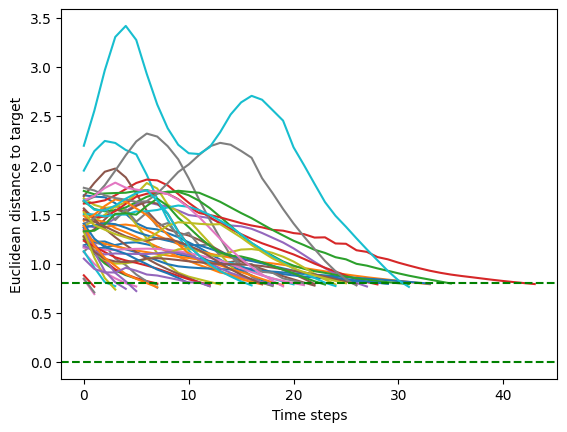

In [11]:
for i in range(50):
    plt.plot(euclids[i])
plt.axhline(y=0.8, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('Euclidean distance to target')
plt.show()

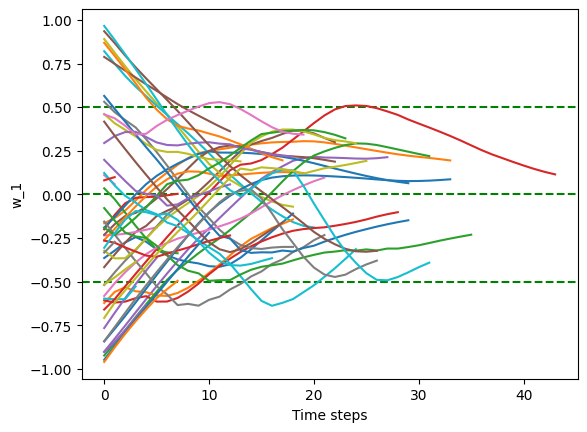

In [12]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims0[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('w_1')
plt.show()

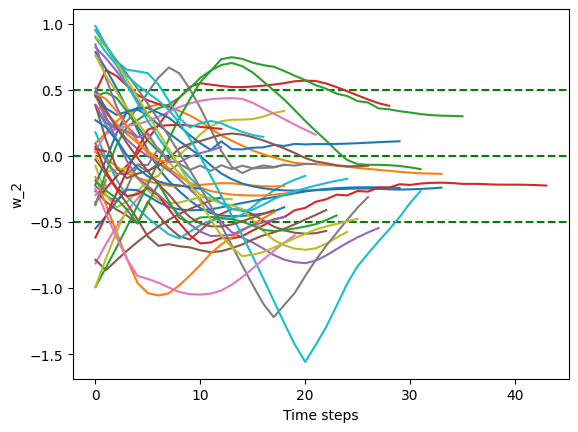

In [13]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims1[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('w_2')
plt.show()

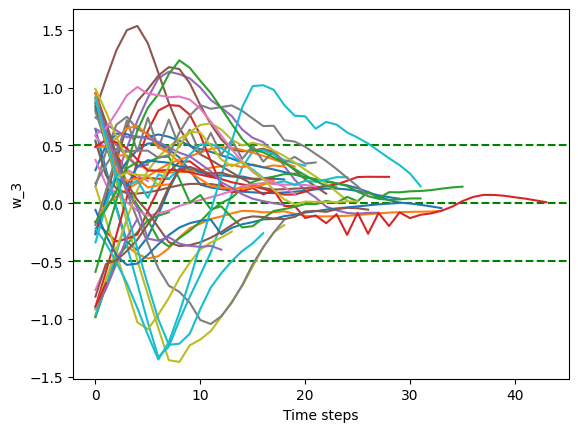

In [14]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims2[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('w_3')
plt.show()

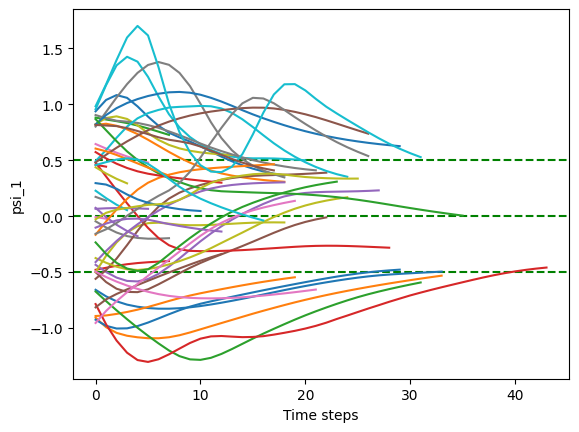

In [15]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims3[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('psi_1')
plt.show()

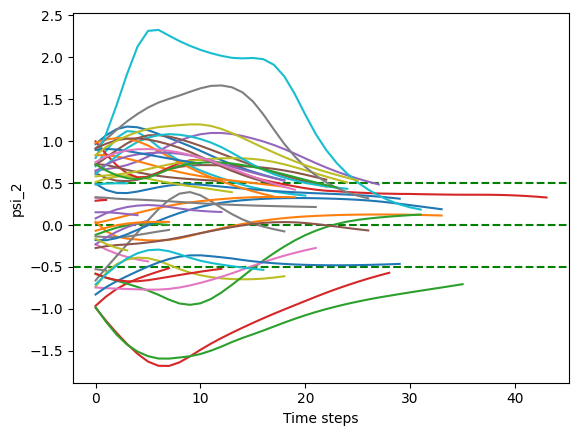

In [16]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims4[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('psi_2')
plt.show()

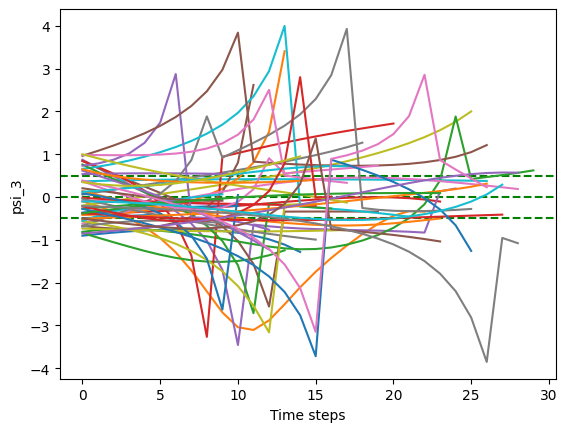

In [57]:
plt.axhline(y=0.5, color='g', linestyle='--')
plt.axhline(y=0, color='g', linestyle='--')
plt.axhline(y=-0.5, color='g', linestyle='--')
for i in range(50):
    plt.plot(dims5[i])
plt.plot()
plt.xlabel('Time steps')
plt.ylabel('psi_3')
plt.show()

In [17]:
plt.plot(reward_history)
plt.xlabel('Episode')
plt.ylabel('Max Overall Reward')
plt.show()

NameError: name 'reward_history' is not defined